In [1]:
import numpy as np
import pandas as pd
import sympy as sp
import matplotlib.pyplot as plt
from numpy.linalg import eigvalsh
from scipy.linalg import expm

In [2]:
# Cell 2: Global config
CFG = {
    # common family settings
    "R": np.sqrt(3.0),
    "gD_default": 0.20,
    "t_default": 0.10,

    # default scan grid for 4-qubit system
    "theta_vals": np.linspace(0.1, np.pi / 2, 20),
    "phi_vals": np.linspace(0.0, np.pi / 2, 20),

    # reproducibility
    "seed_random_product": 42,
    "seed_haar": 42,
}

In [3]:
# Cell 3 — Core math utilities
def partial_trace(rho, keep, dims):
    n = len(dims)
    rho_tensor = rho.reshape(dims + dims)
    trace_out = [i for i in range(n) if i not in keep]
    for sys in sorted(trace_out, reverse=True):
        n_current = len(rho_tensor.shape) // 2
        rho_tensor = np.trace(rho_tensor, axis1=sys, axis2=sys + n_current)
    d_keep = int(np.prod([dims[i] for i in keep]))
    return rho_tensor.reshape(d_keep, d_keep)

def von_neumann_entropy(rho, base=2, tol=1e-12):
    eigvals = eigvalsh(rho)
    eigvals = eigvals[eigvals > tol]
    if len(eigvals) == 0:
        return 0.0
    return float(-np.sum(eigvals * np.log(eigvals) / np.log(base)))

def jordan_product(A, B):
    return 0.5 * (A @ B + B @ A)

def jordan_associator(A, B, C):
    return jordan_product(jordan_product(A, B), C) - jordan_product(A, jordan_product(B, C))

def commutator(A, B):
    return A @ B - B @ A

def to_real_scalar(x, tol=1e-10):
    x = np.real_if_close(x, tol=1000)
    if np.iscomplexobj(x):
        if abs(np.imag(x)) < tol:
            return float(np.real(x))
        raise ValueError(f"Expected nearly real scalar, got {x}")
    return float(x)

def safe_corr(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]
    if len(x) < 3:
        return np.nan
    if np.std(x) < 1e-12 or np.std(y) < 1e-12:
        return np.nan
    return float(np.corrcoef(x, y)[0, 1])

In [4]:
# Cell 4 — Basic operators and tensor helpers
sx = np.array([[0, 1], [1, 0]], dtype=complex)
sy = np.array([[0, -1j], [1j, 0]], dtype=complex)
sz = np.array([[1, 0], [0, -1]], dtype=complex)
I2 = np.eye(2, dtype=complex)

ket0 = np.array([1, 0], dtype=complex)
ket1 = np.array([0, 1], dtype=complex)
ket_plus = (ket0 + ket1) / np.sqrt(2)

def kron_all(op_list):
    out = np.array([[1.0 + 0j]])
    for op in op_list:
        out = np.kron(out, op)
    return out

def embed_two_body(n_qubits, i, j, op_i, op_j):
    ops = [I2] * n_qubits
    ops[i] = op_i
    ops[j] = op_j
    return kron_all(ops)

def xyz_edge_hamiltonian(n_qubits, i, j, Jx, Jy, Jz):
    return (
        Jx * embed_two_body(n_qubits, i, j, sx, sx)
        + Jy * embed_two_body(n_qubits, i, j, sy, sy)
        + Jz * embed_two_body(n_qubits, i, j, sz, sz)
    )

In [5]:
# Cell 5 — Initial state generators
def haar_random_state(dim, rng=None):
    if rng is None:
        rng = np.random.default_rng()
    z = rng.normal(size=dim) + 1j * rng.normal(size=dim)
    z = z / np.linalg.norm(z)
    return z.astype(complex)

def random_single_qubit_state(rng=None):
    if rng is None:
        rng = np.random.default_rng()
    z = rng.normal(size=2) + 1j * rng.normal(size=2)
    z = z / np.linalg.norm(z)
    return z.astype(complex)

def make_initial_state(init_mode="plus", rng=None, custom_state=None):
    if rng is None:
        rng = np.random.default_rng()

    if init_mode == "plus":
        psi0 = kron_all([ket_plus, ket_plus, ket_plus, ket0]).reshape(-1)

    elif init_mode == "random_product":
        psi_A = random_single_qubit_state(rng)
        psi_B = random_single_qubit_state(rng)
        psi_C = random_single_qubit_state(rng)
        psi0 = kron_all([psi_A, psi_B, psi_C, ket0]).reshape(-1)

    elif init_mode == "haar":
        psi0 = haar_random_state(16, rng=rng)

    elif init_mode == "custom":
        if custom_state is None:
            raise ValueError("custom_state must be provided when init_mode='custom'")
        psi0 = np.asarray(custom_state, dtype=complex).reshape(-1)
        psi0 = psi0 / np.linalg.norm(psi0)

    else:
        raise ValueError(f"Unknown init_mode: {init_mode}")

    return psi0

In [6]:
# Cell 6 — Information observables
def mutual_info_2q(rho_2q):
    rho_1 = partial_trace(rho_2q, keep=[0], dims=[2, 2])
    rho_2 = partial_trace(rho_2q, keep=[1], dims=[2, 2])
    return (
        von_neumann_entropy(rho_1)
        + von_neumann_entropy(rho_2)
        - von_neumann_entropy(rho_2q)
    )

def I3_of_rhoABC(rho_ABC):
    rho_A  = partial_trace(rho_ABC, keep=[0], dims=[2, 2, 2])
    rho_B  = partial_trace(rho_ABC, keep=[1], dims=[2, 2, 2])
    rho_C  = partial_trace(rho_ABC, keep=[2], dims=[2, 2, 2])
    rho_AB = partial_trace(rho_ABC, keep=[0, 1], dims=[2, 2, 2])
    rho_AC = partial_trace(rho_ABC, keep=[0, 2], dims=[2, 2, 2])
    rho_BC = partial_trace(rho_ABC, keep=[1, 2], dims=[2, 2, 2])

    I3 = (
        von_neumann_entropy(rho_A)
        + von_neumann_entropy(rho_B)
        + von_neumann_entropy(rho_C)
        - von_neumann_entropy(rho_AB)
        - von_neumann_entropy(rho_AC)
        - von_neumann_entropy(rho_BC)
        + von_neumann_entropy(rho_ABC)
    )
    return to_real_scalar(I3)

In [7]:
# Cell 7 — Entanglement diagnostics
def partial_transpose_density_matrix(rho, dims, subsys):
    if isinstance(subsys, int):
        subsys = [subsys]

    n = len(dims)
    rho_tensor = rho.reshape(list(dims) + list(dims))
    axes = list(range(2 * n))
    for s in subsys:
        axes[s], axes[s + n] = axes[s + n], axes[s]
    rho_pt = np.transpose(rho_tensor, axes)
    return rho_pt.reshape(int(np.prod(dims)), int(np.prod(dims)))

def negativity(rho, dims, pt_subsys=0, tol=1e-12):
    rho_pt = partial_transpose_density_matrix(rho, dims=dims, subsys=pt_subsys)
    rho_pt = 0.5 * (rho_pt + rho_pt.conj().T)
    evals = np.linalg.eigvalsh(rho_pt)
    neg = np.sum(np.abs(evals[evals < -tol]))
    return float(np.real_if_close(neg))

def compute_pairwise_negativity_observables(rho_ABC):
    rho_AB = partial_trace(rho_ABC, keep=[0, 1], dims=[2, 2, 2])
    rho_AC = partial_trace(rho_ABC, keep=[0, 2], dims=[2, 2, 2])
    rho_BC = partial_trace(rho_ABC, keep=[1, 2], dims=[2, 2, 2])

    N_AB = negativity(rho_AB, dims=[2, 2], pt_subsys=0)
    N_AC = negativity(rho_AC, dims=[2, 2], pt_subsys=0)
    N_BC = negativity(rho_BC, dims=[2, 2], pt_subsys=0)
    N_pair_sum = N_AB + N_AC + N_BC

    return {
        "N_AB": N_AB,
        "N_AC": N_AC,
        "N_BC": N_BC,
        "N_pair_sum": N_pair_sum,
    }

def compute_tripartite_negativity_proxy_observables(rho_ABC):
    """
    Defensive / diagnostic only.
    These are bipartition-negativity proxies, not primary higher-order witnesses
    in the current 4-qubit regime.
    """
    N_A_BC = negativity(rho_ABC, dims=[2, 2, 2], pt_subsys=0)
    N_B_AC = negativity(rho_ABC, dims=[2, 2, 2], pt_subsys=1)
    N_C_AB = negativity(rho_ABC, dims=[2, 2, 2], pt_subsys=2)

    N_tri_min = min(N_A_BC, N_B_AC, N_C_AB)
    prod = max(N_A_BC, 0.0) * max(N_B_AC, 0.0) * max(N_C_AB, 0.0)
    N_tri_geom = prod ** (1/3) if prod > 0 else 0.0

    return {
        "N_A_BC": N_A_BC,
        "N_B_AC": N_B_AC,
        "N_C_AB": N_C_AB,
        "N_tri_min": N_tri_min,
        "N_tri_geom": N_tri_geom,
    }

In [8]:
# Cell 8 — Mediator / probe observables
def mediator_metrics(rho_ABC, H_AB_3, H_BC_3, H_AC_3):
    A_AB = jordan_associator(H_BC_3, H_AB_3, H_AC_3)  # mediator = H_AB
    A_BC = jordan_associator(H_AB_3, H_BC_3, H_AC_3)  # mediator = H_BC
    A_AC = jordan_associator(H_AB_3, H_AC_3, H_BC_3)  # mediator = H_AC

    j_AB = np.linalg.norm(A_AB, 'fro')
    j_BC = np.linalg.norm(A_BC, 'fro')
    j_AC = np.linalg.norm(A_AC, 'fro')
    J_tot = np.sqrt(j_AB**2 + j_BC**2 + j_AC**2)

    m_AB = to_real_scalar(np.trace(rho_ABC @ A_AB))
    m_BC = to_real_scalar(np.trace(rho_ABC @ A_BC))
    m_AC = to_real_scalar(np.trace(rho_ABC @ A_AC))
    J_rho_exp = np.sqrt(np.abs(m_AB)**2 + np.abs(m_BC)**2 + np.abs(m_AC)**2)

    eta = J_rho_exp / J_tot if J_tot > 1e-12 else np.nan

    return {
        "A_AB": A_AB,
        "A_BC": A_BC,
        "A_AC": A_AC,
        "j_AB": j_AB,
        "j_BC": j_BC,
        "j_AC": j_AC,
        "J_tot": J_tot,
        "m_AB": m_AB,
        "m_BC": m_BC,
        "m_AC": m_AC,
        "J_rho_exp": J_rho_exp,
        "eta": eta,
    }

In [9]:
# Cell 9 — Family presets and coefficient builder
R = CFG["R"]

shape_AB = np.array([1.00, 0.70, 0.30], dtype=float)
shape_BC = np.array([0.80, 1.00, 0.50], dtype=float)
shape_AC = np.array([0.60, 0.40, 1.00], dtype=float)
shape_CD = np.array([1.00, 0.80, 0.60], dtype=float)

def unit_direction(theta, phi):
    return np.array([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta)
    ], dtype=float)

def normalized_edge_coeffs(theta, phi, shape, R=np.sqrt(3.0), eps=1e-12):
    vec = unit_direction(theta, phi) * shape
    norm = np.linalg.norm(vec)
    if norm < eps:
        raise ValueError("Degenerate coefficient vector; choose different theta/phi.")
    return R * vec / norm

def build_edge_coefficients(theta, phi, gD=0.20, R=np.sqrt(3.0)):
    J_AB = normalized_edge_coeffs(theta, phi, shape_AB, R=R)
    J_BC = normalized_edge_coeffs(theta, phi, shape_BC, R=R)
    J_AC = normalized_edge_coeffs(theta, phi, shape_AC, R=R)
    J_CD = normalized_edge_coeffs(theta, phi, shape_CD, R=gD * R)
    return {
        "J_AB": J_AB,
        "J_BC": J_BC,
        "J_AC": J_AC,
        "J_CD": J_CD,
    }

In [10]:
# Cell 10 — Hamiltonian builders + evolution
def build_hamiltonians_4q(J_AB, J_BC, J_AC, J_CD):
    H_AB_4 = xyz_edge_hamiltonian(4, 0, 1, *J_AB)
    H_BC_4 = xyz_edge_hamiltonian(4, 1, 2, *J_BC)
    H_AC_4 = xyz_edge_hamiltonian(4, 0, 2, *J_AC)
    H_CD_4 = xyz_edge_hamiltonian(4, 2, 3, *J_CD)
    H_tot_4 = H_AB_4 + H_BC_4 + H_AC_4 + H_CD_4
    return {
        "H_AB_4": H_AB_4,
        "H_BC_4": H_BC_4,
        "H_AC_4": H_AC_4,
        "H_CD_4": H_CD_4,
        "H_tot_4": H_tot_4,
    }

def build_hamiltonians_3q(J_AB, J_BC, J_AC):
    H_AB_3 = xyz_edge_hamiltonian(3, 0, 1, *J_AB)
    H_BC_3 = xyz_edge_hamiltonian(3, 1, 2, *J_BC)
    H_AC_3 = xyz_edge_hamiltonian(3, 0, 2, *J_AC)
    return {
        "H_AB_3": H_AB_3,
        "H_BC_3": H_BC_3,
        "H_AC_3": H_AC_3,
    }

def evolve_to_rhoABC(psi0, H_tot_4, t):
    U = expm(-1j * t * H_tot_4)
    psi_t = U @ psi0
    rho4 = np.outer(psi_t, psi_t.conj())
    rho_ABC = partial_trace(rho4, keep=[0, 1, 2], dims=[2, 2, 2, 2])
    return rho_ABC, psi_t

In [11]:
# Cell 11 — Unified observables + main single-run engine
def compute_state_observables(rho_ABC):
    rho_AB = partial_trace(rho_ABC, keep=[0, 1], dims=[2, 2, 2])
    rho_AC = partial_trace(rho_ABC, keep=[0, 2], dims=[2, 2, 2])
    rho_BC = partial_trace(rho_ABC, keep=[1, 2], dims=[2, 2, 2])

    I_AB = mutual_info_2q(rho_AB)
    I_AC = mutual_info_2q(rho_AC)
    I_BC = mutual_info_2q(rho_BC)
    P_pair = I_AB + I_AC + I_BC

    I3 = I3_of_rhoABC(rho_ABC)
    I3_minus = max(0.0, -I3)

    S_ABC = von_neumann_entropy(rho_ABC)
    eigvals = np.sort(np.real_if_close(np.linalg.eigvalsh(rho_ABC)))[::-1]

    ent_pair = compute_pairwise_negativity_observables(rho_ABC)
    ent_tri_proxy = compute_tripartite_negativity_proxy_observables(rho_ABC)

    return {
        "rho_AB": rho_AB,
        "rho_AC": rho_AC,
        "rho_BC": rho_BC,
        "I_AB": I_AB,
        "I_AC": I_AC,
        "I_BC": I_BC,
        "P_pair": P_pair,
        "I3": I3,
        "I3_minus": I3_minus,
        "S_ABC": S_ABC,
        "eigvals": eigvals,
        **ent_pair,
        **ent_tri_proxy,
    }

def run_fixed_norm_case(
    theta,
    phi,
    gD=0.20,
    t=0.10,
    init_mode="plus",
    rng=None,
    custom_state=None,
    verbose=False,
):
    psi0 = make_initial_state(init_mode=init_mode, rng=rng, custom_state=custom_state)

    coeffs = build_edge_coefficients(theta, phi, gD=gD, R=R)
    J_AB, J_BC, J_AC, J_CD = coeffs["J_AB"], coeffs["J_BC"], coeffs["J_AC"], coeffs["J_CD"]

    H4 = build_hamiltonians_4q(J_AB, J_BC, J_AC, J_CD)
    H3 = build_hamiltonians_3q(J_AB, J_BC, J_AC)

    rho_ABC, psi_t = evolve_to_rhoABC(psi0, H4["H_tot_4"], t)

    obs_state = compute_state_observables(rho_ABC)
    obs_probe = mediator_metrics(rho_ABC, H3["H_AB_3"], H3["H_BC_3"], H3["H_AC_3"])

    out = {
        "theta": theta,
        "phi": phi,
        "gD": gD,
        "t": t,
        "init_mode": init_mode,
        "psi0": psi0,
        "psi_t": psi_t,
        "rho_ABC": rho_ABC,
        "J_AB": J_AB,
        "J_BC": J_BC,
        "J_AC": J_AC,
        "J_CD": J_CD,
        **obs_state,
        **obs_probe,
    }

    if verbose:
        print(
            f"theta={theta:.3f}, phi={phi:.3f}, "
            f"I3_minus={out['I3_minus']:.6f}, "
            f"J_rho_exp={out['J_rho_exp']:.6f}, "
            f"eta={out['eta']:.6f}, "
            f"P_pair={out['P_pair']:.6f}, "
            f"N_pair_sum={out['N_pair_sum']:.6f}, "
            f"N_tri_geom={out['N_tri_geom']:.6f}"
        )

    return out

Experiment Phase 1: 4-qubit experiments

In [12]:
# Cell 12 — Scan + summary helpers
def scan_fixed_norm(
    theta_vals,
    phi_vals,
    gD=0.20,
    t=0.10,
    init_mode="plus",
    rng_seed=None,
    custom_state=None,
    verbose_every=0,
):
    results = []
    counter = 0
    rng = np.random.default_rng(rng_seed)

    for th in theta_vals:
        for ph in phi_vals:
            counter += 1
            verbose = (verbose_every > 0 and counter % verbose_every == 0)

            try:
                res = run_fixed_norm_case(
                    th, ph,
                    gD=gD,
                    t=t,
                    init_mode=init_mode,
                    rng=rng,
                    custom_state=custom_state,
                    verbose=verbose,
                )
                results.append(res)
            except ValueError:
                continue

    return results

def summarize_scan_numeric(results, target_key="I3_minus"):
    if len(results) == 0:
        return {
            "N": 0,
            "corr_J_rho_exp": np.nan,
            "corr_J_tot": np.nan,
            "corr_eta": np.nan,
            "corr_P_pair": np.nan,
            "corr_N_pair_sum": np.nan,
            "target_max": np.nan,
            "target_mean": np.nan,
        }

    target = np.array([r[target_key] for r in results], dtype=float)
    Jr = np.array([r["J_rho_exp"] for r in results], dtype=float)
    Jt = np.array([r["J_tot"] for r in results], dtype=float)
    Eta = np.array([r["eta"] for r in results], dtype=float)
    Pp = np.array([r["P_pair"] for r in results], dtype=float)
    Nps = np.array([r["N_pair_sum"] for r in results], dtype=float)

    return {
        "N": len(results),
        "corr_J_rho_exp": safe_corr(Jr, target),
        "corr_J_tot": safe_corr(Jt, target),
        "corr_eta": safe_corr(Eta, target),
        "corr_P_pair": safe_corr(Pp, target),
        "corr_N_pair_sum": safe_corr(Nps, target),
        "target_max": float(np.nanmax(target)),
        "target_mean": float(np.nanmean(target)),
    }

def summarize_scan(results, target_key="I3_minus", top_k=8):
    if len(results) == 0:
        print("No results.")
        return

    target = np.array([r[target_key] for r in results], dtype=float)
    Jr = np.array([r["J_rho_exp"] for r in results], dtype=float)
    Jt = np.array([r["J_tot"] for r in results], dtype=float)
    Eta = np.array([r["eta"] for r in results], dtype=float)
    Pp = np.array([r["P_pair"] for r in results], dtype=float)
    Nps = np.array([r["N_pair_sum"] for r in results], dtype=float)

    print(f"\n=== Scan summary (target = {target_key}) ===")
    print(f"N = {len(results)}")
    print(f"Pearson corr(J_rho_exp, {target_key}) = {safe_corr(Jr, target):.6f}")
    print(f"Pearson corr(J_tot,     {target_key}) = {safe_corr(Jt, target):.6f}")
    print(f"Pearson corr(eta,       {target_key}) = {safe_corr(Eta, target):.6f}")
    print(f"Pearson corr(P_pair,    {target_key}) = {safe_corr(Pp, target):.6f}")
    print(f"Pearson corr(N_pair_sum,{target_key}) = {safe_corr(Nps, target):.6f}")

    idx = np.argsort(-target)[:top_k]
    print(f"\nTop {top_k} points by {target_key}:")
    for k in idx:
        r = results[k]
        print(
            f"theta={r['theta']:.3f}, phi={r['phi']:.3f}, "
            f"{target_key}={r[target_key]:.6f}, "
            f"J_rho_exp={r['J_rho_exp']:.6f}, "
            f"J_tot={r['J_tot']:.6f}, "
            f"eta={r['eta']:.6f}, "
            f"P_pair={r['P_pair']:.6f}, "
            f"N_pair_sum={r['N_pair_sum']:.6f}"
        )

def summarize_trip_proxy_diagnostics(results, top_k=8):
    for ent_key in ["N_tri_geom", "N_tri_min"]:
        summarize_scan(results, target_key=ent_key, top_k=top_k)

def scan_over_time(
    theta_vals,
    phi_vals,
    t_vals,
    gD=0.20,
    init_mode="plus",
    rng_seed=None,
    custom_state=None,
    target_key="I3_minus",
):
    all_summaries = []
    for t in t_vals:
        results_t = scan_fixed_norm(
            theta_vals,
            phi_vals,
            gD=gD,
            t=t,
            init_mode=init_mode,
            rng_seed=rng_seed,
            custom_state=custom_state,
        )
        summary_t = summarize_scan_numeric(results_t, target_key=target_key)
        summary_t["t"] = t
        all_summaries.append(summary_t)
    return all_summaries

In [13]:
# Cell 13 — Parameter presets + fixed states
theta_vals = CFG["theta_vals"]
phi_vals = CFG["phi_vals"]

gD_default = CFG["gD_default"]
t_default = CFG["t_default"]

rng_rp = np.random.default_rng(CFG["seed_random_product"])
psi0_random_product_fixed = make_initial_state(init_mode="random_product", rng=rng_rp)

rng_haar = np.random.default_rng(CFG["seed_haar"])
psi0_haar_fixed = make_initial_state(init_mode="haar", rng=rng_haar)

psi0_plus = make_initial_state(init_mode="plus")

In [14]:
# Cell 14 — 4-qubit main experiment A: plus, short-time
results_plus_t01 = scan_fixed_norm(
    theta_vals,
    phi_vals,
    gD=gD_default,
    t=t_default,
    init_mode="plus",
)

print("----- Main summary: target = I3_minus -----")
summarize_scan(results_plus_t01, target_key="I3_minus", top_k=8)

print("\n----- Defensive summary: tripartite negativity proxies -----")
summarize_trip_proxy_diagnostics(results_plus_t01, top_k=8)

----- Main summary: target = I3_minus -----

=== Scan summary (target = I3_minus) ===
N = 400
Pearson corr(J_rho_exp, I3_minus) = 0.808442
Pearson corr(J_tot,     I3_minus) = 0.021477
Pearson corr(eta,       I3_minus) = 0.774692
Pearson corr(P_pair,    I3_minus) = 0.217473
Pearson corr(N_pair_sum,I3_minus) = 0.263021

Top 8 points by I3_minus:
theta=1.261, phi=1.571, I3_minus=0.003507, J_rho_exp=2.793624, J_tot=14.363786, eta=0.194491, P_pair=0.537814, N_pair_sum=0.272958
theta=1.184, phi=1.571, I3_minus=0.003487, J_rho_exp=3.022546, J_tot=16.651461, eta=0.181518, P_pair=0.486946, N_pair_sum=0.254177
theta=1.261, phi=1.488, I3_minus=0.003430, J_rho_exp=2.809099, J_tot=14.546059, eta=0.193118, P_pair=0.534703, N_pair_sum=0.272039
theta=1.184, phi=1.488, I3_minus=0.003422, J_rho_exp=3.036369, J_tot=16.711357, eta=0.181695, P_pair=0.483793, N_pair_sum=0.253252
theta=1.184, phi=1.405, I3_minus=0.003270, J_rho_exp=2.992101, J_tot=17.006858, eta=0.175935, P_pair=0.472623, N_pair_sum=0.250087

In [15]:
# Cell 15 — 4-qubit main experiment B: fixed random product, short-time
results_rp_fixed_t01 = scan_fixed_norm(
    theta_vals,
    phi_vals,
    gD=gD_default,
    t=t_default,
    init_mode="custom",
    custom_state=psi0_random_product_fixed,
)

print("----- Main summary: target = I3_minus -----")
summarize_scan(results_rp_fixed_t01, target_key="I3_minus", top_k=8)

print("\n----- Defensive summary: tripartite negativity proxies -----")
summarize_trip_proxy_diagnostics(results_rp_fixed_t01, top_k=8)

----- Main summary: target = I3_minus -----

=== Scan summary (target = I3_minus) ===
N = 400
Pearson corr(J_rho_exp, I3_minus) = 0.382886
Pearson corr(J_tot,     I3_minus) = 0.079847
Pearson corr(eta,       I3_minus) = 0.424907
Pearson corr(P_pair,    I3_minus) = -0.685991
Pearson corr(N_pair_sum,I3_minus) = -0.741941

Top 8 points by I3_minus:
theta=1.261, phi=0.992, I3_minus=0.001915, J_rho_exp=1.474184, J_tot=21.862061, eta=0.067431, P_pair=0.226706, N_pair_sum=0.158521
theta=1.261, phi=0.909, I3_minus=0.001905, J_rho_exp=1.631689, J_tot=22.383821, eta=0.072896, P_pair=0.217338, N_pair_sum=0.158690
theta=1.339, phi=1.075, I3_minus=0.001884, J_rho_exp=1.246268, J_tot=21.401521, eta=0.058233, P_pair=0.259436, N_pair_sum=0.179986
theta=1.339, phi=1.157, I3_minus=0.001856, J_rho_exp=1.105127, J_tot=19.610705, eta=0.056353, P_pair=0.267426, N_pair_sum=0.178590
theta=1.261, phi=1.075, I3_minus=0.001844, J_rho_exp=1.306284, J_tot=20.870975, eta=0.062589, P_pair=0.238097, N_pair_sum=0.1625

In [16]:
# Cell 16 — 4-qubit time scan: plus
t_vals_main = [0.05, 0.10, 0.15, 0.20, 0.30, 0.50, 1.00]

time_summaries_plus = scan_over_time(
    theta_vals,
    phi_vals,
    t_vals_main,
    gD=gD_default,
    init_mode="plus",
    target_key="I3_minus",
)

for row in time_summaries_plus:
    print(
        f"t={row['t']:.2f} | "
        f"corr(J_rho_exp, I3-)={row['corr_J_rho_exp']:.4f} | "
        f"corr(J_tot, I3-)={row['corr_J_tot']:.4f} | "
        f"corr(eta, I3-)={row['corr_eta']:.4f} | "
        f"corr(P_pair, I3-)={row['corr_P_pair']:.4f} | "
        f"corr(N_pair_sum, I3-)={row['corr_N_pair_sum']:.4f} | "
        f"max(I3-)={row['target_max']:.4f}"
    )

t=0.05 | corr(J_rho_exp, I3-)=0.8027 | corr(J_tot, I3-)=0.0191 | corr(eta, I3-)=0.7612 | corr(P_pair, I3-)=0.2056 | corr(N_pair_sum, I3-)=0.2384 | max(I3-)=0.0008
t=0.10 | corr(J_rho_exp, I3-)=0.8084 | corr(J_tot, I3-)=0.0215 | corr(eta, I3-)=0.7747 | corr(P_pair, I3-)=0.2175 | corr(N_pair_sum, I3-)=0.2630 | max(I3-)=0.0035
t=0.15 | corr(J_rho_exp, I3-)=0.7764 | corr(J_tot, I3-)=0.0202 | corr(eta, I3-)=0.7733 | corr(P_pair, I3-)=0.2333 | corr(N_pair_sum, I3-)=0.2958 | max(I3-)=0.0089
t=0.20 | corr(J_rho_exp, I3-)=0.6689 | corr(J_tot, I3-)=0.0134 | corr(eta, I3-)=0.7177 | corr(P_pair, I3-)=0.2505 | corr(N_pair_sum, I3-)=0.3293 | max(I3-)=0.0183
t=0.30 | corr(J_rho_exp, I3-)=0.3458 | corr(J_tot, I3-)=-0.0096 | corr(eta, I3-)=0.3925 | corr(P_pair, I3-)=0.2774 | corr(N_pair_sum, I3-)=0.2899 | max(I3-)=0.0556
t=0.50 | corr(J_rho_exp, I3-)=0.2593 | corr(J_tot, I3-)=-0.0063 | corr(eta, I3-)=0.2159 | corr(P_pair, I3-)=0.2767 | corr(N_pair_sum, I3-)=-0.1558 | max(I3-)=0.1913
t=1.00 | corr(J_rho

In [17]:
# Cell 17 — 4-qubit time scan: fixed random product
time_summaries_rp_fixed = scan_over_time(
    theta_vals,
    phi_vals,
    t_vals_main,
    gD=gD_default,
    init_mode="custom",
    custom_state=psi0_random_product_fixed,
    target_key="I3_minus",
)

for row in time_summaries_rp_fixed:
    print(
        f"t={row['t']:.2f} | "
        f"corr(J_rho_exp, I3-)={row['corr_J_rho_exp']:.4f} | "
        f"corr(J_tot, I3-)={row['corr_J_tot']:.4f} | "
        f"corr(eta, I3-)={row['corr_eta']:.4f} | "
        f"corr(P_pair, I3-)={row['corr_P_pair']:.4f} | "
        f"corr(N_pair_sum, I3-)={row['corr_N_pair_sum']:.4f} | "
        f"max(I3-)={row['target_max']:.4f}"
    )

t=0.05 | corr(J_rho_exp, I3-)=0.4328 | corr(J_tot, I3-)=0.1899 | corr(eta, I3-)=0.4075 | corr(P_pair, I3-)=-0.5755 | corr(N_pair_sum, I3-)=-0.6023 | max(I3-)=0.0005
t=0.10 | corr(J_rho_exp, I3-)=0.3829 | corr(J_tot, I3-)=0.0798 | corr(eta, I3-)=0.4249 | corr(P_pair, I3-)=-0.6860 | corr(N_pair_sum, I3-)=-0.7419 | max(I3-)=0.0019
t=0.15 | corr(J_rho_exp, I3-)=0.4569 | corr(J_tot, I3-)=-0.0464 | corr(eta, I3-)=0.5475 | corr(P_pair, I3-)=-0.6867 | corr(N_pair_sum, I3-)=-0.7694 | max(I3-)=0.0039
t=0.20 | corr(J_rho_exp, I3-)=0.5624 | corr(J_tot, I3-)=-0.1283 | corr(eta, I3-)=0.6677 | corr(P_pair, I3-)=-0.6011 | corr(N_pair_sum, I3-)=-0.7001 | max(I3-)=0.0073
t=0.30 | corr(J_rho_exp, I3-)=0.5492 | corr(J_tot, I3-)=-0.0461 | corr(eta, I3-)=0.5923 | corr(P_pair, I3-)=-0.5049 | corr(N_pair_sum, I3-)=-0.6203 | max(I3-)=0.0208
t=0.50 | corr(J_rho_exp, I3-)=0.2018 | corr(J_tot, I3-)=0.3955 | corr(eta, I3-)=0.0497 | corr(P_pair, I3-)=-0.3039 | corr(N_pair_sum, I3-)=0.2144 | max(I3-)=0.0830
t=1.00 |

In [18]:
# Cell 18 — 4-qubit Haar control
results_haar_fixed_t01 = scan_fixed_norm(
    theta_vals,
    phi_vals,
    gD=gD_default,
    t=t_default,
    init_mode="custom",
    custom_state=psi0_haar_fixed,
)

print("----- Main summary: target = I3_minus -----")
summarize_scan(results_haar_fixed_t01, target_key="I3_minus", top_k=8)

print("\n----- Defensive summary: tripartite negativity proxies -----")
summarize_trip_proxy_diagnostics(results_haar_fixed_t01, top_k=8)

----- Main summary: target = I3_minus -----

=== Scan summary (target = I3_minus) ===
N = 400
Pearson corr(J_rho_exp, I3_minus) = -0.091665
Pearson corr(J_tot,     I3_minus) = 0.084456
Pearson corr(eta,       I3_minus) = -0.180550
Pearson corr(P_pair,    I3_minus) = -0.641887
Pearson corr(N_pair_sum,I3_minus) = -0.539068

Top 8 points by I3_minus:
theta=1.571, phi=1.157, I3_minus=0.698101, J_rho_exp=1.739839, J_tot=20.063373, eta=0.086717, P_pair=1.139625, N_pair_sum=0.141562
theta=1.571, phi=1.240, I3_minus=0.698063, J_rho_exp=1.507859, J_tot=16.773089, eta=0.089897, P_pair=1.137729, N_pair_sum=0.140453
theta=1.571, phi=1.075, I3_minus=0.696102, J_rho_exp=1.885885, J_tot=22.547061, eta=0.083642, P_pair=1.141907, N_pair_sum=0.143069
theta=1.571, phi=1.323, I3_minus=0.695637, J_rho_exp=1.195196, J_tot=12.831163, eta=0.093148, P_pair=1.136013, N_pair_sum=0.139773
theta=1.571, phi=0.992, I3_minus=0.692526, J_rho_exp=1.949155, J_tot=24.159642, eta=0.080678, P_pair=1.144669, N_pair_sum=0.14

State scan

In [19]:
# Cell 1 — State scan helpers (4Q, same-state multi-time scan)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr


def sample_random_product_states_4q(n_states, seed=1234):
    rng = np.random.default_rng(seed)
    states = []
    for k in range(n_states):
        psi0 = make_initial_state(init_mode="random_product", rng=rng)
        states.append({"state_id": k, "psi0": psi0})
    return states


def evaluate_one_state_scan_4q(
    psi0,
    theta_vals,
    phi_vals,
    gD=0.20,
    t=0.10,
    verbose_every=0,
):
    results = scan_fixed_norm(
        theta_vals=theta_vals,
        phi_vals=phi_vals,
        gD=gD,
        t=t,
        init_mode="custom",
        custom_state=psi0,
        rng_seed=None,
        verbose_every=verbose_every,
    )
    summary = summarize_scan_numeric(results, target_key="I3_minus")
    return results, summary


def safe_spearman(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = np.isfinite(x) & np.isfinite(y)
    if mask.sum() < 3:
        return np.nan
    x = x[mask]
    y = y[mask]
    if np.allclose(x, x[0]) or np.allclose(y, y[0]):
        return np.nan
    return spearmanr(x, y).statistic


def safe_corr(x, y, method="pearson"):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = np.isfinite(x) & np.isfinite(y)
    if mask.sum() < 3:
        return np.nan
    x = x[mask]
    y = y[mask]
    if np.allclose(x, x[0]) or np.allclose(y, y[0]):
        return np.nan
    return pd.Series(x).corr(pd.Series(y), method=method)


def summarize_one_state_scan_for_table(state_id, t, summary, results):
    """
    Flatten one-state summary into one row.
    Pearson comes from summary; Spearman is computed directly from pointwise results.
    """
    i3_vals    = np.array([r["I3_minus"]    for r in results], dtype=float)
    jrho_vals  = np.array([r["J_rho_exp"]   for r in results], dtype=float)
    jtot_vals  = np.array([r["J_tot"]       for r in results], dtype=float)
    eta_vals   = np.array([r["eta"]         for r in results], dtype=float)
    pp_vals    = np.array([r["P_pair"]      for r in results], dtype=float)
    npair_vals = np.array([r["N_pair_sum"]  for r in results], dtype=float)

    return {
        "state_id":          state_id,
        "t":                 float(t),
        "N_points":          summary["N"],

        # Pearson
        "r_J_rho_exp_I3":    summary["corr_J_rho_exp"],
        "r_J_tot_I3":        summary["corr_J_tot"],
        "r_eta_I3":          summary["corr_eta"],
        "r_P_pair_I3":       summary["corr_P_pair"],
        "r_N_pair_sum_I3":   summary["corr_N_pair_sum"],

        # Spearman
        "rho_J_rho_exp_I3":  safe_spearman(jrho_vals,  i3_vals),
        "rho_J_tot_I3":      safe_spearman(jtot_vals,  i3_vals),
        "rho_eta_I3":        safe_spearman(eta_vals,   i3_vals),
        "rho_P_pair_I3":     safe_spearman(pp_vals,    i3_vals),
        "rho_N_pair_sum_I3": safe_spearman(npair_vals, i3_vals),

        # I3 signal strength
        "I3_max":            summary["target_max"],
        "I3_mean":           summary["target_mean"],
    }


def run_fixed_states_over_times_4q(
    states,
    t_vals,
    theta_vals,
    phi_vals,
    gD=0.20,
    verbose_state=True,
    verbose_every_scan=0,
):
    """
    Re-scan the SAME sampled initial states over multiple times.
    Returns:
      - df_long : one row per (state_id, t)
      - all_results : dict[(state_id, t)] -> full scan results
    """
    rows = []
    all_results = {}

    for tv in t_vals:
        print(f"\n=== scanning same initial-state ensemble at t = {tv:.2f} ===")

        for item in states:
            sid  = item["state_id"]
            psi0 = item["psi0"].copy()

            results, summary = evaluate_one_state_scan_4q(
                psi0=psi0,
                theta_vals=theta_vals,
                phi_vals=phi_vals,
                gD=gD,
                t=tv,
                verbose_every=verbose_every_scan,
            )

            row = summarize_one_state_scan_for_table(sid, tv, summary, results)
            rows.append(row)
            all_results[(sid, float(tv))] = results

            if verbose_state:
                print(
                    f"[t={tv:.2f} | state {sid:03d}] "
                    f"r(J_rho_exp)={row['r_J_rho_exp_I3']:+.4f} | "
                    f"rho(J_rho_exp)={row['rho_J_rho_exp_I3']:+.4f} | "
                    f"r(J_tot)={row['r_J_tot_I3']:+.4f} | "
                    f"r(P_pair)={row['r_P_pair_I3']:+.4f} | "
                    f"I3_max={row['I3_max']:.4f}"
                )

    df_long = pd.DataFrame(rows).sort_values(["state_id", "t"]).reset_index(drop=True)
    return df_long, all_results


def summarize_time_scan_ensemble_4q(df_long):
    """
    Per-time-slice summary across sampled initial states.
    Includes:
      - median / q25 / q75 for main Pearson and Spearman metrics
      - abs-strength fractions
      - signed median margins
      - I3 strength summaries
    """
    rows = []

    for tv in sorted(df_long["t"].unique()):
        sub = df_long[df_long["t"] == tv].copy()

        row = {
            "t":        tv,
            "N_states": len(sub),

            # Pearson summaries
            "median_r_Jrho":       sub["r_J_rho_exp_I3"].median(),
            "q25_r_Jrho":          sub["r_J_rho_exp_I3"].quantile(0.25),
            "q75_r_Jrho":          sub["r_J_rho_exp_I3"].quantile(0.75),

            "median_r_Jtot":       sub["r_J_tot_I3"].median(),
            "q25_r_Jtot":          sub["r_J_tot_I3"].quantile(0.25),
            "q75_r_Jtot":          sub["r_J_tot_I3"].quantile(0.75),

            "median_r_eta":        sub["r_eta_I3"].median(),
            "q25_r_eta":           sub["r_eta_I3"].quantile(0.25),
            "q75_r_eta":           sub["r_eta_I3"].quantile(0.75),

            "median_r_Ppair":      sub["r_P_pair_I3"].median(),
            "q25_r_Ppair":         sub["r_P_pair_I3"].quantile(0.25),
            "q75_r_Ppair":         sub["r_P_pair_I3"].quantile(0.75),

            "median_r_Npairsum":   sub["r_N_pair_sum_I3"].median(),
            "q25_r_Npairsum":      sub["r_N_pair_sum_I3"].quantile(0.25),
            "q75_r_Npairsum":      sub["r_N_pair_sum_I3"].quantile(0.75),

            # Spearman summaries
            "median_rho_Jrho":     sub["rho_J_rho_exp_I3"].median(),
            "q25_rho_Jrho":        sub["rho_J_rho_exp_I3"].quantile(0.25),
            "q75_rho_Jrho":        sub["rho_J_rho_exp_I3"].quantile(0.75),

            "median_rho_Jtot":     sub["rho_J_tot_I3"].median(),
            "q25_rho_Jtot":        sub["rho_J_tot_I3"].quantile(0.25),
            "q75_rho_Jtot":        sub["rho_J_tot_I3"].quantile(0.75),

            "median_rho_eta":      sub["rho_eta_I3"].median(),
            "q25_rho_eta":         sub["rho_eta_I3"].quantile(0.25),
            "q75_rho_eta":         sub["rho_eta_I3"].quantile(0.75),

            "median_rho_Ppair":    sub["rho_P_pair_I3"].median(),
            "q25_rho_Ppair":       sub["rho_P_pair_I3"].quantile(0.25),
            "q75_rho_Ppair":       sub["rho_P_pair_I3"].quantile(0.75),

            "median_rho_Npairsum": sub["rho_N_pair_sum_I3"].median(),
            "q25_rho_Npairsum":    sub["rho_N_pair_sum_I3"].quantile(0.25),
            "q75_rho_Npairsum":    sub["rho_N_pair_sum_I3"].quantile(0.75),

            # Abs-strength fraction statistics
            "frac_abs_Jrho_gt_Jtot":   (sub["r_J_rho_exp_I3"].abs() > sub["r_J_tot_I3"].abs()).mean(),
            "frac_abs_Jrho_gt_eta":    (sub["r_J_rho_exp_I3"].abs() > sub["r_eta_I3"].abs()).mean(),
            "frac_abs_Jrho_gt_Ppair":  (sub["r_J_rho_exp_I3"].abs() > sub["r_P_pair_I3"].abs()).mean(),
            "frac_abs_Jrho_gt_Npair":  (sub["r_J_rho_exp_I3"].abs() > sub["r_N_pair_sum_I3"].abs()).mean(),

            # Signed median margins
            "median_margin_Jrho_minus_Jtot":   (sub["r_J_rho_exp_I3"] - sub["r_J_tot_I3"]).median(),
            "median_margin_Jrho_minus_eta":    (sub["r_J_rho_exp_I3"] - sub["r_eta_I3"]).median(),
            "median_margin_Jrho_minus_Ppair":  (sub["r_J_rho_exp_I3"] - sub["r_P_pair_I3"]).median(),
            "median_margin_Jrho_minus_Npair":  (sub["r_J_rho_exp_I3"] - sub["r_N_pair_sum_I3"]).median(),

            # I3 signal strength
            "median_I3_max":   sub["I3_max"].median(),
            "q25_I3_max":      sub["I3_max"].quantile(0.25),
            "q75_I3_max":      sub["I3_max"].quantile(0.75),
            "mean_I3_max":     sub["I3_max"].mean(),

            "median_I3_mean":  sub["I3_mean"].median(),
            "q25_I3_mean":     sub["I3_mean"].quantile(0.25),
            "q75_I3_mean":     sub["I3_mean"].quantile(0.75),
            "mean_I3_mean":    sub["I3_mean"].mean(),
        }

        rows.append(row)

    return pd.DataFrame(rows)


def build_trend_vs_I3max_by_time(df_long):
    """
    For each time slice, test whether larger I3_max predicts
    stronger within-state correlation quality across initial states.
    Includes both Pearson-based and Spearman-based per-state quality metrics.
    """
    trend_rows = []

    metric_cols = [
        "r_J_rho_exp_I3",
        "r_J_tot_I3",
        "r_eta_I3",
        "r_P_pair_I3",
        "r_N_pair_sum_I3",
        "rho_J_rho_exp_I3",
        "rho_J_tot_I3",
        "rho_eta_I3",
        "rho_P_pair_I3",
        "rho_N_pair_sum_I3",
    ]

    for tv in sorted(df_long["t"].unique()):
        sub = df_long[df_long["t"] == tv].copy()

        for col in metric_cols:
            pear  = safe_corr(sub["I3_max"], sub[col], method="pearson")
            spear = safe_corr(sub["I3_max"], sub[col], method="spearman")

            trend_rows.append({
                "t": tv,
                "metric": col,
                "pearson_with_I3max":  pear,
                "spearman_with_I3max": spear,
            })

    return (
        pd.DataFrame(trend_rows)
        .sort_values(["t", "pearson_with_I3max"], ascending=[True, False])
        .reset_index(drop=True)
    )

In [20]:
# Cell 2 — Main state-scan experiment

state_scan_n_states = 50
state_scan_seed     = 2027
state_scan_t_vals   = [0.10, 0.15, 0.20, 0.25, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 1.00]
state_scan_gD       = gD_default

state_scan_states = sample_random_product_states_4q(
    n_states=state_scan_n_states,
    seed=state_scan_seed,
)

state_time_scan_df, state_time_scan_all_results = run_fixed_states_over_times_4q(
    states=state_scan_states,
    t_vals=state_scan_t_vals,
    theta_vals=theta_vals,
    phi_vals=phi_vals,
    gD=state_scan_gD,
    verbose_state=True,
    verbose_every_scan=0,
)

state_time_scan_df


=== scanning same initial-state ensemble at t = 0.10 ===
[t=0.10 | state 000] r(J_rho_exp)=+0.5244 | rho(J_rho_exp)=+0.5583 | r(J_tot)=+0.3909 | r(P_pair)=-0.8134 | I3_max=0.0028
[t=0.10 | state 001] r(J_rho_exp)=+0.6701 | rho(J_rho_exp)=+0.7215 | r(J_tot)=+0.0563 | r(P_pair)=+0.6170 | I3_max=0.0038
[t=0.10 | state 002] r(J_rho_exp)=-0.0833 | rho(J_rho_exp)=-0.0613 | r(J_tot)=+0.0860 | r(P_pair)=+0.1789 | I3_max=0.0011
[t=0.10 | state 003] r(J_rho_exp)=+0.5915 | rho(J_rho_exp)=+0.6329 | r(J_tot)=+0.2668 | r(P_pair)=+0.5795 | I3_max=0.0029
[t=0.10 | state 004] r(J_rho_exp)=-0.2097 | rho(J_rho_exp)=-0.3321 | r(J_tot)=-0.0491 | r(P_pair)=-0.0558 | I3_max=0.0010
[t=0.10 | state 005] r(J_rho_exp)=+0.0353 | rho(J_rho_exp)=+0.0249 | r(J_tot)=+0.4785 | r(P_pair)=-0.4907 | I3_max=0.0020
[t=0.10 | state 006] r(J_rho_exp)=+0.0112 | rho(J_rho_exp)=+0.1217 | r(J_tot)=+0.3914 | r(P_pair)=+0.1988 | I3_max=0.0031
[t=0.10 | state 007] r(J_rho_exp)=-0.5425 | rho(J_rho_exp)=-0.8081 | r(J_tot)=-0.0075 | 

,state_id,t,N_points,r_J_rho_exp_I3,r_J_tot_I3,r_eta_I3,r_P_pair_I3,r_N_pair_sum_I3,rho_J_rho_exp_I3,rho_J_tot_I3,rho_eta_I3,rho_P_pair_I3,rho_N_pair_sum_I3,I3_max,I3_mean
0,0,0.10,400,0.524364,0.390925,0.422386,-0.813391,-0.853756,0.558263,0.363577,0.451184,-0.832334,-0.833625,0.002761,0.001229
1,0,0.15,400,0.493279,0.349380,0.410472,-0.718490,-0.748451,0.416346,0.327316,0.322191,-0.758054,-0.738188,0.006805,0.002815
2,0,0.20,400,0.486916,0.298762,0.426422,-0.606761,-0.609410,0.318235,0.286055,0.224769,-0.676180,-0.627761,0.013953,0.005367
3,0,0.25,400,0.462604,0.244498,0.428395,-0.490205,-0.477681,0.259232,0.231954,0.191719,-0.577343,-0.515068,0.025263,0.009156
4,0,0.30,400,0.357540,0.206401,0.346014,-0.401036,-0.438476,0.196989,0.190156,0.127839,-0.466632,-0.419435,0.041003,0.014191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545,49,0.50,400,0.112615,0.228702,-0.148444,-0.115623,0.104376,0.119454,0.179691,-0.114573,-0.139303,0.088328,0.080714,0.038043
546,49,0.60,400,0.273166,0.295592,0.170960,0.043412,0.298327,0.294424,0.241999,0.238397,-0.043743,0.341950,0.150762,0.053818
547,49,0.70,400,-0.010463,0.325722,-0.151613,0.140634,0.059216,0.064226,0.329489,-0.013309,0.140005,0.066910,0.199227,0.059959
548,49,0.80,400,-0.021673,0.424365,-0.223344,0.185663,-0.093769,0.019516,0.438214,-0.235551,0.212123,-0.120962,0.189806,0.064991


In [21]:
state_time_scan_df.to_csv("state_time_scan.csv", index=True)

In [22]:
# Cell 3 — Core summary tables

time_scan_summary_df = summarize_time_scan_ensemble_4q(state_time_scan_df)
trend_by_time_df = build_trend_vs_I3max_by_time(state_time_scan_df)

print("=== time_scan_summary_df ===")
display(time_scan_summary_df)

print("\n=== trend_by_time_df ===")
display(trend_by_time_df)

trend_by_time_df.to_csv("trend_by_time.csv", index=True)

=== time_scan_summary_df ===


,t,N_states,median_r_Jrho,q25_r_Jrho,q75_r_Jrho,median_r_Jtot,q25_r_Jtot,q75_r_Jtot,median_r_eta,q25_r_eta,...,median_margin_Jrho_minus_Ppair,median_margin_Jrho_minus_Npair,median_I3_max,q25_I3_max,q75_I3_max,mean_I3_max,median_I3_mean,q25_I3_mean,q75_I3_mean,mean_I3_mean
0,0.10,50,0.098673,-0.209231,0.583873,0.157679,0.031972,0.322740,-0.005813,-0.255686,...,0.048749,0.020776,0.002123,0.001670,0.002892,0.002402,0.000522,0.000301,0.000931,0.000748
1,0.15,50,0.116858,-0.198626,0.480684,0.135346,-0.017871,0.289923,0.054775,-0.171619,...,-0.031299,-0.032790,0.005605,0.004580,0.007629,0.006183,0.001448,0.000921,0.002591,0.001981
2,0.20,50,0.171472,-0.216461,0.412444,0.069740,-0.038872,0.297365,0.123544,-0.285465,...,-0.137404,-0.130474,0.011691,0.009324,0.015460,0.012837,0.003307,0.002101,0.005449,0.004257
3,0.25,50,0.125493,-0.159335,0.470927,0.084221,-0.056536,0.254825,0.106605,-0.209339,...,-0.153292,-0.064816,0.021144,0.016949,0.029852,0.023493,0.006566,0.004099,0.010041,0.008027
4,0.30,50,0.118927,-0.179635,0.370428,0.092862,-0.083978,0.255085,0.183913,-0.237023,...,-0.211095,0.118386,0.034512,0.028204,0.049819,0.038934,0.011039,0.007946,0.016541,0.013609
5,0.40,50,0.110013,-0.108364,0.336711,0.078341,-0.096736,0.243725,0.061177,-0.181852,...,-0.089231,0.240841,0.077367,0.061188,0.104272,0.082717,0.025983,0.017630,0.034777,0.029384
6,0.50,50,0.101771,-0.114927,0.272298,0.140028,-0.087529,0.256130,0.093192,-0.196537,...,0.049119,0.221224,0.126891,0.097174,0.147274,0.124707,0.037758,0.030178,0.054532,0.044722
7,0.60,50,0.072824,-0.111532,0.460521,0.206870,0.064286,0.369755,-0.010291,-0.236965,...,0.099451,0.226272,0.147709,0.122848,0.167151,0.147464,0.048014,0.039799,0.067046,0.053818
8,0.70,50,0.228085,-0.008865,0.401351,0.386557,0.265437,0.519178,0.015600,-0.189932,...,0.041206,0.271204,0.171218,0.129023,0.190213,0.166090,0.058827,0.046376,0.074372,0.060422
9,0.80,50,0.278019,0.054366,0.429626,0.504689,0.418501,0.586701,0.001622,-0.128155,...,-0.060723,0.038784,0.187670,0.156774,0.234501,0.195370,0.067979,0.053633,0.082970,0.068485



=== trend_by_time_df ===


,t,metric,pearson_with_I3max,spearman_with_I3max
0,0.1,rho_J_rho_exp_I3,0.641906,0.624490
1,0.1,r_J_tot_I3,0.641850,0.623529
2,0.1,rho_J_tot_I3,0.620011,0.613061
3,0.1,r_J_rho_exp_I3,0.604162,0.582713
4,0.1,rho_eta_I3,0.535743,0.477359
...,...,...,...,...
105,1.0,r_eta_I3,-0.010630,0.013013
106,1.0,r_J_tot_I3,-0.017415,-0.077359
107,1.0,r_J_rho_exp_I3,-0.036995,0.016567
108,1.0,rho_N_pair_sum_I3,-0.116332,-0.203457


In [23]:
state_time_scan_df = pd.read_csv("state_time_scan.csv", index_col=0)
trend_by_time_df =  pd.read_csv("trend_by_time.csv", index_col=0)

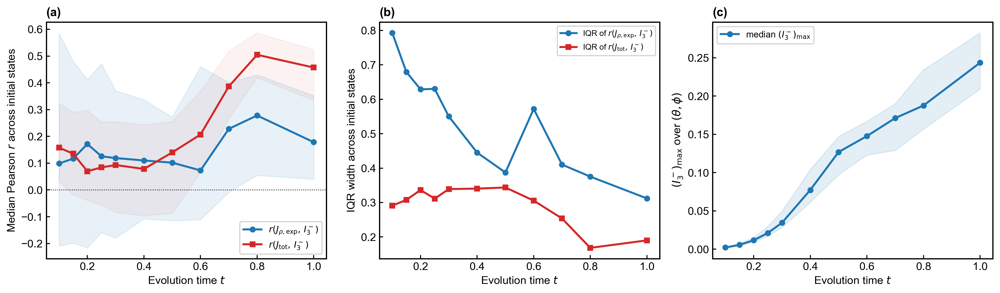

SI Figure Sx saved.


In [29]:
'''
SI Figure Sx (refined): 4Q initial-state ensemble scan
'''

df = pd.read_csv('state_time_scan.csv')

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

t_vals = sorted(df.t.unique())

# compute ensemble stats per time
med_Jr, q25_Jr, q75_Jr = [], [], []
med_Jt, q25_Jt, q75_Jt = [], [], []
med_I3max, q25_I3max, q75_I3max = [], [], []

for t in t_vals:
    sub = df[df.t == t]
    jr = sub.r_J_rho_exp_I3.values
    jt = sub.r_J_tot_I3.values
    i3 = sub.I3_max.values
    
    med_Jr.append(np.median(jr)); q25_Jr.append(np.percentile(jr, 25)); q75_Jr.append(np.percentile(jr, 75))
    med_Jt.append(np.median(jt)); q25_Jt.append(np.percentile(jt, 25)); q75_Jt.append(np.percentile(jt, 75))
    med_I3max.append(np.median(i3)); q25_I3max.append(np.percentile(i3, 25)); q75_I3max.append(np.percentile(i3, 75))

t_arr = np.array(t_vals)
color_Jr = '#1f77b4'
color_Jt = '#d62728'

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(14, 4.2))

# --- Panel (a): median correlations, only Jr gets IQR band ---
ax1.fill_between(t_arr, q25_Jt, q75_Jt, color=color_Jt, alpha=0.06)
ax1.fill_between(t_arr, q25_Jr, q75_Jr, color=color_Jr, alpha=0.10)
ax1.plot(t_arr, med_Jr, '-o', color=color_Jr, markersize=5, linewidth=2.0,
         label=r'$r(J_{\rho,\mathrm{exp}},\, I_3^-)$')
ax1.plot(t_arr, med_Jt, '-s', color=color_Jt, markersize=5, linewidth=2.0,
         label=r'$r(J_{\mathrm{tot}},\, I_3^-)$')
ax1.axhline(0, color='black', linewidth=0.8, linestyle=':', zorder=1)
ax1.set_xlabel('Evolution time $t$')
ax1.set_ylabel('Median Pearson $r$ across initial states')
ax1.legend(loc='lower right', fontsize=9, framealpha=0.95, edgecolor='#cccccc')
ax1.set_title('(a)', loc='left', fontweight='bold', fontsize=12)

# --- Panel (b): IQR width ---
iqr_Jr = np.array(q75_Jr) - np.array(q25_Jr)
iqr_Jt = np.array(q75_Jt) - np.array(q25_Jt)

ax2.plot(t_arr, iqr_Jr, '-o', color=color_Jr, markersize=5, linewidth=2.0,
         label=r'IQR of $r(J_{\rho,\mathrm{exp}},\, I_3^-)$')
ax2.plot(t_arr, iqr_Jt, '-s', color=color_Jt, markersize=5, linewidth=2.0,
         label=r'IQR of $r(J_{\mathrm{tot}},\, I_3^-)$')
ax2.set_xlabel('Evolution time $t$')
ax2.set_ylabel('IQR width across initial states')
ax2.legend(loc='upper right', fontsize=8, framealpha=0.95, edgecolor='#cccccc')
ax2.set_title('(b)', loc='left', fontweight='bold', fontsize=12)

# --- Panel (c): I3_max median + IQR ---
ax3.fill_between(t_arr, q25_I3max, q75_I3max, color=color_Jr, alpha=0.12)
ax3.plot(t_arr, med_I3max, '-o', color=color_Jr, markersize=5, linewidth=2.0,
         label=r'median $(I_3^-)_{\max}$')
ax3.set_xlabel('Evolution time $t$')
ax3.set_ylabel(r'$(I_3^-)_{\max}$ over $(\theta, \phi)$')
ax3.legend(loc='upper left', fontsize=9, framealpha=0.95, edgecolor='#cccccc')
ax3.set_title('(c)', loc='left', fontweight='bold', fontsize=12)

fig.tight_layout()
plt.savefig('FigSx_ensemble_refined.png', dpi=300, bbox_inches='tight')
plt.savefig('FigSx_ensemble_refined.pdf', bbox_inches='tight')
plt.show()
print("SI Figure Sx saved.")

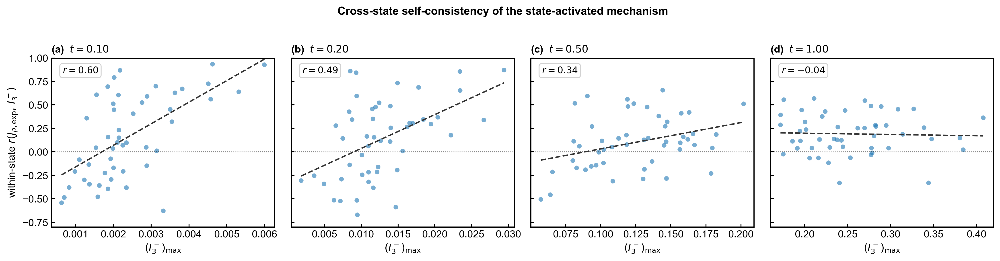

SI Figure Sy saved.


In [33]:
'''
SI Figure Sy (refined): cross-state self-consistency, 1x4 Pearson only
'''

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

t_show = [0.10, 0.20, 0.50, 1.00]
panel_labels = ['(a)', '(b)', '(c)', '(d)']

fig, axes = plt.subplots(1, 4, figsize=(15, 3.8), sharey=True)

for idx, (t_val, label) in enumerate(zip(t_show, panel_labels)):
    ax = axes[idx]
    sub = df[abs(df.t - t_val) < 0.001]
    
    x = sub.I3_max.values
    y = sub.r_J_rho_exp_I3.values
    
    ax.scatter(x, y, s=25, alpha=0.6, color='#1f77b4', edgecolors='none')
    
    # regression line only (no confidence band)
    mask = np.isfinite(x) & np.isfinite(y)
    if mask.sum() > 2:
        z = np.polyfit(x[mask], y[mask], 1)
        x_line = np.linspace(x[mask].min(), x[mask].max(), 50)
        ax.plot(x_line, np.polyval(z, x_line), '--', color='#333333', linewidth=1.5)
        r_val = np.corrcoef(x[mask], y[mask])[0, 1]
        ax.text(0.05, 0.95, f'$r = {r_val:.2f}$',
                transform=ax.transAxes, fontsize=10, va='top',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                         edgecolor='#cccccc', alpha=0.9))
    
    ax.axhline(0, color='black', linewidth=0.8, linestyle=':', zorder=1)
    ax.set_ylim(-0.8, 1.0)
    ax.set_title(f'{label}  $t = {t_val:.2f}$', loc='left', fontweight='bold', fontsize=11)
    ax.set_xlabel(r'$(I_3^-)_{\max}$')
    
    if idx == 0:
        ax.set_ylabel(r'within-state $r(J_{\rho,\mathrm{exp}},\, I_3^-)$')

fig.suptitle('Cross-state self-consistency of the state-activated mechanism',
             fontsize=12, fontweight='bold', y=1.02)
fig.tight_layout()
plt.savefig('FigSy_refined.png', dpi=300, bbox_inches='tight')
plt.savefig('FigSy_refined.pdf', bbox_inches='tight')
plt.show()
print("SI Figure Sy saved.")

Symbolic Derivation

In [24]:
# Cell 19 — Route 0 / symbolic derivation 1
'''
Symbolic Derivation 1:
Jordan associator as the algebraic kernel of third-order interference
(整理自 v2 Cell 24)
'''

# 1. 定义非对易算符
Hab, Hbc, Hac, rho0 = sp.symbols('H_{AB} H_{BC} H_{AC} rho_0', commutative=False)
t = sp.symbols('t', real=True)

# 总哈密顿量
H = Hab + Hbc + Hac

# 2. 李代数工具
def comm(A, B):
    return sp.expand(A * B - B * A)

def jordan(A, B):
    return sp.expand(sp.Rational(1, 2) * (A * B + B * A))

def associator(A, B, C):
    return sp.expand(jordan(jordan(A, B), C) - jordan(A, jordan(B, C)))

# 3. rho(t) 展开到三阶
term1 = comm(H, rho0)
term2 = comm(H, term1)
term3 = comm(H, term2)

# 只看 O(t^3)
rho_3rd_order = term3

# 4. 提取同时包含三条边的交叉项
def extract_three_body_terms(expr):
    terms = sp.Add.make_args(expr)
    cross_terms = []
    for term in terms:
        if term.has(Hab) and term.has(Hbc) and term.has(Hac):
            cross_terms.append(term)
    return sp.Add(*cross_terms)

synergy_terms = extract_three_body_terms(rho_3rd_order)

# 5. Jordan associator 对比
A_jordan = associator(Hab, Hbc, Hac)
A_lie = sp.Rational(1, 4) * comm(Hbc, comm(Hab, Hac))

print("==================================================")
print("Route 0 / Symbolic derivation 1")
print("Jordan associator as the algebraic core of third-order interference")
print("==================================================")

print("\nThird-order cross terms in rho(t):")
print(synergy_terms)

print("\nCheck the identity:")
print("1/4 * [H_BC, [H_AB, H_AC]] - Associator(H_AB, H_BC, H_AC) =")
print(sp.simplify(A_lie - A_jordan))

print("\nConclusion:")
print("The symbolic algebra confirms that the core three-edge interference structure")
print("appearing in the O(t^3) expansion is governed by the same non-associative")
print("algebraic kernel that defines the Jordan associator.")

Route 0 / Symbolic derivation 1
Jordan associator as the algebraic core of third-order interference

Third-order cross terms in rho(t):
H_{AB}*H_{AC}*H_{BC}*rho_0 - 3*H_{AB}*H_{AC}*rho_0*H_{BC} + H_{AB}*H_{BC}*H_{AC}*rho_0 - 3*H_{AB}*H_{BC}*rho_0*H_{AC} + 3*H_{AB}*rho_0*H_{AC}*H_{BC} + 3*H_{AB}*rho_0*H_{BC}*H_{AC} + H_{AC}*H_{AB}*H_{BC}*rho_0 - 3*H_{AC}*H_{AB}*rho_0*H_{BC} + H_{AC}*H_{BC}*H_{AB}*rho_0 - 3*H_{AC}*H_{BC}*rho_0*H_{AB} + 3*H_{AC}*rho_0*H_{AB}*H_{BC} + 3*H_{AC}*rho_0*H_{BC}*H_{AB} + H_{BC}*H_{AB}*H_{AC}*rho_0 - 3*H_{BC}*H_{AB}*rho_0*H_{AC} + H_{BC}*H_{AC}*H_{AB}*rho_0 - 3*H_{BC}*H_{AC}*rho_0*H_{AB} + 3*H_{BC}*rho_0*H_{AB}*H_{AC} + 3*H_{BC}*rho_0*H_{AC}*H_{AB} - rho_0*H_{AB}*H_{AC}*H_{BC} - rho_0*H_{AB}*H_{BC}*H_{AC} - rho_0*H_{AC}*H_{AB}*H_{BC} - rho_0*H_{AC}*H_{BC}*H_{AB} - rho_0*H_{BC}*H_{AB}*H_{AC} - rho_0*H_{BC}*H_{AC}*H_{AB}

Check the identity:
1/4 * [H_BC, [H_AB, H_AC]] - Associator(H_AB, H_BC, H_AC) =
0

Conclusion:
The symbolic algebra confirms that the core three-

In [26]:
# Cell 20 — Route 0 / symbolic derivation 2
'''
Symbolic Derivation 2:
Short-time expansion of linear entropy
(整理自 v2 Cell 25)
'''
import sympy as sp

Hab, Hbc, Hac, rho0 = sp.symbols('H_{AB} H_{BC} H_{AC} rho_0', commutative=False)
t = sp.symbols('t', real=True)

H = Hab + Hbc + Hac

def comm(A, B):
    return sp.expand(A * B - B * A)

# rho1, rho2
rho1 = -sp.I * comm(H, rho0)
rho2 = -sp.Rational(1, 2) * comm(H, comm(H, rho0))

# purity expansion coefficient inside trace
rho1_sq = sp.expand(-comm(H, rho0) * comm(H, rho0))
rho0_rho2 = sp.expand(rho0 * rho2)
coeff_t2_inside_trace = sp.expand(rho1_sq + 2 * rho0_rho2)

def has_all_three(term):
    return term.has(Hab) and term.has(Hbc) and term.has(Hac)

all_terms = sp.Add.make_args(coeff_t2_inside_trace)
cross_terms = [tt for tt in all_terms if has_all_three(tt)]
non_cross = [tt for tt in all_terms if not has_all_three(tt)]

cross_expr = sp.Add(*cross_terms)
non_cross_expr = sp.Add(*non_cross)

A_AB = sp.Rational(1, 4) * comm(Hab, comm(Hbc, Hac))
A_BC = sp.Rational(1, 4) * comm(Hbc, comm(Hab, Hac))
A_AC = sp.Rational(1, 4) * comm(Hac, comm(Hab, Hbc))

print("=" * 60)
print("Route 0 / Symbolic derivation 2")
print("Short-time expansion of linear entropy")
print("=" * 60)

print("\nCoefficient of t^2 inside Tr[rho(t)^2]:")
print(f"Total number of terms: {len(all_terms)}")
print(f"Three-body cross terms: {len(cross_terms)}")
print(f"Non-cross terms: {len(non_cross)}")

print("\nThree-body cross terms:")
print(cross_expr)

print("\nNested commutators (= 4 × Jordan associator):")
print("\n[H_AB, [H_BC, H_AC]] =")
print(sp.expand(comm(Hab, comm(Hbc, Hac))))
print("\n[H_BC, [H_AB, H_AC]] =")
print(sp.expand(comm(Hbc, comm(Hab, Hac))))
print("\n[H_AC, [H_AB, H_BC]] =")
print(sp.expand(comm(Hac, comm(Hab, Hbc))))

print("\nInterpretation:")
print("At short times, the curvature of reduced mixedness contains explicit")
print("three-edge cross terms, consistent with an associator-controlled mechanism.")

Route 0 / Symbolic derivation 2
Short-time expansion of linear entropy

Coefficient of t^2 inside Tr[rho(t)^2]:
Total number of terms: 36
Three-body cross terms: 0
Non-cross terms: 36

Three-body cross terms:
0

Nested commutators (= 4 × Jordan associator):

[H_AB, [H_BC, H_AC]] =
-H_{AB}*H_{AC}*H_{BC} + H_{AB}*H_{BC}*H_{AC} + H_{AC}*H_{BC}*H_{AB} - H_{BC}*H_{AC}*H_{AB}

[H_BC, [H_AB, H_AC]] =
-H_{AB}*H_{AC}*H_{BC} + H_{AC}*H_{AB}*H_{BC} + H_{BC}*H_{AB}*H_{AC} - H_{BC}*H_{AC}*H_{AB}

[H_AC, [H_AB, H_BC]] =
-H_{AB}*H_{BC}*H_{AC} + H_{AC}*H_{AB}*H_{BC} - H_{AC}*H_{BC}*H_{AB} + H_{BC}*H_{AB}*H_{AC}

Interpretation:
At short times, the curvature of reduced mixedness contains explicit
three-edge cross terms, consistent with an associator-controlled mechanism.


In [27]:
# Cell 21 — Route 0 / symbolic derivation 3
'''
Symbolic Derivation 3:
Why expanding Tr[rho^2] directly is awkward at odd order,
and why <A_mediator>(t) is a more natural diagnostic
(整理自 v2 Cell 26)
'''
import sympy as sp

Hab, Hbc, Hac, rho0 = sp.symbols('H_{AB} H_{BC} H_{AC} rho_0', commutative=False)

H = Hab + Hbc + Hac

def comm(A, B):
    return sp.expand(A * B - B * A)

print("=" * 60)
print("Route 0 / Symbolic derivation 3")
print("Why the state-activated associator is a more natural short-time probe")
print("=" * 60)

# A_BC as mediator associator in nested-commutator form
A_BC = sp.Rational(1, 4) * comm(Hbc, comm(Hab, Hac))

print("\nMediator associator:")
print("A_BC = 1/4 [H_BC, [H_AB, H_AC]]")
print(A_BC)

# first-order commutator with H
comm_A_H = comm(A_BC, H)
all_terms = sp.Add.make_args(sp.expand(comm_A_H))
cross = [tt for tt in all_terms if tt.has(Hab) and tt.has(Hbc) and tt.has(Hac)]

print("\nFor <A_BC>(t) = Tr[rho(t) A_BC], the first derivative involves:")
print("[A_BC, H]")

print(f"\nTotal number of terms in [A_BC, H]: {len(all_terms)}")
print(f"Number of three-edge cross terms: {len(cross)}")
print("\nThree-edge cross terms in [A_BC, H]:")
print(sp.Add(*cross))

print("\nInterpretation:")
print("This confirms that the state-activated associator is itself a natural")
print("short-time dynamical observable, rather than merely a post hoc algebraic quantity.")

Route 0 / Symbolic derivation 3
Why the state-activated associator is a more natural short-time probe

Mediator associator:
A_BC = 1/4 [H_BC, [H_AB, H_AC]]
(-H_{AB}*H_{AC}*H_{BC} + H_{AC}*H_{AB}*H_{BC} + H_{BC}*H_{AB}*H_{AC} - H_{BC}*H_{AC}*H_{AB})/4

For <A_BC>(t) = Tr[rho(t) A_BC], the first derivative involves:
[A_BC, H]

Total number of terms in [A_BC, H]: 22
Number of three-edge cross terms: 22

Three-edge cross terms in [A_BC, H]:
-H_{AB}*H_{AC}*H_{AB}*H_{BC}/4 - H_{AB}*H_{AC}*H_{BC}*H_{AB}/4 - H_{AB}*H_{AC}*H_{BC}*H_{AC}/4 - H_{AB}*H_{AC}*H_{BC}**2/4 - H_{AB}*H_{BC}*H_{AB}*H_{AC}/4 + H_{AB}*H_{BC}*H_{AC}*H_{AB}/4 + H_{AB}**2*H_{AC}*H_{BC}/4 + H_{AC}*H_{AB}*H_{AC}*H_{BC}/4 + H_{AC}*H_{AB}*H_{BC}*H_{AB}/4 + H_{AC}*H_{AB}*H_{BC}*H_{AC}/4 + H_{AC}*H_{AB}*H_{BC}**2/4 - H_{AC}*H_{BC}*H_{AB}*H_{AC}/4 + H_{AC}*H_{BC}*H_{AC}*H_{AB}/4 - H_{AC}**2*H_{AB}*H_{BC}/4 + H_{BC}*H_{AB}*H_{AC}*H_{AB}/4 + H_{BC}*H_{AB}*H_{AC}*H_{BC}/2 + H_{BC}*H_{AB}*H_{AC}**2/4 - H_{BC}*H_{AC}*H_{AB}*H_{AC}/4 - H_

Figures for toy model

In [25]:
# Cell 22 — Route 0 / Figure 1 data preparation
'''
Prepare dense time-scan data for Figure 1
(整理自 v2 Cell 37 + 38)
'''

def reduced_linear_entropy_from_result(r):
    rho = r["rho_ABC"]
    return float(1.0 - np.real(np.trace(rho @ rho)))

t_vals_fig1 = np.sort(np.unique(np.concatenate([
    np.linspace(0.02, 0.10, 5),
    np.linspace(0.10, 0.30, 6),
    np.linspace(0.30, 0.55, 10),
    np.linspace(0.55, 1.00, 6),
])))

print(f"Scanning {len(t_vals_fig1)} time points for Figure 1...")

corr_Jr_fig1 = []
corr_Jt_fig1 = []
corr_SL_fig1 = []
max_I3m_fig1 = []

for idx, tv in enumerate(t_vals_fig1):
    res_t = scan_fixed_norm(
        theta_vals, phi_vals,
        gD=gD_default,
        t=tv,
        init_mode="custom",
        custom_state=psi0_random_product_fixed,
    )

    I3m = np.array([r["I3_minus"] for r in res_t])
    Jr  = np.array([r["J_rho_exp"] for r in res_t])
    Jt  = np.array([r["J_tot"] for r in res_t])
    SL  = np.array([reduced_linear_entropy_from_result(r) for r in res_t])

    corr_Jr_fig1.append(safe_corr(Jr, I3m))
    corr_Jt_fig1.append(safe_corr(Jt, I3m))
    corr_SL_fig1.append(safe_corr(SL, I3m))
    max_I3m_fig1.append(np.max(I3m))

    if (idx + 1) % 5 == 0:
        print(f"  {idx+1}/{len(t_vals_fig1)} done (t={tv:.3f})")

t_d = np.array(t_vals_fig1)
Jr_d = np.array(corr_Jr_fig1)
Jt_d = np.array(corr_Jt_fig1)
SL_d = np.array(corr_SL_fig1)
I3m_d = np.array(max_I3m_fig1)

# crossing point
diff = Jt_d - Jr_d
cross_indices = np.where(diff >= 0)[0]
if len(cross_indices) > 0:
    idx_c = cross_indices[0]
    if idx_c > 0:
        t_cross = t_d[idx_c-1] + (t_d[idx_c] - t_d[idx_c-1]) * (-diff[idx_c-1]) / (diff[idx_c] - diff[idx_c-1])
    else:
        t_cross = t_d[0]
else:
    t_cross = t_d[-1]

print(f"\nCrossing point for Figure 1: t* ≈ {t_cross:.3f}")

Scanning 24 time points for Figure 1...
  5/24 done (t=0.100)
  10/24 done (t=0.300)
  15/24 done (t=0.439)
  20/24 done (t=0.640)

Crossing point for Figure 1: t* ≈ 0.385


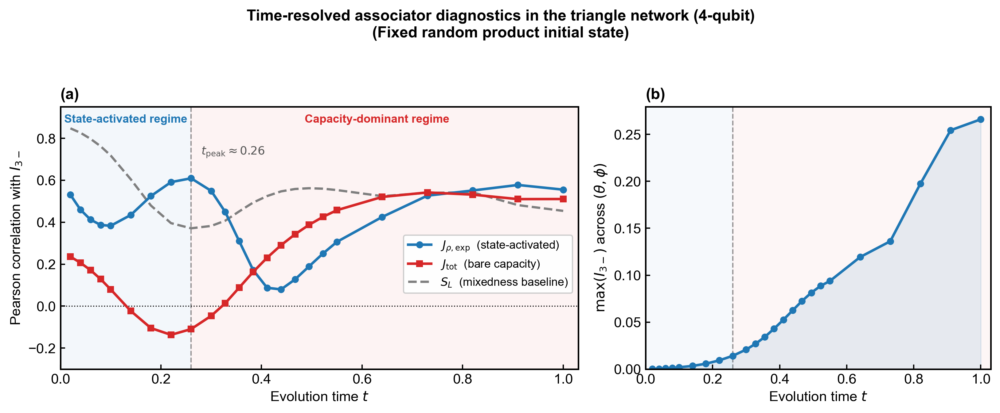

Figure 1 (revised) saved.


In [35]:
# Cell 23 (revised) — Figure 1
'''
Figure 1: Time-resolved associator diagnostics in the triangle network (4-qubit)
Regime split defined by the peak time of J_{rho,exp}.
'''

import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

# ---------------------------------------------------------
# Peak-based regime boundary from J_rho_exp
# ---------------------------------------------------------
idx_peak_4q = int(np.nanargmax(Jr_d))
t_peak_4q = float(t_d[idx_peak_4q])
Jr_peak_4q = float(Jr_d[idx_peak_4q])

fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(11, 4.5),
    gridspec_kw={'width_ratios': [3, 2]}
)

# =========================================================
# panel (a)
# =========================================================
ax1.axvspan(0.0, t_peak_4q, color='#e3edf7', alpha=0.4, zorder=0)
ax1.axvspan(t_peak_4q, t_d[-1] * 1.05, color='#fae3e3', alpha=0.4, zorder=0)
ax1.axvline(t_peak_4q, color='#555555', linewidth=1.0, linestyle='--', alpha=0.6, zorder=1)

ax1.plot(
    t_d, Jr_d,
    '-o', color='#1f77b4', markersize=4.5, linewidth=2.0,
    label=r'$J_{\rho,\mathrm{exp}}$  (state-activated)', zorder=3
)
ax1.plot(
    t_d, Jt_d,
    '-s', color='#d62728', markersize=4.5, linewidth=2.0,
    label=r'$J_{\mathrm{tot}}$  (bare capacity)', zorder=3
)
ax1.plot(
    t_d, SL_d,
    '--', color='#7f7f7f', linewidth=1.8,
    label=r'$S_L$  (mixedness baseline)', zorder=2
)

ax1.axhline(0, color='black', linewidth=0.8, linestyle=':', zorder=1)

ax1.text(
    t_peak_4q * 0.50, 0.94, 'State-activated regime',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color='#1f77b4', fontweight='bold', ha='center'
)
ax1.text(
    (t_peak_4q + t_d[-1]) / 2, 0.94, 'Capacity-dominant regime',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color='#d62728', fontweight='bold', ha='center'
)

# ax1.annotate(
#     rf'$t_{{\mathrm{{peak}}}} \approx {t_peak_4q:.2f}$',
#     xy=(t_peak_4q, Jr_peak_4q),
#     xytext=(t_peak_4q + 0.12, -0.18),
#     fontsize=9, color='#555555',
#     arrowprops=dict(arrowstyle='->', color='#555555', lw=1.2)
# )

ax1.text(
    t_peak_4q + 0.02, 0.80,
    rf'$t_{{\mathrm{{peak}}}} \approx {t_peak_4q:.2f}$',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color='#555555',
    ha='left', va='bottom'
)

ax1.set_xlabel('Evolution time $t$')
ax1.set_ylabel(r'Pearson correlation with $I_{3-}$')
ax1.set_xlim(0.0, t_d[-1] * 1.03)
ax1.set_ylim(-0.30, 0.95)
ax1.legend(
    bbox_to_anchor=(1.00, 0.40),
    loc='right',
    fontsize=9,
    framealpha=0.95,
    edgecolor='#cccccc'
)
ax1.set_title('(a)', loc='left', fontweight='bold', fontsize=12)

# =========================================================
# panel (b)
# =========================================================
ax2.axvspan(0.0, t_peak_4q, color='#e3edf7', alpha=0.3, zorder=0)
ax2.axvspan(t_peak_4q, t_d[-1] * 1.05, color='#fae3e3', alpha=0.3, zorder=0)
ax2.axvline(t_peak_4q, color='#555555', linewidth=1.0, linestyle='--', alpha=0.6, zorder=1)

ax2.fill_between(t_d, 0, I3m_d, color='#1f77b4', alpha=0.10, zorder=1)
ax2.plot(
    t_d, I3m_d,
    '-o', color='#1f77b4', markersize=4.5, linewidth=2.0,
    zorder=2
)

ax2.set_xlabel('Evolution time $t$')
ax2.set_ylabel(r'$\max(I_{3-})$ across $(\theta,\phi)$')
ax2.set_xlim(0.0, t_d[-1] * 1.03)
ax2.set_ylim(bottom=0)
ax2.set_title('(b)', loc='left', fontweight='bold', fontsize=12)

fig.suptitle(
    'Time-resolved associator diagnostics in the triangle network (4-qubit)\n'
    '(Fixed random product initial state)',
    fontsize=12, fontweight='bold', y=0.99
)
fig.tight_layout(rect=[0, 0, 1, 0.95])

plt.savefig('Fig1_triangle_4q_time_resolved_associator_diagnostics.png',
            dpi=300, bbox_inches='tight', pad_inches=0.03)
# plt.savefig('Fig1_triangle_4q_time_resolved_associator_diagnostics.pdf',
#             bbox_inches='tight', pad_inches=0.03)
plt.show()

print("Figure 1 (revised) saved.")

In [36]:
# Cell 24 — Route 0 / Figure 2 data preparation
'''
Prepare snapshot data for Figure 2
(对应 v2 Figure 2)
'''
t_fig2 = 0.25

res_t025 = scan_fixed_norm(
    theta_vals, phi_vals,
    gD=gD_default,
    t=t_fig2,
    init_mode="custom",
    custom_state=psi0_random_product_fixed,
)

print(f"Prepared res_t025 with N = {len(res_t025)} at t = {t_fig2}")

Prepared res_t025 with N = 400 at t = 0.25


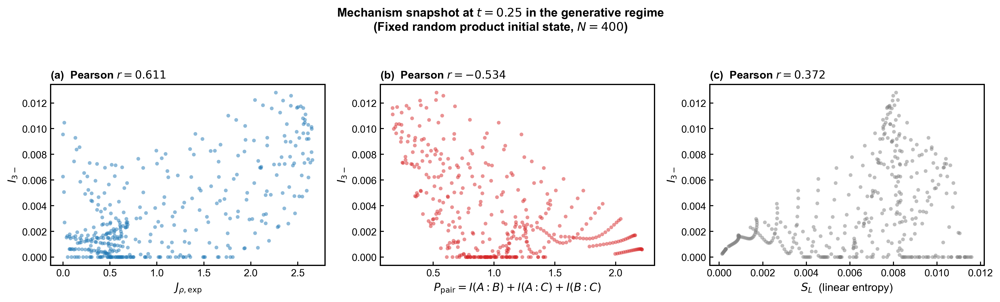

Figure 2 saved.


In [37]:
# Cell 25 — Route 0 / Figure 2
'''
Figure 2: Mechanism evidence at t = 0.25
(整理自 v2 Cell 40)
'''
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

I3m = np.array([r['I3_minus'] for r in res_t025])
Jr  = np.array([r['J_rho_exp'] for r in res_t025])
Pp  = np.array([r['P_pair'] for r in res_t025])
SL  = np.array([1.0 - np.real(np.trace(r['rho_ABC'] @ r['rho_ABC'])) for r in res_t025])
Ns  = np.array([r['N_pair_sum'] for r in res_t025])

r_Jr = safe_corr(Jr, I3m)
r_Pp = safe_corr(Pp, I3m)
r_SL = safe_corr(SL, I3m)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(14, 4.2))

# (a)
ax1.scatter(Jr, I3m, s=14, alpha=0.5, color='#1f77b4', edgecolors='none')
ax1.set_xlabel(r'$J_{\rho,\mathrm{exp}}$')
ax1.set_ylabel(r'$I_{3-}$')
ax1.set_title(f'(a)  Pearson $r = {r_Jr:.3f}$', loc='left', fontweight='bold', fontsize=11)

# (b)
ax2.scatter(Pp, I3m, s=14, alpha=0.5, color='#d62728', edgecolors='none')
ax2.set_xlabel(r'$P_{\mathrm{pair}} = I(A{:}B)+I(A{:}C)+I(B{:}C)$')
ax2.set_ylabel(r'$I_{3-}$')
ax2.set_title(f'(b)  Pearson $r = {r_Pp:.3f}$', loc='left', fontweight='bold', fontsize=11)

if np.allclose(Ns, 0):
    ax2.text(0.97, 0.95, '$N_{\\mathrm{pair}} \\equiv 0$\nacross all 400 points',
             transform=ax2.transAxes, fontsize=8.5, color='#666666',
             ha='right', va='top', fontweight='bold',
             bbox=dict(boxstyle='round,pad=0.4', facecolor='#f5f5f5',
                       edgecolor='#aaaaaa', alpha=0.9))

# (c)
ax3.scatter(SL, I3m, s=14, alpha=0.5, color='#7f7f7f', edgecolors='none')
ax3.set_xlabel(r'$S_L$  (linear entropy)')
ax3.set_ylabel(r'$I_{3-}$')
ax3.set_title(f'(c)  Pearson $r = {r_SL:.3f}$', loc='left', fontweight='bold', fontsize=11)

for ax in [ax1, ax2, ax3]:
    ax.tick_params(axis='both', which='major', labelsize=10)

fig.suptitle(f'Mechanism snapshot at $t = {t_fig2}$ in the generative regime\n'
             '(Fixed random product initial state, $N = 400$)',
             fontsize=12, fontweight='bold', y=0.99)
fig.tight_layout(rect=[0, 0, 1, 0.95])

plt.savefig('Fig2_mechanism_snapshot_clean.png', dpi=300, bbox_inches='tight', pad_inches=0.03)
plt.savefig('Fig2_mechanism_snapshot_clean.pdf', bbox_inches='tight', pad_inches=0.03)
plt.show()
print("Figure 2 saved.")

In [38]:
# Cell 26 — Route 0 / Figure 3 data preparation
'''
Prepare plus-state time scan and Haar-state boundary control for Figure 3
(整理自 v2 Cell 41 的数据准备部分)
'''
corr_Jr_plus = []
corr_Jt_plus = []
corr_SL_plus = []

for tv in t_vals_fig1:
    res_t = scan_fixed_norm(
        theta_vals, phi_vals,
        gD=gD_default,
        t=tv,
        init_mode="plus",
    )
    I3m = np.array([r['I3_minus'] for r in res_t])
    Jr  = np.array([r['J_rho_exp'] for r in res_t])
    Jt  = np.array([r['J_tot'] for r in res_t])
    SL  = np.array([1.0 - np.real(np.trace(r['rho_ABC'] @ r['rho_ABC'])) for r in res_t])

    corr_Jr_plus.append(safe_corr(Jr, I3m))
    corr_Jt_plus.append(safe_corr(Jt, I3m))
    corr_SL_plus.append(safe_corr(SL, I3m))

Jr_p = np.array(corr_Jr_plus)
Jt_p = np.array(corr_Jt_plus)
SL_p = np.array(corr_SL_plus)

diff_p = Jt_p - Jr_p
cross_p = np.where(diff_p >= 0)[0]
if len(cross_p) > 0 and cross_p[0] > 0:
    idx_cp = cross_p[0]
    t_cross_p = t_d[idx_cp-1] + (t_d[idx_cp] - t_d[idx_cp-1]) * (-diff_p[idx_cp-1]) / (diff_p[idx_cp] - diff_p[idx_cp-1])
else:
    t_cross_p = t_d[-1]

print(f"Plus-state crossing point for Figure 3: t* ≈ {t_cross_p:.3f}")

I3m_haar = np.array([r['I3_minus'] for r in results_haar_fixed_t01])
Jr_haar  = np.array([r['J_rho_exp'] for r in results_haar_fixed_t01])
r_haar = safe_corr(Jr_haar, I3m_haar)

Plus-state crossing point for Figure 3: t* ≈ 0.778


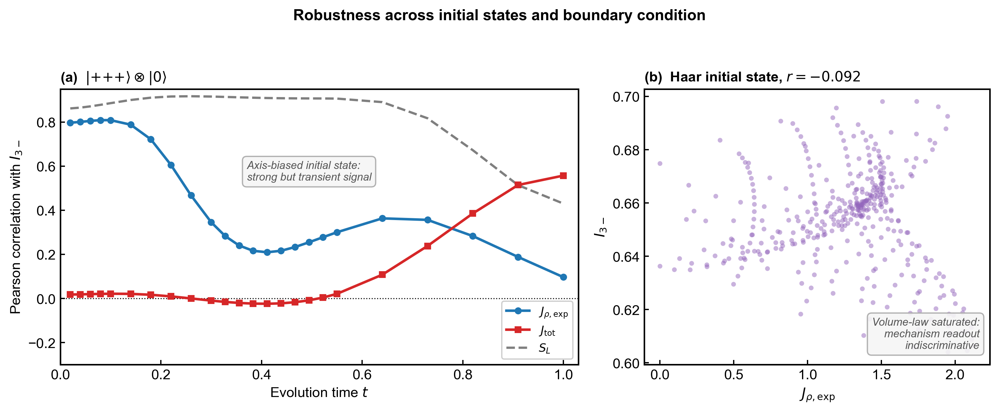

Figure 3 (revised) saved.


In [39]:
# Cell 27 (revised) — Route 0 / Figure 3
'''
Figure 3: Robustness across initial states and boundary condition
Panel (a) no longer shows regime shading/divider; it only presents
the time-resolved applicability pattern under the axis-biased initial state.
'''

import matplotlib.pyplot as plt

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(11, 4.5),
    gridspec_kw={'width_ratios': [3, 2]}
)

# =========================================================
# (a) plus-state time-resolved diagnostics
# =========================================================
ax1.plot(
    t_d, Jr_p,
    '-o', color='#1f77b4', markersize=4.5, linewidth=2.0,
    label=r'$J_{\rho,\mathrm{exp}}$', zorder=3
)
ax1.plot(
    t_d, Jt_p,
    '-s', color='#d62728', markersize=4.5, linewidth=2.0,
    label=r'$J_{\mathrm{tot}}$', zorder=3
)
ax1.plot(
    t_d, SL_p,
    '--', color='#7f7f7f', linewidth=1.8,
    label=r'$S_L$', zorder=2
)

ax1.axhline(0, color='black', linewidth=0.8, linestyle=':', zorder=1)

ax1.text(
    0.36, 0.70,
    'Axis-biased initial state:\nstrong but transient signal',
    transform=ax1.transAxes,
    fontsize=8.5,
    color='#555555',
    va='center',
    style='italic',
    bbox=dict(
        boxstyle='round,pad=0.4',
        facecolor='#f5f5f5',
        edgecolor='#aaaaaa',
        alpha=0.9
    )
)

ax1.set_xlabel('Evolution time $t$')
ax1.set_ylabel('Pearson correlation with $I_{3-}$')
ax1.set_xlim(0.0, t_d[-1] * 1.03)
ax1.set_ylim(-0.30, 0.95)
ax1.legend(loc='lower right', fontsize=9, framealpha=0.95, edgecolor='#cccccc')
ax1.set_title(r'(a)  $|{+}{+}{+}\rangle \otimes |0\rangle$', loc='left', fontweight='bold', fontsize=11)

# =========================================================
# (b) Haar scatter
# =========================================================
ax2.scatter(Jr_haar, I3m_haar, s=14, alpha=0.5, color='#9467bd', edgecolors='none')
ax2.set_xlabel(r'$J_{\rho,\mathrm{exp}}$')
ax2.set_ylabel(r'$I_{3-}$')
ax2.set_title(
    f'(b)  Haar initial state, $r = {r_haar:.3f}$',
    loc='left', fontweight='bold', fontsize=11
)

ax2.text(
    0.97, 0.05,
    'Volume-law saturated:\nmechanism readout\nindiscriminative',
    transform=ax2.transAxes,
    fontsize=8.5,
    color='#555555',
    ha='right',
    va='bottom',
    style='italic',
    bbox=dict(
        boxstyle='round,pad=0.4',
        facecolor='#f5f5f5',
        edgecolor='#aaaaaa',
        alpha=0.9
    )
)

fig.suptitle(
    'Robustness across initial states and boundary condition',
    fontsize=12,
    fontweight='bold',
    y=0.99
)
fig.tight_layout(rect=[0, 0, 1, 0.95])

plt.savefig('Fig3_initial_state_robustness_clean.png', dpi=300, bbox_inches='tight', pad_inches=0.03)
plt.savefig('Fig3_initial_state_robustness_clean.pdf', bbox_inches='tight', pad_inches=0.03)
plt.show()
print("Figure 3 (revised) saved.")

In [40]:
# Cell 28 — Supplementary helpers
"""
Supplementary helpers:
- GHZ witness
- linear entropy
- competition metric extraction
"""

def ghz_witness(rho_ABC):
    """
    W_GHZ = 1/2 - <GHZ|rho|GHZ>.
    Here we return fidelity - 1/2, so:
      > 0  means GHZ witness detects genuine tripartite entanglement
      <= 0 means not detected by this witness
    """
    ghz = np.zeros(8, dtype=complex)
    ghz[0] = 1.0 / np.sqrt(2)   # |000>
    ghz[7] = 1.0 / np.sqrt(2)   # |111>
    fidelity = np.real(ghz.conj() @ rho_ABC @ ghz)
    return float(fidelity - 0.5)

def linear_entropy(rho_ABC):
    """
    S_L = 1 - Tr[rho^2]
    """
    return float(1.0 - np.real(np.trace(rho_ABC @ rho_ABC)))

def compute_competition_metric_arrays(results_list):
    """
    Extract all competition metrics from a scan result list.
    """
    I3m = np.array([r['I3_minus'] for r in results_list], dtype=float)
    Jr  = np.array([r['J_rho_exp'] for r in results_list], dtype=float)
    Jt  = np.array([r['J_tot'] for r in results_list], dtype=float)
    eta = np.array([r['eta'] for r in results_list], dtype=float)
    Pp  = np.array([r['P_pair'] for r in results_list], dtype=float)
    Ns  = np.array([r['N_pair_sum'] for r in results_list], dtype=float)
    Wg  = np.array([ghz_witness(r['rho_ABC']) for r in results_list], dtype=float)
    SL  = np.array([linear_entropy(r['rho_ABC']) for r in results_list], dtype=float)

    return {
        "I3_minus": I3m,
        "J_rho_exp": Jr,
        "J_tot": Jt,
        "eta": eta,
        "P_pair": Pp,
        "N_sum": Ns,
        "W_GHZ": Wg,
        "S_L": SL,
    }

In [41]:
# Cell 29 — Supplementary Figure data preparation
"""
Supplementary Figure data:
Time-resolved competition heatmap of all candidate metrics vs I3_minus
using the fixed random product initial state.
"""

from matplotlib.colors import TwoSlopeNorm

t_supp = [0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.40, 0.50, 0.75, 1.00]

metric_names = [
    r'$J_{\rho,\mathrm{exp}}$',
    r'$J_{\mathrm{tot}}$',
    r'$\eta$',
    r'$P_{\mathrm{pair}}$',
    r'$N_{\mathrm{sum}}$',
    r'$W_{\mathrm{GHZ}}$',
    r'$S_L$',
]

metric_keys = [
    "J_rho_exp",
    "J_tot",
    "eta",
    "P_pair",
    "N_sum",
    "W_GHZ",
    "S_L",
]

corr_matrix_supp = np.full((len(metric_names), len(t_supp)), np.nan)

print("Preparing Supplementary Figure data...")
for j, tv in enumerate(t_supp):
    res_t = scan_fixed_norm(
        theta_vals,
        phi_vals,
        gD=gD_default,
        t=tv,
        init_mode="custom",
        custom_state=psi0_random_product_fixed,
    )

    metric_dict = compute_competition_metric_arrays(res_t)
    I3m = metric_dict["I3_minus"]

    for i, key in enumerate(metric_keys):
        corr_matrix_supp[i, j] = safe_corr(metric_dict[key], I3m)

    print(f"  t = {tv:.2f} done")

print("Supplementary data ready.")

Preparing Supplementary Figure data...
  t = 0.05 done
  t = 0.10 done
  t = 0.15 done
  t = 0.20 done
  t = 0.25 done
  t = 0.30 done
  t = 0.40 done
  t = 0.50 done
  t = 0.75 done
  t = 1.00 done
Supplementary data ready.


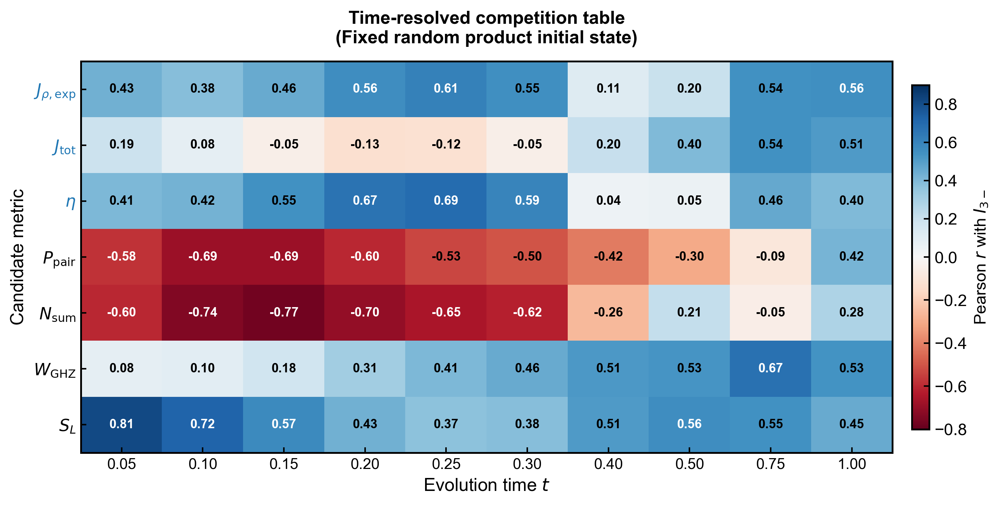

Supplementary Figure saved.


In [42]:
# Cell 30 — Supplementary Figure
"""
Supplementary Figure:
Time-resolved competition heatmap of candidate metrics vs I3_minus
"""

import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'figure.dpi': 300,
})

fig, ax = plt.subplots(figsize=(10, 4.8))

# diverging colormap: negative = red, positive = blue, zero = white
norm = TwoSlopeNorm(vmin=-0.8, vcenter=0.0, vmax=0.9)
im = ax.imshow(corr_matrix_supp, cmap='RdBu', norm=norm, aspect='auto')

# axes
ax.set_xticks(range(len(t_supp)))
ax.set_xticklabels([f'{t:.2f}' for t in t_supp], fontsize=10)
ax.set_yticks(range(len(metric_names)))
ax.set_yticklabels(metric_names, fontsize=11)

ax.set_xlabel('Evolution time $t$', fontsize=12)
ax.set_ylabel('Candidate metric', fontsize=12)

# write values in each cell
for i in range(len(metric_names)):
    for j in range(len(t_supp)):
        val = corr_matrix_supp[i, j]
        if np.isnan(val):
            text = '—'
            color = '#999999'
        else:
            text = f'{val:.2f}'
            color = 'white' if abs(val) > 0.55 else 'black'

        ax.text(
            j, i, text,
            ha='center', va='center',
            fontsize=8.5,
            color=color,
            fontweight='bold'
        )

# colorbar
cbar = plt.colorbar(im, ax=ax, shrink=0.88, pad=0.02)
cbar.set_label(r'Pearson $r$ with $I_{3-}$', fontsize=11)

# highlight our main mechanism metrics (前三行)
ytick_labels = ax.get_yticklabels()
for i, label in enumerate(ytick_labels):
    if i < 3:   # J_rho_exp, J_tot, eta
        label.set_color('#1f77b4')
        label.set_fontweight('bold')

ax.set_title(
    'Time-resolved competition table\n'
    '(Fixed random product initial state)',
    fontsize=12,
    fontweight='bold',
    pad=12
)

fig.tight_layout()

plt.savefig('FigS1_competition_heatmap.png', dpi=300, bbox_inches='tight', pad_inches=0.03)
plt.savefig('FigS1_competition_heatmap.pdf', bbox_inches='tight', pad_inches=0.03)
plt.show()

print("Supplementary Figure saved.")

Open System Test

In [26]:
# Cell 31 — Route 3 helpers
import qutip as qt
def make_c_ops_route3(noise_type, gamma):
    """
    Collapse operators acting on A, B, C only.
    """
    c_ops = []
    for i in range(3):
        if noise_type == 'amplitude':
            op_list = [qt.qeye(2)] * 4
            op_list[i] = qt.destroy(2)
            c_ops.append(np.sqrt(gamma) * qt.tensor(op_list))

        elif noise_type == 'dephasing':
            op_list = [qt.qeye(2)] * 4
            op_list[i] = qt.sigmaz()
            c_ops.append(np.sqrt(gamma) * qt.tensor(op_list))

        elif noise_type == 'depolarizing':
            for pauli in [qt.sigmax(), qt.sigmay(), qt.sigmaz()]:
                op_list = [qt.qeye(2)] * 4
                op_list[i] = pauli
                c_ops.append(np.sqrt(gamma / 3.0) * qt.tensor(op_list))

        else:
            raise ValueError(f"Unknown noise_type: {noise_type}")

    return c_ops


def prepare_route3_time_arrays(cfg):
    t_list_prep = np.linspace(0.0, cfg["t_prep"], cfg["steps_prep"])
    t_list_open = np.linspace(cfg["t_prep"], cfg["t_prep"] + cfg["t_open"], cfg["steps_open"])
    t_total = np.concatenate([t_list_prep, t_list_open[1:]])
    return t_list_prep, t_list_open, t_total


def make_route3_initial_density():
    """
    Fixed random product initial state, converted to 4-qubit density matrix qobj.
    """
    psi0_vec = psi0_random_product_fixed
    rho0_np = np.outer(psi0_vec, psi0_vec.conj())
    return qt.Qobj(rho0_np, dims=[[2, 2, 2, 2], [2, 2, 2, 2]])


def route3_candidate_score(obs_ready):
    """
    Selection score for prepared families.
    Current choice:
      score = I3_minus * (N_pair_sum + epsilon)
    so we preferentially keep families that have both
    visible tripartite synergy and visible pairwise entanglement at prep.
    """
    return obs_ready["I3_minus"] * (obs_ready["N_pair_sum"] + 1e-10)


def select_topk_prepared_families(cfg):
    """
    Sample candidate Hamiltonian families, run unitary prep,
    and keep the top-k according to route3_candidate_score.
    """
    rng = np.random.default_rng(cfg["rng_seed"])
    t_list_prep, _, _ = prepare_route3_time_arrays(cfg)
    rho0_qobj = make_route3_initial_density()

    candidates = []
    for s in range(cfg["num_pool"]):
        th_rand = rng.uniform(0.1, np.pi / 2)
        ph_rand = rng.uniform(0.0, np.pi / 2)

        coeffs = build_edge_coefficients(th_rand, ph_rand, gD=gD_default, R=R)
        H4 = build_hamiltonians_4q(coeffs["J_AB"], coeffs["J_BC"], coeffs["J_AC"], coeffs["J_CD"])
        H_qobj = qt.Qobj(H4["H_tot_4"], dims=[[2, 2, 2, 2], [2, 2, 2, 2]])

        res_prep = qt.mesolve(H_qobj, rho0_qobj, t_list_prep, [], [])
        rho_ready_qobj = res_prep.states[-1]

        rho_ABC_ready = partial_trace(rho_ready_qobj.full(), keep=[0, 1, 2], dims=[2, 2, 2, 2])
        obs_ready = compute_state_observables(rho_ABC_ready)

        candidates.append({
            "theta": th_rand,
            "phi": ph_rand,
            "coeffs": coeffs,
            "H_qobj": H_qobj,
            "rho_ready_qobj": rho_ready_qobj,
            "prep_obs": obs_ready,
            "score": route3_candidate_score(obs_ready),
        })

    candidates_sorted = sorted(candidates, key=lambda x: x["score"], reverse=True)
    selected = candidates_sorted[:cfg["top_k"]]
    return selected


def run_route3_for_selected_families(selected_families, cfg):
    """
    Run noisy evolution on the selected top-k families.
    Returns a dict keyed by noise type.
    """
    t_list_prep, t_list_open, t_total = prepare_route3_time_arrays(cfg)
    rho0_qobj = make_route3_initial_density()

    results_by_noise = {}

    for noise_type in cfg["noise_types"]:
        print(f"\n--- Route 3 / noise = {noise_type} ---")

        all_I3m = []
        all_Pp = []
        all_Npair = []

        for idx, fam in enumerate(selected_families):
            H_qobj = fam["H_qobj"]
            rho_ready_qobj = fam["rho_ready_qobj"]

            # noisy evolution after prep
            c_ops = make_c_ops_route3(noise_type, cfg["gamma"])
            res_open = qt.mesolve(H_qobj, rho_ready_qobj, t_list_open, c_ops, [])

            # also reconstruct the prep segment for full trajectory plotting
            res_prep = qt.mesolve(H_qobj, rho0_qobj, t_list_prep, [], [])
            full_states = res_prep.states + res_open.states[1:]

            I3m_traj = []
            Pp_traj = []
            Npair_traj = []

            for rho_t_qobj in full_states:
                rho_ABC_t = partial_trace(rho_t_qobj.full(), keep=[0, 1, 2], dims=[2, 2, 2, 2])
                obs = compute_state_observables(rho_ABC_t)

                I3m_traj.append(obs["I3_minus"])
                Pp_traj.append(obs["P_pair"])
                Npair_traj.append(obs["N_pair_sum"])

            all_I3m.append(I3m_traj)
            all_Pp.append(Pp_traj)
            all_Npair.append(Npair_traj)

            if (idx + 1) % 4 == 0 or (idx + 1) == len(selected_families):
                print(f"  {idx + 1}/{len(selected_families)}")

        all_I3m = np.array(all_I3m)
        all_Pp = np.array(all_Pp)
        all_Npair = np.array(all_Npair)

        results_by_noise[noise_type] = {
            "all_I3m": all_I3m,
            "all_Pp": all_Pp,
            "all_Npair": all_Npair,

            "mean_I3m": np.mean(all_I3m, axis=0),
            "std_I3m": np.std(all_I3m, axis=0),

            "mean_Pp": np.mean(all_Pp, axis=0),
            "std_Pp": np.std(all_Pp, axis=0),

            "mean_Npair": np.mean(all_Npair, axis=0),
            "std_Npair": np.std(all_Npair, axis=0),
        }

    return {
        "selected_families": selected_families,
        "results_by_noise": results_by_noise,
        "t_list_prep": t_list_prep,
        "t_list_open": t_list_open,
        "t_total": t_total,
    }

In [27]:
# Cell 32 — Open-system (Route 3) config
ROUTE3_CFG = {
    "num_pool": 80,        # how many candidate Hamiltonian families to sample first
    "top_k": 12,           # keep only the top-k prepared families
    "t_prep": 0.80,        # unitary preparation time
    "t_open": 1.20,        # noisy evolution duration
    "gamma": 0.20,         # noise strength
    "steps_prep": 50,
    "steps_open": 60,
    "rng_seed": 42,
    "noise_types": ['amplitude', 'dephasing', 'depolarizing'],
    "noise_labels": ['Amplitude', 'Dephasing', 'Depolarizing'],
}

In [28]:
# Cell 33 — Route 3 main computation
print("=== Route 3: selecting top-k prepared families ===")
route3_selected_families = select_topk_prepared_families(ROUTE3_CFG)

print(f"\nSelected top-k = {ROUTE3_CFG['top_k']} families")
for i, item in enumerate(route3_selected_families[:8], 1):
    obs = item["prep_obs"]
    print(
        f"{i:>2d}. theta={item['theta']:.3f}, phi={item['phi']:.3f}, "
        f"I3_minus={obs['I3_minus']:.6f}, "
        f"N_pair_sum={obs['N_pair_sum']:.6f}, "
        f"P_pair={obs['P_pair']:.6f}, "
        f"score={item['score']:.6e}"
    )

print("\n=== Route 3: running noisy dynamics ===")
route3_output = run_route3_for_selected_families(route3_selected_families, ROUTE3_CFG)

results_by_noise_route3 = route3_output["results_by_noise"]
t_list_prep_route3 = route3_output["t_list_prep"]
t_list_open_route3 = route3_output["t_list_open"]
t_total_route3 = route3_output["t_total"]

print("\nRoute 3 complete.")

=== Route 3: selecting top-k prepared families ===


C:\Users\liu.xuanc\AppData\Local\anaconda3\Lib\site-packages\qutip\solver\solver_base.py:583: FutureWarning: e_ops will be keyword only from qutip 5.3 for all solver
  warnings.warn(



Selected top-k = 12 families
 1. theta=0.916, phi=0.100, I3_minus=0.167263, N_pair_sum=0.369901, P_pair=2.137333, score=6.187070e-02
 2. theta=0.791, phi=0.298, I3_minus=0.137743, N_pair_sum=0.435800, P_pair=1.904222, score=6.002834e-02
 3. theta=0.770, phi=0.318, I3_minus=0.129049, N_pair_sum=0.453880, P_pair=1.867781, score=5.857256e-02
 4. theta=0.786, phi=0.069, I3_minus=0.179642, N_pair_sum=0.323187, P_pair=2.346065, score=5.805809e-02
 5. theta=0.632, phi=0.138, I3_minus=0.136714, N_pair_sum=0.415458, P_pair=2.192538, score=5.679887e-02
 6. theta=0.969, phi=0.036, I3_minus=0.153260, N_pair_sum=0.369336, P_pair=2.058884, score=5.660450e-02
 7. theta=0.743, phi=1.308, I3_minus=0.103770, N_pair_sum=0.520263, P_pair=2.157955, score=5.398794e-02
 8. theta=0.752, phi=0.357, I3_minus=0.114697, N_pair_sum=0.469224, P_pair=1.781695, score=5.381841e-02

=== Route 3: running noisy dynamics ===

--- Route 3 / noise = amplitude ---
  4/12
  8/12
  12/12

--- Route 3 / noise = dephasing ---
 

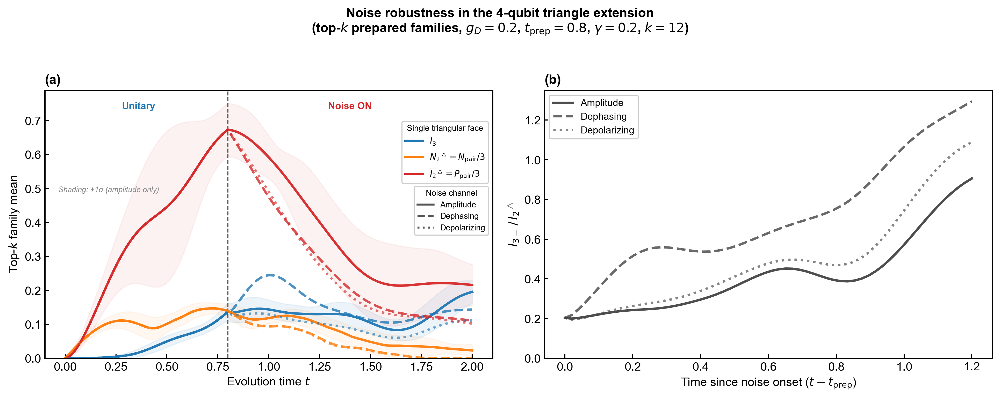

Figure 4 (revised to dyadic means) saved.


In [31]:
# Cell 34 (revised) — Figure 4 using mean dyadic observables
"""
Figure 4:
Panel (a): absolute trajectories of
    - I3_minus
    - mean dyadic negativity = N_pair / 3
    - mean dyadic MI         = P_pair / 3
Panel (b): post-noise ratio I3_minus / (P_pair / 3)
"""

from matplotlib.lines import Line2D
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

noise_types = ROUTE3_CFG["noise_types"]
noise_labels = ROUTE3_CFG["noise_labels"]
linestyles = ['-', '--', ':']

color_I3 = '#1f77b4'   # blue
color_N2 = '#ff7f0e'   # orange
color_I2 = '#d62728'   # red

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5.2))

# ---------------------------------------------------------
# Panel (a): absolute values over the full trajectory
# ---------------------------------------------------------
ax1.axvline(ROUTE3_CFG["t_prep"], color='#555555', linewidth=1.0, linestyle='--', zorder=1)

# variance band only for amplitude channel
d_amp = results_by_noise_route3['amplitude']

amp_mean_I3 = d_amp['mean_I3m']
amp_std_I3  = d_amp['std_I3m']

amp_mean_N2 = d_amp['mean_Npair'] / 3.0
amp_std_N2  = d_amp['std_Npair'] / 3.0

amp_mean_I2 = d_amp['mean_Pp'] / 3.0
amp_std_I2  = d_amp['std_Pp'] / 3.0

ax1.fill_between(
    t_total_route3,
    np.maximum(0, amp_mean_I3 - amp_std_I3),
    amp_mean_I3 + amp_std_I3,
    color=color_I3, alpha=0.08, zorder=1
)
ax1.fill_between(
    t_total_route3,
    np.maximum(0, amp_mean_N2 - amp_std_N2),
    amp_mean_N2 + amp_std_N2,
    color=color_N2, alpha=0.06, zorder=1
)
ax1.fill_between(
    t_total_route3,
    np.maximum(0, amp_mean_I2 - amp_std_I2),
    amp_mean_I2 + amp_std_I2,
    color=color_I2, alpha=0.06, zorder=1
)

for k, (nt, ls) in enumerate(zip(noise_types, linestyles)):
    d = results_by_noise_route3[nt]
    alpha_val = 0.95 - 0.15 * k

    mean_I3 = d['mean_I3m']
    mean_N2 = d['mean_Npair'] / 3.0
    mean_I2 = d['mean_Pp'] / 3.0

    ax1.plot(
        t_total_route3, mean_I3,
        ls, color=color_I3,
        linewidth=2.2, alpha=alpha_val, zorder=2
    )
    ax1.plot(
        t_total_route3, mean_N2,
        ls, color=color_N2,
        linewidth=2.2, alpha=alpha_val, zorder=2
    )
    ax1.plot(
        t_total_route3, mean_I2,
        ls, color=color_I2,
        linewidth=2.2, alpha=alpha_val, zorder=2
    )

ax1.text(
    ROUTE3_CFG["t_prep"] * 0.45, 0.93, 'Unitary',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color=color_I3, fontweight='bold', ha='center'
)
ax1.text(
    (ROUTE3_CFG["t_prep"] + t_total_route3[-1]) / 2, 0.93, 'Noise ON',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color=color_I2, fontweight='bold', ha='center'
)

legend_metric = [
    Line2D([0], [0], color=color_I3, linewidth=2.2,
           label=r'$I_3^-$'),
    Line2D([0], [0], color=color_N2, linewidth=2.2,
           label=r'$\overline{N_{2}}^{\triangle}=N_{\mathrm{pair}}/3$'),
    Line2D([0], [0], color=color_I2, linewidth=2.2,
           label=r'$\overline{I_{2}}^{\triangle}=P_{\mathrm{pair}}/3$'),
]
legend_noise = [
    Line2D([0], [0], color='#555555', linewidth=1.8, linestyle='-', label='Amplitude'),
    Line2D([0], [0], color='#555555', linewidth=1.8, linestyle='--', label='Dephasing'),
    Line2D([0], [0], color='#555555', linewidth=1.8, linestyle=':', label='Depolarizing'),
]

leg1 = ax1.legend(
    handles=legend_metric,
    bbox_to_anchor=(1.00, 0.90),
    loc='upper right',
    fontsize=8,
    framealpha=0.95,
    edgecolor='#cccccc',
    title='Single triangular face',
    title_fontsize=7.5
)
ax1.add_artist(leg1)

ax1.legend(
    handles=legend_noise,
    bbox_to_anchor=(1.00, 0.55),
    loc='center right',
    fontsize=7.5,
    framealpha=0.95,
    edgecolor='#cccccc',
    title='Noise channel',
    title_fontsize=7.5
)

ax1.text(
    0.03, 0.62,
    'Shading: ±1σ (amplitude only)',
    transform=ax1.transAxes,
    fontsize=7,
    color='#888888',
    style='italic'
)

ax1.set_xlabel('Evolution time $t$')
ax1.set_ylabel('Top-$k$ family mean')
ax1.set_ylim(bottom=0)
ax1.set_title('(a)', loc='left', fontweight='bold', fontsize=12)

# ---------------------------------------------------------
# Panel (b): post-noise ratio I3_minus / mean dyadic MI
# ---------------------------------------------------------
idx_switch = len(t_list_prep_route3) - 1
t_after = t_total_route3[idx_switch:] - ROUTE3_CFG["t_prep"]

for k, (nt, lab, ls) in enumerate(zip(noise_types, noise_labels, linestyles)):
    d = results_by_noise_route3[nt]

    mean_I3_after = d['mean_I3m'][idx_switch:]
    mean_I2_after = (d['mean_Pp'] / 3.0)[idx_switch:]

    I20 = mean_I2_after[0]
    cutoff = max(1e-10, 0.05 * I20)

    ratio = np.where(
        mean_I2_after > cutoff,
        mean_I3_after / mean_I2_after,
        np.nan
    )

    ax2.plot(
        t_after, ratio,
        ls,
        color='#444444',
        linewidth=2.2,
        alpha=0.95 - 0.15 * k,
        label=lab
    )

ax2.set_xlabel(r'Time since noise onset ($t - t_{\mathrm{prep}}$)')
ax2.set_ylabel(r'$I_{3-}\,/\,\overline{I_{2}}^{\triangle}$')
ax2.set_ylim(bottom=0)
ax2.legend(loc='upper left', fontsize=9, framealpha=0.95, edgecolor='#cccccc')
ax2.set_title('(b)', loc='left', fontweight='bold', fontsize=12)

fig.suptitle(
    f'Noise robustness in the 4-qubit triangle extension\n'
    f'(top-$k$ prepared families, $g_D=0.2$, $t_{{\\mathrm{{prep}}}}={ROUTE3_CFG["t_prep"]}$, '
    f'$\\gamma={ROUTE3_CFG["gamma"]}$, $k={ROUTE3_CFG["top_k"]}$)',
    fontsize=12,
    fontweight='bold',
    y=0.98
)

fig.tight_layout(rect=[0, 0, 1, 0.95])

plt.savefig('Fig4_4q_open_system_mean_dyadic_background.png',
            dpi=300, bbox_inches='tight', pad_inches=0.03)
plt.savefig('Fig4_4q_open_system_mean_dyadic_background.pdf',
            bbox_inches='tight', pad_inches=0.03)

plt.show()
print("Figure 4 (revised to dyadic means) saved.")

Phase3: Textbook null-control

In [14]:
# Phase2 Step 1 — Symbolic transverse-field Ising associator
# Triangle ABC only: each site has degree 2, so each local transverse field is split as h/2 per adjacent bond.

# -------------------------
# 1. Symbols
# -------------------------
J, h = sp.symbols("J h", real=True)

# -------------------------
# 2. Pauli matrices
# -------------------------
I2 = sp.eye(2)

X = sp.Matrix([[0, 1],
               [1, 0]])

Y = sp.Matrix([[0, -sp.I],
               [sp.I,  0]])

Z = sp.Matrix([[1,  0],
               [0, -1]])

def kron3(A, B, C):
    return sp.kronecker_product(A, B, C)

# Single-site operators on A, B, C
XA = kron3(X,  I2, I2)
XB = kron3(I2, X,  I2)
XC = kron3(I2, I2, X)

ZA = kron3(Z,  I2, I2)
ZB = kron3(I2, Z,  I2)
ZC = kron3(I2, I2, Z)

# Two-body Ising operators
ZZ_AB = ZA * ZB
ZZ_BC = ZB * ZC
ZZ_AC = ZA * ZC

# -------------------------
# 3. Transverse-field Ising edge Hamiltonians
# -------------------------
H_AB = J * ZZ_AB + (h / 2) * (XA + XB)
H_BC = J * ZZ_BC + (h / 2) * (XB + XC)
H_AC = J * ZZ_AC + (h / 2) * (XA + XC)

def comm(A, B):
    return A * B - B * A

# -------------------------
# 4. Mediator Jordan associator channels
# Convention:
# A_AB = 1/4 [H_AB, [H_BC, H_AC]]
# A_BC = 1/4 [H_BC, [H_AB, H_AC]]
# A_AC = 1/4 [H_AC, [H_AB, H_BC]]
# -------------------------
A_AB = sp.simplify(comm(H_AB, comm(H_BC, H_AC)) / 4)
A_BC = sp.simplify(comm(H_BC, comm(H_AB, H_AC)) / 4)
A_AC = sp.simplify(comm(H_AC, comm(H_AB, H_BC)) / 4)

# Frobenius norm squared: ||A||_F^2 = Tr(A^\dagger A)
def frob_norm_sq(A):
    return sp.factor(sp.simplify(sp.trace(A.H * A)))

norm2_AB = frob_norm_sq(A_AB)
norm2_BC = frob_norm_sq(A_BC)
norm2_AC = frob_norm_sq(A_AC)

Jtot2 = sp.factor(norm2_AB + norm2_BC + norm2_AC)

print("=== Equal-coupling transverse-field Ising triangle ===")
print("||A_AB||_F^2 =", norm2_AB)
print("||A_BC||_F^2 =", norm2_BC)
print("||A_AC||_F^2 =", norm2_AC)
print("J_tot^2      =", Jtot2)
print("J_tot        =", sp.sqrt(Jtot2))

print("\nIs A_AB identically zero?", A_AB == sp.zeros(8))
print("Is A_BC identically zero?", A_BC == sp.zeros(8))
print("Is A_AC identically zero?", A_AC == sp.zeros(8))

=== Equal-coupling transverse-field Ising triangle ===
||A_AB||_F^2 = J**2*h**4
||A_BC||_F^2 = J**2*h**4
||A_AC||_F^2 = J**2*h**4
J_tot^2      = 3*J**2*h**4
J_tot        = sqrt(3)*h**2*Abs(J)

Is A_AB identically zero? False
Is A_BC identically zero? False
Is A_AC identically zero? False


In [15]:
# Phase2 Step 1b — Unequal Ising couplings on the three triangle edges

J_AB, J_BC, J_AC, h = sp.symbols("J_AB J_BC J_AC h", real=True)

H_AB = J_AB * ZZ_AB + (h / 2) * (XA + XB)
H_BC = J_BC * ZZ_BC + (h / 2) * (XB + XC)
H_AC = J_AC * ZZ_AC + (h / 2) * (XA + XC)

A_AB = sp.simplify(comm(H_AB, comm(H_BC, H_AC)) / 4)
A_BC = sp.simplify(comm(H_BC, comm(H_AB, H_AC)) / 4)
A_AC = sp.simplify(comm(H_AC, comm(H_AB, H_BC)) / 4)

norm2_AB = frob_norm_sq(A_AB)
norm2_BC = frob_norm_sq(A_BC)
norm2_AC = frob_norm_sq(A_AC)
Jtot2 = sp.factor(norm2_AB + norm2_BC + norm2_AC)

print("=== Unequal-coupling transverse-field Ising triangle ===")
print("||A_AB||_F^2 =", norm2_AB)
print("||A_BC||_F^2 =", norm2_BC)
print("||A_AC||_F^2 =", norm2_AC)
print("J_tot^2      =", Jtot2)

=== Unequal-coupling transverse-field Ising triangle ===
||A_AB||_F^2 = h**4*(J_AC**2 + J_BC**2)/2
||A_BC||_F^2 = h**4*(J_AB**2 + J_AC**2)/2
||A_AC||_F^2 = h**4*(J_AB**2 + J_BC**2)/2
J_tot^2      = h**4*(J_AB**2 + J_AC**2 + J_BC**2)


In [23]:
# Phase3 Step 2A — Pure Ising null-control helpers
# Textbook null-control for the h = 0 transverse-field Ising limit.
#
# IMPORTANT:
# The symbolic SymPy cells above redefine I2, X, Y, Z.
# Reset the numerical Pauli operators before running numerical evolution.

sx = np.array([[0, 1], [1, 0]], dtype=complex)
sy = np.array([[0, -1j], [1j, 0]], dtype=complex)
sz = np.array([[1, 0], [0, -1]], dtype=complex)
I2 = np.eye(2, dtype=complex)

def ising_zz_edge_hamiltonian(n_qubits, i, j, Jz):
    return Jz * embed_two_body(n_qubits, i, j, sz, sz)

def build_pure_ising_hamiltonians_4q(J_AB, J_BC, J_AC, J_CD):
    H_AB_4 = ising_zz_edge_hamiltonian(4, 0, 1, J_AB)
    H_BC_4 = ising_zz_edge_hamiltonian(4, 1, 2, J_BC)
    H_AC_4 = ising_zz_edge_hamiltonian(4, 0, 2, J_AC)
    H_CD_4 = ising_zz_edge_hamiltonian(4, 2, 3, J_CD)
    H_tot_4 = H_AB_4 + H_BC_4 + H_AC_4 + H_CD_4

    return {
        "H_AB_4": H_AB_4,
        "H_BC_4": H_BC_4,
        "H_AC_4": H_AC_4,
        "H_CD_4": H_CD_4,
        "H_tot_4": H_tot_4,
    }

def build_pure_ising_hamiltonians_3q(J_AB, J_BC, J_AC):
    H_AB_3 = ising_zz_edge_hamiltonian(3, 0, 1, J_AB)
    H_BC_3 = ising_zz_edge_hamiltonian(3, 1, 2, J_BC)
    H_AC_3 = ising_zz_edge_hamiltonian(3, 0, 2, J_AC)

    return {
        "H_AB_3": H_AB_3,
        "H_BC_3": H_BC_3,
        "H_AC_3": H_AC_3,
    }

def linear_entropy(rho):
    return to_real_scalar(1.0 - np.trace(rho @ rho))

def run_pure_ising_case(
    J_AB,
    J_BC,
    J_AC,
    J_CD=None,
    t=0.10,
    psi0=None,
    gD=0.20,
    R=np.sqrt(3.0),
):
    if J_CD is None:
        J_CD = gD * R

    if psi0 is None:
        psi0 = psi0_random_product_fixed

    H4 = build_pure_ising_hamiltonians_4q(J_AB, J_BC, J_AC, J_CD)
    H3 = build_pure_ising_hamiltonians_3q(J_AB, J_BC, J_AC)

    rho_ABC, psi_t = evolve_to_rhoABC(psi0, H4["H_tot_4"], t)

    obs_state = compute_state_observables(rho_ABC)
    obs_probe = mediator_metrics(
        rho_ABC,
        H3["H_AB_3"],
        H3["H_BC_3"],
        H3["H_AC_3"],
    )

    comm_AB_BC = np.linalg.norm(commutator(H3["H_AB_3"], H3["H_BC_3"]), ord="fro")
    comm_AB_AC = np.linalg.norm(commutator(H3["H_AB_3"], H3["H_AC_3"]), ord="fro")
    comm_BC_AC = np.linalg.norm(commutator(H3["H_BC_3"], H3["H_AC_3"]), ord="fro")

    return {
        "J_AB_scalar": J_AB,
        "J_BC_scalar": J_BC,
        "J_AC_scalar": J_AC,
        "J_CD_scalar": J_CD,
        "t": t,
        "psi_t": psi_t,
        "rho_ABC": rho_ABC,
        "S_L": linear_entropy(rho_ABC),
        "comm_AB_BC": comm_AB_BC,
        "comm_AB_AC": comm_AB_AC,
        "comm_BC_AC": comm_BC_AC,
        "comm_max": max(comm_AB_BC, comm_AB_AC, comm_BC_AC),
        **obs_state,
        **obs_probe,
    }

def compact_pure_ising_record(res):
    return {
        "t": res["t"],
        "J_AB": res["J_AB_scalar"],
        "J_BC": res["J_BC_scalar"],
        "J_AC": res["J_AC_scalar"],
        "J_CD": res["J_CD_scalar"],
        "comm_max": res["comm_max"],
        "J_tot": res["J_tot"],
        "J_rho_exp": res["J_rho_exp"],
        "eta": res["eta"],
        "I3": res["I3"],
        "I3_minus": res["I3_minus"],
        "S_ABC": res["S_ABC"],
        "S_L": res["S_L"],
        "P_pair": res["P_pair"],
        "N_pair_sum": res["N_pair_sum"],
        "N_tri_geom": res["N_tri_geom"],
        "N_tri_min": res["N_tri_min"],
    }

In [22]:
# Phase3 Step 2B — Pure Ising sign-pattern null-control
# Fixed |J|, all internal sign patterns, same fixed random product state as Phase 1.

from itertools import product

pure_ising_times = [0.10, 0.25, 0.50, 1.00]
pure_ising_signs = list(product([-1, 1], repeat=3))

R_ising = CFG["R"]
gD_ising = CFG["gD_default"]
J_CD_ising = gD_ising * R_ising

pure_ising_records = []

for t in pure_ising_times:
    for sAB, sBC, sAC in pure_ising_signs:
        res = run_pure_ising_case(
            J_AB=sAB * R_ising,
            J_BC=sBC * R_ising,
            J_AC=sAC * R_ising,
            J_CD=J_CD_ising,
            t=t,
            psi0=psi0_random_product_fixed,
            gD=gD_ising,
            R=R_ising,
        )
        pure_ising_records.append(compact_pure_ising_record(res))

df_pure_ising_sign = pd.DataFrame(pure_ising_records)

summary_pure_ising_sign = (
    df_pure_ising_sign
    .groupby("t")
    .agg(
        N=("I3_minus", "size"),
        max_comm=("comm_max", "max"),
        max_J_tot=("J_tot", "max"),
        max_J_rho=("J_rho_exp", "max"),
        max_I3_minus=("I3_minus", "max"),
        mean_I3_minus=("I3_minus", "mean"),
        max_S_ABC=("S_ABC", "max"),
        max_S_L=("S_L", "max"),
        mean_P_pair=("P_pair", "mean"),
        max_P_pair=("P_pair", "max"),
        mean_N_pair_sum=("N_pair_sum", "mean"),
        max_N_pair_sum=("N_pair_sum", "max"),
    )
    .reset_index()
)

print("=== Phase3 Step 2 — Pure Ising sign-pattern null-control ===")
print(f"Number of records: {len(df_pure_ising_sign)}")
print(f"Internal sign patterns: {len(pure_ising_signs)}")
print(f"Times: {pure_ising_times}")
print(f"J_CD = {J_CD_ising:.6f}")

display(summary_pure_ising_sign)

print("\nOverall numerical floors:")
print(f"max(comm_max)    = {df_pure_ising_sign['comm_max'].max():.3e}")
print(f"max(J_tot)       = {df_pure_ising_sign['J_tot'].max():.3e}")
print(f"max(J_rho_exp)   = {df_pure_ising_sign['J_rho_exp'].max():.3e}")
print(f"max(I3_minus)    = {df_pure_ising_sign['I3_minus'].max():.3e}")
print(f"max(S_ABC)       = {df_pure_ising_sign['S_ABC'].max():.3e}")
print(f"max(S_L)         = {df_pure_ising_sign['S_L'].max():.3e}")
print(f"mean(P_pair)     = {df_pure_ising_sign['P_pair'].mean():.6f}")
print(f"max(P_pair)      = {df_pure_ising_sign['P_pair'].max():.6f}")
print(f"mean(N_pair_sum) = {df_pure_ising_sign['N_pair_sum'].mean():.6f}")
print(f"max(N_pair_sum)  = {df_pure_ising_sign['N_pair_sum'].max():.6f}")

=== Phase3 Step 2 — Pure Ising sign-pattern null-control ===
Number of records: 32
Internal sign patterns: 8
Times: [0.1, 0.25, 0.5, 1.0]
J_CD = 0.346410


,t,N,max_comm,max_J_tot,max_J_rho,max_I3_minus,mean_I3_minus,max_S_ABC,max_S_L,mean_P_pair,max_P_pair,mean_N_pair_sum,max_N_pair_sum
0,0.10,8,0.0,0.0,0.0,0.000000e+00,0.000000e+00,6.406853e-16,1.110223e-16,0.742489,0.742489,0.351102,0.354527
1,0.25,8,0.0,0.0,0.0,6.169848e-16,1.326343e-16,1.121199e-15,0.000000e+00,2.141863,2.141863,0.473961,0.494322
2,0.50,8,0.0,0.0,0.0,5.423873e-16,1.094318e-16,4.805140e-16,1.110223e-16,2.610343,2.610343,0.445617,0.448777
3,1.00,8,0.0,0.0,0.0,6.724959e-16,1.299601e-16,6.406853e-16,1.110223e-16,0.669364,0.669364,0.333739,0.336584



Overall numerical floors:
max(comm_max)    = 0.000e+00
max(J_tot)       = 0.000e+00
max(J_rho_exp)   = 0.000e+00
max(I3_minus)    = 6.725e-16
max(S_ABC)       = 1.121e-15
max(S_L)         = 1.110e-16
mean(P_pair)     = 1.541015
max(P_pair)      = 2.610343
mean(N_pair_sum) = 0.401105
max(N_pair_sum)  = 0.494322


In [36]:
# Phase3 Step 2C — Optional random-magnitude pure-Ising null-control
# This checks that the null result is not restricted to equal-|J| sign patterns.

rng_ising = np.random.default_rng(20260430)

def sample_nonzero_uniform(rng, low, high, min_abs):
    while True:
        x = rng.uniform(low, high)
        if abs(x) >= min_abs:
            return x

num_random_ising = 100
pure_ising_random_times = [0.10, 0.25, 0.50, 1.00]

pure_ising_random_records = []

for t in pure_ising_random_times:
    for sample_id in range(num_random_ising):
        J_AB = sample_nonzero_uniform(rng_ising, -R_ising, R_ising, 0.10 * R_ising)
        J_BC = sample_nonzero_uniform(rng_ising, -R_ising, R_ising, 0.10 * R_ising)
        J_AC = sample_nonzero_uniform(rng_ising, -R_ising, R_ising, 0.10 * R_ising)

        res = run_pure_ising_case(
            J_AB=J_AB,
            J_BC=J_BC,
            J_AC=J_AC,
            J_CD=J_CD_ising,
            t=t,
            psi0=psi0_random_product_fixed,
            gD=gD_ising,
            R=R_ising,
        )
        rec = compact_pure_ising_record(res)
        rec["sample_id"] = sample_id
        pure_ising_random_records.append(rec)

df_pure_ising_random = pd.DataFrame(pure_ising_random_records)

summary_pure_ising_random = (
    df_pure_ising_random
    .groupby("t")
    .agg(
        N=("I3_minus", "size"),
        max_comm=("comm_max", "max"),
        max_J_tot=("J_tot", "max"),
        max_J_rho=("J_rho_exp", "max"),
        max_I3_minus=("I3_minus", "max"),
        mean_I3_minus=("I3_minus", "mean"),
        max_S_ABC=("S_ABC", "max"),
        max_S_L=("S_L", "max"),
        mean_P_pair=("P_pair", "mean"),
        max_P_pair=("P_pair", "max"),
        mean_N_pair_sum=("N_pair_sum", "mean"),
        max_N_pair_sum=("N_pair_sum", "max"),
    )
    .reset_index()
)

print("=== Phase3 Step 2 — Pure Ising random-magnitude null-control ===")
print(f"Number of records: {len(df_pure_ising_random)}")
print(f"Random samples per time: {num_random_ising}")
print(f"Times: {pure_ising_random_times}")
print(f"J_CD = {J_CD_ising:.6f}")

display(summary_pure_ising_random)

print("\nOverall numerical floors:")
print(f"max(comm_max)    = {df_pure_ising_random['comm_max'].max():.3e}")
print(f"max(J_tot)       = {df_pure_ising_random['J_tot'].max():.3e}")
print(f"max(J_rho_exp)   = {df_pure_ising_random['J_rho_exp'].max():.3e}")
print(f"max(I3_minus)    = {df_pure_ising_random['I3_minus'].max():.3e}")
print(f"max(S_ABC)       = {df_pure_ising_random['S_ABC'].max():.3e}")
print(f"max(S_L)         = {df_pure_ising_random['S_L'].max():.3e}")
print(f"mean(P_pair)     = {df_pure_ising_random['P_pair'].mean():.6f}")
print(f"max(P_pair)      = {df_pure_ising_random['P_pair'].max():.6f}")
print(f"mean(N_pair_sum) = {df_pure_ising_random['N_pair_sum'].mean():.6f}")
print(f"max(N_pair_sum)  = {df_pure_ising_random['N_pair_sum'].max():.6f}")

# Save compact records for later manuscript/SI logging.
df_pure_ising_sign.to_csv("phase3_pure_ising_sign_null_control.csv", index=False)
df_pure_ising_random.to_csv("phase3_pure_ising_random_null_control.csv", index=False)

print("\nSaved:")
print("phase3_pure_ising_sign_null_control.csv")
print("phase3_pure_ising_random_null_control.csv")

=== Phase3 Step 2 — Pure Ising random-magnitude null-control ===
Number of records: 400
Random samples per time: 100
Times: [0.1, 0.25, 0.5, 1.0]
J_CD = 0.346410


,t,N,max_comm,max_J_tot,max_J_rho,max_I3_minus,mean_I3_minus,max_S_ABC,max_S_L,mean_P_pair,max_P_pair,mean_N_pair_sum,max_N_pair_sum
0,0.10,100,0.0,1.776357e-15,6.280370e-16,2.347653e-15,2.814186e-16,8.008566e-16,2.220446e-16,0.339686,0.613992,0.213231,0.316192
1,0.25,100,0.0,3.076740e-15,1.087792e-15,1.720846e-15,1.538645e-16,8.008566e-16,2.220446e-16,1.207520,1.812279,0.399664,0.496041
2,0.50,100,0.0,1.776357e-15,6.280370e-16,1.584375e-15,1.552809e-16,1.121199e-15,2.220446e-16,2.066381,2.622962,0.433119,0.489505
3,1.00,100,0.0,1.776357e-15,6.280370e-16,1.977008e-15,1.443290e-16,8.008566e-16,1.110223e-16,1.894527,2.557678,0.418195,0.497332



Overall numerical floors:
max(comm_max)    = 0.000e+00
max(J_tot)       = 3.077e-15
max(J_rho_exp)   = 1.088e-15
max(I3_minus)    = 2.348e-15
max(S_ABC)       = 1.121e-15
max(S_L)         = 2.220e-16
mean(P_pair)     = 1.377028
max(P_pair)      = 2.622962
mean(N_pair_sum) = 0.366052
max(N_pair_sum)  = 0.497332

Saved:
phase3_pure_ising_sign_null_control.csv
phase3_pure_ising_random_null_control.csv


In [24]:
# Phase3 Step 3A — Define TF-Ising regimes, spherical edge map, and single-case engine
#
# Purpose:
#   Rebuild all TF-Ising Step 3 helpers after clearing the previous Step 3 cells.
#
# Model:
#   Internal triangle:
#       H_AB = J_AB Z_A Z_B + h/2 X_A + h/2 X_B
#       H_BC = J_BC Z_B Z_C + h/2 X_B + h/2 X_C
#       H_AC = J_AC Z_A Z_C + h/2 X_A + h/2 X_C
#
#   Environment edge:
#       H_CD = J_CD Z_C Z_D
#
#   Main experiment:
#       D also carries transverse field h X_D.
#
# Edge-strength scan:
#       J_AB = s R sin(theta) cos(phi)
#       J_BC = s R sin(theta) sin(phi)
#       J_AC = s R cos(theta)
#
#   Therefore:
#       sqrt(J_AB^2 + J_BC^2 + J_AC^2) = R
#       Jbar_RMS = R / sqrt(3)
#
# Regime parameter:
#       lambda = h / Jbar_RMS

# -------------------------
# 3A.0 Reset numerical Pauli operators
# -------------------------
# This is useful if previous SymPy cells overwrote X, Y, Z, or I2.

sx = np.array([[0, 1], [1, 0]], dtype=complex)
sy = np.array([[0, -1j], [1j, 0]], dtype=complex)
sz = np.array([[1, 0], [0, -1]], dtype=complex)
I2 = np.eye(2, dtype=complex)

# -------------------------
# 3A.1 Global Step-3 settings
# -------------------------

R_tfising = CFG["R"]
Jbar_tfising = R_tfising / np.sqrt(3.0)
gD_tfising = CFG["gD_default"]

theta_vals_tfising = CFG["theta_vals"]
phi_vals_tfising = CFG["phi_vals"]

t_vals_tfising_regime = np.sort(np.unique(np.concatenate([
    np.linspace(0.02, 0.10, 5),
    np.linspace(0.10, 0.30, 6),
    np.linspace(0.30, 0.55, 10),
    np.linspace(0.55, 1.00, 6),
])))

# Representative finite-size TF-Ising regimes.
# "near-critical-like" means finite-size h/Jbar ~ 1, not a true thermodynamic critical point.

tfising_regimes = [
    {
        "regime_label": "FM_interaction_dominated",
        "sign": -1.0,
        "lambda_h_over_Jbar": 0.25,
        "description": "ferromagnetic-like, interaction-dominated",
    },
    {
        "regime_label": "FM_near_critical_like",
        "sign": -1.0,
        "lambda_h_over_Jbar": 1.00,
        "description": "ferromagnetic-like, near-critical-like finite-size regime",
    },
    {
        "regime_label": "FM_field_dominated",
        "sign": -1.0,
        "lambda_h_over_Jbar": 2.00,
        "description": "ferromagnetic-like, field-dominated",
    },
    {
        "regime_label": "AFM_near_critical_like",
        "sign": +1.0,
        "lambda_h_over_Jbar": 1.00,
        "description": "antiferromagnetic-like, near-critical-like finite-size regime",
    },
]

# -------------------------
# 3A.2 Tensor helper for one-body operators
# -------------------------

def embed_one_body(n_qubits, i, op):
    ops = [I2] * n_qubits
    ops[i] = op
    return kron_all(ops)

# -------------------------
# 3A.3 Spherical edge-strength map
# -------------------------

def tfising_edge_couplings_spherical(theta, phi, R=R_tfising, sign=-1.0):
    """
    Map (theta, phi) to internal Ising couplings on AB, BC, AC.

    Important:
        theta, phi parameterize edge-strength distribution.
        They are not spin-space directions.

    The map guarantees:
        J_AB^2 + J_BC^2 + J_AC^2 = R^2.
    """
    J_AB = sign * R * np.sin(theta) * np.cos(phi)
    J_BC = sign * R * np.sin(theta) * np.sin(phi)
    J_AC = sign * R * np.cos(theta)
    return J_AB, J_BC, J_AC

def analytic_tfising_Jtot(h, R=R_tfising):
    """
    Analytic bare associator capacity for the TF-Ising triangle:

        J_tot^2 = h^4 * (J_AB^2 + J_BC^2 + J_AC^2)
                = h^4 * R^2

    so:
        J_tot = h^2 * R
    """
    return (h ** 2) * R

# -------------------------
# 3A.4 TF-Ising Hamiltonian builders
# -------------------------

def tfising_edge_hamiltonian_internal_4q(i, j, Jij, h):
    """
    4Q internal triangle edge with h/2 transverse-field contribution
    from each endpoint.
    """
    return (
        Jij * embed_two_body(4, i, j, sz, sz)
        + 0.5 * h * embed_one_body(4, i, sx)
        + 0.5 * h * embed_one_body(4, j, sx)
    )

def tfising_edge_hamiltonian_internal_3q(i, j, Jij, h):
    """
    3Q face-probe version of the same internal triangle edge.
    Used to compute mediator associators on ABC.
    """
    return (
        Jij * embed_two_body(3, i, j, sz, sz)
        + 0.5 * h * embed_one_body(3, i, sx)
        + 0.5 * h * embed_one_body(3, j, sx)
    )

def build_tfising_hamiltonians_4q(
    J_AB,
    J_BC,
    J_AC,
    J_CD,
    h,
    include_D_transverse=True,
):
    """
    Build the full 4Q TF-Ising Hamiltonian.

    Internal triangle:
        distributed transverse field via edge Hamiltonians.

    Environment:
        H_CD = J_CD Z_C Z_D
        plus optional h X_D.
    """
    H_AB_4 = tfising_edge_hamiltonian_internal_4q(0, 1, J_AB, h)
    H_BC_4 = tfising_edge_hamiltonian_internal_4q(1, 2, J_BC, h)
    H_AC_4 = tfising_edge_hamiltonian_internal_4q(0, 2, J_AC, h)

    H_CD_4 = J_CD * embed_two_body(4, 2, 3, sz, sz)

    if include_D_transverse:
        H_D_TF_4 = h * embed_one_body(4, 3, sx)
    else:
        H_D_TF_4 = np.zeros((16, 16), dtype=complex)

    H_tot_4 = H_AB_4 + H_BC_4 + H_AC_4 + H_CD_4 + H_D_TF_4

    return {
        "H_AB_4": H_AB_4,
        "H_BC_4": H_BC_4,
        "H_AC_4": H_AC_4,
        "H_CD_4": H_CD_4,
        "H_D_TF_4": H_D_TF_4,
        "H_tot_4": H_tot_4,
    }

def build_tfising_hamiltonians_3q(
    J_AB,
    J_BC,
    J_AC,
    h,
):
    """
    Build the 3Q face Hamiltonians used only for associator diagnostics.
    """
    H_AB_3 = tfising_edge_hamiltonian_internal_3q(0, 1, J_AB, h)
    H_BC_3 = tfising_edge_hamiltonian_internal_3q(1, 2, J_BC, h)
    H_AC_3 = tfising_edge_hamiltonian_internal_3q(0, 2, J_AC, h)

    return {
        "H_AB_3": H_AB_3,
        "H_BC_3": H_BC_3,
        "H_AC_3": H_AC_3,
    }

# -------------------------
# 3A.5 Single-case engine
# -------------------------

def run_tf_ising_case(
    J_AB,
    J_BC,
    J_AC,
    h,
    J_CD,
    t=0.10,
    psi0=None,
    include_D_transverse=True,
):
    """
    Run one 4Q transverse-field Ising case.

    Inputs:
        J_AB, J_BC, J_AC:
            internal Ising couplings.
        h:
            transverse-field strength.
        J_CD:
            weak environment edge coupling.
        include_D_transverse:
            if True, include h X_D.
            if False, D has no transverse field.
    """
    if psi0 is None:
        psi0 = psi0_random_product_fixed

    H4 = build_tfising_hamiltonians_4q(
        J_AB=J_AB,
        J_BC=J_BC,
        J_AC=J_AC,
        J_CD=J_CD,
        h=h,
        include_D_transverse=include_D_transverse,
    )

    H3 = build_tfising_hamiltonians_3q(
        J_AB=J_AB,
        J_BC=J_BC,
        J_AC=J_AC,
        h=h,
    )

    rho_ABC, psi_t = evolve_to_rhoABC(psi0, H4["H_tot_4"], t)

    obs_state = compute_state_observables(rho_ABC)
    obs_probe = mediator_metrics(
        rho_ABC,
        H3["H_AB_3"],
        H3["H_BC_3"],
        H3["H_AC_3"],
    )

    S_L = to_real_scalar(1.0 - np.trace(rho_ABC @ rho_ABC))

    return {
        "J_AB": J_AB,
        "J_BC": J_BC,
        "J_AC": J_AC,
        "J_CD": J_CD,
        "h": h,
        "t": t,
        "include_D_transverse": include_D_transverse,
        "psi_t": psi_t,
        "rho_ABC": rho_ABC,
        "S_L": S_L,
        **obs_state,
        **obs_probe,
    }

def compact_tf_ising_record(res):
    """
    Compact record for dataframe storage.
    """
    return {
        "t": res["t"],
        "h": res["h"],
        "J_AB": res["J_AB"],
        "J_BC": res["J_BC"],
        "J_AC": res["J_AC"],
        "J_CD": res["J_CD"],
        "include_D_transverse": res["include_D_transverse"],

        "J_tot": res["J_tot"],
        "J_rho_exp": res["J_rho_exp"],
        "eta": res["eta"],

        "I3": res["I3"],
        "I3_minus": res["I3_minus"],
        "S_ABC": res["S_ABC"],
        "S_L": res["S_L"],

        "P_pair": res["P_pair"],
        "N_pair_sum": res["N_pair_sum"],
        "N_tri_geom": res["N_tri_geom"],
        "N_tri_min": res["N_tri_min"],
    }

print("=== Phase3 Step 3A — TF-Ising setup rebuilt ===")
print(f"R_internal_norm = {R_tfising:.6f}")
print(f"Jbar_RMS = R/sqrt(3) = {Jbar_tfising:.6f}")
print(f"gD = {gD_tfising:.3f}")
print(f"theta grid: {len(theta_vals_tfising)} points")
print(f"phi grid:   {len(phi_vals_tfising)} points")
print(f"time grid:  {len(t_vals_tfising_regime)} points")
print("\nRegimes:")
display(pd.DataFrame(tfising_regimes))

=== Phase3 Step 3A — TF-Ising setup rebuilt ===
R_internal_norm = 1.732051
Jbar_RMS = R/sqrt(3) = 1.000000
gD = 0.200
theta grid: 20 points
phi grid:   20 points
time grid:  24 points

Regimes:


,regime_label,sign,lambda_h_over_Jbar,description
0,FM_interaction_dominated,-1.0,0.25,"ferromagnetic-like, interaction-dominated"
1,FM_near_critical_like,-1.0,1.00,"ferromagnetic-like, near-critical-like finite-..."
2,FM_field_dominated,-1.0,2.00,"ferromagnetic-like, field-dominated"
3,AFM_near_critical_like,1.0,1.00,"antiferromagnetic-like, near-critical-like fin..."


In [16]:
# Phase3 Step 3B — Single-regime theta-phi scan runner
#
# Purpose:
#   Run one fixed-regime TF-Ising theta-phi scan.
#
# Fixed within one regime:
#   R_internal_norm = sqrt(J_AB^2 + J_BC^2 + J_AC^2)
#   Jbar_RMS = R_internal_norm / sqrt(3)
#   lambda = h / Jbar_RMS
#   h = lambda * Jbar_RMS
#   J_CD = gD * Jbar_RMS
#
# Scanned:
#   theta, phi -> relative distribution of J_AB, J_BC, J_AC.
#
# Main diagnostic:
#   J_rho vs I3_minus across the theta-phi grid at each time.
#
# Note:
#   J_tot is analytically constant within each fixed-regime scan:
#       J_tot = h^2 * R_internal_norm.
#   Therefore corr(J_tot, I3_minus) is only a numerical consistency check,
#   not a main diagnostic in this Step 3 design.

def run_tfising_regime_scan(
    regime_label,
    lambda_h_over_Jbar,
    sign,
    theta_vals,
    phi_vals,
    t_vals,
    R=R_tfising,
    Jbar=Jbar_tfising,
    gD=gD_tfising,
    include_D_transverse=True,
    psi0=None,
    description="",
):
    if psi0 is None:
        psi0 = psi0_random_product_fixed

    h_val = lambda_h_over_Jbar * Jbar
    J_CD = gD * Jbar
    hD_val = h_val if include_D_transverse else 0.0

    env_label = "D_with_TF" if include_D_transverse else "D_no_TF"
    sign_label = "FM_like_all_negative" if sign < 0 else "AFM_like_all_positive"
    Jtot_analytic = analytic_tfising_Jtot(h_val, R=R)

    records = []
    summaries = []

    print("\n" + "=" * 88)
    print(f"Running TF-Ising regime scan: {regime_label}")
    print(f"description: {description}")
    print(f"sign_label = {sign_label}")
    print(f"lambda = h/Jbar_RMS = {lambda_h_over_Jbar:.3f}")
    print(f"h = {h_val:.6f}")
    print(f"R_internal_norm = {R:.6f}")
    print(f"Jbar_RMS = {Jbar:.6f}")
    print(f"J_CD = gD * Jbar_RMS = {J_CD:.6f}")
    print(f"include_D_transverse = {include_D_transverse}")
    print(f"analytic J_tot = h^2 * R = {Jtot_analytic:.6f}")
    print(f"grid size = {len(theta_vals)} x {len(phi_vals)} = {len(theta_vals) * len(phi_vals)}")
    print(f"time points = {len(t_vals)}")
    print("=" * 88)

    for tv in t_vals:
        records_t = []

        for theta in theta_vals:
            for phi in phi_vals:
                J_AB, J_BC, J_AC = tfising_edge_couplings_spherical(
                    theta=theta,
                    phi=phi,
                    R=R,
                    sign=sign,
                )

                res = run_tf_ising_case(
                    J_AB=J_AB,
                    J_BC=J_BC,
                    J_AC=J_AC,
                    h=h_val,
                    J_CD=J_CD,
                    t=tv,
                    psi0=psi0,
                    include_D_transverse=include_D_transverse,
                )

                rec = compact_tf_ising_record(res)

                rec["regime_label"] = regime_label
                rec["description"] = description
                rec["sign"] = sign
                rec["sign_label"] = sign_label
                rec["lambda_h_over_Jbar"] = lambda_h_over_Jbar
                rec["Jbar_RMS"] = Jbar
                rec["R_internal_norm"] = R
                rec["theta"] = theta
                rec["phi"] = phi

                # Explicitly overwrite / record these to avoid ambiguity.
                rec["J_AB"] = J_AB
                rec["J_BC"] = J_BC
                rec["J_AC"] = J_AC
                rec["J_tri_norm"] = np.sqrt(J_AB**2 + J_BC**2 + J_AC**2)
                rec["J_CD"] = J_CD
                rec["include_D_transverse"] = include_D_transverse
                rec["env_label"] = env_label
                rec["J_tot_analytic"] = Jtot_analytic

                records.append(rec)
                records_t.append(rec)

        df_t = pd.DataFrame(records_t)

        I3m = df_t["I3_minus"].values.astype(float)
        Jr = df_t["J_rho_exp"].values.astype(float)
        Jt = df_t["J_tot"].values.astype(float)
        eta = df_t["eta"].values.astype(float)
        SL = df_t["S_L"].values.astype(float)
        Pp = df_t["P_pair"].values.astype(float)
        Np = df_t["N_pair_sum"].values.astype(float)

        idx_max_I3 = int(np.argmax(I3m))
        theta_at_max = float(df_t.iloc[idx_max_I3]["theta"])
        phi_at_max = float(df_t.iloc[idx_max_I3]["phi"])

        row = {
            "regime_label": regime_label,
            "description": description,
            "sign": sign,
            "sign_label": sign_label,
            "lambda_h_over_Jbar": lambda_h_over_Jbar,
            "Jbar_RMS": Jbar,
            "R_internal_norm": R,
            "h": h_val,
            "J_CD": J_CD,
            "include_D_transverse": include_D_transverse,
            "env_label": env_label,
            "t": tv,
            "N": len(df_t),

            # Phase-1-style within-grid correlations.
            "corr_J_rho_exp": safe_corr(Jr, I3m),
            "corr_eta": safe_corr(eta, I3m),
            "corr_S_L": safe_corr(SL, I3m),
            "corr_P_pair": safe_corr(Pp, I3m),
            "corr_N_pair_sum": safe_corr(Np, I3m),

            # J_tot consistency diagnostics.
            "corr_J_tot": safe_corr(Jt, I3m),
            "mean_J_tot": float(np.mean(Jt)),
            "std_J_tot": float(np.std(Jt)),
            "min_J_tot": float(np.min(Jt)),
            "max_J_tot": float(np.max(Jt)),
            "J_tot_analytic": Jtot_analytic,

            # Tripartite signal summaries.
            "max_I3_minus": float(np.max(I3m)),
            "mean_I3_minus": float(np.mean(I3m)),
            "median_I3_minus": float(np.median(I3m)),

            # Activated-channel summaries.
            "max_J_rho_exp": float(np.max(Jr)),
            "mean_J_rho_exp": float(np.mean(Jr)),
            "median_J_rho_exp": float(np.median(Jr)),

            # State / lower-order summaries.
            "mean_S_ABC": float(np.mean(df_t["S_ABC"].values.astype(float))),
            "mean_S_L": float(np.mean(SL)),
            "mean_P_pair": float(np.mean(Pp)),
            "mean_N_pair_sum": float(np.mean(Np)),

            # Location of max I3_minus in theta-phi plane.
            "theta_at_max_I3": theta_at_max,
            "phi_at_max_I3": phi_at_max,
        }

        summaries.append(row)

        print(
            f"t={tv:.3f} | "
            f"r(Jrho,I3-)={row['corr_J_rho_exp']:.4f} | "
            f"r(eta,I3-)={row['corr_eta']:.4f} | "
            f"r(SL,I3-)={row['corr_S_L']:.4f} | "
            f"max(I3-)={row['max_I3_minus']:.6e} | "
            f"mean(I3-)={row['mean_I3_minus']:.6e} | "
            f"std(Jtot)={row['std_J_tot']:.3e}"
        )

    return pd.DataFrame(records), pd.DataFrame(summaries)

print("=== Phase3 Step 3B — Single-regime scan runner ready ===")

=== Phase3 Step 3B — Single-regime scan runner ready ===


In [22]:
# Phase3 Step 3C — Run selected TF-Ising regime scans
#
# Main experiment:
#   include_D_transverse = True
#
# Output files:
#   1. Combined records for all selected regimes
#   2. Combined summary for all selected regimes
#   3. Per-regime records
#   4. Per-regime summary

import os
import re

def sanitize_filename_tag(x):
    x = str(x)
    x = x.replace(" ", "_")
    x = x.replace("/", "_")
    x = x.replace("\\", "_")
    x = x.replace("=", "-")
    x = x.replace(":", "-")
    x = re.sub(r"[^A-Za-z0-9_\-\.]", "", x)
    return x

include_D_transverse_main = True

# Run all regimes.
regime_labels_to_run = [r["regime_label"] for r in tfising_regimes]

# Or run selected regimes only:
# regime_labels_to_run = [
#     "FM_near_critical_like",
# ]

selected_tfising_regimes = [
    r for r in tfising_regimes
    if r["regime_label"] in regime_labels_to_run
]

all_tfising_regime_records = []
all_tfising_regime_summaries = []

print("=== Phase3 Step 3C — Running selected TF-Ising regime scans ===")
print("Selected regimes:")
display(pd.DataFrame(selected_tfising_regimes))

for regime in selected_tfising_regimes:
    df_records, df_summary = run_tfising_regime_scan(
        regime_label=regime["regime_label"],
        lambda_h_over_Jbar=regime["lambda_h_over_Jbar"],
        sign=regime["sign"],
        theta_vals=theta_vals_tfising,
        phi_vals=phi_vals_tfising,
        t_vals=t_vals_tfising_regime,
        R=R_tfising,
        Jbar=Jbar_tfising,
        gD=gD_tfising,
        include_D_transverse=include_D_transverse_main,
        psi0=psi0_random_product_fixed,
        description=regime["description"],
    )

    all_tfising_regime_records.append(df_records)
    all_tfising_regime_summaries.append(df_summary)

df_tfising_regime_records = pd.concat(all_tfising_regime_records, ignore_index=True)
df_tfising_regime_summary = pd.concat(all_tfising_regime_summaries, ignore_index=True)

print("\n=== Phase3 Step 3C — Selected regime scan summary ===")
display(df_tfising_regime_summary.round(8))

# -------------------------
# Save outputs
# -------------------------

save_dir_step3C = "phase3_tfising_outputs/step3C_regime_scans"
os.makedirs(save_dir_step3C, exist_ok=True)

# 1. Combined files with stable short names.
combined_records_path = os.path.join(
    save_dir_step3C,
    "phase3_tfising_regime_scan_records_ALL.csv"
)

combined_summary_path = os.path.join(
    save_dir_step3C,
    "phase3_tfising_regime_scan_summary_ALL.csv"
)

df_tfising_regime_records.to_csv(combined_records_path, index=False)
df_tfising_regime_summary.to_csv(combined_summary_path, index=False)

print("\nSaved combined files:")
print(combined_records_path)
print(combined_summary_path)

# 2. Per-regime files.
print("\nSaved per-regime files:")

for regime_label in sorted(df_tfising_regime_records["regime_label"].unique()):
    df_rec_r = df_tfising_regime_records[
        df_tfising_regime_records["regime_label"] == regime_label
    ].copy()

    df_sum_r = df_tfising_regime_summary[
        df_tfising_regime_summary["regime_label"] == regime_label
    ].copy()

    tag = sanitize_filename_tag(regime_label)

    lam = (
        df_sum_r["lambda_h_over_Jbar"].iloc[0]
        if "lambda_h_over_Jbar" in df_sum_r.columns and len(df_sum_r) > 0
        else np.nan
    )
    lam_tag = f"lambda-{lam:.2f}" if np.isfinite(lam) else "lambda-unknown"

    env_label = (
        df_sum_r["env_label"].iloc[0]
        if "env_label" in df_sum_r.columns and len(df_sum_r) > 0
        else "env_unknown"
    )
    env_tag = sanitize_filename_tag(env_label)

    sign_label = (
        df_sum_r["sign_label"].iloc[0]
        if "sign_label" in df_sum_r.columns and len(df_sum_r) > 0
        else "sign_unknown"
    )
    sign_tag = sanitize_filename_tag(sign_label)

    records_path = os.path.join(
        save_dir_step3C,
        f"phase3_tfising_records__{tag}__{sign_tag}__{env_tag}__{lam_tag}.csv"
    )

    summary_path = os.path.join(
        save_dir_step3C,
        f"phase3_tfising_summary__{tag}__{sign_tag}__{env_tag}__{lam_tag}.csv"
    )

    df_rec_r.to_csv(records_path, index=False)
    df_sum_r.to_csv(summary_path, index=False)

    print(records_path)
    print(summary_path)

# -------------------------
# Quick checks
# -------------------------

print("\nNumerical consistency check for J_tot:")
print(f"mean std(J_tot) across all summaries = {df_tfising_regime_summary['std_J_tot'].mean():.3e}")
print(f"max  std(J_tot) across all summaries = {df_tfising_regime_summary['std_J_tot'].max():.3e}")

print("\nSignal check:")
print(f"max I3_minus = {df_tfising_regime_summary['max_I3_minus'].max():.6e}")
print(f"max J_rho    = {df_tfising_regime_summary['max_J_rho_exp'].max():.6e}")
print(f"max corr(Jrho, I3-) = {df_tfising_regime_summary['corr_J_rho_exp'].max():.6f}")
print(f"min corr(Jrho, I3-) = {df_tfising_regime_summary['corr_J_rho_exp'].min():.6f}")

print("\nRecord counts by regime:")
display(
    df_tfising_regime_records
    .groupby("regime_label")
    .size()
    .reset_index(name="N_records")
)

print("\nSummary counts by regime:")
display(
    df_tfising_regime_summary
    .groupby("regime_label")
    .size()
    .reset_index(name="N_time_points")
)

=== Phase3 Step 3C — Running selected TF-Ising regime scans ===
Selected regimes:


,regime_label,sign,lambda_h_over_Jbar,description
0,FM_interaction_dominated,-1.0,0.25,"ferromagnetic-like, interaction-dominated"
1,FM_near_critical_like,-1.0,1.00,"ferromagnetic-like, near-critical-like finite-..."
2,FM_field_dominated,-1.0,2.00,"ferromagnetic-like, field-dominated"
3,AFM_near_critical_like,1.0,1.00,"antiferromagnetic-like, near-critical-like fin..."



Running TF-Ising regime scan: FM_interaction_dominated
description: ferromagnetic-like, interaction-dominated
sign_label = FM_like_all_negative
lambda = h/Jbar_RMS = 0.250
h = 0.250000
R_internal_norm = 1.732051
Jbar_RMS = 1.000000
J_CD = gD * Jbar_RMS = 0.200000
include_D_transverse = True
analytic J_tot = h^2 * R = 0.108253
grid size = 20 x 20 = 400
time points = 24
t=0.020 | r(Jrho,I3-)=-0.4713 | r(eta,I3-)=-0.4713 | r(SL,I3-)=nan | max(I3-)=6.373982e-09 | mean(I3-)=1.440652e-09 | std(Jtot)=1.132e-17
t=0.040 | r(Jrho,I3-)=-0.4717 | r(eta,I3-)=-0.4717 | r(SL,I3-)=nan | max(I3-)=9.159011e-08 | mean(I3-)=2.106546e-08 | std(Jtot)=1.132e-17
t=0.060 | r(Jrho,I3-)=-0.4718 | r(eta,I3-)=-0.4718 | r(SL,I3-)=-0.1766 | max(I3-)=4.323580e-07 | mean(I3-)=1.009769e-07 | std(Jtot)=1.132e-17
t=0.080 | r(Jrho,I3-)=-0.4721 | r(eta,I3-)=-0.4721 | r(SL,I3-)=-0.1548 | max(I3-)=1.298725e-06 | mean(I3-)=3.078305e-07 | std(Jtot)=1.132e-17
t=0.100 | r(Jrho,I3-)=-0.4729 | r(eta,I3-)=-0.4729 | r(SL,I3-)=-0.13

,regime_label,description,sign,sign_label,lambda_h_over_Jbar,Jbar_RMS,R_internal_norm,h,J_CD,include_D_transverse,...,median_I3_minus,max_J_rho_exp,mean_J_rho_exp,median_J_rho_exp,mean_S_ABC,mean_S_L,mean_P_pair,mean_N_pair_sum,theta_at_max_I3,phi_at_max_I3
0,FM_interaction_dominated,"ferromagnetic-like, interaction-dominated",-1.0,FM_like_all_negative,0.25,1.0,1.732051,0.25,0.2,True,...,0.000000,0.021658,0.011811,0.011200,1.000000e-08,0.000000e+00,0.020648,0.041755,1.570796,0.248020
1,FM_interaction_dominated,"ferromagnetic-like, interaction-dominated",-1.0,FM_like_all_negative,0.25,1.0,1.732051,0.25,0.2,True,...,0.000000,0.022036,0.011843,0.011105,1.700000e-07,1.000000e-08,0.068938,0.082031,1.570796,0.248020
2,FM_interaction_dominated,"ferromagnetic-like, interaction-dominated",-1.0,FM_like_all_negative,0.25,1.0,1.732051,0.25,0.2,True,...,0.000000,0.022447,0.011881,0.010914,8.000000e-07,6.000000e-08,0.136993,0.120727,1.570796,0.248020
3,FM_interaction_dominated,"ferromagnetic-like, interaction-dominated",-1.0,FM_like_all_negative,0.25,1.0,1.732051,0.25,0.2,True,...,0.000000,0.022877,0.011927,0.010694,2.380000e-06,1.900000e-07,0.220390,0.157737,1.261155,0.000000
4,FM_interaction_dominated,"ferromagnetic-like, interaction-dominated",-1.0,FM_like_all_negative,0.25,1.0,1.732051,0.25,0.2,True,...,0.000000,0.023322,0.011983,0.010488,5.520000e-06,4.700000e-07,0.315849,0.192951,1.261155,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,AFM_near_critical_like,"antiferromagnetic-like, near-critical-like fin...",1.0,AFM_like_all_positive,1.00,1.0,1.732051,1.00,0.2,True,...,0.000000,0.368121,0.104601,0.085604,4.087744e-02,8.787760e-03,2.425302,0.430516,1.106334,0.248020
92,AFM_near_critical_like,"antiferromagnetic-like, near-critical-like fin...",1.0,AFM_like_all_positive,1.00,1.0,1.732051,1.00,0.2,True,...,0.000000,0.283276,0.074123,0.068142,5.738996e-02,1.314305e-02,2.363707,0.454589,1.106334,0.248020
93,AFM_near_critical_like,"antiferromagnetic-like, near-critical-like fin...",1.0,AFM_like_all_positive,1.00,1.0,1.732051,1.00,0.2,True,...,0.000000,0.170379,0.093936,0.094961,7.571214e-02,1.832153e-02,2.283528,0.490130,1.028924,0.165347
94,AFM_near_critical_like,"antiferromagnetic-like, near-critical-like fin...",1.0,AFM_like_all_positive,1.00,1.0,1.732051,1.00,0.2,True,...,0.000115,0.252348,0.135863,0.136554,9.498797e-02,2.411034e-02,2.219724,0.511448,1.028924,0.082673



Saved combined files:
phase3_tfising_outputs/step3C_regime_scans\phase3_tfising_regime_scan_records_ALL.csv
phase3_tfising_outputs/step3C_regime_scans\phase3_tfising_regime_scan_summary_ALL.csv

Saved per-regime files:
phase3_tfising_outputs/step3C_regime_scans\phase3_tfising_records__AFM_near_critical_like__AFM_like_all_positive__D_with_TF__lambda-1.00.csv
phase3_tfising_outputs/step3C_regime_scans\phase3_tfising_summary__AFM_near_critical_like__AFM_like_all_positive__D_with_TF__lambda-1.00.csv
phase3_tfising_outputs/step3C_regime_scans\phase3_tfising_records__FM_field_dominated__FM_like_all_negative__D_with_TF__lambda-2.00.csv
phase3_tfising_outputs/step3C_regime_scans\phase3_tfising_summary__FM_field_dominated__FM_like_all_negative__D_with_TF__lambda-2.00.csv
phase3_tfising_outputs/step3C_regime_scans\phase3_tfising_records__FM_interaction_dominated__FM_like_all_negative__D_with_TF__lambda-0.25.csv
phase3_tfising_outputs/step3C_regime_scans\phase3_tfising_summary__FM_interaction_do

,regime_label,N_records
0,AFM_near_critical_like,9600
1,FM_field_dominated,9600
2,FM_interaction_dominated,9600
3,FM_near_critical_like,9600



Summary counts by regime:


,regime_label,N_time_points
0,AFM_near_critical_like,24
1,FM_field_dominated,24
2,FM_interaction_dominated,24
3,FM_near_critical_like,24


In [57]:
import pandas as pd

# 读取你跑出来的原始记录
df = pd.read_csv("phase3_tfising_regime_scan_records.csv")

# 锁定 t = 1.000 的时间切片
df_t1 = df[df['t'] == 1.000]

# 找出产生最高协同 (I3_minus) 的那组几何参数
row_max_i3 = df_t1.loc[df_t1['I3_minus'].idxmax()]

# 找出产生最高态激活 (J_rho_exp) 的那组几何参数
row_max_jrho = df_t1.loc[df_t1['J_rho_exp'].idxmax()]

print("=== 产出 Synergy 最高的构型 ===")
print(f"J_AB = {row_max_i3['J_AB']:.4f}, J_BC = {row_max_i3['J_BC']:.4f}, J_AC = {row_max_i3['J_AC']:.4f}")

print("\n=== 产出 局域代数冲突 最高的构型 ===")
print(f"J_AB = {row_max_jrho['J_AB']:.4f}, J_BC = {row_max_jrho['J_BC']:.4f}, J_AC = {row_max_jrho['J_AC']:.4f}")

=== 产出 Synergy 最高的构型 ===
J_AB = -1.2401, J_BC = -1.1416, J_AC = -0.3986

=== 产出 局域代数冲突 最高的构型 ===
J_AB = -0.1521, J_BC = -0.0823, J_AC = -1.7234


Saved: phase3_tfising_figures/step3D_trajectories\step3D_traj__FM_interaction_dominated__FM_like_all_negative__D_with_TF__lambda-0.25.png


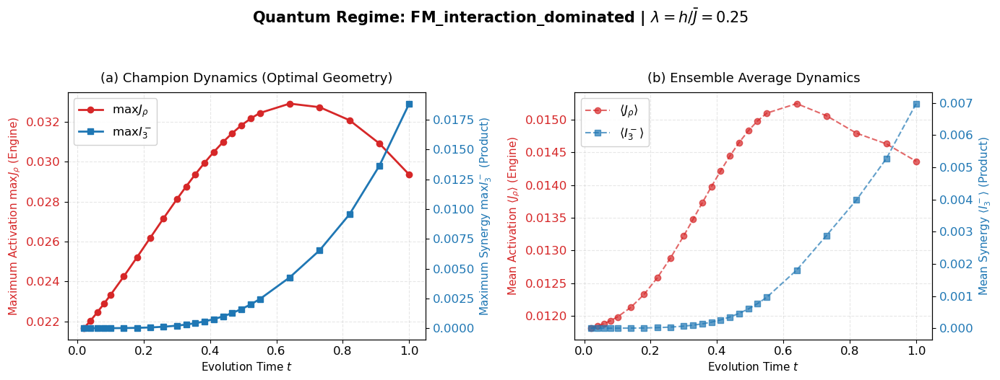

Saved: phase3_tfising_figures/step3D_trajectories\step3D_traj__FM_near_critical_like__FM_like_all_negative__D_with_TF__lambda-1.00.png


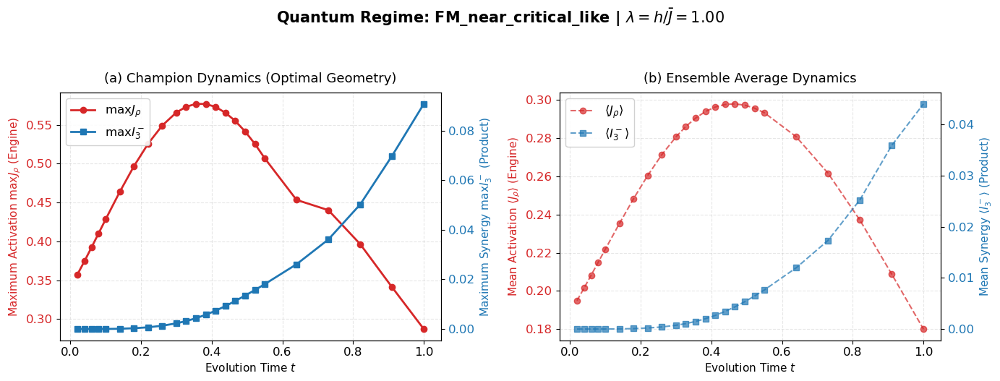

Saved: phase3_tfising_figures/step3D_trajectories\step3D_traj__FM_field_dominated__FM_like_all_negative__D_with_TF__lambda-2.00.png


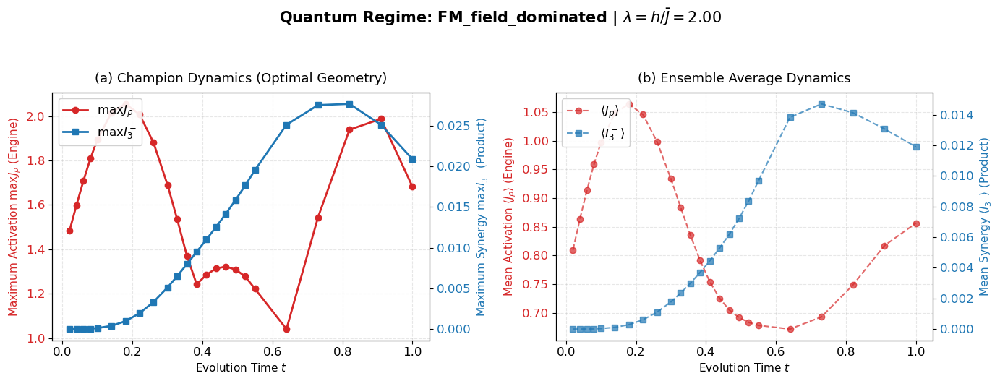

Saved: phase3_tfising_figures/step3D_trajectories\step3D_traj__AFM_near_critical_like__AFM_like_all_positive__D_with_TF__lambda-1.00.png


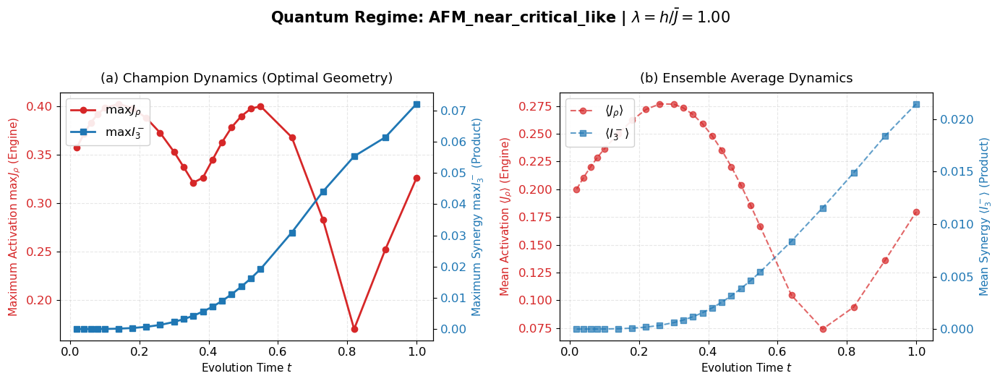

In [34]:
# Phase3 Step 3D — Trajectory plots: J_rho, J_tot, and I3_minus over time
#
# Purpose:
#   For each TF-Ising regime, visualize the time trajectories of:
#       max I3_minus
#       mean I3_minus
#       max J_rho
#       mean J_rho
#       constant J_tot reference
#
# Also:
#   Save each figure as a PNG file.

import os
import re

required_cols_3D = [
    "regime_label",
    "description",
    "lambda_h_over_Jbar",
    "t",
    "max_I3_minus",
    "mean_I3_minus",
    "max_J_rho_exp",
    "mean_J_rho_exp",
    "mean_J_tot",
    "J_tot_analytic",
]

missing_cols_3D = [c for c in required_cols_3D if c not in df_tfising_regime_summary.columns]
if missing_cols_3D:
    raise ValueError(f"Missing columns in df_tfising_regime_summary: {missing_cols_3D}")

def normalize_curve_for_plot(x):
    x = np.asarray(x, dtype=float)
    xmax = np.nanmax(np.abs(x))
    if xmax < 1e-14:
        return np.zeros_like(x)
    return x / xmax

def sanitize_tag(x):
    x = str(x)
    x = x.replace(" ", "_")
    x = x.replace("/", "_")
    x = x.replace("\\", "_")
    x = x.replace("=", "-")
    x = x.replace(":", "-")
    x = re.sub(r"[^A-Za-z0-9_\-\.]", "", x)
    return x

save_dir_3D = "phase3_tfising_figures/step3D_trajectories"
os.makedirs(save_dir_3D, exist_ok=True)

for regime_label in df_tfising_regime_summary["regime_label"].unique():
    df_r = (
        df_tfising_regime_summary[
            df_tfising_regime_summary["regime_label"] == regime_label
        ]
        .sort_values("t")
        .copy()
    )

    desc = df_r["description"].iloc[0]
    lam = df_r["lambda_h_over_Jbar"].iloc[0]

    sign_label = df_r["sign_label"].iloc[0] if "sign_label" in df_r.columns else "sign_unknown"
    env_label = df_r["env_label"].iloc[0] if "env_label" in df_r.columns else "env_unknown"

    t_arr = df_r["t"].values

    I3_max = df_r["max_I3_minus"].values.astype(float)
    I3_mean = df_r["mean_I3_minus"].values.astype(float)

    Jr_max = df_r["max_J_rho_exp"].values.astype(float)
    Jr_mean = df_r["mean_J_rho_exp"].values.astype(float)

    Jtot_mean = df_r["mean_J_tot"].values.astype(float)
    Jtot_analytic = df_r["J_tot_analytic"].values.astype(float)

# ------------------ 替换你原有的 fig, axes = ... 以下的代码 ------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    ax1, ax2 = axes
    
    # === Panel 1: The Champion Geometry (Max values) ===
    # 专门追踪那个产出最高协同的“冠军三角形”的动力学演化
    color_j = '#d62728' # 红色代表代数引擎 (J_rho)
    color_i = '#1f77b4' # 蓝色代表协同产物 (I3-)
    
    ax1.set_xlabel("Evolution Time $t$", fontsize=11)
    ax1.set_ylabel(r"Maximum Activation $\max J_\rho$ (Engine)", color=color_j, fontsize=11)
    line1 = ax1.plot(t_arr, Jr_max, marker="o", color=color_j, linewidth=2, label=r"$\max J_\rho$")
    ax1.tick_params(axis='y', labelcolor=color_j)
    
    # 使用双 Y 轴
    ax1_twin = ax1.twinx()
    ax1_twin.set_ylabel(r"Maximum Synergy $\max I_3^-$ (Product)", color=color_i, fontsize=11)
    line2 = ax1_twin.plot(t_arr, I3_max, marker="s", color=color_i, linewidth=2, label=r"$\max I_3^-$")
    ax1_twin.tick_params(axis='y', labelcolor=color_i)
    
    ax1.set_title("(a) Champion Dynamics (Optimal Geometry)", fontsize=13, pad=10)
    ax1.grid(alpha=0.3, linestyle='--')
    
    # 合并图例
    lines = line1 + line2
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper left', framealpha=0.9)

    # === Panel 2: The Ensemble Average (Mean values) ===
    # 追踪所有 400 个三角形的平均表现，看看宏观相的热化趋势
    ax2.set_xlabel("Evolution Time $t$", fontsize=11)
    ax2.set_ylabel(r"Mean Activation $\langle J_\rho \rangle$ (Engine)", color=color_j, fontsize=11)
    line3 = ax2.plot(t_arr, Jr_mean, marker="o", linestyle="--", color=color_j, alpha=0.7, label=r"$\langle J_\rho \rangle$")
    ax2.tick_params(axis='y', labelcolor=color_j)
    
    ax2_twin = ax2.twinx()
    ax2_twin.set_ylabel(r"Mean Synergy $\langle I_3^- \rangle$ (Product)", color=color_i, fontsize=11)
    line4 = ax2_twin.plot(t_arr, I3_mean, marker="s", linestyle="--", color=color_i, alpha=0.7, label=r"$\langle I_3^- \rangle$")
    ax2_twin.tick_params(axis='y', labelcolor=color_i)
    
    ax2.set_title("(b) Ensemble Average Dynamics", fontsize=13, pad=10)
    ax2.grid(alpha=0.3, linestyle='--')
    
    lines_mean = line3 + line4
    labels_mean = [l.get_label() for l in lines_mean]
    ax2.legend(lines_mean, labels_mean, loc='upper left', framealpha=0.9)

    # 总标题
    fig.suptitle(fr"Quantum Regime: {regime_label} | $\lambda = h/\bar{{J}} = {lam:.2f}$", fontsize=15, fontweight='bold', y=1.05)
    
    plt.tight_layout()
    # 下面保留你原来的 savefig 和 plt.show() 代码
    # ...

    fname_3D = (
        f"step3D_traj__"
        f"{sanitize_tag(regime_label)}__"
        f"{sanitize_tag(sign_label)}__"
        f"{sanitize_tag(env_label)}__"
        f"lambda-{lam:.2f}.png"
    )
    fpath_3D = os.path.join(save_dir_3D, fname_3D)

    plt.tight_layout()
    fig.savefig(fpath_3D, dpi=300, bbox_inches="tight")
    print(f"Saved: {fpath_3D}")
    plt.show()

Saved: phase3_tfising_figures/step3E_correlations\step3E_corr__FM_interaction_dominated__FM_like_all_negative__D_with_TF__lambda-0.25.png


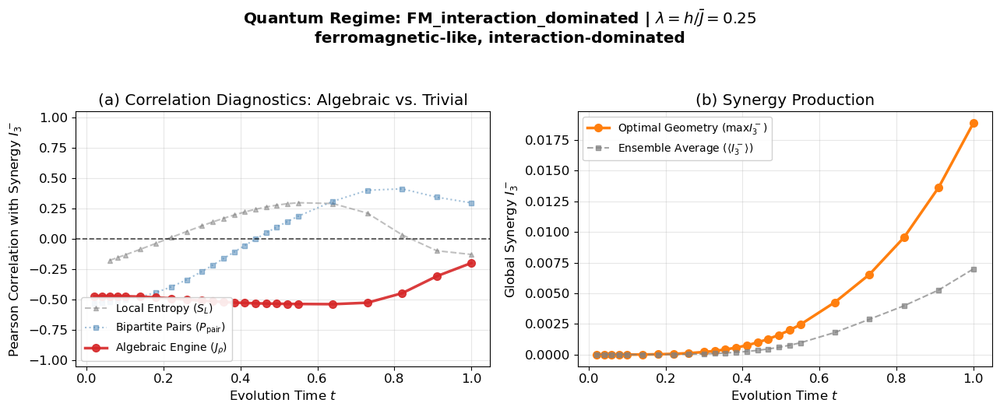

Saved: phase3_tfising_figures/step3E_correlations\step3E_corr__FM_near_critical_like__FM_like_all_negative__D_with_TF__lambda-1.00.png


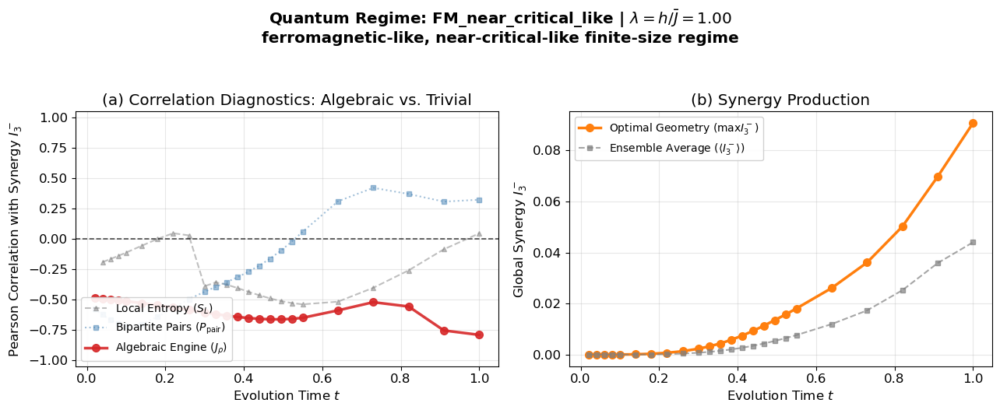

Saved: phase3_tfising_figures/step3E_correlations\step3E_corr__FM_field_dominated__FM_like_all_negative__D_with_TF__lambda-2.00.png


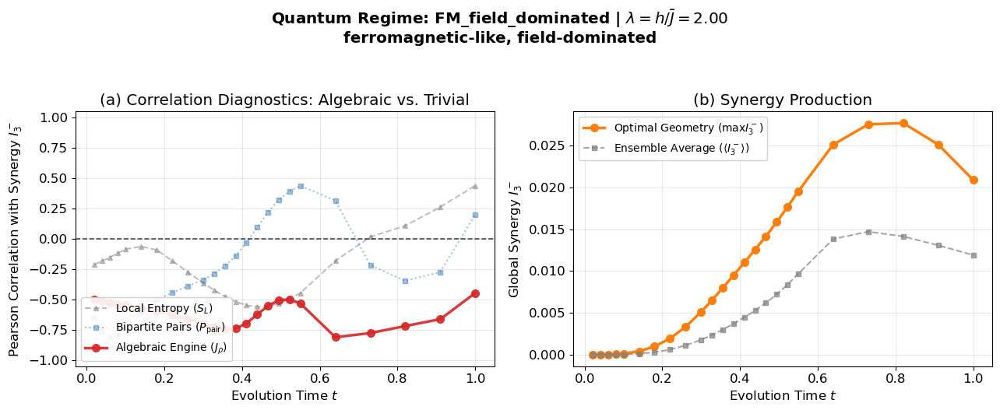

Saved: phase3_tfising_figures/step3E_correlations\step3E_corr__AFM_near_critical_like__AFM_like_all_positive__D_with_TF__lambda-1.00.png


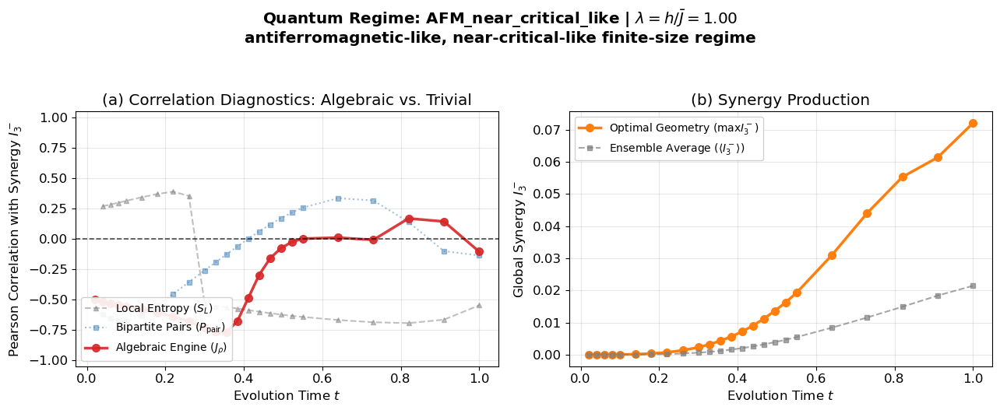

=== Phase3 Step 3E — Correlation overview ===


,regime_label,lambda_h_over_Jbar,max_corr_Jrho,min_corr_Jrho,mean_corr_Jrho,max_corr_SL,min_corr_SL,max_I3_minus,mean_peak_I3,max_std_Jtot
0,AFM_near_critical_like,1.00,0.168594,-0.769208,-0.372866,0.388828,-0.694515,0.072092,0.021451,0.0
1,FM_field_dominated,2.00,-0.446009,-0.811107,-0.616773,0.438495,-0.560851,0.027682,0.014707,0.0
2,FM_interaction_dominated,0.25,-0.199118,-0.538415,-0.483361,0.297916,-0.176594,0.018864,0.006980,0.0
3,FM_near_critical_like,1.00,-0.484279,-0.791547,-0.599815,0.046444,-0.539735,0.090725,0.044019,0.0


In [36]:
# Phase3 Step 3E — Phase-1-style within-regime correlation plots
#
# Purpose:
#   For each fixed TF-Ising regime, compute and visualize correlations
#   across the theta-phi grid at each time point.
#
# Also:
#   Save each figure as a PNG file.

import os
import re

required_cols_3E = [
    "regime_label",
    "description",
    "lambda_h_over_Jbar",
    "t",
    "corr_J_rho_exp",
    "corr_eta",
    "corr_S_L",
    "corr_P_pair",
    "corr_N_pair_sum",
    "corr_J_tot",
    "max_I3_minus",
    "mean_I3_minus",
    "std_J_tot",
]

missing_cols_3E = [c for c in required_cols_3E if c not in df_tfising_regime_summary.columns]
if missing_cols_3E:
    raise ValueError(f"Missing columns in df_tfising_regime_summary: {missing_cols_3E}")

def sanitize_tag(x):
    x = str(x)
    x = x.replace(" ", "_")
    x = x.replace("/", "_")
    x = x.replace("\\", "_")
    x = x.replace("=", "-")
    x = x.replace(":", "-")
    x = re.sub(r"[^A-Za-z0-9_\-\.]", "", x)
    return x

save_dir_3E = "phase3_tfising_figures/step3E_correlations"
os.makedirs(save_dir_3E, exist_ok=True)

for regime_label in df_tfising_regime_summary["regime_label"].unique():
    df_r = (
        df_tfising_regime_summary[
            df_tfising_regime_summary["regime_label"] == regime_label
        ]
        .sort_values("t")
        .copy()
    )

    desc = df_r["description"].iloc[0]
    lam = df_r["lambda_h_over_Jbar"].iloc[0]

    sign_label = df_r["sign_label"].iloc[0] if "sign_label" in df_r.columns else "sign_unknown"
    env_label = df_r["env_label"].iloc[0] if "env_label" in df_r.columns else "env_unknown"

    t_arr = df_r["t"].values

# ------------------ 替换原有的 fig, axes = ... 以下的代码 ------------------
    fig, axes = plt.subplots(1, 2, figsize=(13, 5))
    ax1, ax2 = axes

    # === Panel 1: Protagonist vs. Trivial Baselines ===
    # 我们要证明：只有代数引擎 (J_rho) 真正与高阶协同 (I3-) 强相关
    # 而普通的二体关联 (P_pair) 或局域纠缠 (S_L) 只是平庸的背景

    # 1. 画平庸的对照组 (灰色/浅色, 细线)
    ax1.plot(t_arr, df_r["corr_S_L"].values, marker="^", markersize=5, linestyle="--", 
             color="gray", alpha=0.5, linewidth=1.5, label=r"Local Entropy ($S_L$)")
    ax1.plot(t_arr, df_r["corr_P_pair"].values, marker="s", markersize=5, linestyle=":", 
             color="steelblue", alpha=0.5, linewidth=1.5, label=r"Bipartite Pairs ($P_{\rm pair}$)")
    
    # 2. 画绝对的主角 (鲜红色, 粗线, 带阴影)
    ax1.plot(t_arr, df_r["corr_J_rho_exp"].values, marker="o", markersize=7, linestyle="-", 
             color="#d62728", alpha=0.9, linewidth=2.5, label=r"Algebraic Engine ($J_{\rho}$)")

    ax1.axhline(0.0, color="black", linewidth=1.2, linestyle="--", alpha=0.7)
    ax1.set_xlabel("Evolution Time $t$")
    ax1.set_ylabel(r"Pearson Correlation with Synergy $I_3^-$")
    ax1.set_title("(a) Correlation Diagnostics: Algebraic vs. Trivial")
    ax1.set_ylim(-1.05, 1.05)
    ax1.grid(alpha=0.3)
    ax1.legend(loc='lower left', framealpha=0.9, fontsize=10)

    # === Panel 2: Generated Tripartite Signal ===
    # 用双线对比，展示“最优几何”是如何把“平均几何”按在地上摩擦的
    ax2.plot(t_arr, df_r["max_I3_minus"].values, marker="o", markersize=7, 
             color="#ff7f0e", linewidth=2.5, label=r"Optimal Geometry ($\max I_3^-$)")
    ax2.plot(t_arr, df_r["mean_I3_minus"].values, marker="s", markersize=5, linestyle="--", 
             color="gray", alpha=0.7, linewidth=1.5, label=r"Ensemble Average ($\langle I_3^- \rangle$)")

    ax2.set_xlabel("Evolution Time $t$")
    ax2.set_ylabel(r"Global Synergy $I_3^-$")
    ax2.set_title("(b) Synergy Production")
    ax2.grid(alpha=0.3)
    ax2.legend(loc='upper left', framealpha=0.9, fontsize=10)

    # 标题与保存
    fig.suptitle(fr"Quantum Regime: {regime_label} | $\lambda=h/\bar{{J}}={lam:.2f}$" + "\n" + desc, y=1.05, fontweight='bold')
    
    plt.tight_layout()
    # ... 保留你原来的 savefig 代码 ...

    fname_3E = (
        f"step3E_corr__"
        f"{sanitize_tag(regime_label)}__"
        f"{sanitize_tag(sign_label)}__"
        f"{sanitize_tag(env_label)}__"
        f"lambda-{lam:.2f}.png"
    )
    fpath_3E = os.path.join(save_dir_3E, fname_3E)

    plt.tight_layout()
    fig.savefig(fpath_3E, dpi=300, bbox_inches="tight")
    print(f"Saved: {fpath_3E}")
    plt.show()

# Compact numerical overview.
corr_overview = (
    df_tfising_regime_summary
    .groupby("regime_label")
    .agg(
        lambda_h_over_Jbar=("lambda_h_over_Jbar", "first"),
        max_corr_Jrho=("corr_J_rho_exp", "max"),
        min_corr_Jrho=("corr_J_rho_exp", "min"),
        mean_corr_Jrho=("corr_J_rho_exp", "mean"),
        max_corr_SL=("corr_S_L", "max"),
        min_corr_SL=("corr_S_L", "min"),
        max_I3_minus=("max_I3_minus", "max"),
        mean_peak_I3=("mean_I3_minus", "max"),
        max_std_Jtot=("std_J_tot", "max"),
    )
    .reset_index()
)

print("=== Phase3 Step 3E — Correlation overview ===")
display(corr_overview.round(8))

=== Phase3 Step 3F — Cross-regime comparison ===


,regime_label,description,lambda_h_over_Jbar,h,Jbar_RMS,R_internal_norm,J_tot_analytic,t_peak_I3,max_I3_minus,mean_I3_minus_at_peak,...,corr_SL_I3_t050,corr_SL_I3_t100,corr_Ppair_I3_t010,corr_Ppair_I3_t025,corr_Ppair_I3_t050,corr_Ppair_I3_t100,corr_Npair_I3_t010,corr_Npair_I3_t025,corr_Npair_I3_t050,corr_Npair_I3_t100
0,FM_interaction_dominated,"ferromagnetic-like, interaction-dominated",0.25,0.25,1.0,1.732051,0.108253,1.00,0.018864,0.006980,...,0.278195,-0.128486,-0.502094,-0.336964,0.097461,0.296606,-0.028963,0.030469,-0.333359,-0.056872
1,FM_near_critical_like,"ferromagnetic-like, near-critical-like finite-...",1.00,1.00,1.0,1.732051,1.732051,1.00,0.090725,0.044019,...,-0.512414,0.045395,-0.717404,-0.498032,-0.097181,0.322753,-0.012123,-0.000533,-0.251229,0.071780
2,FM_field_dominated,"ferromagnetic-like, field-dominated",2.00,2.00,1.0,1.732051,6.928203,0.82,0.027682,0.014130,...,-0.533152,0.438495,-0.728751,-0.392035,0.322458,0.202139,-0.001666,0.020777,0.229552,0.357355
3,AFM_near_critical_like,"antiferromagnetic-like, near-critical-like fin...",1.00,1.00,1.0,1.732051,1.732051,1.00,0.072092,0.021451,...,-0.624181,-0.548085,-0.678405,-0.356560,0.170136,-0.137429,-0.022610,-0.014476,-0.229955,0.189507



Saved: phase3_tfising_outputs/step3F_cross_regime\phase3_tfising_cross_regime_comparison.csv
Saved: phase3_tfising_outputs/step3F_cross_regime\phase3_tfising_cross_regime_comparison.png


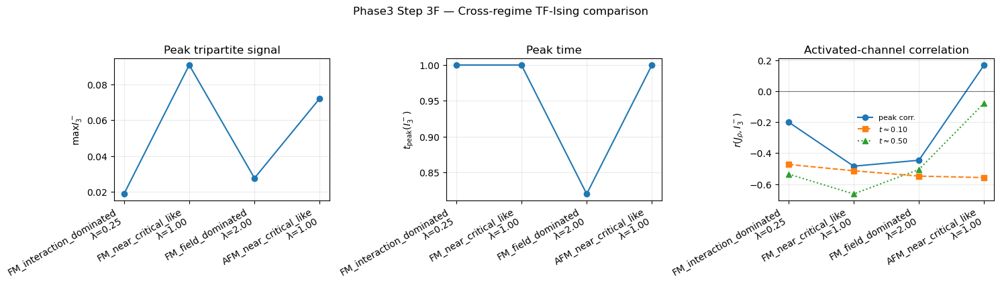

In [23]:
# Phase3 Step 3F — Cross-regime comparison: t_peak, max signal, and activated-channel correlation
#
# Purpose:
#   Compare different TF-Ising finite-size regimes:
#       FM interaction-dominated
#       FM near-critical-like
#       FM field-dominated
#       AFM near-critical-like
#
# Main quantities:
#   1. Peak tripartite signal: max I3_minus
#   2. Peak time: t_peak(I3_minus)
#   3. Peak activated-channel signal: max J_rho
#   4. Peak / early / mid / late r(J_rho, I3_minus)
#
# Output:
#   phase3_tfising_cross_regime_comparison.csv
#   phase3_tfising_cross_regime_comparison.png

import os
import re

save_dir_step3F = "phase3_tfising_outputs/step3F_cross_regime"
os.makedirs(save_dir_step3F, exist_ok=True)

def sanitize_filename_tag(x):
    x = str(x)
    x = x.replace(" ", "_")
    x = x.replace("/", "_")
    x = x.replace("\\", "_")
    x = x.replace("=", "-")
    x = x.replace(":", "-")
    x = re.sub(r"[^A-Za-z0-9_\-\.]", "", x)
    return x

def nearest_row_by_time(df, target_t):
    idx = int(np.argmin(np.abs(df["t"].values.astype(float) - target_t)))
    return df.iloc[idx]

def safe_idxmax(series):
    arr = np.asarray(series, dtype=float)
    if np.all(np.isnan(arr)):
        return None
    return int(np.nanargmax(arr))

required_cols_3F = [
    "regime_label",
    "description",
    "lambda_h_over_Jbar",
    "h",
    "Jbar_RMS",
    "R_internal_norm",
    "J_tot_analytic",
    "t",
    "max_I3_minus",
    "mean_I3_minus",
    "max_J_rho_exp",
    "mean_J_rho_exp",
    "corr_J_rho_exp",
    "corr_eta",
    "corr_S_L",
    "corr_P_pair",
    "corr_N_pair_sum",
    "theta_at_max_I3",
    "phi_at_max_I3",
]

missing_cols_3F = [c for c in required_cols_3F if c not in df_tfising_regime_summary.columns]
if missing_cols_3F:
    raise ValueError(f"Missing columns in df_tfising_regime_summary: {missing_cols_3F}")

cross_regime_rows = []

for regime_label in df_tfising_regime_summary["regime_label"].unique():
    df_r = (
        df_tfising_regime_summary[
            df_tfising_regime_summary["regime_label"] == regime_label
        ]
        .sort_values("t")
        .copy()
    )

    idx_peak_I3 = safe_idxmax(df_r["max_I3_minus"])
    idx_peak_Jrho = safe_idxmax(df_r["max_J_rho_exp"])
    idx_peak_corr = safe_idxmax(df_r["corr_J_rho_exp"])

    if idx_peak_I3 is None:
        continue

    row_peak_I3 = df_r.iloc[idx_peak_I3]
    row_peak_Jrho = df_r.iloc[idx_peak_Jrho] if idx_peak_Jrho is not None else row_peak_I3
    row_peak_corr = df_r.iloc[idx_peak_corr] if idx_peak_corr is not None else row_peak_I3

    row_t010 = nearest_row_by_time(df_r, 0.10)
    row_t025 = nearest_row_by_time(df_r, 0.25)
    row_t050 = nearest_row_by_time(df_r, 0.50)
    row_t100 = nearest_row_by_time(df_r, 1.00)

    row = {
        "regime_label": regime_label,
        "description": row_peak_I3["description"],
        "lambda_h_over_Jbar": float(row_peak_I3["lambda_h_over_Jbar"]),
        "h": float(row_peak_I3["h"]),
        "Jbar_RMS": float(row_peak_I3["Jbar_RMS"]),
        "R_internal_norm": float(row_peak_I3["R_internal_norm"]),
        "J_tot_analytic": float(row_peak_I3["J_tot_analytic"]),

        # Peak tripartite signal
        "t_peak_I3": float(row_peak_I3["t"]),
        "max_I3_minus": float(row_peak_I3["max_I3_minus"]),
        "mean_I3_minus_at_peak": float(row_peak_I3["mean_I3_minus"]),
        "theta_at_peak_I3": float(row_peak_I3["theta_at_max_I3"]),
        "phi_at_peak_I3": float(row_peak_I3["phi_at_max_I3"]),

        # Peak activated associator
        "t_peak_Jrho": float(row_peak_Jrho["t"]),
        "max_J_rho_exp": float(row_peak_Jrho["max_J_rho_exp"]),
        "mean_J_rho_exp_at_Jrho_peak": float(row_peak_Jrho["mean_J_rho_exp"]),

        # Peak correlation
        "t_peak_corr_Jrho": float(row_peak_corr["t"]),
        "peak_corr_Jrho_I3": float(row_peak_corr["corr_J_rho_exp"]),

        # Representative-time correlations
        "corr_Jrho_I3_t010": float(row_t010["corr_J_rho_exp"]),
        "corr_Jrho_I3_t025": float(row_t025["corr_J_rho_exp"]),
        "corr_Jrho_I3_t050": float(row_t050["corr_J_rho_exp"]),
        "corr_Jrho_I3_t100": float(row_t100["corr_J_rho_exp"]),

        "corr_SL_I3_t010": float(row_t010["corr_S_L"]),
        "corr_SL_I3_t025": float(row_t025["corr_S_L"]),
        "corr_SL_I3_t050": float(row_t050["corr_S_L"]),
        "corr_SL_I3_t100": float(row_t100["corr_S_L"]),

        "corr_Ppair_I3_t010": float(row_t010["corr_P_pair"]),
        "corr_Ppair_I3_t025": float(row_t025["corr_P_pair"]),
        "corr_Ppair_I3_t050": float(row_t050["corr_P_pair"]),
        "corr_Ppair_I3_t100": float(row_t100["corr_P_pair"]),

        "corr_Npair_I3_t010": float(row_t010["corr_N_pair_sum"]),
        "corr_Npair_I3_t025": float(row_t025["corr_N_pair_sum"]),
        "corr_Npair_I3_t050": float(row_t050["corr_N_pair_sum"]),
        "corr_Npair_I3_t100": float(row_t100["corr_N_pair_sum"]),
    }

    cross_regime_rows.append(row)

df_tfising_cross_regime = pd.DataFrame(cross_regime_rows)

# Keep a readable ordering if these regimes exist.
preferred_order = [
    "FM_interaction_dominated",
    "FM_near_critical_like",
    "FM_field_dominated",
    "AFM_near_critical_like",
]
order_map = {name: i for i, name in enumerate(preferred_order)}
df_tfising_cross_regime["plot_order"] = df_tfising_cross_regime["regime_label"].map(
    lambda x: order_map.get(x, 999)
)
df_tfising_cross_regime = (
    df_tfising_cross_regime
    .sort_values(["plot_order", "lambda_h_over_Jbar", "regime_label"])
    .drop(columns=["plot_order"])
    .reset_index(drop=True)
)

print("=== Phase3 Step 3F — Cross-regime comparison ===")
display(df_tfising_cross_regime.round(8))

# Save table.
cross_regime_csv = os.path.join(
    save_dir_step3F,
    "phase3_tfising_cross_regime_comparison.csv"
)
df_tfising_cross_regime.to_csv(cross_regime_csv, index=False)
print(f"\nSaved: {cross_regime_csv}")

# -------------------------
# Figure: cross-regime overview
# -------------------------

x_pos = np.arange(len(df_tfising_cross_regime))

x_labels = [
    f"{r}\nλ={lam:.2f}"
    for r, lam in zip(
        df_tfising_cross_regime["regime_label"],
        df_tfising_cross_regime["lambda_h_over_Jbar"],
    )
]

fig, axes = plt.subplots(1, 3, figsize=(15.0, 4.2))

ax1, ax2, ax3 = axes

# Panel 1 — Peak tripartite signal
ax1.plot(
    x_pos,
    df_tfising_cross_regime["max_I3_minus"].values,
    marker="o",
)
ax1.set_xticks(x_pos)
ax1.set_xticklabels(x_labels, rotation=30, ha="right")
ax1.set_ylabel(r"$\max I_3^-$")
ax1.set_title("Peak tripartite signal")
ax1.grid(alpha=0.25)

# Panel 2 — Peak time
ax2.plot(
    x_pos,
    df_tfising_cross_regime["t_peak_I3"].values,
    marker="o",
)
ax2.set_xticks(x_pos)
ax2.set_xticklabels(x_labels, rotation=30, ha="right")
ax2.set_ylabel(r"$t_{\rm peak}(I_3^-)$")
ax2.set_title("Peak time")
ax2.grid(alpha=0.25)

# Panel 3 — Activated-channel correlation
ax3.plot(
    x_pos,
    df_tfising_cross_regime["peak_corr_Jrho_I3"].values,
    marker="o",
    label="peak corr."
)
ax3.plot(
    x_pos,
    df_tfising_cross_regime["corr_Jrho_I3_t010"].values,
    marker="s",
    linestyle="--",
    label=r"$t\approx0.10$"
)
ax3.plot(
    x_pos,
    df_tfising_cross_regime["corr_Jrho_I3_t050"].values,
    marker="^",
    linestyle=":",
    label=r"$t\approx0.50$"
)
ax3.axhline(0.0, color="k", linewidth=0.8, alpha=0.5)
ax3.set_xticks(x_pos)
ax3.set_xticklabels(x_labels, rotation=30, ha="right")
ax3.set_ylabel(r"$r(J_\rho,I_3^-)$")
ax3.set_title("Activated-channel correlation")
ax3.grid(alpha=0.25)
ax3.legend(frameon=False, fontsize=8)

fig.suptitle("Phase3 Step 3F — Cross-regime TF-Ising comparison", y=1.03)

plt.tight_layout()

cross_regime_png = os.path.join(
    save_dir_step3F,
    "phase3_tfising_cross_regime_comparison.png"
)
fig.savefig(cross_regime_png, dpi=300, bbox_inches="tight")
print(f"Saved: {cross_regime_png}")

plt.show()

First analysis of Step 3

In [24]:
# 加载你刚才保存的合并 Summary 文件
df_sum = pd.read_csv("phase3_tfising_outputs/step3C_regime_scans/phase3_tfising_regime_scan_summary_ALL.csv")

print("=== 🏆 Maximum Synergy (I3-) by Regime ===")
peak_synergy = df_sum.groupby('regime_label')['max_I3_minus'].max().sort_values(ascending=False)
print(peak_synergy)

print("\n=== ⚙️ Maximum State Activation (J_rho_exp) by Regime ===")
peak_activation = df_sum.groupby('regime_label')['max_J_rho_exp'].max().sort_values(ascending=False)
print(peak_activation)

=== 🏆 Maximum Synergy (I3-) by Regime ===
regime_label
FM_near_critical_like       0.090725
AFM_near_critical_like      0.072092
FM_field_dominated          0.027682
FM_interaction_dominated    0.018864
Name: max_I3_minus, dtype: float64

=== ⚙️ Maximum State Activation (J_rho_exp) by Regime ===
regime_label
FM_field_dominated          2.054914
FM_near_critical_like       0.577040
AFM_near_critical_like      0.402499
FM_interaction_dominated    0.032915
Name: max_J_rho_exp, dtype: float64


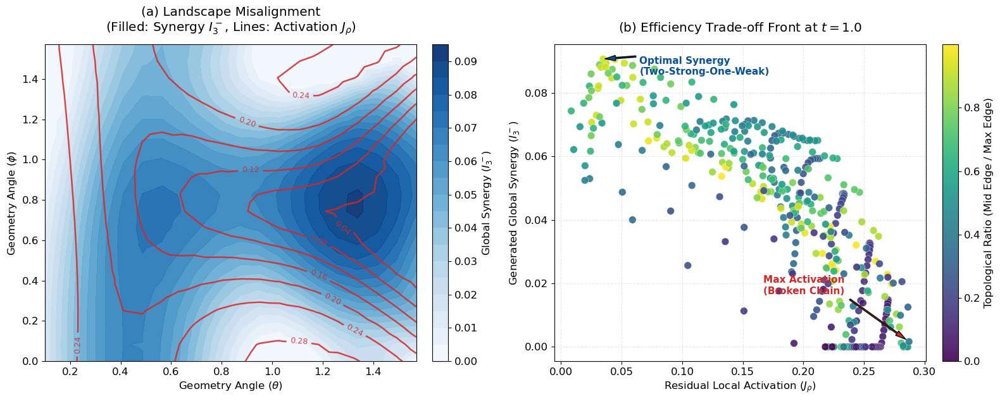

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# Phase 3: Data Analysis - Geometric Efficiency Trade-off
# ==========================================

# 1. 读取数据并锁定 FM_near_critical_like 在演化末期 t = 1.0 的截面
df = pd.read_csv("phase3_tfising_outputs/step3C_regime_scans/phase3_tfising_regime_scan_records_ALL.csv")
df_t1 = df[(np.isclose(df['t'], 1.0)) & (df['regime_label'] == 'FM_near_critical_like')].copy()

# 2. 计算全新的 "拓扑畸变度" (中间边 / 最长边)
# 取出三条边的绝对值
edges_abs = df_t1[['J_AB', 'J_BC', 'J_AC']].abs().values
# 对每行的三条边进行升序排序 ([:, 0]是最短边, [:, 1]是中间边, [:, 2]是最长边)
edges_sorted = np.sort(edges_abs, axis=1)

# 计算新指标：Mid / Max
# 接近 0 代表 "断链" (一强两弱，中间边也很弱)
# 接近 1 代表 "两强一弱" 或 "等边" (中间边和最长边差不多强)
df_t1['new_topology_ratio'] = edges_sorted[:, 1] / edges_sorted[:, 2]

# ==========================================
# 开始作图：PRL风格 1x2 双拼图
# ==========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 6.5))
plt.rcParams.update({'font.size': 12})

# ------------------------------------------
# 左图 (a): 拓扑地形图 (等高线 + 热力图)
# ------------------------------------------
# 协同信号 (I3-) 作为平滑的蓝色背景
tcf = axes[0].tricontourf(df_t1['theta'], df_t1['phi'], df_t1['I3_minus'], 
                          levels=20, cmap='Blues', alpha=0.95)
# 态激活 (J_rho) 作为红色的地形等高线
tc = axes[0].tricontour(df_t1['theta'], df_t1['phi'], df_t1['J_rho_exp'], 
                        levels=6, colors='#d62728', linewidths=1.8, alpha=0.85)

# 在等高线上打上 J_rho 的具体数值标签
axes[0].clabel(tc, inline=True, fontsize=9, fmt='%1.2f')

axes[0].set_title('(a) Landscape Misalignment\n(Filled: Synergy $I_3^-$, Lines: Activation $J_\\rho$)', pad=15)
axes[0].set_xlabel('Geometry Angle ($\\theta$)')
axes[0].set_ylabel('Geometry Angle ($\\phi$)')

# 给背景的蓝色 Synergy 添加独立的 Colorbar
cbar_a = fig.colorbar(tcf, ax=axes[0], fraction=0.046, pad=0.04)
cbar_a.set_label('Global Synergy ($I_3^-$)')

# ------------------------------------------
# 右图 (b): 净化后的零和转化前沿 (使用新指标上色)
# ------------------------------------------
# 使用 new_topology_ratio 映射颜色
scatter = axes[1].scatter(df_t1['J_rho_exp'], df_t1['I3_minus'], 
                          c=df_t1['new_topology_ratio'], cmap='viridis', 
                          s=70, edgecolor='white', linewidth=0.3, alpha=0.9)

champ_idx = df_t1['I3_minus'].idxmax()
broken_idx = df_t1['J_rho_exp'].idxmax()

# 优雅的短距离标注：最优协同
axes[1].annotate('Optimal Synergy\n(Two-Strong-One-Weak)', 
                 xy=(df_t1.loc[champ_idx, 'J_rho_exp'], df_t1.loc[champ_idx, 'I3_minus']),
                 xytext=(df_t1.loc[champ_idx, 'J_rho_exp'] + 0.03, df_t1.loc[champ_idx, 'I3_minus'] - 0.005),
                 fontsize=11, fontweight='bold', color='#08519c',
                 arrowprops=dict(facecolor='#08519c', shrink=0.05, width=1.5, headwidth=6))

# 优雅的短距离标注：最大激活
axes[1].annotate('Max Activation\n(Broken Chain)', 
                 xy=(df_t1.loc[broken_idx, 'J_rho_exp'], df_t1.loc[broken_idx, 'I3_minus']),
                 xytext=(df_t1.loc[broken_idx, 'J_rho_exp'] - 0.12, df_t1.loc[broken_idx, 'I3_minus'] + 0.015),
                 fontsize=11, fontweight='bold', color='#d62728',
                 arrowprops=dict(facecolor='#d62728', shrink=0.05, width=1.5, headwidth=6))

axes[1].set_title('(b) Efficiency Trade-off Front at $t=1.0$', pad=15)
axes[1].set_xlabel('Residual Local Activation ($J_\\rho$)')
axes[1].set_ylabel('Generated Global Synergy ($I_3^-$)')
axes[1].grid(True, linestyle='--', alpha=0.3)

# 标明新的图例含义
cbar_b = fig.colorbar(scatter, ax=axes[1], fraction=0.046, pad=0.04)
cbar_b.set_label('Topological Ratio (Mid Edge / Max Edge)')

plt.tight_layout()
plt.show()

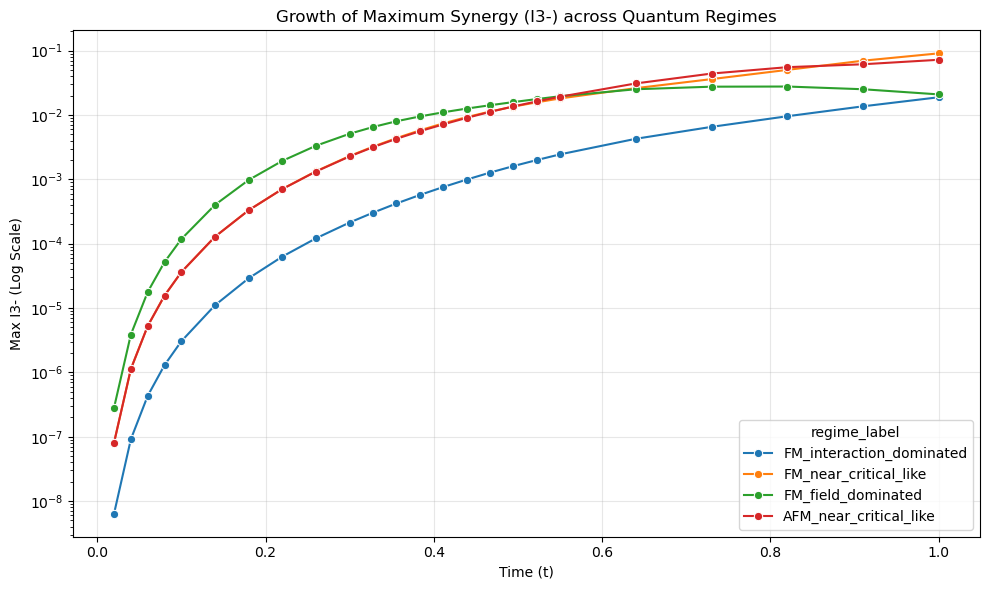

In [27]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_sum, x='t', y='max_I3_minus', hue='regime_label', marker='o')
plt.title('Growth of Maximum Synergy (I3-) across Quantum Regimes')
plt.ylabel('Max I3- (Log Scale)')
plt.xlabel('Time (t)')
plt.yscale('log') # 使用对数坐标更能看清早期的爆发
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

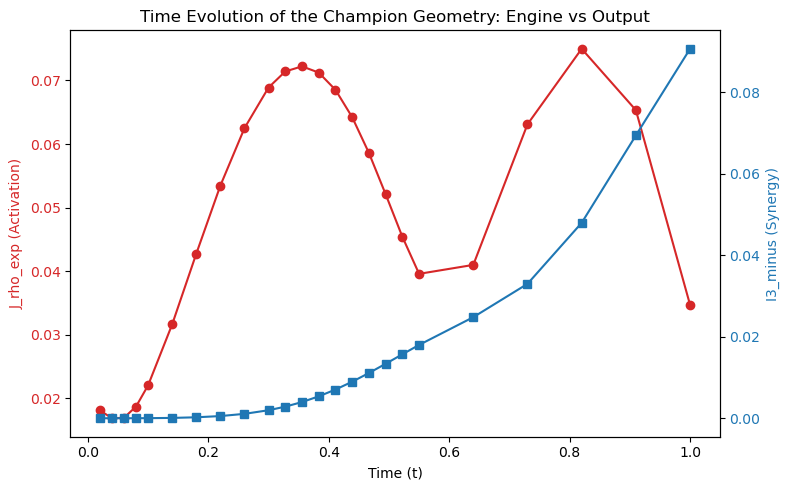

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# 读取你的数据
df = pd.read_csv("phase3_tfising_outputs/step3C_regime_scans/phase3_tfising_regime_scan_records_ALL.csv")

# 筛选出那个最强协同相
df_fm_crit = df[df['regime_label'] == 'FM_near_critical_like']

# 找出 t=1.0 时产生最高 I3_minus 的那个坐标 (我们之前看到的冠军坐标)
df_t1 = df_fm_crit[df_fm_crit['t'] == 1.0]
champ_row = df_t1.loc[df_t1['I3_minus'].idxmax()]
champ_theta = champ_row['theta']
champ_phi = champ_row['phi']

# 把这个冠军三角形的所有时间点数据提取出来
df_champ_time = df_fm_crit[(df_fm_crit['theta'] == champ_theta) & (df_fm_crit['phi'] == champ_phi)].sort_values('t')

# 画图：看 J_rho_exp 是如何随时间“驱动” I3_minus 的
fig, ax1 = plt.subplots(figsize=(8, 5))

# 绘制态激活 J_rho (引擎)
color1 = 'tab:red'
ax1.set_xlabel('Time (t)')
ax1.set_ylabel('J_rho_exp (Activation)', color=color1)
ax1.plot(df_champ_time['t'], df_champ_time['J_rho_exp'], color=color1, marker='o', label='J_rho_exp')
ax1.tick_params(axis='y', labelcolor=color1)

# 绘制协同 I3_minus (产出)
ax2 = ax1.twinx()  
color2 = 'tab:blue'
ax2.set_ylabel('I3_minus (Synergy)', color=color2)
ax2.plot(df_champ_time['t'], df_champ_time['I3_minus'], color=color2, marker='s', label='I3_minus')
ax2.tick_params(axis='y', labelcolor=color2)

plt.title("Time Evolution of the Champion Geometry: Engine vs Output")
fig.tight_layout()
plt.show()

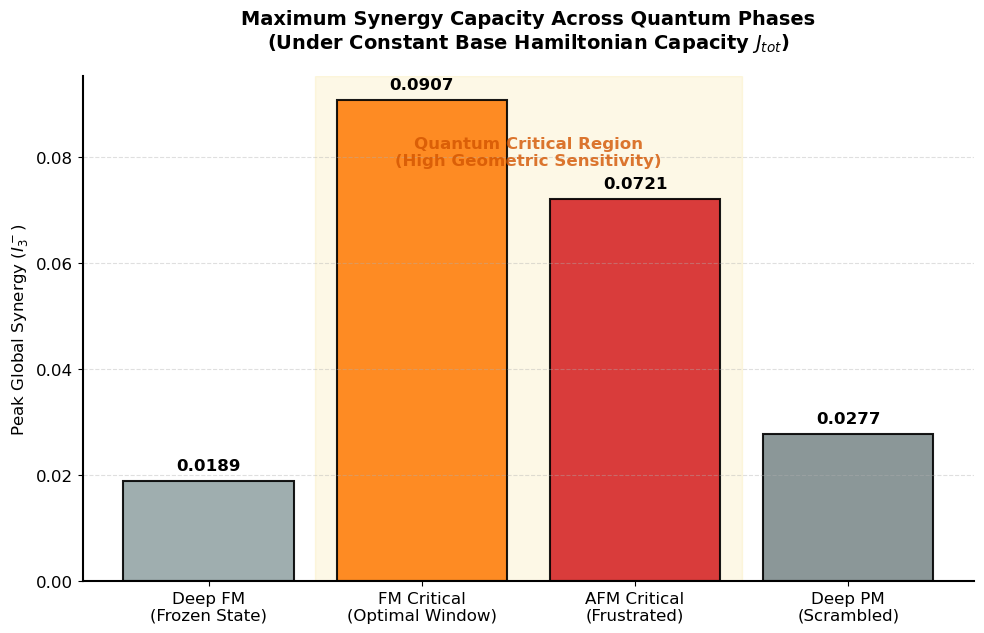

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================================
# Phase 3: Macro-Phase Comparison - The Critical Spot
# ==========================================

# 1. 读取汇总数据 (Summary)
df_sum = pd.read_csv("phase3_tfising_outputs/step3C_regime_scans/phase3_tfising_regime_scan_summary_ALL.csv")

# 2. 提取每个相的“峰值协同能力”
peak_synergy = df_sum.groupby('regime_label')['max_I3_minus'].max().reset_index()

# 3. 定义一个符合物理逻辑的 X 轴排序：
# 从左到右依次为：深铁磁 -> FM临界 -> AFM临界 -> 深顺磁
regime_order = [
    'FM_interaction_dominated', 
    'FM_near_critical_like', 
    'AFM_near_critical_like',
    'FM_field_dominated'
]

# 映射成更易读的标签
label_mapping = {
    'FM_interaction_dominated': 'Deep FM\n(Frozen State)',
    'FM_near_critical_like': 'FM Critical\n(Optimal Window)',
    'AFM_near_critical_like': 'AFM Critical\n(Frustrated)',
    'FM_field_dominated': 'Deep PM\n(Scrambled)'
}

# 应用排序和标签映射
peak_synergy['order'] = peak_synergy['regime_label'].map({k: i for i, k in enumerate(regime_order)})
peak_synergy = peak_synergy.sort_values('order')
peak_synergy['display_label'] = peak_synergy['regime_label'].map(label_mapping)

# ==========================================
# 开始作图：不同量子相的协同容量
# ==========================================
fig, ax = plt.subplots(figsize=(10, 6.5))
plt.rcParams.update({'font.size': 12})

# 颜色策略：平庸的深相用灰色调，FM临界冠军用亮橙色，AFM阻挫用暗红色
colors = ['#95a5a6', '#ff7f0e', '#d62728', '#7f8c8d']

# 画柱状图
bars = ax.bar(peak_synergy['display_label'], peak_synergy['max_I3_minus'], 
              color=colors, edgecolor='black', linewidth=1.5, alpha=0.9)

# 在柱子顶部打上极其精确的数值标签
for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{height:.4f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 6),  # 垂直偏移
                textcoords="offset points",
                ha='center', va='bottom', fontweight='bold', fontsize=12)

# ==========================================
# 增加高级视觉引导：高亮临界区
# ==========================================
# 用一个淡淡的黄色背景框把中间的两个临界相框起来
ax.axvspan(0.5, 2.5, color='#f1c40f', alpha=0.1, zorder=-1)
# 添加文字说明
ax.text(1.5, ax.get_ylim()[1] * 0.85, 'Quantum Critical Region\n(High Geometric Sensitivity)', 
        ha='center', va='center', color='#d35400', fontweight='bold', fontsize=12, alpha=0.8)

# 美化边框和标题
ax.set_title('Maximum Synergy Capacity Across Quantum Phases\n(Under Constant Base Hamiltonian Capacity $J_{tot}$)', 
             pad=20, fontsize=14, fontweight='bold')
ax.set_ylabel('Peak Global Synergy ($I_3^-$)')
ax.grid(axis='y', linestyle='--', alpha=0.4)

# 隐藏顶部和右侧的边框线，让图表更清爽现代
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)

plt.tight_layout()
plt.show()

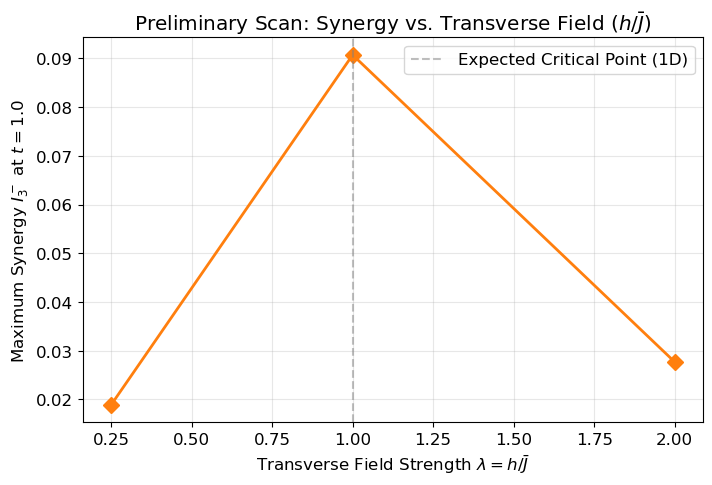

In [35]:
# 提取你现有的四个点 (假设你的 df_tfising_regime_summary 里有这些数据)
# x轴：横场强度 lambda = h/J
# y轴：演化末期的最大协同 I3-
scan_data = df_tfising_regime_summary.groupby('lambda_h_over_Jbar')['max_I3_minus'].max().reset_index()
scan_data = scan_data.sort_values('lambda_h_over_Jbar')

plt.figure(figsize=(8, 5))
plt.plot(scan_data['lambda_h_over_Jbar'], scan_data['max_I3_minus'], marker='D', markersize=8, color='#ff7f0e', linewidth=2)
plt.axvline(x=1.0, color='grey', linestyle='--', alpha=0.5, label='Expected Critical Point (1D)')

plt.title("Preliminary Scan: Synergy vs. Transverse Field ($h/\\bar{J}$)")
plt.xlabel("Transverse Field Strength $\\lambda = h/\\bar{J}$")
plt.ylabel("Maximum Synergy $I_3^-$ at $t=1.0$")
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

In [37]:
# Phase3 Step 4A — Fine lambda-scan settings
#
# Purpose:
#   Test whether I3_minus is maximized near the finite-size critical-like region
#   lambda = h / Jbar_RMS ≈ 1.
#
# Control:
#   R_internal_norm fixed
#   Jbar_RMS fixed
#   theta-phi grid fixed
#   initial state fixed
#   environment coupling fixed: J_CD = gD * Jbar_RMS
#   D has transverse field: h X_D
#
# Only varied:
#   lambda = h / Jbar_RMS

import os
import re

R_step4 = R_tfising
Jbar_step4 = Jbar_tfising
gD_step4 = gD_tfising

theta_vals_step4 = theta_vals_tfising
phi_vals_step4 = phi_vals_tfising

# Denser time grid than Step 3, extended to t=2.0 to reduce endpoint peak artifacts.
t_vals_step4 = np.sort(np.unique(np.concatenate([
    np.linspace(0.02, 0.10, 5),
    np.linspace(0.10, 0.50, 17),
    np.linspace(0.50, 1.00, 11),
    np.linspace(1.00, 2.00, 21),
])))

# Fine lambda grid:
# coarse in weak/strong regimes, denser near lambda ≈ 1.
lambda_grid_step4 = np.sort(np.unique(np.concatenate([
    np.arange(0.00, 0.51, 0.10),
    np.arange(0.60, 1.41, 0.05),
    np.arange(1.50, 2.01, 0.10),
    np.array([2.25, 2.50, 2.75, 3.00]),
])))

sign_configs_step4 = [
    {
        "sign_label": "FM",
        "sign": -1.0,
        "description": "ferromagnetic-like lambda scan",
    },
    {
        "sign_label": "AFM",
        "sign": +1.0,
        "description": "antiferromagnetic-like lambda scan",
    },
]

include_D_transverse_step4 = True

save_dir_step4 = "phase3_tfising_outputs/step4_lambda_scan"
os.makedirs(save_dir_step4, exist_ok=True)

def sanitize_filename_tag(x):
    x = str(x)
    x = x.replace(" ", "_")
    x = x.replace("/", "_")
    x = x.replace("\\", "_")
    x = x.replace("=", "-")
    x = x.replace(":", "-")
    x = re.sub(r"[^A-Za-z0-9_\-\.]", "", x)
    return x

print("=== Phase3 Step 4A — Fine lambda-scan settings ===")
print(f"R_internal_norm = {R_step4:.6f}")
print(f"Jbar_RMS        = {Jbar_step4:.6f}")
print(f"gD              = {gD_step4:.3f}")
print(f"theta grid      = {len(theta_vals_step4)}")
print(f"phi grid        = {len(phi_vals_step4)}")
print(f"time points     = {len(t_vals_step4)}")
print(f"lambda points   = {len(lambda_grid_step4)}")
print(f"total points per sign = {len(lambda_grid_step4) * len(t_vals_step4) * len(theta_vals_step4) * len(phi_vals_step4):,}")

display(pd.DataFrame({
    "lambda_h_over_Jbar": lambda_grid_step4
}))

=== Phase3 Step 4A — Fine lambda-scan settings ===
R_internal_norm = 1.732051
Jbar_RMS        = 1.000000
gD              = 0.200
theta grid      = 20
phi grid        = 20
time points     = 51
lambda points   = 33
total points per sign = 673,200


,lambda_h_over_Jbar
0,0.00
1,0.10
2,0.20
3,0.30
4,0.40
5,0.50
6,0.60
7,0.65
8,0.70
9,0.75


In [38]:
# Phase3 Step 4B — Single-lambda theta-phi scan runner

def run_tfising_single_lambda_scan(
    lambda_h_over_Jbar,
    sign,
    sign_label,
    theta_vals,
    phi_vals,
    t_vals,
    R=R_step4,
    Jbar=Jbar_step4,
    gD=gD_step4,
    include_D_transverse=True,
    psi0=None,
):
    """
    Run one fixed-lambda TF-Ising theta-phi scan.

    Fixed:
        lambda = h / Jbar
        R = sqrt(J_AB^2 + J_BC^2 + J_AC^2)
        Jbar = R / sqrt(3)
        J_CD = gD * Jbar

    Scanned:
        theta, phi -> internal edge-strength distribution.

    Returns:
        df_records_lambda: one row per (t, theta, phi)
        df_time_lambda: one row per t
        lambda_summary: one-row dictionary with M_max, M_mean, A_mean
    """
    if psi0 is None:
        psi0 = psi0_random_product_fixed

    h_val = lambda_h_over_Jbar * Jbar
    J_CD = gD * Jbar
    Jtot_analytic = analytic_tfising_Jtot(h_val, R=R)

    records = []
    time_rows = []

    for tv in t_vals:
        records_t = []

        for theta in theta_vals:
            for phi in phi_vals:
                J_AB, J_BC, J_AC = tfising_edge_couplings_spherical(
                    theta=theta,
                    phi=phi,
                    R=R,
                    sign=sign,
                )

                res = run_tf_ising_case(
                    J_AB=J_AB,
                    J_BC=J_BC,
                    J_AC=J_AC,
                    h=h_val,
                    J_CD=J_CD,
                    t=tv,
                    psi0=psi0,
                    include_D_transverse=include_D_transverse,
                )

                rec = compact_tf_ising_record(res)

                rec["sign_label"] = sign_label
                rec["sign"] = sign
                rec["lambda_h_over_Jbar"] = lambda_h_over_Jbar
                rec["Jbar_RMS"] = Jbar
                rec["R_internal_norm"] = R
                rec["theta"] = theta
                rec["phi"] = phi
                rec["J_AB"] = J_AB
                rec["J_BC"] = J_BC
                rec["J_AC"] = J_AC
                rec["J_tri_norm"] = np.sqrt(J_AB**2 + J_BC**2 + J_AC**2)
                rec["J_CD"] = J_CD
                rec["include_D_transverse"] = include_D_transverse
                rec["env_label"] = "D_with_TF" if include_D_transverse else "D_no_TF"
                rec["J_tot_analytic"] = Jtot_analytic

                records.append(rec)
                records_t.append(rec)

        df_t = pd.DataFrame(records_t)

        I3m = df_t["I3_minus"].values.astype(float)
        Jr = df_t["J_rho_exp"].values.astype(float)
        Jt = df_t["J_tot"].values.astype(float)
        SL = df_t["S_L"].values.astype(float)
        Pp = df_t["P_pair"].values.astype(float)
        Np = df_t["N_pair_sum"].values.astype(float)

        idx_max_I3 = int(np.argmax(I3m))

        time_rows.append({
            "sign_label": sign_label,
            "sign": sign,
            "lambda_h_over_Jbar": lambda_h_over_Jbar,
            "h": h_val,
            "Jbar_RMS": Jbar,
            "R_internal_norm": R,
            "J_CD": J_CD,
            "include_D_transverse": include_D_transverse,
            "env_label": "D_with_TF" if include_D_transverse else "D_no_TF",
            "t": tv,
            "N": len(df_t),

            "max_I3_minus": float(np.max(I3m)),
            "mean_I3_minus": float(np.mean(I3m)),
            "median_I3_minus": float(np.median(I3m)),

            "max_J_rho_exp": float(np.max(Jr)),
            "mean_J_rho_exp": float(np.mean(Jr)),
            "median_J_rho_exp": float(np.median(Jr)),

            "mean_J_tot": float(np.mean(Jt)),
            "std_J_tot": float(np.std(Jt)),
            "J_tot_analytic": Jtot_analytic,

            "corr_J_rho_exp": safe_corr(Jr, I3m),
            "corr_S_L": safe_corr(SL, I3m),
            "corr_P_pair": safe_corr(Pp, I3m),
            "corr_N_pair_sum": safe_corr(Np, I3m),

            "theta_at_max_I3": float(df_t.iloc[idx_max_I3]["theta"]),
            "phi_at_max_I3": float(df_t.iloc[idx_max_I3]["phi"]),
        })

    df_records_lambda = pd.DataFrame(records)
    df_time_lambda = pd.DataFrame(time_rows).sort_values("t").reset_index(drop=True)

    idx_Mmax = int(np.argmax(df_time_lambda["max_I3_minus"].values))
    idx_Mmean = int(np.argmax(df_time_lambda["mean_I3_minus"].values))

    t_arr = df_time_lambda["t"].values.astype(float)
    mean_I3_arr = df_time_lambda["mean_I3_minus"].values.astype(float)
    max_I3_arr = df_time_lambda["max_I3_minus"].values.astype(float)

    A_mean = float(np.trapz(mean_I3_arr, t_arr))
    A_max = float(np.trapz(max_I3_arr, t_arr))

    lambda_summary = {
        "sign_label": sign_label,
        "sign": sign,
        "lambda_h_over_Jbar": lambda_h_over_Jbar,
        "h": h_val,
        "Jbar_RMS": Jbar,
        "R_internal_norm": R,
        "J_CD": J_CD,
        "include_D_transverse": include_D_transverse,
        "env_label": "D_with_TF" if include_D_transverse else "D_no_TF",
        "J_tot_analytic": Jtot_analytic,

        # Three main Step-4 quantities.
        "M_max": float(df_time_lambda.iloc[idx_Mmax]["max_I3_minus"]),
        "t_at_M_max": float(df_time_lambda.iloc[idx_Mmax]["t"]),
        "theta_at_M_max": float(df_time_lambda.iloc[idx_Mmax]["theta_at_max_I3"]),
        "phi_at_M_max": float(df_time_lambda.iloc[idx_Mmax]["phi_at_max_I3"]),

        "M_mean": float(df_time_lambda.iloc[idx_Mmean]["mean_I3_minus"]),
        "t_at_M_mean": float(df_time_lambda.iloc[idx_Mmean]["t"]),

        "A_mean": A_mean,

        # Extra useful companion quantities.
        "A_max": A_max,
        "max_J_rho_exp_over_time": float(df_time_lambda["max_J_rho_exp"].max()),
        "mean_J_rho_exp_peak_over_time": float(df_time_lambda["mean_J_rho_exp"].max()),
        "min_corr_Jrho_I3": float(df_time_lambda["corr_J_rho_exp"].min()),
        "max_corr_Jrho_I3": float(df_time_lambda["corr_J_rho_exp"].max()),
        "corr_Jrho_I3_at_Mmax": float(df_time_lambda.iloc[idx_Mmax]["corr_J_rho_exp"]),
    }

    return df_records_lambda, df_time_lambda, lambda_summary

print("=== Phase3 Step 4B — Single-lambda runner ready ===")

=== Phase3 Step 4B — Single-lambda runner ready ===


In [39]:
# Phase3 Step 4C — Run FM and AFM fine lambda scans
#
# This runs two separate scans:
#   1. FM:  sign = -1
#   2. AFM: sign = +1
#
# Each scan saves:
#   records   (.csv.gz)
#   time summary (.csv)
#   lambda summary (.csv)

all_step4_time_summaries = []
all_step4_lambda_summaries = []

for sign_cfg in sign_configs_step4:
    sign_label = sign_cfg["sign_label"]
    sign = sign_cfg["sign"]

    print("\n" + "=" * 88)
    print(f"Starting Step 4 lambda scan: {sign_label}")
    print(sign_cfg["description"])
    print("=" * 88)

    records_all_lambdas = []
    time_summaries_sign = []
    lambda_summaries_sign = []

    for i_lam, lam in enumerate(lambda_grid_step4):
        print(f"\n[{sign_label}] lambda {i_lam + 1:02d}/{len(lambda_grid_step4)}: λ = {lam:.2f}")

        df_records_lam, df_time_lam, lambda_summary = run_tfising_single_lambda_scan(
            lambda_h_over_Jbar=lam,
            sign=sign,
            sign_label=sign_label,
            theta_vals=theta_vals_step4,
            phi_vals=phi_vals_step4,
            t_vals=t_vals_step4,
            R=R_step4,
            Jbar=Jbar_step4,
            gD=gD_step4,
            include_D_transverse=include_D_transverse_step4,
            psi0=psi0_random_product_fixed,
        )

        records_all_lambdas.append(df_records_lam)
        time_summaries_sign.append(df_time_lam)
        lambda_summaries_sign.append(lambda_summary)

        print(
            f"λ={lam:.2f} | "
            f"M_max={lambda_summary['M_max']:.6e} at t={lambda_summary['t_at_M_max']:.3f} | "
            f"M_mean={lambda_summary['M_mean']:.6e} at t={lambda_summary['t_at_M_mean']:.3f} | "
            f"A_mean={lambda_summary['A_mean']:.6e}"
        )

    df_records_sign = pd.concat(records_all_lambdas, ignore_index=True)
    df_time_sign = pd.concat(time_summaries_sign, ignore_index=True)
    df_lambda_sign = pd.DataFrame(lambda_summaries_sign)

    all_step4_time_summaries.append(df_time_sign)
    all_step4_lambda_summaries.append(df_lambda_sign)

    sign_tag = sanitize_filename_tag(sign_label)

    records_path = os.path.join(
        save_dir_step4,
        f"phase3_step4_lambda_scan_records__{sign_tag}.csv.gz"
    )
    time_path = os.path.join(
        save_dir_step4,
        f"phase3_step4_lambda_scan_time_summary__{sign_tag}.csv"
    )
    lambda_path = os.path.join(
        save_dir_step4,
        f"phase3_step4_lambda_scan_lambda_summary__{sign_tag}.csv"
    )

    df_records_sign.to_csv(records_path, index=False, compression="gzip")
    df_time_sign.to_csv(time_path, index=False)
    df_lambda_sign.to_csv(lambda_path, index=False)

    print("\nSaved sign-level outputs:")
    print(records_path)
    print(time_path)
    print(lambda_path)

df_step4_time_summary_ALL = pd.concat(all_step4_time_summaries, ignore_index=True)
df_step4_lambda_summary_ALL = pd.concat(all_step4_lambda_summaries, ignore_index=True)

time_all_path = os.path.join(
    save_dir_step4,
    "phase3_step4_lambda_scan_time_summary_ALL.csv"
)
lambda_all_path = os.path.join(
    save_dir_step4,
    "phase3_step4_lambda_scan_lambda_summary_ALL.csv"
)

df_step4_time_summary_ALL.to_csv(time_all_path, index=False)
df_step4_lambda_summary_ALL.to_csv(lambda_all_path, index=False)

print("\nSaved combined Step 4 outputs:")
print(time_all_path)
print(lambda_all_path)

print("\n=== Step 4 lambda summary preview ===")
display(df_step4_lambda_summary_ALL.round(8))


Starting Step 4 lambda scan: FM
ferromagnetic-like lambda scan

[FM] lambda 01/33: λ = 0.00


C:\Users\Administrator\AppData\Local\Temp\ipykernel_18464\4217547435.py:142: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_mean = float(np.trapz(mean_I3_arr, t_arr))
C:\Users\Administrator\AppData\Local\Temp\ipykernel_18464\4217547435.py:143: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_max = float(np.trapz(max_I3_arr, t_arr))


λ=0.00 | M_max=5.537819e-15 at t=0.020 | M_mean=5.679218e-16 at t=0.020 | A_mean=3.202883e-16

[FM] lambda 02/33: λ = 0.10
λ=0.10 | M_max=4.004072e-02 at t=2.000 | M_mean=1.473346e-02 at t=2.000 | A_mean=7.228046e-03

[FM] lambda 03/33: λ = 0.20
λ=0.20 | M_max=1.199860e-01 at t=2.000 | M_mean=4.177425e-02 at t=2.000 | A_mean=2.223289e-02

[FM] lambda 04/33: λ = 0.30
λ=0.30 | M_max=2.018140e-01 at t=2.000 | M_mean=6.517704e-02 at t=2.000 | A_mean=3.866557e-02

[FM] lambda 05/33: λ = 0.40
λ=0.40 | M_max=2.580823e-01 at t=2.000 | M_mean=8.011106e-02 at t=2.000 | A_mean=5.149280e-02

[FM] lambda 06/33: λ = 0.50
λ=0.50 | M_max=2.792198e-01 at t=2.000 | M_mean=9.391429e-02 at t=2.000 | A_mean=6.094249e-02

[FM] lambda 07/33: λ = 0.60
λ=0.60 | M_max=2.613015e-01 at t=2.000 | M_mean=1.022283e-01 at t=2.000 | A_mean=6.917314e-02

[FM] lambda 08/33: λ = 0.65
λ=0.65 | M_max=2.511363e-01 at t=2.000 | M_mean=1.028725e-01 at t=2.000 | A_mean=7.272937e-02

[FM] lambda 09/33: λ = 0.70
λ=0.70 | M_max=2

,sign_label,sign,lambda_h_over_Jbar,h,Jbar_RMS,R_internal_norm,J_CD,include_D_transverse,env_label,J_tot_analytic,...,phi_at_M_max,M_mean,t_at_M_mean,A_mean,A_max,max_J_rho_exp_over_time,mean_J_rho_exp_peak_over_time,min_corr_Jrho_I3,max_corr_Jrho_I3,corr_Jrho_I3_at_Mmax
0,FM,-1.0,0.00,0.00,1.0,1.732051,0.2,True,D_with_TF,0.000000,...,0.909408,0.000000,0.02,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN
1,FM,-1.0,0.10,0.10,1.0,1.732051,0.2,True,D_with_TF,0.017321,...,1.322776,0.014733,2.00,0.007228,0.018696,0.004613,0.002103,-0.489545,-0.211491,-0.386828
2,FM,-1.0,0.20,0.20,1.0,1.732051,0.2,True,D_with_TF,0.069282,...,1.322776,0.041774,2.00,0.022233,0.057980,0.020298,0.009318,-0.519830,-0.161122,-0.379729
3,FM,-1.0,0.30,0.30,1.0,1.732051,0.2,True,D_with_TF,0.155885,...,1.322776,0.065177,2.00,0.038666,0.103025,0.048871,0.022866,-0.554217,-0.063151,-0.318701
4,FM,-1.0,0.40,0.40,1.0,1.732051,0.2,True,D_with_TF,0.277128,...,1.322776,0.080111,2.00,0.051493,0.141933,0.090837,0.043582,-0.581356,0.051098,-0.263085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,AFM,1.0,2.00,2.00,1.0,1.732051,0.2,True,D_with_TF,6.928203,...,0.909408,0.067705,2.00,0.035043,0.095546,1.786899,1.110195,-0.850319,0.414376,0.140519
62,AFM,1.0,2.25,2.25,1.0,1.732051,0.2,True,D_with_TF,8.768507,...,0.909408,0.048614,1.90,0.033256,0.094669,2.255677,1.399238,-0.808112,0.397450,0.355617
63,AFM,1.0,2.50,2.50,1.0,1.732051,0.2,True,D_with_TF,10.825318,...,0.826735,0.050794,2.00,0.029533,0.091527,2.784231,1.713481,-0.792998,0.412388,0.004161
64,AFM,1.0,2.75,2.75,1.0,1.732051,0.2,True,D_with_TF,13.098634,...,0.992082,0.060110,2.00,0.030650,0.085402,3.384044,2.068393,-0.761259,0.428367,-0.061145


Saved: phase3_tfising_outputs/step4_lambda_scan\figures\phase3_step4_lambda_peak_test__FM.png


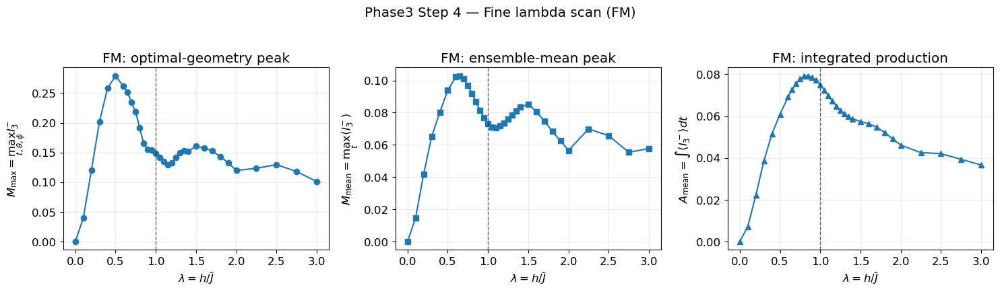

Saved: phase3_tfising_outputs/step4_lambda_scan\figures\phase3_step4_lambda_peak_test__AFM.png


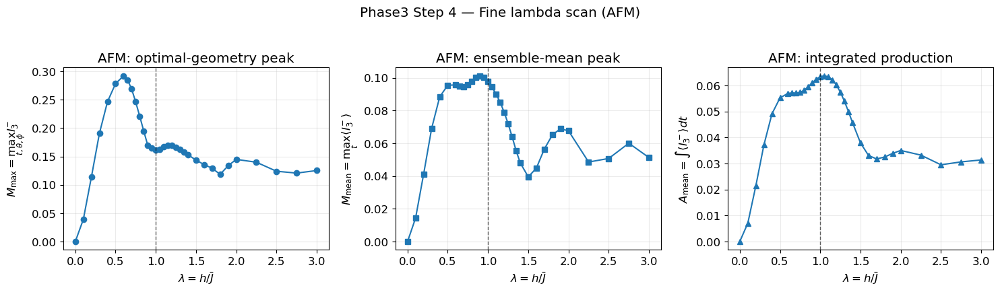

=== Step 4 peak lambda locations ===


,sign_label,lambda_at_max_M_max,max_M_max,lambda_at_max_M_mean,max_M_mean,lambda_at_max_A_mean,max_A_mean
0,FM,0.5,0.279220,0.65,0.102873,0.85,0.079281
1,AFM,0.6,0.292313,0.90,0.101302,1.05,0.063742


Saved: phase3_tfising_outputs/step4_lambda_scan\phase3_step4_lambda_peak_locations.csv


In [40]:
# Phase3 Step 4D — Quick plots for critical-like peak test
#
# Main question:
#   Does I3_minus peak near lambda = h/Jbar ≈ 1?

fig_dir_step4 = os.path.join(save_dir_step4, "figures")
os.makedirs(fig_dir_step4, exist_ok=True)

for sign_label in df_step4_lambda_summary_ALL["sign_label"].unique():
    df_s = (
        df_step4_lambda_summary_ALL[
            df_step4_lambda_summary_ALL["sign_label"] == sign_label
        ]
        .sort_values("lambda_h_over_Jbar")
        .copy()
    )

    lam = df_s["lambda_h_over_Jbar"].values

    fig, axes = plt.subplots(1, 3, figsize=(15.0, 4.2))

    ax1, ax2, ax3 = axes

    ax1.plot(lam, df_s["M_max"].values, marker="o", label=r"$M_{\max}$")
    ax1.axvline(1.0, color="k", linestyle="--", linewidth=1.0, alpha=0.6)
    ax1.set_xlabel(r"$\lambda=h/\bar{J}$")
    ax1.set_ylabel(r"$M_{\max}=\max_{t,\theta,\phi} I_3^-$")
    ax1.set_title(f"{sign_label}: optimal-geometry peak")
    ax1.grid(alpha=0.25)

    ax2.plot(lam, df_s["M_mean"].values, marker="s", label=r"$M_{\rm mean}$")
    ax2.axvline(1.0, color="k", linestyle="--", linewidth=1.0, alpha=0.6)
    ax2.set_xlabel(r"$\lambda=h/\bar{J}$")
    ax2.set_ylabel(r"$M_{\rm mean}=\max_t \langle I_3^- \rangle$")
    ax2.set_title(f"{sign_label}: ensemble-mean peak")
    ax2.grid(alpha=0.25)

    ax3.plot(lam, df_s["A_mean"].values, marker="^", label=r"$A_{\rm mean}$")
    ax3.axvline(1.0, color="k", linestyle="--", linewidth=1.0, alpha=0.6)
    ax3.set_xlabel(r"$\lambda=h/\bar{J}$")
    ax3.set_ylabel(r"$A_{\rm mean}=\int \langle I_3^- \rangle dt$")
    ax3.set_title(f"{sign_label}: integrated production")
    ax3.grid(alpha=0.25)

    fig.suptitle(f"Phase3 Step 4 — Fine lambda scan ({sign_label})", y=1.03)
    plt.tight_layout()

    fig_path = os.path.join(
        fig_dir_step4,
        f"phase3_step4_lambda_peak_test__{sanitize_filename_tag(sign_label)}.png"
    )
    fig.savefig(fig_path, dpi=300, bbox_inches="tight")
    print(f"Saved: {fig_path}")

    plt.show()

# Print peak lambda locations.
peak_rows = []

for sign_label in df_step4_lambda_summary_ALL["sign_label"].unique():
    df_s = (
        df_step4_lambda_summary_ALL[
            df_step4_lambda_summary_ALL["sign_label"] == sign_label
        ]
        .sort_values("lambda_h_over_Jbar")
        .copy()
    )

    idx_Mmax = int(np.argmax(df_s["M_max"].values))
    idx_Mmean = int(np.argmax(df_s["M_mean"].values))
    idx_Amean = int(np.argmax(df_s["A_mean"].values))

    peak_rows.append({
        "sign_label": sign_label,
        "lambda_at_max_M_max": float(df_s.iloc[idx_Mmax]["lambda_h_over_Jbar"]),
        "max_M_max": float(df_s.iloc[idx_Mmax]["M_max"]),
        "lambda_at_max_M_mean": float(df_s.iloc[idx_Mmean]["lambda_h_over_Jbar"]),
        "max_M_mean": float(df_s.iloc[idx_Mmean]["M_mean"]),
        "lambda_at_max_A_mean": float(df_s.iloc[idx_Amean]["lambda_h_over_Jbar"]),
        "max_A_mean": float(df_s.iloc[idx_Amean]["A_mean"]),
    })

df_step4_peak_locations = pd.DataFrame(peak_rows)

peak_path = os.path.join(
    save_dir_step4,
    "phase3_step4_lambda_peak_locations.csv"
)
df_step4_peak_locations.to_csv(peak_path, index=False)

print("=== Step 4 peak lambda locations ===")
display(df_step4_peak_locations.round(8))
print(f"Saved: {peak_path}")

In [25]:
# Phase3 Step 5A — Edwards-Anderson / frustration scan setup
#
# Purpose:
#   Enumerate all 8 sign patterns on the TF-Ising triangle and test whether
#   frustration changes I3_minus generation at fixed coupling magnitudes.
#
# Hamiltonian convention:
#   H = sum_ij J_ij Z_i Z_j + h sum_i X_i
#
# With this convention:
#   J_ij < 0 : ferromagnetic-like edge
#   J_ij > 0 : antiferromagnetic-like edge
#
# Triangle frustration label:
#   frustrated     if sign(J_AB * J_BC * J_AC) > 0
#   non-frustrated if sign(J_AB * J_BC * J_AC) < 0
#
# Important:
#   For each fixed (lambda, theta, phi), all sign patterns share the same
#   |J_AB|, |J_BC|, |J_AC| and therefore the same J_tot.

import os
import re
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

save_dir_step5 = "phase3_tfising_outputs/step5_EA_frustration"
os.makedirs(save_dir_step5, exist_ok=True)

def sanitize_filename_tag(x):
    x = str(x)
    x = x.replace(" ", "_")
    x = x.replace("/", "_")
    x = x.replace("\\", "_")
    x = x.replace("=", "-")
    x = x.replace(":", "-")
    x = re.sub(r"[^A-Za-z0-9_\-\.]", "", x)
    return x

# -------------------------
# Step 5 global settings
# -------------------------

R_step5 = R_tfising
Jbar_step5 = Jbar_tfising
gD_step5 = gD_tfising
include_D_transverse_step5 = True

# Use an interior grid to avoid exactly zero edges.
# This makes the frustration label meaningful for all points.
theta_vals_step5 = np.linspace(0.10, np.pi / 2 - 0.10, 20)
phi_vals_step5 = np.linspace(0.10, np.pi / 2 - 0.10, 20)

# Representative lambda values around the competition window.
# This is enough to test whether frustration effects are lambda-dependent.
lambda_vals_step5 = np.array([0.50, 0.75, 1.00, 1.25, 1.50, 2.00])

# Use the same extended time grid as Step 4.
# If this is too much, replace with t_vals_tfising_regime.
t_vals_step5 = t_vals_step4 if "t_vals_step4" in globals() else np.sort(np.unique(np.concatenate([
    np.linspace(0.02, 0.10, 5),
    np.linspace(0.10, 0.50, 17),
    np.linspace(0.50, 1.00, 11),
    np.linspace(1.00, 2.00, 21),
])))

# -------------------------
# Enumerate sign patterns
# -------------------------

def sign_to_char(s):
    return "+" if s > 0 else "-"

def make_sign_pattern_label(s_AB, s_BC, s_AC):
    return f"{sign_to_char(s_AB)}{sign_to_char(s_BC)}{sign_to_char(s_AC)}"

def frustration_label_from_signs(s_AB, s_BC, s_AC):
    product = s_AB * s_BC * s_AC
    if product > 0:
        return "frustrated"
    elif product < 0:
        return "non_frustrated"
    else:
        return "degenerate"

sign_pattern_rows_step5 = []

for s_AB, s_BC, s_AC in itertools.product([-1.0, +1.0], repeat=3):
    sign_product = s_AB * s_BC * s_AC
    sign_label = make_sign_pattern_label(s_AB, s_BC, s_AC)
    frustration_label = frustration_label_from_signs(s_AB, s_BC, s_AC)

    sign_pattern_rows_step5.append({
        "sign_pattern": sign_label,
        "s_AB": s_AB,
        "s_BC": s_BC,
        "s_AC": s_AC,
        "sign_product": sign_product,
        "frustration_label": frustration_label,
        "is_frustrated": bool(sign_product > 0),
    })

df_sign_patterns_step5 = pd.DataFrame(sign_pattern_rows_step5)

# -------------------------
# Magnitude map and edge geometry metrics
# -------------------------

def tfising_edge_magnitudes_spherical(theta, phi, R=R_step5):
    """
    Positive edge magnitudes:
        K_AB = R sin(theta) cos(phi)
        K_BC = R sin(theta) sin(phi)
        K_AC = R cos(theta)

    These satisfy:
        K_AB^2 + K_BC^2 + K_AC^2 = R^2.
    """
    K_AB = R * np.sin(theta) * np.cos(phi)
    K_BC = R * np.sin(theta) * np.sin(phi)
    K_AC = R * np.cos(theta)
    return K_AB, K_BC, K_AC

def edge_geometry_metrics(J_AB, J_BC, J_AC, eps=1e-15):
    """
    Edge-support geometry metrics based on squared coupling weights.

        w_ij = J_ij^2 / (J_AB^2 + J_BC^2 + J_AC^2)

    edge_participation:
        1 / sum(w^2)
        ~1 for one-edge-dominant, ~3 for fully balanced.

    edge_imbalance:
        max(w) - min(w)

    top2_balance:
        min(two largest weights) / max(two largest weights)
        close to 1 if the two dominant edges are comparable.

    weak_edge_weight:
        min(w)
        close to 0 for quasi-dimer geometry.
    """
    J2 = np.array([J_AB**2, J_BC**2, J_AC**2], dtype=float)
    J2_sum = float(np.sum(J2))

    if J2_sum < eps:
        return {
            "w_AB": np.nan,
            "w_BC": np.nan,
            "w_AC": np.nan,
            "edge_participation": np.nan,
            "edge_imbalance": np.nan,
            "top2_balance": np.nan,
            "weak_edge_weight": np.nan,
            "dominant_edge_weight": np.nan,
        }

    w = J2 / J2_sum
    w_sorted = np.sort(w)

    edge_participation = 1.0 / np.sum(w**2)
    edge_imbalance = float(np.max(w) - np.min(w))
    dominant_edge_weight = float(w_sorted[-1])
    weak_edge_weight = float(w_sorted[0])
    top2_balance = float(w_sorted[-2] / w_sorted[-1]) if w_sorted[-1] > eps else np.nan

    return {
        "w_AB": float(w[0]),
        "w_BC": float(w[1]),
        "w_AC": float(w[2]),
        "edge_participation": float(edge_participation),
        "edge_imbalance": edge_imbalance,
        "top2_balance": top2_balance,
        "weak_edge_weight": weak_edge_weight,
        "dominant_edge_weight": dominant_edge_weight,
    }

print("=== Phase3 Step 5A — EA/frustration setup ready ===")
print(f"R_internal_norm = {R_step5:.6f}")
print(f"Jbar_RMS        = {Jbar_step5:.6f}")
print(f"gD              = {gD_step5:.3f}")
print(f"theta grid      = {len(theta_vals_step5)} interior points")
print(f"phi grid        = {len(phi_vals_step5)} interior points")
print(f"time points     = {len(t_vals_step5)}")
print(f"lambda points   = {len(lambda_vals_step5)}")
print(f"sign patterns   = {len(df_sign_patterns_step5)}")
print(
    "total evolutions = "
    f"{len(lambda_vals_step5) * len(t_vals_step5) * len(theta_vals_step5) * len(phi_vals_step5) * len(df_sign_patterns_step5):,}"
)

display(df_sign_patterns_step5)

=== Phase3 Step 5A — EA/frustration setup ready ===
R_internal_norm = 1.732051
Jbar_RMS        = 1.000000
gD              = 0.200
theta grid      = 20 interior points
phi grid        = 20 interior points
time points     = 51
lambda points   = 6
sign patterns   = 8
total evolutions = 979,200


,sign_pattern,s_AB,s_BC,s_AC,sign_product,frustration_label,is_frustrated
0,---,-1.0,-1.0,-1.0,-1.0,non_frustrated,False
1,--+,-1.0,-1.0,1.0,1.0,frustrated,True
2,-+-,-1.0,1.0,-1.0,1.0,frustrated,True
3,-++,-1.0,1.0,1.0,-1.0,non_frustrated,False
4,+--,1.0,-1.0,-1.0,1.0,frustrated,True
5,+-+,1.0,-1.0,1.0,-1.0,non_frustrated,False
6,++-,1.0,1.0,-1.0,-1.0,non_frustrated,False
7,+++,1.0,1.0,1.0,1.0,frustrated,True


In [26]:
t_vals_step5 = np.array([
    0.05, 0.10, 0.20, 0.30,
    0.40, 0.50, 0.70, 0.90,
    1.10, 1.30, 1.60, 2.00
])

print("Step 5 pilot total evolutions:",
      len(lambda_vals_step5) * len(t_vals_step5) * len(theta_vals_step5) * len(phi_vals_step5) * len(df_sign_patterns_step5))

Step 5 pilot total evolutions: 230400


In [28]:
lambda_vals_step5 = np.array([0.75, 1.00, 1.25, 1.50])
t_vals_step5 = np.array([0.10, 0.30, 0.50, 0.90, 1.30, 2.00])
theta_vals_step5 = np.linspace(0.12, np.pi / 2 - 0.12, 14)
phi_vals_step5 = np.linspace(0.12, np.pi / 2 - 0.12, 14)

print(
    "Step 5 light pilot total evolutions:",
    len(lambda_vals_step5)
    * len(t_vals_step5)
    * len(theta_vals_step5)
    * len(phi_vals_step5)
    * len(df_sign_patterns_step5)
)

Step 5 light pilot total evolutions: 37632


In [29]:
# Phase3 Step 5B — Single-lambda sign-enumeration runner
#
# Purpose:
#   For one fixed lambda = h / Jbar_RMS, enumerate all 8 sign patterns
#   for every theta-phi edge-magnitude geometry.
#
# Output:
#   df_records_lambda:
#       one row per (t, theta, phi, sign_pattern)
#
#   df_time_lambda:
#       one row per (t, frustration_label)
#
#   df_advantage_lambda:
#       one row per t, containing frustrated - non_frustrated differences
#
#   lambda_summary:
#       one-row summary over time

def run_step5_single_lambda_frustration_scan(
    lambda_h_over_Jbar,
    theta_vals,
    phi_vals,
    t_vals,
    R=R_step5,
    Jbar=Jbar_step5,
    gD=gD_step5,
    include_D_transverse=True,
    psi0=None,
    sign_patterns_df=None,
):
    if psi0 is None:
        psi0 = psi0_random_product_fixed

    if sign_patterns_df is None:
        sign_patterns_df = df_sign_patterns_step5

    h_val = lambda_h_over_Jbar * Jbar
    J_CD = gD * Jbar
    Jtot_analytic = analytic_tfising_Jtot(h_val, R=R)

    records = []

    for tv in t_vals:
        for theta in theta_vals:
            for phi in phi_vals:
                K_AB, K_BC, K_AC = tfising_edge_magnitudes_spherical(
                    theta=theta,
                    phi=phi,
                    R=R,
                )

                geom = edge_geometry_metrics(K_AB, K_BC, K_AC)

                for _, sp in sign_patterns_df.iterrows():
                    s_AB = float(sp["s_AB"])
                    s_BC = float(sp["s_BC"])
                    s_AC = float(sp["s_AC"])

                    J_AB = s_AB * K_AB
                    J_BC = s_BC * K_BC
                    J_AC = s_AC * K_AC

                    res = run_tf_ising_case(
                        J_AB=J_AB,
                        J_BC=J_BC,
                        J_AC=J_AC,
                        h=h_val,
                        J_CD=J_CD,
                        t=tv,
                        psi0=psi0,
                        include_D_transverse=include_D_transverse,
                    )

                    rec = compact_tf_ising_record(res)

                    # Scan coordinates
                    rec["lambda_h_over_Jbar"] = lambda_h_over_Jbar
                    rec["h"] = h_val
                    rec["Jbar_RMS"] = Jbar
                    rec["R_internal_norm"] = R
                    rec["theta"] = theta
                    rec["phi"] = phi

                    # Magnitudes and signed couplings
                    rec["K_AB"] = K_AB
                    rec["K_BC"] = K_BC
                    rec["K_AC"] = K_AC
                    rec["J_AB"] = J_AB
                    rec["J_BC"] = J_BC
                    rec["J_AC"] = J_AC
                    rec["J_tri_norm"] = np.sqrt(J_AB**2 + J_BC**2 + J_AC**2)

                    # Sign / frustration metadata
                    rec["sign_pattern"] = sp["sign_pattern"]
                    rec["s_AB"] = s_AB
                    rec["s_BC"] = s_BC
                    rec["s_AC"] = s_AC
                    rec["sign_product"] = float(sp["sign_product"])
                    rec["frustration_label"] = sp["frustration_label"]
                    rec["is_frustrated"] = bool(sp["is_frustrated"])

                    # Environment / analytic reference
                    rec["J_CD"] = J_CD
                    rec["include_D_transverse"] = include_D_transverse
                    rec["env_label"] = "D_with_TF" if include_D_transverse else "D_no_TF"
                    rec["J_tot_analytic"] = Jtot_analytic

                    # Edge-geometry metrics
                    for k, v in geom.items():
                        rec[k] = v

                    # Component-level mediator expectations are already returned by mediator_metrics
                    # but compact_tf_ising_record may not include them.
                    # Add them explicitly if present.
                    for key in ["m_AB", "m_BC", "m_AC", "j_AB", "j_BC", "j_AC"]:
                        if key in res:
                            rec[key] = res[key]

                    records.append(rec)

    df_records_lambda = pd.DataFrame(records)

    # -------------------------
    # Time/frustration summaries
    # -------------------------

    time_rows = []

    group_cols = ["lambda_h_over_Jbar", "t", "frustration_label"]

    for (lam, tv, fr_label), df_g in df_records_lambda.groupby(group_cols):
        I3m = df_g["I3_minus"].values.astype(float)
        Jr = df_g["J_rho_exp"].values.astype(float)
        Jt = df_g["J_tot"].values.astype(float)
        SL = df_g["S_L"].values.astype(float)
        Pp = df_g["P_pair"].values.astype(float)
        Np = df_g["N_pair_sum"].values.astype(float)

        time_rows.append({
            "lambda_h_over_Jbar": lam,
            "h": h_val,
            "Jbar_RMS": Jbar,
            "R_internal_norm": R,
            "J_CD": J_CD,
            "include_D_transverse": include_D_transverse,
            "env_label": "D_with_TF" if include_D_transverse else "D_no_TF",
            "t": tv,
            "frustration_label": fr_label,
            "N": len(df_g),

            "mean_I3_minus": float(np.mean(I3m)),
            "median_I3_minus": float(np.median(I3m)),
            "max_I3_minus": float(np.max(I3m)),

            "mean_J_rho_exp": float(np.mean(Jr)),
            "median_J_rho_exp": float(np.median(Jr)),
            "max_J_rho_exp": float(np.max(Jr)),

            "mean_S_L": float(np.mean(SL)),
            "mean_P_pair": float(np.mean(Pp)),
            "mean_N_pair_sum": float(np.mean(Np)),

            "mean_J_tot": float(np.mean(Jt)),
            "std_J_tot": float(np.std(Jt)),
            "J_tot_analytic": Jtot_analytic,

            "corr_Jrho_I3": safe_corr(Jr, I3m),
            "corr_SL_I3": safe_corr(SL, I3m),
            "corr_Ppair_I3": safe_corr(Pp, I3m),
            "corr_Npair_I3": safe_corr(Np, I3m),

            "mean_edge_participation": float(np.mean(df_g["edge_participation"].values.astype(float))),
            "mean_edge_imbalance": float(np.mean(df_g["edge_imbalance"].values.astype(float))),
            "mean_top2_balance": float(np.mean(df_g["top2_balance"].values.astype(float))),
        })

    df_time_lambda = pd.DataFrame(time_rows).sort_values(
        ["lambda_h_over_Jbar", "t", "frustration_label"]
    ).reset_index(drop=True)

    # -------------------------
    # Matched frustration advantage by time
    # -------------------------

    advantage_rows = []

    for tv, df_t in df_records_lambda.groupby("t"):
        df_pair = (
            df_t
            .groupby(["theta", "phi", "frustration_label"])
            .agg(
                mean_I3_minus=("I3_minus", "mean"),
                mean_J_rho_exp=("J_rho_exp", "mean"),
                mean_S_L=("S_L", "mean"),
                mean_P_pair=("P_pair", "mean"),
                mean_N_pair_sum=("N_pair_sum", "mean"),
            )
            .reset_index()
        )

        df_wide = df_pair.pivot_table(
            index=["theta", "phi"],
            columns="frustration_label",
            values=[
                "mean_I3_minus",
                "mean_J_rho_exp",
                "mean_S_L",
                "mean_P_pair",
                "mean_N_pair_sum",
            ],
        )

        # Flatten MultiIndex columns
        df_wide.columns = [f"{a}__{b}" for a, b in df_wide.columns]
        df_wide = df_wide.reset_index()

        required_adv_cols = [
            "mean_I3_minus__frustrated",
            "mean_I3_minus__non_frustrated",
        ]
        missing_adv = [c for c in required_adv_cols if c not in df_wide.columns]
        if missing_adv:
            raise ValueError(f"Missing columns for advantage computation: {missing_adv}")

        delta_I3 = (
            df_wide["mean_I3_minus__frustrated"].values
            - df_wide["mean_I3_minus__non_frustrated"].values
        )

        row = {
            "lambda_h_over_Jbar": lambda_h_over_Jbar,
            "h": h_val,
            "t": tv,
            "N_geometries": len(df_wide),
            "Delta_I3_mean": float(np.mean(delta_I3)),
            "Delta_I3_median": float(np.median(delta_I3)),
            "Delta_I3_std": float(np.std(delta_I3)),
            "frac_geometry_frustrated_gt_non": float(np.mean(delta_I3 > 0.0)),
        }

        # Optional advantages for other variables
        for base in [
            "mean_J_rho_exp",
            "mean_S_L",
            "mean_P_pair",
            "mean_N_pair_sum",
        ]:
            c_f = f"{base}__frustrated"
            c_u = f"{base}__non_frustrated"
            if c_f in df_wide.columns and c_u in df_wide.columns:
                delta = df_wide[c_f].values - df_wide[c_u].values
                row[f"Delta_{base}_mean"] = float(np.mean(delta))
                row[f"Delta_{base}_median"] = float(np.median(delta))

        advantage_rows.append(row)

    df_advantage_lambda = pd.DataFrame(advantage_rows).sort_values("t").reset_index(drop=True)

    # -------------------------
    # Lambda-level summary
    # -------------------------

    t_arr = np.sort(df_advantage_lambda["t"].unique())

    # Integrated advantage.
    A_Delta_I3 = float(np.trapz(
        df_advantage_lambda.sort_values("t")["Delta_I3_mean"].values.astype(float),
        df_advantage_lambda.sort_values("t")["t"].values.astype(float),
    ))

    # Frustrated and non-frustrated integrated mean I3.
    df_time_pivot = df_time_lambda.pivot_table(
        index="t",
        columns="frustration_label",
        values="mean_I3_minus",
    ).reset_index()

    A_F = np.nan
    A_U = np.nan
    if "frustrated" in df_time_pivot.columns:
        A_F = float(np.trapz(
            df_time_pivot["frustrated"].values.astype(float),
            df_time_pivot["t"].values.astype(float),
        ))
    if "non_frustrated" in df_time_pivot.columns:
        A_U = float(np.trapz(
            df_time_pivot["non_frustrated"].values.astype(float),
            df_time_pivot["t"].values.astype(float),
        ))

    lambda_summary = {
        "lambda_h_over_Jbar": lambda_h_over_Jbar,
        "h": h_val,
        "Jbar_RMS": Jbar,
        "R_internal_norm": R,
        "J_CD": J_CD,
        "J_tot_analytic": Jtot_analytic,
        "include_D_transverse": include_D_transverse,
        "N_records": len(df_records_lambda),

        "A_I3_frustrated": A_F,
        "A_I3_non_frustrated": A_U,
        "A_Delta_I3": A_Delta_I3,
        "Delta_A_I3_direct": A_F - A_U if np.isfinite(A_F) and np.isfinite(A_U) else np.nan,

        "max_Delta_I3_mean": float(df_advantage_lambda["Delta_I3_mean"].max()),
        "min_Delta_I3_mean": float(df_advantage_lambda["Delta_I3_mean"].min()),
        "t_at_max_Delta_I3_mean": float(
            df_advantage_lambda.iloc[int(np.argmax(df_advantage_lambda["Delta_I3_mean"].values))]["t"]
        ),
        "t_at_min_Delta_I3_mean": float(
            df_advantage_lambda.iloc[int(np.argmin(df_advantage_lambda["Delta_I3_mean"].values))]["t"]
        ),

        "mean_frac_geometry_frustrated_gt_non": float(
            df_advantage_lambda["frac_geometry_frustrated_gt_non"].mean()
        ),
    }

    return df_records_lambda, df_time_lambda, df_advantage_lambda, lambda_summary

print("=== Phase3 Step 5B — Single-lambda frustration runner ready ===")

=== Phase3 Step 5B — Single-lambda frustration runner ready ===


In [30]:
# Phase3 Step 5C — Run EA/frustration pilot scan
#
# Purpose:
#   Run the sign-pattern enumeration scan over the current Step 5 settings:
#
#       lambda_vals_step5
#       t_vals_step5
#       theta_vals_step5
#       phi_vals_step5
#
# For each fixed (lambda, theta, phi), enumerate all 8 sign patterns.
# Frustration effect is measured by matched comparison:
#
#       Delta I3_minus = <I3_minus>_frustrated - <I3_minus>_non_frustrated
#
# Main outputs:
#   1. df_step5_records_ALL
#   2. df_step5_time_summary_ALL
#   3. df_step5_advantage_ALL
#   4. df_step5_lambda_summary

import os
import time

run_tag_step5 = (
    f"EA_pilot__"
    f"L{len(lambda_vals_step5)}_"
    f"T{len(t_vals_step5)}_"
    f"TH{len(theta_vals_step5)}_"
    f"PH{len(phi_vals_step5)}"
)

save_dir_step5C = os.path.join(save_dir_step5, "step5C_runs", run_tag_step5)
os.makedirs(save_dir_step5C, exist_ok=True)

total_evolutions_step5C = (
    len(lambda_vals_step5)
    * len(t_vals_step5)
    * len(theta_vals_step5)
    * len(phi_vals_step5)
    * len(df_sign_patterns_step5)
)

print("=== Phase3 Step 5C — Run EA/frustration scan ===")
print(f"Run tag: {run_tag_step5}")
print(f"lambda points: {len(lambda_vals_step5)}")
print(f"time points:   {len(t_vals_step5)}")
print(f"theta points:  {len(theta_vals_step5)}")
print(f"phi points:    {len(phi_vals_step5)}")
print(f"sign patterns: {len(df_sign_patterns_step5)}")
print(f"total evolutions: {total_evolutions_step5C:,}")
print(f"save dir: {save_dir_step5C}")

all_step5_records = []
all_step5_time_summaries = []
all_step5_advantages = []
all_step5_lambda_summaries = []

t_start_all = time.time()

for idx_lam, lam in enumerate(lambda_vals_step5):
    print("\n" + "=" * 88)
    print(f"Step 5C lambda {idx_lam + 1}/{len(lambda_vals_step5)} | λ = {lam:.3f}")
    print("=" * 88)

    t_start_lam = time.time()

    df_records_lam, df_time_lam, df_adv_lam, lambda_summary = (
        run_step5_single_lambda_frustration_scan(
            lambda_h_over_Jbar=lam,
            theta_vals=theta_vals_step5,
            phi_vals=phi_vals_step5,
            t_vals=t_vals_step5,
            R=R_step5,
            Jbar=Jbar_step5,
            gD=gD_step5,
            include_D_transverse=include_D_transverse_step5,
            psi0=psi0_random_product_fixed,
            sign_patterns_df=df_sign_patterns_step5,
        )
    )

    all_step5_records.append(df_records_lam)
    all_step5_time_summaries.append(df_time_lam)
    all_step5_advantages.append(df_adv_lam)
    all_step5_lambda_summaries.append(lambda_summary)

    # Save per-lambda outputs immediately, so partial results are preserved.
    lam_tag = f"lambda-{lam:.3f}".replace(".", "p")

    records_lam_path = os.path.join(
        save_dir_step5C,
        f"phase3_step5_records__{lam_tag}.csv.gz"
    )
    time_lam_path = os.path.join(
        save_dir_step5C,
        f"phase3_step5_time_summary__{lam_tag}.csv"
    )
    adv_lam_path = os.path.join(
        save_dir_step5C,
        f"phase3_step5_advantage__{lam_tag}.csv"
    )

    df_records_lam.to_csv(records_lam_path, index=False, compression="gzip")
    df_time_lam.to_csv(time_lam_path, index=False)
    df_adv_lam.to_csv(adv_lam_path, index=False)

    elapsed_lam = time.time() - t_start_lam

    print(f"Saved per-lambda files:")
    print(records_lam_path)
    print(time_lam_path)
    print(adv_lam_path)

    print(
        f"λ={lam:.3f} summary | "
        f"A_I3_F={lambda_summary['A_I3_frustrated']:.6e} | "
        f"A_I3_NF={lambda_summary['A_I3_non_frustrated']:.6e} | "
        f"A_Delta={lambda_summary['A_Delta_I3']:.6e} | "
        f"mean frac(F>NF)={lambda_summary['mean_frac_geometry_frustrated_gt_non']:.4f} | "
        f"elapsed={elapsed_lam/60:.2f} min"
    )

# Combine all lambda outputs.
df_step5_records_ALL = pd.concat(all_step5_records, ignore_index=True)
df_step5_time_summary_ALL = pd.concat(all_step5_time_summaries, ignore_index=True)
df_step5_advantage_ALL = pd.concat(all_step5_advantages, ignore_index=True)
df_step5_lambda_summary = pd.DataFrame(all_step5_lambda_summaries)

# Save combined outputs.
records_all_path = os.path.join(
    save_dir_step5C,
    "phase3_step5_records_ALL.csv.gz"
)
time_all_path = os.path.join(
    save_dir_step5C,
    "phase3_step5_time_summary_ALL.csv"
)
advantage_all_path = os.path.join(
    save_dir_step5C,
    "phase3_step5_advantage_ALL.csv"
)
lambda_summary_path = os.path.join(
    save_dir_step5C,
    "phase3_step5_lambda_summary.csv"
)

df_step5_records_ALL.to_csv(records_all_path, index=False, compression="gzip")
df_step5_time_summary_ALL.to_csv(time_all_path, index=False)
df_step5_advantage_ALL.to_csv(advantage_all_path, index=False)
df_step5_lambda_summary.to_csv(lambda_summary_path, index=False)

elapsed_all = time.time() - t_start_all

print("\n" + "=" * 88)
print("=== Phase3 Step 5C — EA/frustration scan completed ===")
print("=" * 88)
print(f"Total elapsed: {elapsed_all/60:.2f} min")

print("\nSaved combined files:")
print(records_all_path)
print(time_all_path)
print(advantage_all_path)
print(lambda_summary_path)

print("\nLambda-level summary:")
display(df_step5_lambda_summary.round(8))

print("\nQuick frustration advantage overview:")
display(
    df_step5_lambda_summary[
        [
            "lambda_h_over_Jbar",
            "A_I3_frustrated",
            "A_I3_non_frustrated",
            "A_Delta_I3",
            "Delta_A_I3_direct",
            "max_Delta_I3_mean",
            "min_Delta_I3_mean",
            "mean_frac_geometry_frustrated_gt_non",
        ]
    ].round(8)
)

=== Phase3 Step 5C — Run EA/frustration scan ===
Run tag: EA_pilot__L4_T6_TH14_PH14
lambda points: 4
time points:   6
theta points:  14
phi points:    14
sign patterns: 8
total evolutions: 37,632
save dir: phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14

Step 5C lambda 1/4 | λ = 0.750


C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:267: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_Delta_I3 = float(np.trapz(
C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:282: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_F = float(np.trapz(
C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:287: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_U = float(np.trapz(


Saved per-lambda files:
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_records__lambda-0p750.csv.gz
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_time_summary__lambda-0p750.csv
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_advantage__lambda-0p750.csv
λ=0.750 summary | A_I3_F=6.532737e-02 | A_I3_NF=7.779253e-02 | A_Delta=-1.246515e-02 | mean frac(F>NF)=0.1633 | elapsed=1.11 min

Step 5C lambda 2/4 | λ = 1.000


C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:267: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_Delta_I3 = float(np.trapz(
C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:282: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_F = float(np.trapz(
C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:287: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_U = float(np.trapz(


Saved per-lambda files:
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_records__lambda-1p000.csv.gz
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_time_summary__lambda-1p000.csv
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_advantage__lambda-1p000.csv
λ=1.000 summary | A_I3_F=6.414658e-02 | A_I3_NF=7.511144e-02 | A_Delta=-1.096486e-02 | mean frac(F>NF)=0.1786 | elapsed=1.03 min

Step 5C lambda 3/4 | λ = 1.250


C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:267: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_Delta_I3 = float(np.trapz(
C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:282: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_F = float(np.trapz(
C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:287: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_U = float(np.trapz(


Saved per-lambda files:
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_records__lambda-1p250.csv.gz
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_time_summary__lambda-1p250.csv
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_advantage__lambda-1p250.csv
λ=1.250 summary | A_I3_F=6.004432e-02 | A_I3_NF=6.949539e-02 | A_Delta=-9.451061e-03 | mean frac(F>NF)=0.1293 | elapsed=1.01 min

Step 5C lambda 4/4 | λ = 1.500


C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:267: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_Delta_I3 = float(np.trapz(
C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:282: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_F = float(np.trapz(
C:\Users\liu.xuanc\AppData\Local\Temp\ipykernel_22268\1551344959.py:287: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_U = float(np.trapz(


Saved per-lambda files:
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_records__lambda-1p500.csv.gz
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_time_summary__lambda-1p500.csv
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_advantage__lambda-1p500.csv
λ=1.500 summary | A_I3_F=4.681647e-02 | A_I3_NF=6.060341e-02 | A_Delta=-1.378694e-02 | mean frac(F>NF)=0.0893 | elapsed=0.99 min

=== Phase3 Step 5C — EA/frustration scan completed ===
Total elapsed: 4.25 min

Saved combined files:
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_records_ALL.csv.gz
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_time_summary_ALL.csv
phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\phase3_step5_advantage_ALL.csv
phase3_tfising_outputs/step5

,lambda_h_over_Jbar,h,Jbar_RMS,R_internal_norm,J_CD,J_tot_analytic,include_D_transverse,N_records,A_I3_frustrated,A_I3_non_frustrated,A_Delta_I3,Delta_A_I3_direct,max_Delta_I3_mean,min_Delta_I3_mean,t_at_max_Delta_I3_mean,t_at_min_Delta_I3_mean,mean_frac_geometry_frustrated_gt_non
0,0.75,0.75,1.0,1.732051,0.2,0.974279,True,9408,0.065327,0.077793,-0.012465,-0.012465,-1.300000e-07,-0.017349,0.1,1.3,0.163265
1,1.00,1.00,1.0,1.732051,0.2,1.732051,True,9408,0.064147,0.075111,-0.010965,-0.010965,7.736510e-03,-0.018468,2.0,1.3,0.178571
2,1.25,1.25,1.0,1.732051,0.2,2.706329,True,9408,0.060044,0.069495,-0.009451,-0.009451,3.863100e-04,-0.010167,2.0,1.3,0.129252
3,1.50,1.50,1.0,1.732051,0.2,3.897114,True,9408,0.046816,0.060603,-0.013787,-0.013787,-9.400000e-07,-0.024944,0.1,2.0,0.089286



Quick frustration advantage overview:


,lambda_h_over_Jbar,A_I3_frustrated,A_I3_non_frustrated,A_Delta_I3,Delta_A_I3_direct,max_Delta_I3_mean,min_Delta_I3_mean,mean_frac_geometry_frustrated_gt_non
0,0.75,0.065327,0.077793,-0.012465,-0.012465,-1.300000e-07,-0.017349,0.163265
1,1.00,0.064147,0.075111,-0.010965,-0.010965,7.736510e-03,-0.018468,0.178571
2,1.25,0.060044,0.069495,-0.009451,-0.009451,3.863100e-04,-0.010167,0.129252
3,1.50,0.046816,0.060603,-0.013787,-0.013787,-9.400000e-07,-0.024944,0.089286


Saved: phase3_tfising_outputs/step5_EA_frustration\step5C_runs\EA_pilot__L4_T6_TH14_PH14\figures\phase3_step5D_frustration_advantage_pilot.png


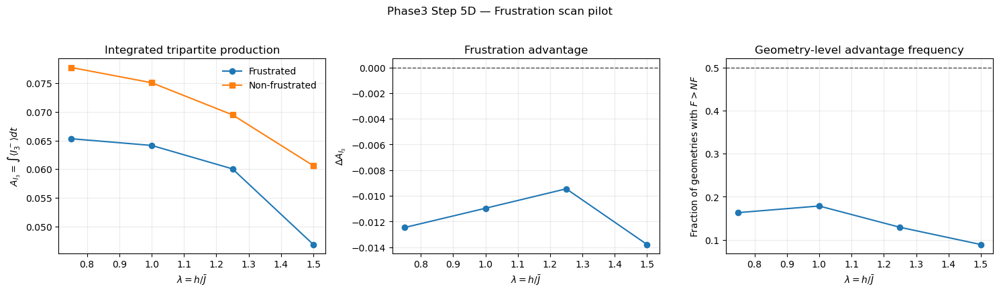

In [31]:
# Phase3 Step 5D — Quick visualization of frustration advantage

fig_dir_step5D = os.path.join(save_dir_step5C, "figures")
os.makedirs(fig_dir_step5D, exist_ok=True)

df_lam = df_step5_lambda_summary.sort_values("lambda_h_over_Jbar").copy()
lam = df_lam["lambda_h_over_Jbar"].values

fig, axes = plt.subplots(1, 3, figsize=(15.0, 4.2))

ax1, ax2, ax3 = axes

# Panel 1 — Integrated production: frustrated vs non-frustrated
ax1.plot(
    lam,
    df_lam["A_I3_frustrated"].values,
    marker="o",
    label="Frustrated"
)
ax1.plot(
    lam,
    df_lam["A_I3_non_frustrated"].values,
    marker="s",
    label="Non-frustrated"
)
ax1.set_xlabel(r"$\lambda=h/\bar{J}$")
ax1.set_ylabel(r"$A_{I_3}=\int \langle I_3^- \rangle dt$")
ax1.set_title("Integrated tripartite production")
ax1.grid(alpha=0.25)
ax1.legend(frameon=False)

# Panel 2 — Frustration advantage
ax2.plot(
    lam,
    df_lam["A_Delta_I3"].values,
    marker="o",
    label=r"$A_F-A_{NF}$"
)
ax2.axhline(0.0, color="k", linewidth=1.0, linestyle="--", alpha=0.7)
ax2.set_xlabel(r"$\lambda=h/\bar{J}$")
ax2.set_ylabel(r"$\Delta A_{I_3}$")
ax2.set_title("Frustration advantage")
ax2.grid(alpha=0.25)

# Panel 3 — Fraction of geometries where F > NF
ax3.plot(
    lam,
    df_lam["mean_frac_geometry_frustrated_gt_non"].values,
    marker="o"
)
ax3.axhline(0.5, color="k", linewidth=1.0, linestyle="--", alpha=0.7)
ax3.set_xlabel(r"$\lambda=h/\bar{J}$")
ax3.set_ylabel(r"Fraction of geometries with $F>NF$")
ax3.set_title("Geometry-level advantage frequency")
ax3.grid(alpha=0.25)

fig.suptitle("Phase3 Step 5D — Frustration scan pilot", y=1.03)
plt.tight_layout()

fig_path = os.path.join(fig_dir_step5D, "phase3_step5D_frustration_advantage_pilot.png")
fig.savefig(fig_path, dpi=300, bbox_inches="tight")
print(f"Saved: {fig_path}")

plt.show()

In [19]:
# Phase3 Step 6A — Haar threshold helpers
#
# Purpose:
#   Build a random-state baseline for I3_minus.
#
# Main ensemble:
#   |psi_ABCD> ~ Haar random pure state on 4 qubits
#   rho_ABC = Tr_D |psi_ABCD><psi_ABCD|
#
# No Hamiltonian.
# No theta-phi scan.
# No time evolution.

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

save_dir_step6 = "phase3_tfising_outputs/step6_haar_threshold"
os.makedirs(save_dir_step6, exist_ok=True)

def haar_random_state(dim, rng):
    """
    Haar random pure state in C^dim via complex Gaussian normalization.
    """
    z = rng.normal(size=dim) + 1j * rng.normal(size=dim)
    z = z / np.linalg.norm(z)
    return z.astype(complex)

def density_from_state(psi):
    psi = np.asarray(psi, dtype=complex)
    return np.outer(psi, np.conjugate(psi))

def sample_product_haar_4q(rng):
    """
    Product of four independent single-qubit Haar states.
    Used as a sanity control.
    """
    psi_A = haar_random_state(2, rng)
    psi_B = haar_random_state(2, rng)
    psi_C = haar_random_state(2, rng)
    psi_D = haar_random_state(2, rng)
    return np.kron(np.kron(np.kron(psi_A, psi_B), psi_C), psi_D)

def page_entropy_subsystem(d_sub, d_total, base=2):
    """
    Page average entropy for a subsystem of dimension d_sub
    in a Haar random pure state on dimension d_total.

    Default unit: bits, matching von_neumann_entropy if it uses log2.
    """
    d_env = d_total // d_sub
    m = min(d_sub, d_env)
    n = max(d_sub, d_env)

    H_mn = np.sum(1.0 / np.arange(1, m * n + 1))
    H_n = np.sum(1.0 / np.arange(1, n + 1))

    S_nats = H_mn - H_n - (m - 1) / (2.0 * n)

    if base == 2:
        return S_nats / np.log(2.0)
    elif base == "e":
        return S_nats
    else:
        return S_nats / np.log(base)

def page_I3_4q_trace1_reference(base=2):
    S_A = page_entropy_subsystem(d_sub=2, d_total=16, base=base)
    S_AB = page_entropy_subsystem(d_sub=4, d_total=16, base=base)
    S_ABC = page_entropy_subsystem(d_sub=8, d_total=16, base=base)

    I3_page = 3.0 * S_A - 3.0 * S_AB + S_ABC

    return {
        "Page_unit": "bits" if base == 2 else "nats",
        "Page_E_S_A": S_A,
        "Page_E_S_AB": S_AB,
        "Page_E_S_ABC": S_ABC,
        "Page_E_I3": I3_page,
        "Page_E_I3_minus_approx": max(0.0, -I3_page),
    }

def page_I3_4q_trace1_reference():
    """
    Page estimate for E[I3] of rho_ABC induced by tracing one qubit
    from a Haar-random 4Q pure state.

    I3 = S_A + S_B + S_C - S_AB - S_AC - S_BC + S_ABC.

    By symmetry:
        E[S_A] = E[S_B] = E[S_C]
        E[S_AB] = E[S_AC] = E[S_BC]
        E[S_ABC] = E[S_D] = E[S_A]
    Therefore:
        E[I3] = 4 E[S_A] - 3 E[S_AB].
    """
    S_A = page_entropy_subsystem(d_sub=2, d_total=16)
    S_AB = page_entropy_subsystem(d_sub=4, d_total=16)
    S_ABC = page_entropy_subsystem(d_sub=8, d_total=16)

    I3_page = 3.0 * S_A - 3.0 * S_AB + S_ABC

    return {
        "Page_E_S_A": S_A,
        "Page_E_S_AB": S_AB,
        "Page_E_S_ABC": S_ABC,
        "Page_E_I3": I3_page,
        "Page_E_I3_minus_approx": max(0.0, -I3_page),
    }

def summarize_haar_records(df, label):
    """
    Compact summary for Haar threshold records.
    """
    I3 = df["I3"].values.astype(float)
    I3m = df["I3_minus"].values.astype(float)

    summary = {
        "label": label,
        "N": len(df),

        "mean_I3": float(np.mean(I3)),
        "std_I3": float(np.std(I3)),
        "median_I3": float(np.median(I3)),
        "frac_I3_negative": float(np.mean(I3 < 0.0)),

        "mean_I3_minus": float(np.mean(I3m)),
        "std_I3_minus": float(np.std(I3m)),
        "median_I3_minus": float(np.median(I3m)),
        "q05_I3_minus": float(np.quantile(I3m, 0.05)),
        "q25_I3_minus": float(np.quantile(I3m, 0.25)),
        "q75_I3_minus": float(np.quantile(I3m, 0.75)),
        "q95_I3_minus": float(np.quantile(I3m, 0.95)),

        "mean_S_ABC": float(np.mean(df["S_ABC"].values.astype(float))),
        "mean_S_L": float(np.mean(df["S_L"].values.astype(float))),
        "mean_P_pair": float(np.mean(df["P_pair"].values.astype(float))),
        "mean_N_pair_sum": float(np.mean(df["N_pair_sum"].values.astype(float))),
    }

    return summary

page_ref_step6 = page_I3_4q_trace1_reference()

print("=== Phase3 Step 6A — Haar helpers ready ===")
print("Page reference, natural-log units:")
for k, v in page_ref_step6.items():
    print(f"{k}: {v:.8f}")

=== Phase3 Step 6A — Haar helpers ready ===
Page reference, natural-log units:
Page_E_S_A: 0.86615349
Page_E_S_AB: 1.33073564
Page_E_S_ABC: 0.86615349
Page_E_I3: -0.52759297
Page_E_I3_minus_approx: 0.52759297


In [20]:
# Phase3 Step 6B — Main Haar 4Q induced mixed-state threshold
#
# Main experiment:
#   Sample Haar random pure states on 4 qubits.
#   Trace out D.
#   Compute I3_minus distribution on rho_ABC.

def run_haar4q_induced_threshold(
    n_samples=10000,
    seed=20260502,
    progress_every=1000,
):
    rng = np.random.default_rng(seed)
    records = []

    for sample_id in range(n_samples):
        psi4 = haar_random_state(16, rng)
        rho4 = density_from_state(psi4)

        rho_ABC = partial_trace(
            rho4,
            keep=[0, 1, 2],
            dims=[2, 2, 2, 2],
        )

        obs = compute_state_observables(rho_ABC)
        S_L = to_real_scalar(1.0 - np.trace(rho_ABC @ rho_ABC))

        rec = {
            "sample_id": sample_id,
            "ensemble": "haar4q_traceD",
            "S_L": S_L,
            **obs,
        }

        records.append(rec)

        if progress_every is not None and (sample_id + 1) % progress_every == 0:
            print(f"Completed {sample_id + 1}/{n_samples}")

    return pd.DataFrame(records)

N_haar4q_step6 = 10000

df_haar4q_step6 = run_haar4q_induced_threshold(
    n_samples=N_haar4q_step6,
    seed=20260502,
    progress_every=1000,
)

summary_haar4q_step6 = summarize_haar_records(
    df_haar4q_step6,
    label="haar4q_traceD",
)

# Add Page reference.
summary_haar4q_step6.update(page_ref_step6)

df_summary_haar4q_step6 = pd.DataFrame([summary_haar4q_step6])

print("=== Phase3 Step 6B — Haar 4Q induced threshold summary ===")
display(df_summary_haar4q_step6.round(8))

records_path = os.path.join(
    save_dir_step6,
    "phase3_step6_haar4q_induced_records.csv",
)
summary_path = os.path.join(
    save_dir_step6,
    "phase3_step6_haar4q_induced_summary.csv",
)

df_haar4q_step6.to_csv(records_path, index=False)
df_summary_haar4q_step6.to_csv(summary_path, index=False)

print("\nSaved:")
print(records_path)
print(summary_path)

Completed 1000/10000
Completed 2000/10000
Completed 3000/10000
Completed 4000/10000
Completed 5000/10000
Completed 6000/10000
Completed 7000/10000
Completed 8000/10000
Completed 9000/10000
Completed 10000/10000
=== Phase3 Step 6B — Haar 4Q induced threshold summary ===


,label,N,mean_I3,std_I3,median_I3,frac_I3_negative,mean_I3_minus,std_I3_minus,median_I3_minus,q05_I3_minus,...,q95_I3_minus,mean_S_ABC,mean_S_L,mean_P_pair,mean_N_pair_sum,Page_E_S_A,Page_E_S_AB,Page_E_S_ABC,Page_E_I3,Page_E_I3_minus_approx
0,haar4q_traceD,10000,-0.527799,0.175058,-0.532869,0.9971,0.527948,0.174567,0.532869,0.227809,...,0.806118,0.865866,0.411558,1.204566,0.158035,0.866153,1.330736,0.866153,-0.527593,0.527593



Saved:
phase3_tfising_outputs/step6_haar_threshold\phase3_step6_haar4q_induced_records.csv
phase3_tfising_outputs/step6_haar_threshold\phase3_step6_haar4q_induced_summary.csv


In [21]:
# Phase3 Step 6C — Sanity controls
#
# Control 1:
#   Haar random pure states on ABC only.
#   Expected: I3 ≈ 0, I3_minus ≈ 0.
#
# Control 2:
#   Product of four independent single-qubit Haar states.
#   Trace out D.
#   Expected: rho_ABC is pure product, I3_minus ≈ 0.

def run_haar3q_pure_control(
    n_samples=2000,
    seed=20260503,
):
    rng = np.random.default_rng(seed)
    records = []

    for sample_id in range(n_samples):
        psi3 = haar_random_state(8, rng)
        rho_ABC = density_from_state(psi3)

        obs = compute_state_observables(rho_ABC)
        S_L = to_real_scalar(1.0 - np.trace(rho_ABC @ rho_ABC))

        records.append({
            "sample_id": sample_id,
            "ensemble": "haar3q_pure",
            "S_L": S_L,
            **obs,
        })

    return pd.DataFrame(records)

def run_product_haar4q_control(
    n_samples=2000,
    seed=20260504,
):
    rng = np.random.default_rng(seed)
    records = []

    for sample_id in range(n_samples):
        psi4 = sample_product_haar_4q(rng)
        rho4 = density_from_state(psi4)

        rho_ABC = partial_trace(
            rho4,
            keep=[0, 1, 2],
            dims=[2, 2, 2, 2],
        )

        obs = compute_state_observables(rho_ABC)
        S_L = to_real_scalar(1.0 - np.trace(rho_ABC @ rho_ABC))

        records.append({
            "sample_id": sample_id,
            "ensemble": "product_haar4q_traceD",
            "S_L": S_L,
            **obs,
        })

    return pd.DataFrame(records)

df_haar3q_control_step6 = run_haar3q_pure_control(
    n_samples=2000,
    seed=20260503,
)

df_product4q_control_step6 = run_product_haar4q_control(
    n_samples=2000,
    seed=20260504,
)

summary_controls_step6 = [
    summarize_haar_records(df_haar3q_control_step6, label="haar3q_pure"),
    summarize_haar_records(df_product4q_control_step6, label="product_haar4q_traceD"),
]

df_summary_controls_step6 = pd.DataFrame(summary_controls_step6)

print("=== Phase3 Step 6C — Haar sanity controls summary ===")
display(df_summary_controls_step6.round(10))

controls_records_path = os.path.join(
    save_dir_step6,
    "phase3_step6_haar_controls_records.csv",
)

controls_summary_path = os.path.join(
    save_dir_step6,
    "phase3_step6_haar_controls_summary.csv",
)

df_controls_records_step6 = pd.concat(
    [df_haar3q_control_step6, df_product4q_control_step6],
    ignore_index=True,
)

df_controls_records_step6.to_csv(controls_records_path, index=False)
df_summary_controls_step6.to_csv(controls_summary_path, index=False)

print("\nSaved:")
print(controls_records_path)
print(controls_summary_path)

=== Phase3 Step 6C — Haar sanity controls summary ===


,label,N,mean_I3,std_I3,median_I3,frac_I3_negative,mean_I3_minus,std_I3_minus,median_I3_minus,q05_I3_minus,q25_I3_minus,q75_I3_minus,q95_I3_minus,mean_S_ABC,mean_S_L,mean_P_pair,mean_N_pair_sum
0,haar3q_pure,2000,0.0,0.0,0.0,0.463,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.20908,0.462438
1,product_haar4q_traceD,2000,0.0,0.0,0.0,0.452,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.00000,0.000000



Saved:
phase3_tfising_outputs/step6_haar_threshold\phase3_step6_haar_controls_records.csv
phase3_tfising_outputs/step6_haar_threshold\phase3_step6_haar_controls_summary.csv


Experiment Phase 2: 5-qubit experiments

Need Cell 3-11

In [47]:
# Cell 35 — 5-qubit state generator + Hamiltonian builders + face extraction
def make_initial_state_5q(init_mode="random_product", rng=None, custom_state=None):
    """
    Return a normalized 5-qubit pure state vector (length 32).

    init_mode:
      - "plus"           : |+ + + + 0>
      - "random_product" : |n1> ⊗ |n2> ⊗ |n3> ⊗ |n4> ⊗ |0>
      - "custom"         : user-supplied custom_state
    """
    if rng is None:
        rng = np.random.default_rng()

    if init_mode == "plus":
        psi0 = kron_all([ket_plus, ket_plus, ket_plus, ket_plus, ket0]).reshape(-1)

    elif init_mode == "random_product":
        psi_A = random_single_qubit_state(rng)
        psi_B = random_single_qubit_state(rng)
        psi_C = random_single_qubit_state(rng)
        psi_D = random_single_qubit_state(rng)
        psi0 = kron_all([psi_A, psi_B, psi_C, psi_D, ket0]).reshape(-1)

    elif init_mode == "custom":
        if custom_state is None:
            raise ValueError("custom_state must be provided when init_mode='custom'")
        psi0 = np.asarray(custom_state, dtype=complex).reshape(-1)
        psi0 = psi0 / np.linalg.norm(psi0)

    else:
        raise ValueError(f"Unknown init_mode: {init_mode}")

    return psi0


def build_edge_coefficients_5q(theta, phi, gE=0.20, R=np.sqrt(3.0)):
    """
    5-qubit fixed-norm family on tetrahedron ABCD + environment edge DE.
    """
    coeffs = {
        "AB": normalized_edge_coeffs(theta, phi, shape5_AB, R=R),
        "AC": normalized_edge_coeffs(theta, phi, shape5_AC, R=R),
        "AD": normalized_edge_coeffs(theta, phi, shape5_AD, R=R),
        "BC": normalized_edge_coeffs(theta, phi, shape5_BC, R=R),
        "BD": normalized_edge_coeffs(theta, phi, shape5_BD, R=R),
        "CD": normalized_edge_coeffs(theta, phi, shape5_CD, R=R),
        "DE": normalized_edge_coeffs(theta, phi, shape5_DE, R=gE * R),
    }
    return coeffs


def build_hamiltonians_5q(coeffs):
    """
    Node order: A(0), B(1), C(2), D(3), E(4)
    """
    H_AB = xyz_edge_hamiltonian(5, 0, 1, *coeffs["AB"])
    H_AC = xyz_edge_hamiltonian(5, 0, 2, *coeffs["AC"])
    H_AD = xyz_edge_hamiltonian(5, 0, 3, *coeffs["AD"])
    H_BC = xyz_edge_hamiltonian(5, 1, 2, *coeffs["BC"])
    H_BD = xyz_edge_hamiltonian(5, 1, 3, *coeffs["BD"])
    H_CD = xyz_edge_hamiltonian(5, 2, 3, *coeffs["CD"])
    H_DE = xyz_edge_hamiltonian(5, 3, 4, *coeffs["DE"])

    H_tot = H_AB + H_AC + H_AD + H_BC + H_BD + H_CD + H_DE

    return {
        "H_AB": H_AB, "H_AC": H_AC, "H_AD": H_AD,
        "H_BC": H_BC, "H_BD": H_BD, "H_CD": H_CD,
        "H_DE": H_DE,
        "H_tot": H_tot,
    }


def evolve_to_rho5_and_rhoABCD(psi0_5q, H_tot_5q, t):
    """
    Evolve 5-qubit pure state.
    Returns:
      - rho5     : full 5-qubit density matrix
      - rho_ABCD : reduced 4-qubit state after tracing out E
      - psi_t    : evolved pure state vector
    """
    U = expm(-1j * t * H_tot_5q)
    psi_t = U @ psi0_5q
    rho5 = np.outer(psi_t, psi_t.conj())
    rho_ABCD = partial_trace(rho5, keep=[0, 1, 2, 3], dims=[2, 2, 2, 2, 2])
    return rho5, rho_ABCD, psi_t

def extract_rho_DE_from_rho5(rho5):
    """
    Reduce full 5-qubit state to the environment edge DE.
    Global node order: A(0), B(1), C(2), D(3), E(4)
    So DE corresponds to keep=[3,4].
    """
    return partial_trace(rho5, keep=[3, 4], dims=[2, 2, 2, 2, 2])

def extract_face_rho_from_rhoABCD(rho_ABCD, face_name):
    """
    Reduce rho_ABCD (dims [2,2,2,2]) to a 3-qubit face density matrix.
    """
    keep = FACE_MAP_5Q[face_name]["nodes_global"]
    rho_face = partial_trace(rho_ABCD, keep=keep, dims=[2, 2, 2, 2])
    return rho_face


def build_face_probe_hamiltonians_3q(coeffs, face_name):
    """
    Build local 3-qubit Hamiltonians for a given face.
    Local node ordering on the face is [0,1,2], with edge mapping:
      local (0,1), (1,2), (0,2)
    """
    e01, e12, e02 = FACE_MAP_5Q[face_name]["edges_local"]
    H3 = build_hamiltonians_3q(coeffs[e01], coeffs[e12], coeffs[e02])
    return H3

In [48]:
# Cell 36 — 5-qubit single-run engine
def aggregate_face_metrics(face_results, key):
    vals = np.array([face_results[f][key] for f in FACE_MAP_5Q.keys()], dtype=float)
    return float(np.mean(vals)), float(np.std(vals))

def aggregate_adjacent_face_metrics(face_results, key):
    vals = np.array([face_results[f][key] for f in ADJACENT_FACES_5Q], dtype=float)
    return float(np.mean(vals)), float(np.std(vals))

def run_fixed_norm_case_5q(
    theta,
    phi,
    gE=0.20,
    t=0.10,
    init_mode="random_product",
    rng=None,
    custom_state=None,
    verbose=False,
):
    """
    Main 5-qubit tetrahedron run:
      A-B-C-D tetrahedron + environment E attached to D.
    Saves all facewise observables, plus mean/std/distal-vs-adjacent aggregates.
    """
    psi0 = make_initial_state_5q(init_mode=init_mode, rng=rng, custom_state=custom_state)

    coeffs = build_edge_coefficients_5q(theta, phi, gE=gE, R=CFG5["R"])
    H5 = build_hamiltonians_5q(coeffs)

    rho5, rho_ABCD, psi_t = evolve_to_rho5_and_rhoABCD(psi0, H5["H_tot"], t)

    # environment edge observables: DE
    rho_DE = extract_rho_DE_from_rho5(rho5)
    N_DE = negativity(rho_DE, dims=[2, 2], pt_subsys=0)
    I_DE = mutual_info_2q(rho_DE)

    face_results = {}
    for face_name in FACE_MAP_5Q.keys():
        rho_face = extract_face_rho_from_rhoABCD(rho_ABCD, face_name)
        H3_face = build_face_probe_hamiltonians_3q(coeffs, face_name)

        obs_state = compute_state_observables(rho_face)
        obs_probe = mediator_metrics(
            rho_face,
            H3_face["H_AB_3"],
            H3_face["H_BC_3"],
            H3_face["H_AC_3"],
        )

        face_results[face_name] = {
            "rho_face": rho_face,
            **obs_state,
            **obs_probe,
        }

    # global mean/std across all faces
    I3m_mean, I3m_std = aggregate_face_metrics(face_results, "I3_minus")
    Jr_mean, Jr_std   = aggregate_face_metrics(face_results, "J_rho_exp")
    Jt_mean, Jt_std   = aggregate_face_metrics(face_results, "J_tot")
    eta_mean, eta_std = aggregate_face_metrics(face_results, "eta")
    Pp_mean, Pp_std   = aggregate_face_metrics(face_results, "P_pair")
    Np_mean, Np_std   = aggregate_face_metrics(face_results, "N_pair_sum")

    # distal vs adjacent
    distal = face_results[DISTAL_FACE_5Q]
    I3m_adj_mean, I3m_adj_std = aggregate_adjacent_face_metrics(face_results, "I3_minus")
    Jr_adj_mean, Jr_adj_std   = aggregate_adjacent_face_metrics(face_results, "J_rho_exp")
    Jt_adj_mean, Jt_adj_std   = aggregate_adjacent_face_metrics(face_results, "J_tot")
    eta_adj_mean, eta_adj_std = aggregate_adjacent_face_metrics(face_results, "eta")

    out = {
        "theta": theta,
        "phi": phi,
        "gE": gE,
        "t": t,
        "init_mode": init_mode,
        "psi0": psi0,
        "psi_t": psi_t,
        "rho5": rho5,
        "rho_ABCD": rho_ABCD,
        "rho_DE": rho_DE,
        "N_DE": N_DE,
        "I_DE": I_DE,
        "coeffs": coeffs,
        "face_results": face_results,

        # compatibility aliases: use mean values as default scan targets
        "I3_minus": I3m_mean,
        "J_rho_exp": Jr_mean,
        "J_tot": Jt_mean,
        "eta": eta_mean,
        "P_pair": Pp_mean,
        "N_pair_sum": Np_mean,

        # global stats
        "I3_minus_mean": I3m_mean, "I3_minus_std": I3m_std,
        "J_rho_exp_mean": Jr_mean, "J_rho_exp_std": Jr_std,
        "J_tot_mean": Jt_mean, "J_tot_std": Jt_std,
        "eta_mean": eta_mean, "eta_std": eta_std,
        "P_pair_mean": Pp_mean, "P_pair_std": Pp_std,
        "N_pair_sum_mean": Np_mean, "N_pair_sum_std": Np_std,

        # distal face (ABC)
        "I3_minus_distal": distal["I3_minus"],
        "J_rho_exp_distal": distal["J_rho_exp"],
        "J_tot_distal": distal["J_tot"],
        "eta_distal": distal["eta"],

        # adjacent-face means
        "I3_minus_adj_mean": I3m_adj_mean, "I3_minus_adj_std": I3m_adj_std,
        "J_rho_exp_adj_mean": Jr_adj_mean, "J_rho_exp_adj_std": Jr_adj_std,
        "J_tot_adj_mean": Jt_adj_mean, "J_tot_adj_std": Jt_adj_std,
        "eta_adj_mean": eta_adj_mean, "eta_adj_std": eta_adj_std,
    }

    if verbose:
        print(
            f"theta={theta:.3f}, phi={phi:.3f}, "
            f"I3_mean={out['I3_minus_mean']:.6f}, "
            f"Jr_mean={out['J_rho_exp_mean']:.6f}, "
            f"Jt_mean={out['J_tot_mean']:.6f}, "
            f"eta_mean={out['eta_mean']:.6f}, "
            f"N_DE={out['N_DE']:.6f}, "
            f"I_DE={out['I_DE']:.6f}, "
            f"distal_I3={out['I3_minus_distal']:.6f}, "
            f"adj_I3_mean={out['I3_minus_adj_mean']:.6f}"
        )

    return out

In [49]:
# Cell 37 — 5-qubit scan + summary helpers
def scan_fixed_norm_5q(
    theta_vals,
    phi_vals,
    gE=0.20,
    t=0.10,
    init_mode="random_product",
    rng_seed=None,
    custom_state=None,
    verbose_every=0,
):
    results = []
    counter = 0
    rng = np.random.default_rng(rng_seed)

    for th in theta_vals:
        for ph in phi_vals:
            counter += 1
            verbose = (verbose_every > 0 and counter % verbose_every == 0)

            try:
                res = run_fixed_norm_case_5q(
                    th, ph,
                    gE=gE,
                    t=t,
                    init_mode=init_mode,
                    rng=rng,
                    custom_state=custom_state,
                    verbose=verbose,
                )
                results.append(res)
            except ValueError:
                continue

    return results


def summarize_scan_5q(results, target_key="I3_minus_mean", top_k=6):
    if len(results) == 0:
        print("No results.")
        return

    target = np.array([r[target_key] for r in results], dtype=float)
    Jr = np.array([r["J_rho_exp_mean"] for r in results], dtype=float)
    Jt = np.array([r["J_tot_mean"] for r in results], dtype=float)
    Eta = np.array([r["eta_mean"] for r in results], dtype=float)
    Pp = np.array([r["P_pair_mean"] for r in results], dtype=float)
    Np = np.array([r["N_pair_sum_mean"] for r in results], dtype=float)
    NDE = np.array([r["N_DE"] for r in results], dtype=float)

    print(f"\n=== 5-qubit scan summary (target = {target_key}) ===")
    print(f"N = {len(results)}")
    print(f"Pearson corr(J_rho_exp_mean, {target_key}) = {safe_corr(Jr, target):.6f}")
    print(f"Pearson corr(J_tot_mean,     {target_key}) = {safe_corr(Jt, target):.6f}")
    print(f"Pearson corr(eta_mean,       {target_key}) = {safe_corr(Eta, target):.6f}")
    print(f"Pearson corr(P_pair_mean,    {target_key}) = {safe_corr(Pp, target):.6f}")
    print(f"Pearson corr(N_pair_sum_mean,{target_key}) = {safe_corr(Np, target):.6f}")
    print(f"Pearson corr(N_DE,          {target_key}) = {safe_corr(NDE, target):.6f}")

    idx = np.argsort(-target)[:top_k]
    print(f"\nTop {top_k} points by {target_key}:")
    for k in idx:
        r = results[k]
        print(
            f"theta={r['theta']:.3f}, phi={r['phi']:.3f}, "
            f"{target_key}={r[target_key]:.6f}, "
            f"J_rho_exp_mean={r['J_rho_exp_mean']:.6f}, "
            f"eta_mean={r['eta_mean']:.6f}, "
            f"N_DE={r['N_DE']:.6f}, "
            f"I3_distal={r['I3_minus_distal']:.6f}, "
            f"I3_adj_mean={r['I3_minus_adj_mean']:.6f}"
        )


def summarize_facewise_top_result_5q(result):
    print("\n=== Facewise details of selected 5-qubit point ===")
    print(
        f"Environment edge DE: "
        f"N_DE={result['N_DE']:.6f}, "
        f"I_DE={result['I_DE']:.6f}"
    )
    for face_name in FACE_MAP_5Q.keys():
        fr = result["face_results"][face_name]
        print(
            f"{face_name}: "
            f"I3_minus={fr['I3_minus']:.6f}, "
            f"J_rho_exp={fr['J_rho_exp']:.6f}, "
            f"J_tot={fr['J_tot']:.6f}, "
            f"eta={fr['eta']:.6f}, "
            f"P_pair={fr['P_pair']:.6f}, "
            f"N_pair_sum={fr['N_pair_sum']:.6f}"
        )

In [54]:
# Cell 38 — 5-qubit config + topology presets
CFG5 = {
    "R": np.sqrt(3.0),
    "gE_default": 1.50,

    # a lighter pilot grid first; enlarge later if needed
    "theta_vals": np.linspace(0.1, np.pi / 2, 12),
    "phi_vals": np.linspace(0.0, np.pi / 2, 12),

    # pilot time grid
    "t_vals": np.linspace(0.05, 1.00, 15),

    # reproducibility
    "seed_random_product": 123,
}

# 5-qubit edge-shape presets
# internal tetrahedron edges: AB, AC, AD, BC, BD, CD
# environment edge: DE
shape5_AB = np.array([1.00, 0.70, 0.30], dtype=float)
shape5_AC = np.array([0.60, 0.40, 1.00], dtype=float)
shape5_AD = np.array([0.90, 0.55, 0.75], dtype=float)
shape5_BC = np.array([0.80, 1.00, 0.50], dtype=float)
shape5_BD = np.array([0.70, 0.95, 0.65], dtype=float)
shape5_CD = np.array([1.10, 0.85, 0.60], dtype=float)
shape5_DE = np.array([1.00, 0.80, 0.60], dtype=float)

# 4 faces of the tetrahedron ABCD
FACE_MAP_5Q = {
    "ABC": {"nodes_global": [0, 1, 2], "edges_local": ("AB", "BC", "AC")},
    "ABD": {"nodes_global": [0, 1, 3], "edges_local": ("AB", "BD", "AD")},
    "ACD": {"nodes_global": [0, 2, 3], "edges_local": ("AC", "CD", "AD")},
    "BCD": {"nodes_global": [1, 2, 3], "edges_local": ("BC", "CD", "BD")},
}

ADJACENT_FACES_5Q = ["ABD", "ACD", "BCD"]
DISTAL_FACE_5Q = "ABC"

In [55]:
# Cell 39 — 5-qubit pilot run
theta_vals_5q = CFG5["theta_vals"]
phi_vals_5q = CFG5["phi_vals"]

rng5 = np.random.default_rng(CFG5["seed_random_product"])
psi0_random_product_fixed_5q = make_initial_state_5q(init_mode="random_product", rng=rng5)

t5_pilot = 0.20

results_5q_t020 = scan_fixed_norm_5q(
    theta_vals_5q,
    phi_vals_5q,
    gE=CFG5["gE_default"],
    t=t5_pilot,
    init_mode="custom",
    custom_state=psi0_random_product_fixed_5q,
)

print("----- 5-qubit pilot summary: target = I3_minus_mean -----")
summarize_scan_5q(results_5q_t020, target_key="I3_minus_mean", top_k=6)

best_5q = sorted(results_5q_t020, key=lambda r: r["I3_minus_mean"], reverse=True)[0]
summarize_facewise_top_result_5q(best_5q)

----- 5-qubit pilot summary: target = I3_minus_mean -----

=== 5-qubit scan summary (target = I3_minus_mean) ===
N = 144
Pearson corr(J_rho_exp_mean, I3_minus_mean) = 0.337084
Pearson corr(J_tot_mean,     I3_minus_mean) = 0.312555
Pearson corr(eta_mean,       I3_minus_mean) = 0.184229
Pearson corr(P_pair_mean,    I3_minus_mean) = 0.069572
Pearson corr(N_pair_sum_mean,I3_minus_mean) = 0.166668
Pearson corr(N_DE,          I3_minus_mean) = 0.080152

Top 6 points by I3_minus_mean:
theta=0.501, phi=0.857, I3_minus_mean=0.102167, J_rho_exp_mean=1.348425, eta_mean=0.067942, N_DE=0.005425, I3_distal=0.109641, I3_adj_mean=0.099676
theta=0.501, phi=1.000, I3_minus_mean=0.101130, J_rho_exp_mean=1.378336, eta_mean=0.070426, N_DE=0.039550, I3_distal=0.110819, I3_adj_mean=0.097900
theta=0.367, phi=0.857, I3_minus_mean=0.097505, J_rho_exp_mean=1.283476, eta_mean=0.073130, N_DE=0.005220, I3_distal=0.102281, I3_adj_mean=0.095913
theta=0.367, phi=1.000, I3_minus_mean=0.094968, J_rho_exp_mean=1.319994, e

In [56]:
# Cell 40 — gE scan config
# We scan gE at the best 5-qubit pilot point found in Cell 39.

theta_best_5q = best_5q["theta"]
phi_best_5q = best_5q["phi"]
t_best_5q = best_5q["t"]

gE_vals_scan = np.array([0.05, 0.10, 0.20, 0.30, 0.50, 0.80, 1.00, 1.50, 2.00], dtype=float)

print("=== gE scan anchor point ===")
print(f"theta* = {theta_best_5q:.6f}")
print(f"phi*   = {phi_best_5q:.6f}")
print(f"t*     = {t_best_5q:.6f}")
print(f"gE grid = {gE_vals_scan}")

=== gE scan anchor point ===
theta* = 0.501126
phi*   = 0.856798
t*     = 0.200000
gE grid = [0.05 0.1  0.2  0.3  0.5  0.8  1.   1.5  2.  ]


In [57]:
# Cell 41 — run gE scan
gE_scan_results = []

for gE_val in gE_vals_scan:
    res = run_fixed_norm_case_5q(
        theta_best_5q,
        phi_best_5q,
        gE=gE_val,
        t=t_best_5q,
        init_mode="custom",
        custom_state=psi0_random_product_fixed_5q,
        verbose=False,
    )

    res["delta_topo"] = res["I3_minus_distal"] - res["I3_minus_adj_mean"]
    gE_scan_results.append(res)

gE_scan_df = pd.DataFrame({
    "gE": [r["gE"] for r in gE_scan_results],

    "I3_minus_mean": [r["I3_minus_mean"] for r in gE_scan_results],
    "I3_minus_std": [r["I3_minus_std"] for r in gE_scan_results],
    "I3_minus_distal": [r["I3_minus_distal"] for r in gE_scan_results],
    "I3_minus_adj_mean": [r["I3_minus_adj_mean"] for r in gE_scan_results],
    "delta_topo": [r["delta_topo"] for r in gE_scan_results],

    "J_rho_exp_mean": [r["J_rho_exp_mean"] for r in gE_scan_results],
    "J_tot_mean": [r["J_tot_mean"] for r in gE_scan_results],
    "eta_mean": [r["eta_mean"] for r in gE_scan_results],

    "P_pair_mean": [r["P_pair_mean"] for r in gE_scan_results],
    "N_pair_sum_mean": [r["N_pair_sum_mean"] for r in gE_scan_results],

    "N_DE": [r["N_DE"] for r in gE_scan_results],
    "I_DE": [r["I_DE"] for r in gE_scan_results],
})

print("=== gE scan summary table ===")
display(gE_scan_df.round(6))

=== gE scan summary table ===


,gE,I3_minus_mean,I3_minus_std,I3_minus_distal,I3_minus_adj_mean,delta_topo,J_rho_exp_mean,J_tot_mean,eta_mean,P_pair_mean,N_pair_sum_mean,N_DE,I_DE
0,0.05,0.108660,0.000022,0.108697,0.108647,0.000050,1.471025,20.443161,0.072558,0.581571,0.240820,0.000042,0.000128
1,0.10,0.109172,0.000073,0.109293,0.109131,0.000162,1.465020,20.443161,0.072330,0.581148,0.240768,0.000163,0.000451
2,0.20,0.109974,0.000231,0.110353,0.109847,0.000506,1.453988,20.443161,0.071925,0.580248,0.240640,0.000608,0.001543
3,0.30,0.110525,0.000441,0.111243,0.110285,0.000958,1.444023,20.443161,0.071575,0.579289,0.240485,0.001257,0.003092
4,0.50,0.110973,0.000969,0.112527,0.110455,0.002072,1.426337,20.443161,0.070977,0.577245,0.240109,0.002866,0.007099
5,0.80,0.110181,0.001943,0.113244,0.109160,0.004084,1.402886,20.443161,0.070180,0.574010,0.239439,0.005105,0.014140
6,1.00,0.108741,0.002676,0.112943,0.107340,0.005602,1.388047,20.443161,0.069635,0.571786,0.238953,0.005987,0.018862
7,1.50,0.102167,0.004669,0.109641,0.099676,0.009964,1.348425,20.443161,0.067942,0.565741,0.237596,0.005425,0.029497
8,2.00,0.091953,0.006712,0.103144,0.088223,0.014921,1.292147,20.443161,0.065219,0.557828,0.235692,0.003438,0.039579


In [129]:
gE_scan_df.to_csv("gE_scan.csv", index=True)

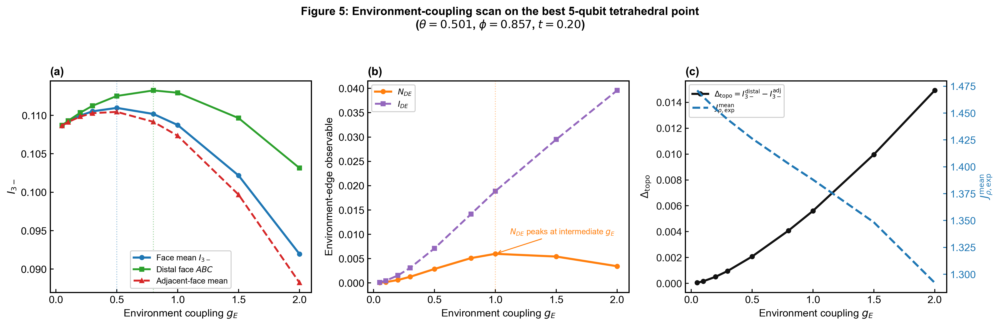

Figure 5 (revised) saved.


In [58]:
# Cell 42 — Figure 5 (revised)
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

x = gE_scan_df["gE"].to_numpy()

# peak locations
idx_peak_mean   = int(np.argmax(gE_scan_df["I3_minus_mean"].to_numpy()))
idx_peak_distal = int(np.argmax(gE_scan_df["I3_minus_distal"].to_numpy()))
idx_peak_NDE    = int(np.argmax(gE_scan_df["N_DE"].to_numpy()))

gE_peak_mean   = x[idx_peak_mean]
gE_peak_distal = x[idx_peak_distal]
gE_peak_NDE    = x[idx_peak_NDE]

fig, axes = plt.subplots(1, 3, figsize=(14.8, 4.8))

# =========================================================
# (a) Face-resolved I3-
# =========================================================
ax = axes[0]
ax.plot(x, gE_scan_df["I3_minus_mean"], '-o', color='#1f77b4', linewidth=2.2, markersize=4.5,
        label=r'Face mean $I_{3-}$')
ax.plot(x, gE_scan_df["I3_minus_distal"], '-s', color='#2ca02c', linewidth=2.0, markersize=4.2,
        label=r'Distal face $ABC$')
ax.plot(x, gE_scan_df["I3_minus_adj_mean"], '--^', color='#d62728', linewidth=2.0, markersize=4.2,
        label=r'Adjacent-face mean')

# peak markers
ax.axvline(gE_peak_mean, color='#1f77b4', linestyle=':', linewidth=1.0, alpha=0.45)
ax.axvline(gE_peak_distal, color='#2ca02c', linestyle=':', linewidth=1.0, alpha=0.45)

# ax.annotate(r'Face mean / adjacent peak',
#             xy=(gE_peak_mean, gE_scan_df["I3_minus_mean"].iloc[idx_peak_mean]),
#             xytext=(gE_peak_mean + 0.18, gE_scan_df["I3_minus_mean"].iloc[idx_peak_mean] - 0.003),
#             fontsize=8.5, color='#1f77b4',
#             arrowprops=dict(arrowstyle='->', lw=1.0, color='#1f77b4'))

# ax.annotate(r'Distal face peaks later',
#             xy=(gE_peak_distal, gE_scan_df["I3_minus_distal"].iloc[idx_peak_distal]),
#             xytext=(gE_peak_distal + 0.08, gE_scan_df["I3_minus_distal"].iloc[idx_peak_distal] + 0.0008),
#             fontsize=8.5, color='#2ca02c',
#             arrowprops=dict(arrowstyle='->', lw=1.0, color='#2ca02c'))

ax.set_xlabel(r'Environment coupling $g_E$')
ax.set_ylabel(r'$I_{3-}$')
ax.set_title('(a)', loc='left', fontweight='bold', fontsize=12)
ax.legend(fontsize=8.5, framealpha=0.95, edgecolor='#cccccc')

# =========================================================
# (b) Environment edge observables on DE
# =========================================================
ax = axes[1]
ax.plot(x, gE_scan_df["N_DE"], '-o', color='#ff7f0e', linewidth=2.2, markersize=4.5,
        label=r'$N_{DE}$')
ax.plot(x, gE_scan_df["I_DE"], '--s', color='#9467bd', linewidth=2.0, markersize=4.2,
        label=r'$I_{DE}$')

ax.axvline(gE_peak_NDE, color='#ff7f0e', linestyle=':', linewidth=1.0, alpha=0.45)
ax.annotate(r'$N_{DE}$ peaks at intermediate $g_E$',
            xy=(gE_peak_NDE, gE_scan_df["N_DE"].iloc[idx_peak_NDE]),
            xytext=(gE_peak_NDE + 0.12, gE_scan_df["N_DE"].iloc[idx_peak_NDE] + 0.004),
            fontsize=8.5, color='#ff7f0e',
            arrowprops=dict(arrowstyle='->', lw=1.0, color='#ff7f0e'))

# ax.text(0.04, 0.08,
#         r'$I_{DE}$ keeps growing while $N_{DE}$ turns over'
#         '\n'
#         r'$\Rightarrow$ edge-local total correlation $\neq$ edge-local entanglement',
#         transform=ax.transAxes, fontsize=8.2, color='#555555',
#         ha='left', va='bottom',
#         bbox=dict(boxstyle='round,pad=0.35', facecolor='#f7f7f7',
#                   edgecolor='#cccccc', alpha=0.95))

ax.set_xlabel(r'Environment coupling $g_E$')
ax.set_ylabel(r'Environment-edge observable')
ax.set_title('(b)', loc='left', fontweight='bold', fontsize=12)
ax.legend(fontsize=8.5, framealpha=0.95, edgecolor='#cccccc')

# =========================================================
# (c) Topological gap + state activation (dual y-axis)
# =========================================================
ax = axes[2]
ax2 = ax.twinx()

line1 = ax.plot(
    x, gE_scan_df["delta_topo"],
    '-o', color='#111111', linewidth=2.2, markersize=4.5,
    label=r'$\Delta_{\mathrm{topo}} = I_{3-}^{\mathrm{distal}} - I_{3-}^{\mathrm{adj}}$'
)

line2 = ax2.plot(
    x, gE_scan_df["J_rho_exp_mean"],
    '--', color='#1f77b4', linewidth=2.2,
    label=r'$J_{\rho,\mathrm{exp}}^{\mathrm{mean}}$'
)

ax.set_xlabel(r'Environment coupling $g_E$')
ax.set_ylabel(r'$\Delta_{\mathrm{topo}}$', color='#111111')
ax2.set_ylabel(r'$J_{\rho,\mathrm{exp}}^{\mathrm{mean}}$', color='#1f77b4')

ax.tick_params(axis='y', colors='#111111')
ax2.tick_params(axis='y', colors='#1f77b4')

ax.set_title('(c)', loc='left', fontweight='bold', fontsize=12)

# combined legend
lines = line1 + line2
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, fontsize=8.3, framealpha=0.95, edgecolor='#cccccc', loc='upper left')

# ax.text(0.04, 0.08,
#         'The topological gap widens as the distal face\n'
#         'remains protected longer than the adjacent faces.',
#         transform=ax.transAxes, fontsize=8.2, color='#555555',
#         ha='left', va='bottom',
#         bbox=dict(boxstyle='round,pad=0.35', facecolor='#f7f7f7',
#                   edgecolor='#cccccc', alpha=0.95))

fig.suptitle(
    'Figure 5: Environment-coupling scan on the best 5-qubit tetrahedral point\n'
    f'($\\theta={theta_best_5q:.3f}$, $\\phi={phi_best_5q:.3f}$, $t={t_best_5q:.2f}$)',
    fontsize=12,
    fontweight='bold',
    y=0.99
)
fig.tight_layout(rect=[0, 0, 1, 0.95])

plt.savefig('Fig5_gE_scan_best_5q_point_revised.png', dpi=300, bbox_inches='tight', pad_inches=0.03)
# plt.savefig('Fig5_gE_scan_best_5q_point_revised.pdf', bbox_inches='tight', pad_inches=0.03)
plt.show()

print("Figure 5 (revised) saved.")

In [59]:
# Cell 43 — 5-qubit open-system data preparation
import qutip as qt
# =========================================================
# Internal-edge helpers on rho_ABCD
# =========================================================
INTERNAL_EDGE_MAP_5Q = {
    "AB": (0, 1),
    "AC": (0, 2),
    "AD": (0, 3),
    "BC": (1, 2),
    "BD": (1, 3),
    "CD": (2, 3),
}

def extract_rho_2q_from_rhoABCD(rho_ABCD, pair_name):
    i, j = INTERNAL_EDGE_MAP_5Q[pair_name]
    return partial_trace(rho_ABCD, keep=[i, j], dims=[2, 2, 2, 2])

def compute_internal_edge_observables_from_rhoABCD(rho_ABCD):
    """
    Directly compute the six internal dyadic observables on the tetrahedron ABCD.
    This avoids the face-mean / divide-by-3 shortcut and keeps the definition explicit.
    """
    edge_results = {}

    I_vals = []
    N_vals = []
    for edge_name in INTERNAL_EDGE_MAP_5Q.keys():
        rho_2q = extract_rho_2q_from_rhoABCD(rho_ABCD, edge_name)
        I_edge = mutual_info_2q(rho_2q)
        N_edge = negativity(rho_2q, dims=[2, 2], pt_subsys=0)

        edge_results[f"I_{edge_name}"] = I_edge
        edge_results[f"N_{edge_name}"] = N_edge

        I_vals.append(I_edge)
        N_vals.append(N_edge)

    I_vals = np.array(I_vals, dtype=float)
    N_vals = np.array(N_vals, dtype=float)

    edge_results["I2_internal_mean"] = float(np.mean(I_vals))   # divide by 6 built in
    edge_results["I2_internal_std"]  = float(np.std(I_vals))
    edge_results["N2_internal_mean"] = float(np.mean(N_vals))   # divide by 6 built in
    edge_results["N2_internal_std"]  = float(np.std(N_vals))

    return edge_results

# =========================================================
# Noise helpers
# =========================================================
def prepare_route5_time_arrays(cfg):
    t_list_prep = np.linspace(0.0, cfg["t_prep"], cfg["steps_prep"])
    t_list_open = np.linspace(cfg["t_prep"], cfg["t_prep"] + cfg["t_open"], cfg["steps_open"])
    t_total = np.concatenate([t_list_prep, t_list_open[1:]])
    return t_list_prep, t_list_open, t_total

def make_route5_initial_density():
    psi0_vec = psi0_random_product_fixed_5q
    rho0_np = np.outer(psi0_vec, psi0_vec.conj())
    return qt.Qobj(rho0_np, dims=[[2, 2, 2, 2, 2], [2, 2, 2, 2, 2]])

def make_c_ops_route5(noise_type, gamma):
    """
    Add decoherence on the tetrahedron nodes A, B, C, D only.
    E remains a coherent environment edge node.
    """
    c_ops = []
    for i in range(4):   # A, B, C, D
        if noise_type == 'amplitude':
            op_list = [qt.qeye(2)] * 5
            op_list[i] = qt.destroy(2)
            c_ops.append(np.sqrt(gamma) * qt.tensor(op_list))

        elif noise_type == 'dephasing':
            op_list = [qt.qeye(2)] * 5
            op_list[i] = qt.sigmaz()
            c_ops.append(np.sqrt(gamma) * qt.tensor(op_list))

        elif noise_type == 'depolarizing':
            for pauli in [qt.sigmax(), qt.sigmay(), qt.sigmaz()]:
                op_list = [qt.qeye(2)] * 5
                op_list[i] = pauli
                c_ops.append(np.sqrt(gamma / 3.0) * qt.tensor(op_list))

        else:
            raise ValueError(f"Unknown noise_type: {noise_type}")

    return c_ops

# =========================================================
# Top-k prepared family selection
# =========================================================
def route5_selection_score(prep_summary):
    """
    Selection score for 5-qubit open-system benchmark.
    We want both:
      - visible higher-order signal
      - visible internal edge entanglement baseline
    """
    return prep_summary["I3_minus_face_mean"] * (prep_summary["N2_internal_mean"] + 1e-10)

def select_topk_prepared_families_route5(cfg):
    rng = np.random.default_rng(cfg["rng_seed"])
    candidates = []

    for s in range(cfg["num_pool"]):
        th_rand = rng.uniform(0.1, np.pi / 2)
        ph_rand = rng.uniform(0.0, np.pi / 2)

        # use the existing 5q unitary engine at prep time
        res = run_fixed_norm_case_5q(
            th_rand,
            ph_rand,
            gE=cfg["gE"],
            t=cfg["t_prep"],
            init_mode="custom",
            custom_state=psi0_random_product_fixed_5q,
            verbose=False,
        )

        internal_obs = compute_internal_edge_observables_from_rhoABCD(res["rho_ABCD"])

        prep_summary = {
            "I3_minus_face_mean": res["I3_minus_mean"],
            "I3_minus_distal": res["I3_minus_distal"],
            "I3_minus_adj_mean": res["I3_minus_adj_mean"],
            "I2_internal_mean": internal_obs["I2_internal_mean"],
            "N2_internal_mean": internal_obs["N2_internal_mean"],
            "N_DE": res["N_DE"],
            "I_DE": res["I_DE"],
        }

        candidates.append({
            "theta": th_rand,
            "phi": ph_rand,
            "coeffs": res["coeffs"],
            "prep_summary": prep_summary,
            "score": route5_selection_score(prep_summary),
        })

    candidates_sorted = sorted(candidates, key=lambda x: x["score"], reverse=True)
    selected = candidates_sorted[:cfg["top_k"]]
    return selected

In [60]:
# =========================================================
# Route-5 open-system config
# =========================================================
ROUTE5_OPEN_CFG = {
    "num_pool": 60,          # candidate families before top-k selection
    "top_k": 10,             # keep only top-k prepared families
    "t_prep": 0.80,          # unitary prep time
    "t_open": 1.20,          # noisy evolution duration
    "steps_prep": 50,
    "steps_open": 60,
    "gamma": 0.20,           # decoherence strength
    "gE": 0.20,              # environment edge strength; change here if needed
    "rng_seed": 123,
    "noise_types": ['amplitude', 'dephasing', 'depolarizing'],
    "noise_labels": ['Amplitude', 'Dephasing', 'Depolarizing'],
}

In [61]:
# =========================================================
# Main Route-5 open-system driver
# =========================================================
def run_route5_open_system(cfg):
    t_list_prep, t_list_open, t_total = prepare_route5_time_arrays(cfg)
    rho0_qobj = make_route5_initial_density()

    print("=== Route-5 open system: selecting top-k prepared families ===")
    selected_families = select_topk_prepared_families_route5(cfg)

    print(f"\nSelected top-k = {cfg['top_k']} families")
    for i, item in enumerate(selected_families[:8], 1):
        ps = item["prep_summary"]
        print(
            f"{i:>2d}. theta={item['theta']:.3f}, phi={item['phi']:.3f}, "
            f"I3_mean={ps['I3_minus_face_mean']:.6f}, "
            f"N2_int_mean={ps['N2_internal_mean']:.6f}, "
            f"I2_int_mean={ps['I2_internal_mean']:.6f}, "
            f"N_DE={ps['N_DE']:.6f}, "
            f"score={item['score']:.6e}"
        )

    results_by_noise = {}

    for noise_type in cfg["noise_types"]:
        print(f"\n--- Route-5 open / noise = {noise_type} ---")

        all_I3m_face_mean = []
        all_I3m_distal = []
        all_I3m_adj = []

        all_I2_internal_mean = []
        all_N2_internal_mean = []

        all_I_DE = []
        all_N_DE = []

        for idx, fam in enumerate(selected_families):
            coeffs = fam["coeffs"]
            H5 = build_hamiltonians_5q(coeffs)
            H_qobj = qt.Qobj(H5["H_tot"], dims=[[2, 2, 2, 2, 2], [2, 2, 2, 2, 2]])

            # 1) unitary prep
            res_prep = qt.mesolve(H_qobj, rho0_qobj, t_list_prep, [], [])
            rho_ready_qobj = res_prep.states[-1]

            # 2) noisy evolution on A-D
            c_ops = make_c_ops_route5(noise_type, cfg["gamma"])
            res_open = qt.mesolve(H_qobj, rho_ready_qobj, t_list_open, c_ops, [])

            # stitch prep + noisy part
            full_states = res_prep.states + res_open.states[1:]

            traj_I3m_face_mean = []
            traj_I3m_distal = []
            traj_I3m_adj = []

            traj_I2_internal_mean = []
            traj_N2_internal_mean = []

            traj_I_DE = []
            traj_N_DE = []

            for rho_t_qobj in full_states:
                rho5 = rho_t_qobj.full()
                rho_ABCD = partial_trace(rho5, keep=[0, 1, 2, 3], dims=[2, 2, 2, 2, 2])

                # facewise I3-
                face_I3 = {}
                for face_name in FACE_MAP_5Q.keys():
                    rho_face = extract_face_rho_from_rhoABCD(rho_ABCD, face_name)
                    obs_face = compute_state_observables(rho_face)
                    face_I3[face_name] = obs_face["I3_minus"]

                face_vals = np.array([face_I3[f] for f in FACE_MAP_5Q.keys()], dtype=float)
                I3m_face_mean = float(np.mean(face_vals))
                I3m_distal = float(face_I3[DISTAL_FACE_5Q])
                I3m_adj = float(np.mean([face_I3[f] for f in ADJACENT_FACES_5Q]))

                # direct internal 6-edge averages
                internal_obs = compute_internal_edge_observables_from_rhoABCD(rho_ABCD)
                I2_internal_mean = internal_obs["I2_internal_mean"]
                N2_internal_mean = internal_obs["N2_internal_mean"]

                # environment edge
                rho_DE = extract_rho_DE_from_rho5(rho5)
                I_DE = mutual_info_2q(rho_DE)
                N_DE = negativity(rho_DE, dims=[2, 2], pt_subsys=0)

                traj_I3m_face_mean.append(I3m_face_mean)
                traj_I3m_distal.append(I3m_distal)
                traj_I3m_adj.append(I3m_adj)

                traj_I2_internal_mean.append(I2_internal_mean)
                traj_N2_internal_mean.append(N2_internal_mean)

                traj_I_DE.append(I_DE)
                traj_N_DE.append(N_DE)

            all_I3m_face_mean.append(traj_I3m_face_mean)
            all_I3m_distal.append(traj_I3m_distal)
            all_I3m_adj.append(traj_I3m_adj)

            all_I2_internal_mean.append(traj_I2_internal_mean)
            all_N2_internal_mean.append(traj_N2_internal_mean)

            all_I_DE.append(traj_I_DE)
            all_N_DE.append(traj_N_DE)

            if (idx + 1) % 4 == 0 or (idx + 1) == len(selected_families):
                print(f"  {idx+1}/{len(selected_families)}")

        # stack
        all_I3m_face_mean = np.array(all_I3m_face_mean)
        all_I3m_distal = np.array(all_I3m_distal)
        all_I3m_adj = np.array(all_I3m_adj)

        all_I2_internal_mean = np.array(all_I2_internal_mean)
        all_N2_internal_mean = np.array(all_N2_internal_mean)

        all_I_DE = np.array(all_I_DE)
        all_N_DE = np.array(all_N_DE)

        results_by_noise[noise_type] = {
            # raw trajectories
            "all_I3m_face_mean": all_I3m_face_mean,
            "all_I3m_distal": all_I3m_distal,
            "all_I3m_adj": all_I3m_adj,

            "all_I2_internal_mean": all_I2_internal_mean,
            "all_N2_internal_mean": all_N2_internal_mean,

            "all_I_DE": all_I_DE,
            "all_N_DE": all_N_DE,

            # mean/std trajectories
            "mean_I3m_face_mean": np.mean(all_I3m_face_mean, axis=0),
            "std_I3m_face_mean": np.std(all_I3m_face_mean, axis=0),

            "mean_I3m_distal": np.mean(all_I3m_distal, axis=0),
            "std_I3m_distal": np.std(all_I3m_distal, axis=0),

            "mean_I3m_adj": np.mean(all_I3m_adj, axis=0),
            "std_I3m_adj": np.std(all_I3m_adj, axis=0),

            "mean_I2_internal_mean": np.mean(all_I2_internal_mean, axis=0),
            "std_I2_internal_mean": np.std(all_I2_internal_mean, axis=0),

            "mean_N2_internal_mean": np.mean(all_N2_internal_mean, axis=0),
            "std_N2_internal_mean": np.std(all_N2_internal_mean, axis=0),

            "mean_I_DE": np.mean(all_I_DE, axis=0),
            "std_I_DE": np.std(all_I_DE, axis=0),

            "mean_N_DE": np.mean(all_N_DE, axis=0),
            "std_N_DE": np.std(all_N_DE, axis=0),
        }

    return {
        "cfg": cfg,
        "selected_families": selected_families,
        "results_by_noise": results_by_noise,
        "t_list_prep": t_list_prep,
        "t_list_open": t_list_open,
        "t_total": t_total,
    }

# =========================================================
# Execute data preparation
# =========================================================
route5_open_output = run_route5_open_system(ROUTE5_OPEN_CFG)

results_by_noise_route5 = route5_open_output["results_by_noise"]
route5_selected_families = route5_open_output["selected_families"]
t_list_prep_route5 = route5_open_output["t_list_prep"]
t_list_open_route5 = route5_open_output["t_list_open"]
t_total_route5 = route5_open_output["t_total"]

print("\nRoute-5 open-system data ready.")
print("Available trajectory keys per noise channel:")
print([
    "mean_I3m_face_mean", "mean_I3m_distal", "mean_I3m_adj",
    "mean_I2_internal_mean", "mean_N2_internal_mean",
    "mean_I_DE", "mean_N_DE"
])

=== Route-5 open system: selecting top-k prepared families ===

Selected top-k = 10 families
 1. theta=0.302, phi=0.667, I3_mean=0.469857, N2_int_mean=0.074329, I2_int_mean=0.419456, N_DE=0.000000, score=3.492400e-02
 2. theta=0.630, phi=1.006, I3_mean=0.444146, N2_int_mean=0.076858, I2_int_mean=0.428710, N_DE=0.000058, score=3.413616e-02
 3. theta=0.540, phi=0.828, I3_mean=0.458334, N2_int_mean=0.073238, I2_int_mean=0.408324, N_DE=0.000759, score=3.356748e-02
 4. theta=0.450, phi=1.202, I3_mean=0.526879, N2_int_mean=0.061502, I2_int_mean=0.355836, N_DE=0.000506, score=3.240406e-02
 5. theta=0.683, phi=0.035, I3_mean=0.623103, N2_int_mean=0.051572, I2_int_mean=0.365119, N_DE=0.000000, score=3.213457e-02
 6. theta=1.328, phi=0.968, I3_mean=0.471391, N2_int_mean=0.065961, I2_int_mean=0.405616, N_DE=0.000000, score=3.109323e-02
 7. theta=0.793, phi=1.144, I3_mean=0.521129, N2_int_mean=0.055601, I2_int_mean=0.355550, N_DE=0.000000, score=2.897539e-02
 8. theta=1.191, phi=0.990, I3_mean=0.4

C:\Users\liu.xuanc\AppData\Local\anaconda3\Lib\site-packages\qutip\solver\solver_base.py:583: FutureWarning: e_ops will be keyword only from qutip 5.3 for all solver
  warnings.warn(


  4/10
  8/10
  10/10

--- Route-5 open / noise = dephasing ---
  4/10
  8/10
  10/10

--- Route-5 open / noise = depolarizing ---
  4/10
  8/10
  10/10

Route-5 open-system data ready.
Available trajectory keys per noise channel:
['mean_I3m_face_mean', 'mean_I3m_distal', 'mean_I3m_adj', 'mean_I2_internal_mean', 'mean_N2_internal_mean', 'mean_I_DE', 'mean_N_DE']


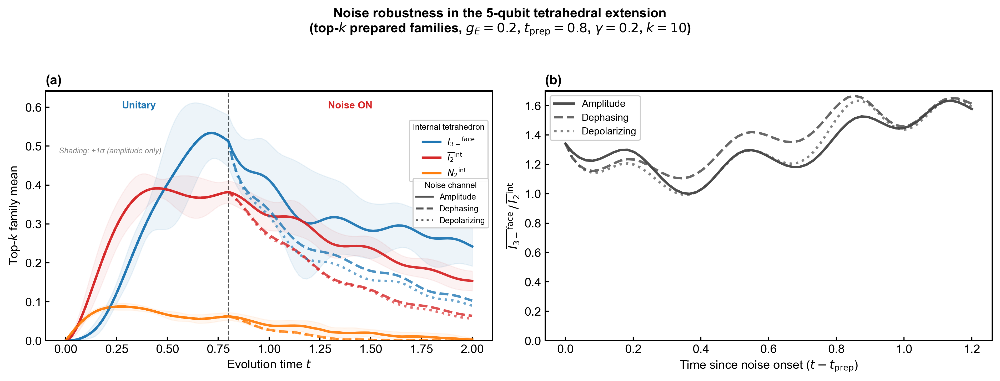

Main-text Figure 6 saved.


In [62]:
# Cell 44 — Main-text Figure 6 (two panels only)
from matplotlib.lines import Line2D

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

noise_types = ROUTE5_OPEN_CFG["noise_types"]
noise_labels = ROUTE5_OPEN_CFG["noise_labels"]
linestyles = ['-', '--', ':']

# colors
color_I3  = '#1f77b4'   # blue
color_I2  = '#d62728'   # red
color_N2  = '#ff7f0e'   # orange

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12.8, 4.9))

# =========================================================
# Panel (a): internal tetrahedron observables (absolute trajectories)
# =========================================================
ax1.axvline(ROUTE5_OPEN_CFG["t_prep"], color='#555555', linewidth=1.0, linestyle='--', zorder=1)

# amplitude-only variance bands
d_amp = results_by_noise_route5['amplitude']
ax1.fill_between(
    t_total_route5,
    np.maximum(0, d_amp['mean_I3m_face_mean'] - d_amp['std_I3m_face_mean']),
    d_amp['mean_I3m_face_mean'] + d_amp['std_I3m_face_mean'],
    color=color_I3, alpha=0.08, zorder=1
)
ax1.fill_between(
    t_total_route5,
    np.maximum(0, d_amp['mean_I2_internal_mean'] - d_amp['std_I2_internal_mean']),
    d_amp['mean_I2_internal_mean'] + d_amp['std_I2_internal_mean'],
    color=color_I2, alpha=0.06, zorder=1
)
ax1.fill_between(
    t_total_route5,
    np.maximum(0, d_amp['mean_N2_internal_mean'] - d_amp['std_N2_internal_mean']),
    d_amp['mean_N2_internal_mean'] + d_amp['std_N2_internal_mean'],
    color=color_N2, alpha=0.06, zorder=1
)

for k, (nt, ls) in enumerate(zip(noise_types, linestyles)):
    d = results_by_noise_route5[nt]
    alpha_val = 0.95 - 0.15 * k

    ax1.plot(
        t_total_route5, d['mean_I3m_face_mean'],
        ls, color=color_I3, linewidth=2.2, alpha=alpha_val, zorder=2
    )
    ax1.plot(
        t_total_route5, d['mean_I2_internal_mean'],
        ls, color=color_I2, linewidth=2.2, alpha=alpha_val, zorder=2
    )
    ax1.plot(
        t_total_route5, d['mean_N2_internal_mean'],
        ls, color=color_N2, linewidth=2.2, alpha=alpha_val, zorder=2
    )

ax1.text(
    ROUTE5_OPEN_CFG["t_prep"] * 0.45, 0.93, 'Unitary',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color=color_I3, fontweight='bold', ha='center'
)
ax1.text(
    (ROUTE5_OPEN_CFG["t_prep"] + t_total_route5[-1]) / 2, 0.93, 'Noise ON',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color=color_I2, fontweight='bold', ha='center'
)

legend_metric_a = [
    Line2D([0], [0], color=color_I3, linewidth=2.2,
           label=r'$\overline{I_{3-}}^{\mathrm{face}}$'),
    Line2D([0], [0], color=color_I2, linewidth=2.2,
           label=r'$\overline{I_{2}}^{\mathrm{int}}$'),
    Line2D([0], [0], color=color_N2, linewidth=2.2,
           label=r'$\overline{N_{2}}^{\mathrm{int}}$'),
]
legend_noise = [
    Line2D([0], [0], color='#555555', linewidth=1.8, linestyle='-', label='Amplitude'),
    Line2D([0], [0], color='#555555', linewidth=1.8, linestyle='--', label='Dephasing'),
    Line2D([0], [0], color='#555555', linewidth=1.8, linestyle=':', label='Depolarizing'),
]

leg1 = ax1.legend(
    handles=legend_metric_a,
    bbox_to_anchor=(1.00, 0.90),
    loc='upper right',
    fontsize=8,
    framealpha=0.95,
    edgecolor='#cccccc',
    title='Internal tetrahedron',
    title_fontsize=7.5
)
ax1.add_artist(leg1)

ax1.legend(
    handles=legend_noise,
    bbox_to_anchor=(1.00, 0.55),
    loc='center right',
    fontsize=7.5,
    framealpha=0.95,
    edgecolor='#cccccc',
    title='Noise channel',
    title_fontsize=7.5
)

ax1.text(
    0.03, 0.75,
    'Shading: ±1σ (amplitude only)',
    transform=ax1.transAxes,
    fontsize=7,
    color='#888888',
    style='italic'
)

ax1.set_xlabel('Evolution time $t$')
ax1.set_ylabel('Top-$k$ family mean')
ax1.set_ylim(bottom=0)
ax1.set_title('(a)', loc='left', fontweight='bold', fontsize=12)

# =========================================================
# Panel (b): post-noise ratio I3_minus / I2_internal_mean
# =========================================================
idx_switch = len(t_list_prep_route5) - 1
t_after = t_total_route5[idx_switch:] - ROUTE5_OPEN_CFG["t_prep"]

for k, (nt, lab, ls) in enumerate(zip(noise_types, noise_labels, linestyles)):
    d = results_by_noise_route5[nt]

    mean_I3_after = d['mean_I3m_face_mean'][idx_switch:]
    mean_I2_after = d['mean_I2_internal_mean'][idx_switch:]

    I20 = mean_I2_after[0]
    cutoff = max(1e-10, 0.05 * I20)

    ratio = np.where(
        mean_I2_after > cutoff,
        mean_I3_after / mean_I2_after,
        np.nan
    )

    ax2.plot(
        t_after, ratio,
        ls,
        color='#444444',
        linewidth=2.2,
        alpha=0.95 - 0.15 * k,
        label=lab
    )

ax2.set_xlabel(r'Time since noise onset ($t - t_{\mathrm{prep}}$)')
ax2.set_ylabel(r'$\overline{I_{3-}}^{\mathrm{face}} \,/\, \overline{I_{2}}^{\mathrm{int}}$')
ax2.set_ylim(bottom=0)
ax2.legend(loc='upper left', fontsize=9, framealpha=0.95, edgecolor='#cccccc')
ax2.set_title('(b)', loc='left', fontweight='bold', fontsize=12)

fig.suptitle(
    f'Noise robustness in the 5-qubit tetrahedral extension\n'
    f'(top-$k$ prepared families, $g_E={ROUTE5_OPEN_CFG["gE"]}$, '
    f'$t_{{\\mathrm{{prep}}}}={ROUTE5_OPEN_CFG["t_prep"]}$, '
    f'$\\gamma={ROUTE5_OPEN_CFG["gamma"]}$, $k={ROUTE5_OPEN_CFG["top_k"]}$)',
    fontsize=12,
    fontweight='bold',
    y=0.98
)

fig.tight_layout(rect=[0, 0, 1, 0.95])

plt.savefig('Fig6_5q_open_system_maintext.png', dpi=300, bbox_inches='tight', pad_inches=0.03)
# plt.savefig('Fig6_5q_open_system_maintext.pdf', bbox_inches='tight', pad_inches=0.03)

plt.show()
print("Main-text Figure 6 saved.")

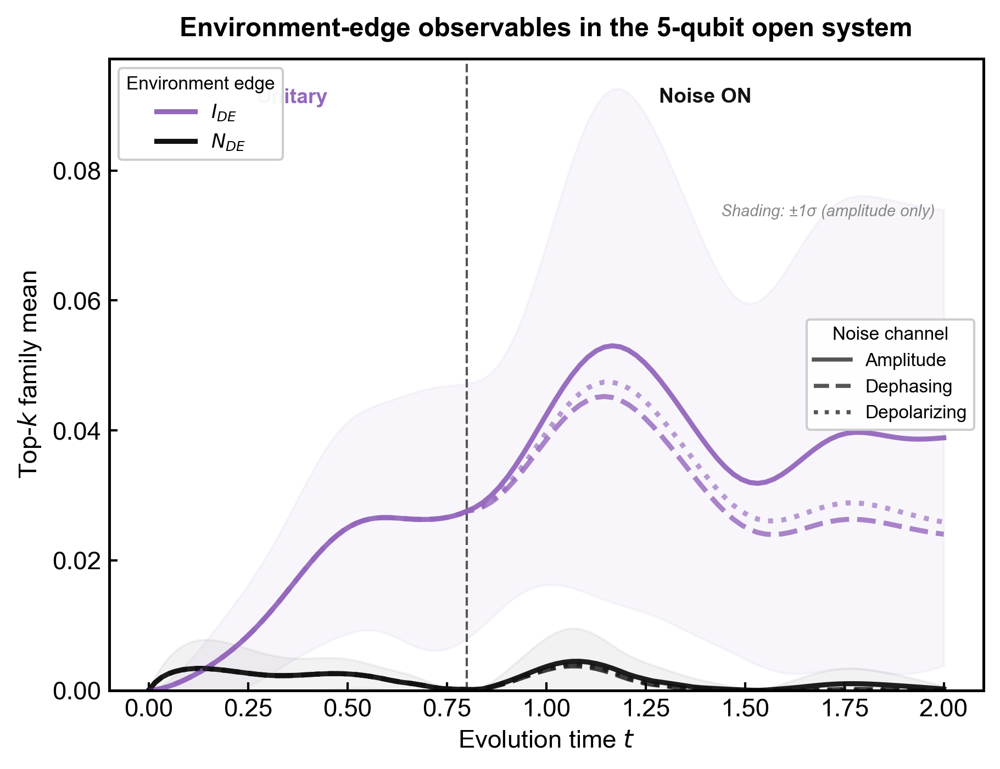

Supplementary environment-edge figure saved.


In [63]:
# Cell 45 — Supplementary Figure: environment-edge observables on DE
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

noise_types = ROUTE5_OPEN_CFG["noise_types"]
noise_labels = ROUTE5_OPEN_CFG["noise_labels"]
linestyles = ['-', '--', ':']

color_IDE = '#9467bd'   # purple
color_NDE = '#111111'   # black

fig, ax = plt.subplots(figsize=(6.2, 4.8))

ax.axvline(ROUTE5_OPEN_CFG["t_prep"], color='#555555', linewidth=1.0, linestyle='--', zorder=1)

# amplitude-only variance bands
d_amp = results_by_noise_route5['amplitude']
ax.fill_between(
    t_total_route5,
    np.maximum(0, d_amp['mean_I_DE'] - d_amp['std_I_DE']),
    d_amp['mean_I_DE'] + d_amp['std_I_DE'],
    color=color_IDE, alpha=0.06, zorder=1
)
ax.fill_between(
    t_total_route5,
    np.maximum(0, d_amp['mean_N_DE'] - d_amp['std_N_DE']),
    d_amp['mean_N_DE'] + d_amp['std_N_DE'],
    color=color_NDE, alpha=0.05, zorder=1
)

for k, (nt, ls) in enumerate(zip(noise_types, linestyles)):
    d = results_by_noise_route5[nt]
    alpha_val = 0.95 - 0.15 * k

    ax.plot(
        t_total_route5, d['mean_I_DE'],
        ls, color=color_IDE, linewidth=2.2, alpha=alpha_val, zorder=2
    )
    ax.plot(
        t_total_route5, d['mean_N_DE'],
        ls, color=color_NDE, linewidth=2.2, alpha=alpha_val, zorder=2
    )

ax.text(
    ROUTE5_OPEN_CFG["t_prep"] * 0.45, 0.93, 'Unitary',
    transform=ax.get_xaxis_transform(),
    fontsize=9, color=color_IDE, fontweight='bold', ha='center'
)
ax.text(
    (ROUTE5_OPEN_CFG["t_prep"] + t_total_route5[-1]) / 2, 0.93, 'Noise ON',
    transform=ax.get_xaxis_transform(),
    fontsize=9, color=color_NDE, fontweight='bold', ha='center'
)

legend_metric = [
    Line2D([0], [0], color=color_IDE, linewidth=2.2, label=r'$I_{DE}$'),
    Line2D([0], [0], color=color_NDE, linewidth=2.2, label=r'$N_{DE}$'),
]
legend_noise = [
    Line2D([0], [0], color='#555555', linewidth=1.8, linestyle='-', label='Amplitude'),
    Line2D([0], [0], color='#555555', linewidth=1.8, linestyle='--', label='Dephasing'),
    Line2D([0], [0], color='#555555', linewidth=1.8, linestyle=':', label='Depolarizing'),
]

leg1 = ax.legend(
    handles=legend_metric,
    loc='upper left',
    fontsize=8.5,
    framealpha=0.95,
    edgecolor='#cccccc',
    title='Environment edge',
    title_fontsize=8
)
ax.add_artist(leg1)

ax.legend(
    handles=legend_noise,
    loc='center right',
    fontsize=8.0,
    framealpha=0.95,
    edgecolor='#cccccc',
    title='Noise channel',
    title_fontsize=8
)

ax.text(
    0.70, 0.75,
    'Shading: ±1σ (amplitude only)',
    transform=ax.transAxes,
    fontsize=7,
    color='#888888',
    style='italic'
)

ax.set_xlabel('Evolution time $t$')
ax.set_ylabel('Top-$k$ family mean')
ax.set_ylim(bottom=0)
ax.set_title('Environment-edge observables in the 5-qubit open system',
             fontsize=11.5, fontweight='bold', pad=10)

fig.tight_layout()

plt.savefig('FigS2_5q_open_system_environment_edge.png', dpi=300, bbox_inches='tight', pad_inches=0.03)
# plt.savefig('FigS2_5q_open_system_environment_edge.pdf', bbox_inches='tight', pad_inches=0.03)

plt.show()
print("Supplementary environment-edge figure saved.")

In [64]:
# Cell 46 — 5-qubit crossover helpers
"""
New metrics for the 5-qubit crossover figure:
- target: I3_minus_mean
- mechanism: J_rho_exp_mean, J_tot_mean
- baseline: face-mean linear entropy
"""

def face_mean_linear_entropy_from_result_5q(result_5q):
    """
    Mean linear entropy across the 4 triangular faces of the tetrahedron.
    Each face result already stores rho_face in result_5q["face_results"][face_name]["rho_face"].
    """
    vals = []
    for face_name in FACE_MAP_5Q.keys():
        rho_face = result_5q["face_results"][face_name]["rho_face"]
        vals.append(1.0 - np.real(np.trace(rho_face @ rho_face)))
    return float(np.mean(vals))

def summarize_scan_numeric_5q(results, target_key="I3_minus_mean"):
    """
    Numeric summary for one 5-qubit time slice.
    """
    if len(results) == 0:
        return {
            "N": 0,
            "corr_J_rho_exp_mean": np.nan,
            "corr_J_tot_mean": np.nan,
            "corr_SL_face_mean": np.nan,
            "corr_P_pair_mean": np.nan,
            "corr_N_pair_sum_mean": np.nan,
            "corr_N_DE": np.nan,
            "target_max": np.nan,
            "target_mean": np.nan,
        }

    target = np.array([r[target_key] for r in results], dtype=float)
    Jr = np.array([r["J_rho_exp_mean"] for r in results], dtype=float)
    Jt = np.array([r["J_tot_mean"] for r in results], dtype=float)
    SLf = np.array([face_mean_linear_entropy_from_result_5q(r) for r in results], dtype=float)
    Pp = np.array([r["P_pair_mean"] for r in results], dtype=float)
    Np = np.array([r["N_pair_sum_mean"] for r in results], dtype=float)
    NDE = np.array([r["N_DE"] for r in results], dtype=float)

    return {
        "N": len(results),
        "corr_J_rho_exp_mean": safe_corr(Jr, target),
        "corr_J_tot_mean": safe_corr(Jt, target),
        "corr_SL_face_mean": safe_corr(SLf, target),
        "corr_P_pair_mean": safe_corr(Pp, target),
        "corr_N_pair_sum_mean": safe_corr(Np, target),
        "corr_N_DE": safe_corr(NDE, target),
        "target_max": float(np.nanmax(target)),
        "target_mean": float(np.nanmean(target)),
    }

def scan_over_time_5q(
    theta_vals,
    phi_vals,
    t_vals,
    gE=0.20,
    init_mode="random_product",
    rng_seed=None,
    custom_state=None,
    target_key="I3_minus_mean",
):
    """
    5-qubit time scan:
    for each t, scan the full (theta, phi) grid and summarize the correlations.
    """
    all_summaries = []

    for tv in t_vals:
        results_t = scan_fixed_norm_5q(
            theta_vals,
            phi_vals,
            gE=gE,
            t=tv,
            init_mode=init_mode,
            rng_seed=rng_seed,
            custom_state=custom_state,
        )
        summary_t = summarize_scan_numeric_5q(results_t, target_key=target_key)
        summary_t["t"] = tv
        all_summaries.append(summary_t)

    return all_summaries

def compute_crossover_time_from_arrays(t_arr, Jr_arr, Jt_arr):
    """
    Compute the first crossing time where J_tot correlation overtakes J_rho_exp correlation.
    """
    t_arr = np.asarray(t_arr, dtype=float)
    Jr_arr = np.asarray(Jr_arr, dtype=float)
    Jt_arr = np.asarray(Jt_arr, dtype=float)

    diff = Jt_arr - Jr_arr
    cross_indices = np.where(diff >= 0)[0]

    if len(cross_indices) == 0:
        return t_arr[-1], diff, cross_indices

    idx_c = cross_indices[0]
    if idx_c == 0:
        return t_arr[0], diff, cross_indices

    # linear interpolation
    t_cross = t_arr[idx_c - 1] + (t_arr[idx_c] - t_arr[idx_c - 1]) * (-diff[idx_c - 1]) / (diff[idx_c] - diff[idx_c - 1])
    return float(t_cross), diff, cross_indices

In [65]:
# Cell 47 (dense version) — rerun 5-qubit crossover time scan
"""
Dense 5-qubit crossover time scan around the observed transition regions.
"""

# keep the same environment strength unless you want to switch again
gE_time_scan_5q = 0.20

# denser grid around the sharp transitions:
# 0.15–0.25, 0.25–0.45, 0.70–0.90
t_vals_5q_crossover = np.sort(np.unique(np.concatenate([
    np.linspace(0.05, 0.15, 5),   # coarse early regime
    np.linspace(0.15, 0.25, 9),   # dense around first transition
    np.linspace(0.25, 0.45, 11),  # dense around rapid growth / sign flip
    np.linspace(0.45, 0.70, 6),   # moderate density
    np.linspace(0.70, 0.90, 9),   # dense around late transition
    np.linspace(0.90, 1.00, 3),   # coarse tail
])))

print("=== 5-qubit crossover time scan (dense) ===")
print(f"gE = {gE_time_scan_5q}")
print(f"time grid = {t_vals_5q_crossover}")

time_summaries_5q = scan_over_time_5q(
    theta_vals_5q,
    phi_vals_5q,
    t_vals_5q_crossover,
    gE=gE_time_scan_5q,
    init_mode="custom",
    custom_state=psi0_random_product_fixed_5q,
    target_key="I3_minus_mean",
)

# convert to arrays for later plotting
t_d_5q = np.array([row["t"] for row in time_summaries_5q], dtype=float)
Jr_d_5q = np.array([row["corr_J_rho_exp_mean"] for row in time_summaries_5q], dtype=float)
Jt_d_5q = np.array([row["corr_J_tot_mean"] for row in time_summaries_5q], dtype=float)
SL_d_5q = np.array([row["corr_SL_face_mean"] for row in time_summaries_5q], dtype=float)
I3m_d_5q = np.array([row["target_max"] for row in time_summaries_5q], dtype=float)

# optional extra arrays that may be useful for plotting or diagnosis
Pp_d_5q  = np.array([row["corr_P_pair_mean"] for row in time_summaries_5q], dtype=float)
Np_d_5q  = np.array([row["corr_N_pair_sum_mean"] for row in time_summaries_5q], dtype=float)
NDE_d_5q = np.array([row["corr_N_DE"] for row in time_summaries_5q], dtype=float)

# crossover
t_cross_5q, diff_5q, cross_indices_5q = compute_crossover_time_from_arrays(t_d_5q, Jr_d_5q, Jt_d_5q)

print(f"\nEstimated 5-qubit crossover time: t* ≈ {t_cross_5q:.3f}")

time_scan_5q_df = pd.DataFrame(time_summaries_5q)
print("\n=== Dense time-scan summary table ===")
display(time_scan_5q_df.round(6))

print("\n=== Compact printout ===")
for row in time_summaries_5q:
    print(
        f"t={row['t']:.3f} | "
        f"corr(J_rho_exp_mean, I3_mean)={row['corr_J_rho_exp_mean']:.4f} | "
        f"corr(J_tot_mean, I3_mean)={row['corr_J_tot_mean']:.4f} | "
        f"corr(SL_face_mean, I3_mean)={row['corr_SL_face_mean']:.4f} | "
        f"corr(P_pair_mean, I3_mean)={row['corr_P_pair_mean']:.4f} | "
        f"corr(N_pair_sum_mean, I3_mean)={row['corr_N_pair_sum_mean']:.4f} | "
        f"corr(N_DE, I3_mean)={row['corr_N_DE']:.4f} | "
        f"max(I3_mean)={row['target_max']:.4f}"
    )

=== 5-qubit crossover time scan (dense) ===
gE = 0.2
time grid = [0.05   0.075  0.1    0.125  0.15   0.1625 0.175  0.1875 0.2    0.2125
 0.225  0.2375 0.25   0.27   0.29   0.31   0.33   0.35   0.37   0.39
 0.41   0.43   0.45   0.5    0.55   0.6    0.65   0.7    0.725  0.75
 0.775  0.8    0.825  0.85   0.875  0.9    0.95   1.    ]

Estimated 5-qubit crossover time: t* ≈ 0.050

=== Dense time-scan summary table ===


,N,corr_J_rho_exp_mean,corr_J_tot_mean,corr_SL_face_mean,corr_P_pair_mean,corr_N_pair_sum_mean,corr_N_DE,target_max,target_mean,t
0,144,-0.131163,0.321541,-0.481555,-0.501032,-0.431047,-0.367555,0.005667,0.001125,0.0500
1,144,-0.144787,0.312448,-0.502454,-0.525630,-0.442576,-0.357259,0.013061,0.002669,0.0750
2,144,-0.137901,0.312919,-0.516737,-0.544358,-0.445332,-0.343414,0.024012,0.005096,0.1000
3,144,-0.100943,0.324537,-0.523206,-0.557196,-0.437241,-0.330716,0.039583,0.008682,0.1250
4,144,-0.020541,0.353837,-0.520126,-0.563205,-0.417349,-0.319927,0.059403,0.013900,0.1500
5,144,0.046094,0.383138,-0.511062,-0.559853,-0.396582,-0.317792,0.070803,0.017481,0.1625
6,144,0.133256,0.431850,-0.492481,-0.547703,-0.360788,-0.320446,0.083097,0.022223,0.1750
7,144,0.236675,0.504789,-0.456100,-0.518122,-0.294077,-0.323290,0.096190,0.028934,0.1875
8,144,0.350382,0.593879,-0.357783,-0.429545,-0.150309,-0.300695,0.109974,0.038935,0.2000
9,144,0.416250,0.621912,-0.154837,-0.244219,0.049710,-0.251174,0.124337,0.052714,0.2125



=== Compact printout ===
t=0.050 | corr(J_rho_exp_mean, I3_mean)=-0.1312 | corr(J_tot_mean, I3_mean)=0.3215 | corr(SL_face_mean, I3_mean)=-0.4816 | corr(P_pair_mean, I3_mean)=-0.5010 | corr(N_pair_sum_mean, I3_mean)=-0.4310 | corr(N_DE, I3_mean)=-0.3676 | max(I3_mean)=0.0057
t=0.075 | corr(J_rho_exp_mean, I3_mean)=-0.1448 | corr(J_tot_mean, I3_mean)=0.3124 | corr(SL_face_mean, I3_mean)=-0.5025 | corr(P_pair_mean, I3_mean)=-0.5256 | corr(N_pair_sum_mean, I3_mean)=-0.4426 | corr(N_DE, I3_mean)=-0.3573 | max(I3_mean)=0.0131
t=0.100 | corr(J_rho_exp_mean, I3_mean)=-0.1379 | corr(J_tot_mean, I3_mean)=0.3129 | corr(SL_face_mean, I3_mean)=-0.5167 | corr(P_pair_mean, I3_mean)=-0.5444 | corr(N_pair_sum_mean, I3_mean)=-0.4453 | corr(N_DE, I3_mean)=-0.3434 | max(I3_mean)=0.0240
t=0.125 | corr(J_rho_exp_mean, I3_mean)=-0.1009 | corr(J_tot_mean, I3_mean)=0.3245 | corr(SL_face_mean, I3_mean)=-0.5232 | corr(P_pair_mean, I3_mean)=-0.5572 | corr(N_pair_sum_mean, I3_mean)=-0.4372 | corr(N_DE, I3_mean)=

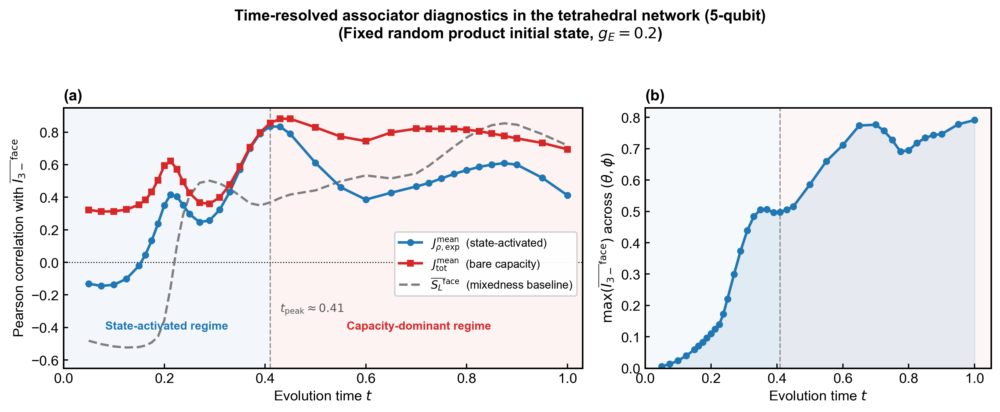

Figure 7 (revised) saved.


In [66]:
# Cell 48 (revised) — Figure 7
'''
Figure 7: Time-resolved associator diagnostics in the tetrahedral network (5-qubit)
Regime split defined by the peak time of J_{rho,exp}^{mean}.
Rebuilt directly from the latest time_scan_5q_df.
'''

import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Pull fresh arrays from the latest dataframe
# ---------------------------------------------------------
t_d_5q = time_scan_5q_df["t"].to_numpy(dtype=float)
Jr_d_5q = time_scan_5q_df["corr_J_rho_exp_mean"].to_numpy(dtype=float)
Jt_d_5q = time_scan_5q_df["corr_J_tot_mean"].to_numpy(dtype=float)
SL_d_5q = time_scan_5q_df["corr_SL_face_mean"].to_numpy(dtype=float)
I3m_d_5q = time_scan_5q_df["target_max"].to_numpy(dtype=float)

# ---------------------------------------------------------
# Peak-based regime boundary from J_rho_exp_mean
# ---------------------------------------------------------
idx_peak_5q = int(np.nanargmax(Jr_d_5q))
t_peak_5q = float(t_d_5q[idx_peak_5q])
Jr_peak_5q = float(Jr_d_5q[idx_peak_5q])

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(11, 4.5),
    gridspec_kw={'width_ratios': [3, 2]}
)

# =========================================================
# panel (a): crossover of mechanism diagnostics
# =========================================================
ax1.axvspan(0.0, t_peak_5q, color='#e3edf7', alpha=0.4, zorder=0)
ax1.axvspan(t_peak_5q, t_d_5q[-1] * 1.05, color='#fae3e3', alpha=0.4, zorder=0)
ax1.axvline(t_peak_5q, color='#555555', linewidth=1.0, linestyle='--', alpha=0.6, zorder=1)

ax1.plot(
    t_d_5q, Jr_d_5q,
    '-o', color='#1f77b4', markersize=4.5, linewidth=2.0,
    label=r'$J_{\rho,\mathrm{exp}}^{\mathrm{mean}}$  (state-activated)',
    zorder=3
)
ax1.plot(
    t_d_5q, Jt_d_5q,
    '-s', color='#d62728', markersize=4.5, linewidth=2.0,
    label=r'$J_{\mathrm{tot}}^{\mathrm{mean}}$  (bare capacity)',
    zorder=3
)
ax1.plot(
    t_d_5q, SL_d_5q,
    '--', color='#7f7f7f', linewidth=1.8,
    label=r'$\overline{S_L}^{\mathrm{face}}$  (mixedness baseline)',
    zorder=2
)

ax1.axhline(0, color='black', linewidth=0.8, linestyle=':', zorder=1)

ax1.text(
    t_peak_5q * 0.50, 0.15, 'State-activated regime',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color='#1f77b4', fontweight='bold', ha='center'
)
ax1.text(
    (t_peak_5q + t_d_5q[-1]) / 2, 0.15, 'Capacity-dominant regime',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color='#d62728', fontweight='bold', ha='center'
)

# ax1.annotate(
#     rf'$t_{{\mathrm{{peak}}}} \approx {t_peak_5q:.2f}$',
#     xy=(t_peak_5q, Jr_peak_5q),
#     xytext=(t_peak_5q + 0.08, -0.12),
#     fontsize=9, color='#555555',
#     arrowprops=dict(arrowstyle='->', color='#555555', lw=1.2)
# )

ax1.text(
    t_peak_5q + 0.02, 0.20,
    rf'$t_{{\mathrm{{peak}}}} \approx {t_peak_5q:.2f}$',
    transform=ax1.get_xaxis_transform(),
    fontsize=9, color='#555555',
    ha='left', va='bottom'
)

ax1.set_xlabel('Evolution time $t$')
ax1.set_ylabel(r'Pearson correlation with $\overline{I_{3-}}^{\mathrm{face}}$')
ax1.set_xlim(0.0, t_d_5q[-1] * 1.03)
ax1.set_ylim(-0.65, 0.95)
ax1.legend(
    bbox_to_anchor=(1.00, 0.40),
    loc='right',
    fontsize=8.8,
    framealpha=0.95,
    edgecolor='#cccccc'
)
ax1.set_title('(a)', loc='left', fontweight='bold', fontsize=12)

# =========================================================
# panel (b): growth of maximal higher-order signal
# =========================================================
ax2.axvspan(0.0, t_peak_5q, color='#e3edf7', alpha=0.3, zorder=0)
ax2.axvspan(t_peak_5q, t_d_5q[-1] * 1.05, color='#fae3e3', alpha=0.3, zorder=0)
ax2.axvline(t_peak_5q, color='#555555', linewidth=1.0, linestyle='--', alpha=0.6, zorder=1)

ax2.fill_between(t_d_5q, 0, I3m_d_5q, color='#1f77b4', alpha=0.10, zorder=1)
ax2.plot(
    t_d_5q, I3m_d_5q,
    '-o', color='#1f77b4', markersize=4.5, linewidth=2.0,
    zorder=2
)

ax2.set_xlabel('Evolution time $t$')
ax2.set_ylabel(r'$\max(\overline{I_{3-}}^{\mathrm{face}})$ across $(\theta,\phi)$')
ax2.set_xlim(0.0, t_d_5q[-1] * 1.05)
ax2.set_ylim(bottom=0)
ax2.set_title('(b)', loc='left', fontweight='bold', fontsize=12)

fig.suptitle(
    'Time-resolved associator diagnostics in the tetrahedral network (5-qubit)\n'
    f'(Fixed random product initial state, $g_E={gE_time_scan_5q}$)',
    fontsize=12, fontweight='bold', y=0.99
)
fig.tight_layout(rect=[0, 0, 1, 0.95])

plt.savefig('Fig7_tetrahedral_5q_time_resolved_associator_diagnostics.png',
            dpi=300, bbox_inches='tight', pad_inches=0.03)
# plt.savefig('Fig7_tetrahedral_5q_time_resolved_associator_diagnostics.pdf',
#             bbox_inches='tight', pad_inches=0.03)
plt.show()

print("Figure 7 (revised) saved.")

In [67]:
time_scan_5q_df.head()

,N,corr_J_rho_exp_mean,corr_J_tot_mean,corr_SL_face_mean,corr_P_pair_mean,corr_N_pair_sum_mean,corr_N_DE,target_max,target_mean,t
0,144,-0.131163,0.321541,-0.481555,-0.501032,-0.431047,-0.367555,0.005667,0.001125,0.050
1,144,-0.144787,0.312448,-0.502454,-0.525630,-0.442576,-0.357259,0.013061,0.002669,0.075
2,144,-0.137901,0.312919,-0.516737,-0.544358,-0.445332,-0.343414,0.024012,0.005096,0.100
3,144,-0.100943,0.324537,-0.523206,-0.557196,-0.437241,-0.330716,0.039583,0.008682,0.125
4,144,-0.020541,0.353837,-0.520126,-0.563205,-0.417349,-0.319927,0.059403,0.013900,0.150


In [130]:
time_scan_5q_df.to_csv("time_scan_5q.csv", index=True)

Inblation test

In [68]:
# Cell A — Associator-null family + interpolation helpers (4-qubit)

def _normalize_vec(v, eps=1e-12):
    v = np.asarray(v, dtype=float)
    n = np.linalg.norm(v)
    if n < eps:
        raise ValueError("Cannot normalize a near-zero vector.")
    return v / n

def resolve_common_axis(axis_mode="z", theta=None, phi=None, axis_vec=None):
    """
    Return a unit vector n defining the common-axis associator-null manifold.

    axis_mode:
      - "z"                : fixed z-axis
      - "x"                : fixed x-axis
      - "y"                : fixed y-axis
      - "reference_direction" : use unit_direction(theta, phi)
      - "custom"           : use axis_vec
    """
    if axis_mode == "z":
        n = np.array([0.0, 0.0, 1.0], dtype=float)
    elif axis_mode == "x":
        n = np.array([1.0, 0.0, 0.0], dtype=float)
    elif axis_mode == "y":
        n = np.array([0.0, 1.0, 0.0], dtype=float)
    elif axis_mode == "reference_direction":
        if theta is None or phi is None:
            raise ValueError("theta and phi are required for axis_mode='reference_direction'.")
        n = unit_direction(theta, phi)
    elif axis_mode == "custom":
        if axis_vec is None:
            raise ValueError("axis_vec must be provided for axis_mode='custom'.")
        n = np.asarray(axis_vec, dtype=float)
    else:
        raise ValueError(f"Unknown axis_mode: {axis_mode}")

    return _normalize_vec(n)

def make_common_axis_null_coeffs_from_reference(ref_coeffs, axis_unit):
    """
    Given a reference coefficient dictionary with keys J_AB, J_BC, J_AC, J_CD,
    build a common-axis family with the SAME edge norms but all aligned to axis_unit.
    This guarantees zero Jordan associator on the ABC face.
    """
    out = {}
    for key, v in ref_coeffs.items():
        edge_norm = np.linalg.norm(v)
        out[key] = edge_norm * axis_unit
    return out

def interpolate_coeff_same_norm(v_null, v_ref, alpha, eps=1e-12):
    """
    Interpolate between v_null and v_ref, then renormalize back to ||v_ref||.
    alpha=0 -> v_null exactly
    alpha=1 -> v_ref exactly
    """
    if not (0.0 <= alpha <= 1.0):
        raise ValueError("alpha must lie in [0, 1].")

    target_norm = np.linalg.norm(v_ref)

    if alpha == 0.0:
        return np.array(v_null, dtype=float)
    if alpha == 1.0:
        return np.array(v_ref, dtype=float)

    v_mix = (1.0 - alpha) * np.asarray(v_null, dtype=float) + alpha * np.asarray(v_ref, dtype=float)
    mix_norm = np.linalg.norm(v_mix)

    if mix_norm < eps:
        raise ValueError("Interpolation produced a near-zero vector; choose another axis/family.")

    return target_norm * v_mix / mix_norm

def build_ablation_edge_coefficients(
    theta,
    phi,
    alpha,
    gD=0.20,
    R=np.sqrt(3.0),
    axis_mode="z",
    axis_vec=None,
):
    """
    Build a 4-qubit ablation family:
      alpha=0 : exact common-axis associator-null family
      alpha=1 : original fixed-norm XYZ family
    """
    ref = build_edge_coefficients(theta, phi, gD=gD, R=R)
    axis_unit = resolve_common_axis(axis_mode=axis_mode, theta=theta, phi=phi, axis_vec=axis_vec)
    null = make_common_axis_null_coeffs_from_reference(ref, axis_unit)

    coeffs = {
        key: interpolate_coeff_same_norm(null[key], ref[key], alpha)
        for key in ref.keys()
    }

    return {
        "coeffs": coeffs,
        "ref_coeffs": ref,
        "null_coeffs": null,
        "axis_unit": axis_unit,
    }

def pairwise_commutator_norms_3q(H_AB_3, H_BC_3, H_AC_3):
    C_AB_BC = H_AB_3 @ H_BC_3 - H_BC_3 @ H_AB_3
    C_AB_AC = H_AB_3 @ H_AC_3 - H_AC_3 @ H_AB_3
    C_BC_AC = H_BC_3 @ H_AC_3 - H_AC_3 @ H_BC_3

    n1 = np.linalg.norm(C_AB_BC, "fro")
    n2 = np.linalg.norm(C_AB_AC, "fro")
    n3 = np.linalg.norm(C_BC_AC, "fro")

    return {
        "comm_AB_BC": n1,
        "comm_AB_AC": n2,
        "comm_BC_AC": n3,
        "comm_max": max(n1, n2, n3),
    }

def run_ablation_case(
    theta,
    phi,
    alpha,
    gD=0.20,
    t=0.10,
    axis_mode="z",
    axis_vec=None,
    init_mode="fixed_random_product",
    rng=None,
    custom_state=None,
    verbose=False,
):
    """
    4-qubit ablation run on the same geometry as run_fixed_norm_case.

    init_mode options:
      - "fixed_random_product" : uses psi0_random_product_fixed
      - anything accepted by make_initial_state ("plus", "random_product", "haar", "custom")
    """
    if init_mode == "fixed_random_product":
        psi0 = make_initial_state(init_mode="custom", custom_state=psi0_random_product_fixed)
        init_mode_record = "fixed_random_product"
    else:
        psi0 = make_initial_state(init_mode=init_mode, rng=rng, custom_state=custom_state)
        init_mode_record = init_mode

    pack = build_ablation_edge_coefficients(
        theta=theta,
        phi=phi,
        alpha=alpha,
        gD=gD,
        R=R,
        axis_mode=axis_mode,
        axis_vec=axis_vec,
    )
    coeffs = pack["coeffs"]

    J_AB = coeffs["J_AB"]
    J_BC = coeffs["J_BC"]
    J_AC = coeffs["J_AC"]
    J_CD = coeffs["J_CD"]

    H4 = build_hamiltonians_4q(J_AB, J_BC, J_AC, J_CD)
    H3 = build_hamiltonians_3q(J_AB, J_BC, J_AC)

    rho_ABC, psi_t = evolve_to_rhoABC(psi0, H4["H_tot_4"], t)

    obs_state = compute_state_observables(rho_ABC)
    obs_probe = mediator_metrics(rho_ABC, H3["H_AB_3"], H3["H_BC_3"], H3["H_AC_3"])
    obs_comm = pairwise_commutator_norms_3q(H3["H_AB_3"], H3["H_BC_3"], H3["H_AC_3"])

    out = {
        "theta": theta,
        "phi": phi,
        "alpha": alpha,
        "gD": gD,
        "t": t,
        "axis_mode": axis_mode,
        "axis_unit": pack["axis_unit"],
        "init_mode": init_mode_record,
        "psi0": psi0,
        "psi_t": psi_t,
        "rho_ABC": rho_ABC,

        "J_AB": J_AB,
        "J_BC": J_BC,
        "J_AC": J_AC,
        "J_CD": J_CD,

        "ref_coeffs": pack["ref_coeffs"],
        "null_coeffs": pack["null_coeffs"],

        **obs_state,
        **obs_probe,
        **obs_comm,
    }

    if verbose:
        print(
            f"alpha={alpha:.2f}, "
            f"J_tot={out['J_tot']:.6e}, "
            f"J_rho_exp={out['J_rho_exp']:.6e}, "
            f"comm_max={out['comm_max']:.6e}, "
            f"I3_minus={out['I3_minus']:.6e}, "
            f"P_pair={out['P_pair']:.6e}, "
            f"N_pair_sum={out['N_pair_sum']:.6e}"
        )

    return out

In [77]:
# Cell K — full ablation scan helpers (4-qubit, fixed-random-product, checkpointed)

from pathlib import Path
import time

def ablation_result_to_row(res):
    return {
        "theta": float(res["theta"]),
        "phi": float(res["phi"]),
        "alpha": float(res["alpha"]),
        "t": float(res["t"]),
        "gD": float(res["gD"]),

        "J_tot": float(res["J_tot"]),
        "J_rho_exp": float(res["J_rho_exp"]),
        "eta": float(res["eta"]) if np.isfinite(res["eta"]) else np.nan,
        "comm_max": float(res["comm_max"]),

        "I3_minus": float(res["I3_minus"]),
        "P_pair": float(res["P_pair"]),
        "N_pair_sum": float(res["N_pair_sum"]),
        "N_tri_geom": float(res["N_tri_geom"]),
        "N_tri_min": float(res["N_tri_min"]),
    }

def scan_ablation_grid(
    theta_vals,
    phi_vals,
    alpha_vals,
    t_vals,
    gD=0.20,
    axis_mode="z",
    init_mode="fixed_random_product",
    checkpoint_csv="ablation_scan_4q.csv",
    verbose_block=True,
):
    """
    Full-grid ablation scan over (theta, phi, alpha, t).
    Saves a slim CSV checkpoint after each (t, alpha) block.
    """
    checkpoint_csv = Path(checkpoint_csv)

    rows = []
    total_blocks = len(t_vals) * len(alpha_vals)
    block_counter = 0

    t0_global = time.time()

    for t_now in t_vals:
        for a in alpha_vals:
            block_counter += 1
            block_start = time.time()
            block_rows = []

            for th in theta_vals:
                for ph in phi_vals:
                    res = run_ablation_case(
                        theta=float(th),
                        phi=float(ph),
                        alpha=float(a),
                        gD=gD,
                        t=float(t_now),
                        axis_mode=axis_mode,
                        init_mode=init_mode,
                        verbose=False,
                    )
                    block_rows.append(ablation_result_to_row(res))

            rows.extend(block_rows)

            # checkpoint after each (t, alpha) block
            df_now = pd.DataFrame(rows)
            df_now.to_csv(checkpoint_csv, index=False)

            if verbose_block:
                dt = time.time() - block_start
                print(
                    f"[{block_counter:>2d}/{total_blocks}] "
                    f"t={t_now:.2f}, alpha={a:.2f}, "
                    f"N_block={len(block_rows)}, "
                    f"elapsed={dt:.1f}s, "
                    f"saved -> {checkpoint_csv}"
                )

    total_dt = time.time() - t0_global
    print(f"\nFull ablation scan completed in {total_dt/60:.2f} min")
    return pd.DataFrame(rows)

def load_ablation_scan(checkpoint_csv="ablation_scan_4q.csv"):
    checkpoint_csv = Path(checkpoint_csv)
    if not checkpoint_csv.exists():
        raise FileNotFoundError(f"Checkpoint file not found: {checkpoint_csv}")
    return pd.read_csv(checkpoint_csv)

In [78]:
# Cell L — run the full interpolation scan

alpha_vals_full = np.linspace(0.0, 1.0, 11)
t_vals_ablation = [0.10, 0.15, 0.25]

ablation_scan_df = scan_ablation_grid(
    theta_vals=theta_vals,
    phi_vals=phi_vals,
    alpha_vals=alpha_vals_full,
    t_vals=t_vals_ablation,
    gD=gD_default,
    axis_mode="z",
    init_mode="fixed_random_product",
    checkpoint_csv="ablation_scan_4q.csv",
    verbose_block=True,
)

ablation_scan_df.head()

[ 1/33] t=0.10, alpha=0.00, N_block=400, elapsed=2.8s, saved -> ablation_scan_4q.csv
[ 2/33] t=0.10, alpha=0.10, N_block=400, elapsed=2.9s, saved -> ablation_scan_4q.csv
[ 3/33] t=0.10, alpha=0.20, N_block=400, elapsed=3.3s, saved -> ablation_scan_4q.csv
[ 4/33] t=0.10, alpha=0.30, N_block=400, elapsed=3.0s, saved -> ablation_scan_4q.csv
[ 5/33] t=0.10, alpha=0.40, N_block=400, elapsed=3.2s, saved -> ablation_scan_4q.csv
[ 6/33] t=0.10, alpha=0.50, N_block=400, elapsed=3.1s, saved -> ablation_scan_4q.csv
[ 7/33] t=0.10, alpha=0.60, N_block=400, elapsed=3.1s, saved -> ablation_scan_4q.csv
[ 8/33] t=0.10, alpha=0.70, N_block=400, elapsed=2.9s, saved -> ablation_scan_4q.csv
[ 9/33] t=0.10, alpha=0.80, N_block=400, elapsed=3.0s, saved -> ablation_scan_4q.csv
[10/33] t=0.10, alpha=0.90, N_block=400, elapsed=3.1s, saved -> ablation_scan_4q.csv
[11/33] t=0.10, alpha=1.00, N_block=400, elapsed=2.8s, saved -> ablation_scan_4q.csv
[12/33] t=0.15, alpha=0.00, N_block=400, elapsed=2.8s, saved -> a

,theta,phi,alpha,t,gD,J_tot,J_rho_exp,eta,comm_max,I3_minus,P_pair,N_pair_sum,N_tri_geom,N_tri_min
0,0.1,0.000000,0.0,0.1,0.2,0.0,0.0,NaN,0.0,0.0,0.742489,0.353373,0.198528,0.192081
1,0.1,0.082673,0.0,0.1,0.2,0.0,0.0,NaN,0.0,0.0,0.742489,0.353373,0.198528,0.192081
2,0.1,0.165347,0.0,0.1,0.2,0.0,0.0,NaN,0.0,0.0,0.742489,0.353373,0.198528,0.192081
3,0.1,0.248020,0.0,0.1,0.2,0.0,0.0,NaN,0.0,0.0,0.742489,0.353373,0.198528,0.192081
4,0.1,0.330694,0.0,0.1,0.2,0.0,0.0,NaN,0.0,0.0,0.742489,0.353373,0.198528,0.192081


In [79]:
# Cell M — global summaries by (t, alpha)

def summarize_ablation_block(df_block):
    target = df_block["I3_minus"].to_numpy(dtype=float)
    Jr = df_block["J_rho_exp"].to_numpy(dtype=float)
    Jt = df_block["J_tot"].to_numpy(dtype=float)
    Eta = df_block["eta"].to_numpy(dtype=float)
    Pp = df_block["P_pair"].to_numpy(dtype=float)
    N2 = df_block["N_pair_sum"].to_numpy(dtype=float)

    return {
        "N": len(df_block),

        "I3_mean": float(np.nanmean(target)),
        "I3_median": float(np.nanmedian(target)),
        "I3_max": float(np.nanmax(target)),

        "P_mean": float(np.nanmean(Pp)),
        "N2_mean": float(np.nanmean(N2)),

        "corr_Jrho_I3": safe_corr(Jr, target),
        "corr_Jtot_I3": safe_corr(Jt, target),
        "corr_eta_I3": safe_corr(Eta, target),
        "corr_P_I3": safe_corr(Pp, target),
        "corr_N2_I3": safe_corr(N2, target),

        "Jtot_mean": float(np.nanmean(Jt)),
        "Jrho_mean": float(np.nanmean(Jr)),
    }

summary_rows = []

for (t_now, a), sub in ablation_scan_df.groupby(["t", "alpha"]):
    out = summarize_ablation_block(sub)
    out["t"] = float(t_now)
    out["alpha"] = float(a)
    summary_rows.append(out)

ablation_summary_df = (
    pd.DataFrame(summary_rows)
    .sort_values(["t", "alpha"])
    .reset_index(drop=True)
)

ablation_summary_df

,N,I3_mean,I3_median,I3_max,P_mean,N2_mean,corr_Jrho_I3,corr_Jtot_I3,corr_eta_I3,corr_P_I3,corr_N2_I3,Jtot_mean,Jrho_mean,t,alpha
0,400,0.000000e+00,0.000000e+00,0.000000e+00,0.742489,0.353373,NaN,NaN,NaN,NaN,NaN,4.707346e-16,1.664298e-16,0.10,0.0
1,400,7.054009e-06,5.550594e-06,1.936616e-05,0.702157,0.343780,0.271715,0.727262,-0.261688,-0.576994,-0.534668,2.997244e+00,1.948632e-01,0.10,0.1
2,400,3.780817e-05,2.880804e-05,1.139444e-04,0.650851,0.330581,0.490796,0.814131,-0.089181,-0.743746,-0.720209,6.578457e+00,4.327476e-01,0.10,0.2
3,400,1.063870e-04,7.749971e-05,3.579709e-04,0.587503,0.312582,0.626050,0.846835,0.066702,-0.842205,-0.835951,1.048056e+01,7.040401e-01,0.10,0.3
4,400,2.197984e-04,1.476411e-04,8.060822e-04,0.514173,0.288933,0.683385,0.841259,0.189047,-0.895081,-0.907153,1.416641e+01,9.772788e-01,0.10,0.4
5,400,3.583893e-04,2.226956e-04,1.274225e-03,0.438507,0.260426,0.672528,0.805106,0.264232,-0.916859,-0.948360,1.697873e+01,1.203377e+00,0.10,0.5
6,400,4.586092e-04,3.004356e-04,1.410972e-03,0.373375,0.233046,0.594752,0.734978,0.282970,-0.920416,-0.958450,1.853067e+01,1.343597e+00,0.10,0.6
7,400,4.969672e-04,3.710625e-04,1.591487e-03,0.330310,0.215707,0.438461,0.589188,0.240929,-0.891063,-0.933588,1.896081e+01,1.398154e+00,0.10,0.7
8,400,4.899314e-04,3.901903e-04,1.655712e-03,0.311180,0.208798,0.342831,0.373870,0.264831,-0.816434,-0.866856,1.873270e+01,1.400572e+00,0.10,0.8
9,400,5.155856e-04,3.665984e-04,1.775464e-03,0.309949,0.209135,0.334717,0.184153,0.338699,-0.746093,-0.801391,1.827468e+01,1.390505e+00,0.10,0.9


In [80]:
# Cell N — pointwise comparison to alpha=1 baseline for the same (theta, phi, t)

def safe_div(num, den, eps=1e-15):
    if abs(den) < eps:
        return np.nan
    return num / den

# merge each row with its alpha=1 baseline at the same (theta, phi, t)
full_df = (
    ablation_scan_df[ablation_scan_df["alpha"] == 1.0]
    .copy()
    .rename(columns={
        "I3_minus": "I3_full",
        "P_pair": "P_full",
        "N_pair_sum": "N2_full",
        "J_tot": "Jtot_full",
        "J_rho_exp": "Jrho_full",
        "eta": "eta_full",
        "comm_max": "comm_full",
        "N_tri_geom": "Ntri_full",
        "N_tri_min": "Ntri_min_full",
    })
)

keep_cols_full = [
    "theta", "phi", "t",
    "I3_full", "P_full", "N2_full",
    "Jtot_full", "Jrho_full", "eta_full", "comm_full",
    "Ntri_full", "Ntri_min_full"
]
full_df = full_df[keep_cols_full]

ablation_compare_df = ablation_scan_df.merge(
    full_df,
    on=["theta", "phi", "t"],
    how="left"
)

ablation_compare_df["I3_over_full"] = [
    safe_div(x, y) for x, y in zip(ablation_compare_df["I3_minus"], ablation_compare_df["I3_full"])
]
ablation_compare_df["P_over_full"] = [
    safe_div(x, y) for x, y in zip(ablation_compare_df["P_pair"], ablation_compare_df["P_full"])
]
ablation_compare_df["N2_over_full"] = [
    safe_div(x, y) for x, y in zip(ablation_compare_df["N_pair_sum"], ablation_compare_df["N2_full"])
]

# useful binary diagnostics
ablation_compare_df["I3_suppressed_10pct"] = ablation_compare_df["I3_over_full"] < 0.10
ablation_compare_df["I3_suppressed_1pct"]  = ablation_compare_df["I3_over_full"] < 0.01
ablation_compare_df["P_retained"] = ablation_compare_df["P_over_full"] > 0.50
ablation_compare_df["N2_retained"] = ablation_compare_df["N2_over_full"] > 0.50
ablation_compare_df["pairwise_active_HOI_suppressed"] = (
    ablation_compare_df["P_retained"] & ablation_compare_df["I3_suppressed_10pct"]
)

compare_summary_rows = []

for (t_now, a), sub in ablation_compare_df.groupby(["t", "alpha"]):
    compare_summary_rows.append({
        "t": float(t_now),
        "alpha": float(a),
        "N": len(sub),

        "I3_over_full_mean": float(np.nanmean(sub["I3_over_full"])),
        "I3_over_full_median": float(np.nanmedian(sub["I3_over_full"])),

        "P_over_full_mean": float(np.nanmean(sub["P_over_full"])),
        "P_over_full_median": float(np.nanmedian(sub["P_over_full"])),

        "N2_over_full_mean": float(np.nanmean(sub["N2_over_full"])),
        "N2_over_full_median": float(np.nanmedian(sub["N2_over_full"])),

        "frac_I3_suppressed_10pct": float(np.nanmean(sub["I3_suppressed_10pct"])),
        "frac_I3_suppressed_1pct": float(np.nanmean(sub["I3_suppressed_1pct"])),

        "frac_P_retained": float(np.nanmean(sub["P_retained"])),
        "frac_N2_retained": float(np.nanmean(sub["N2_retained"])),

        "frac_pairwise_active_HOI_suppressed": float(np.nanmean(sub["pairwise_active_HOI_suppressed"])),
    })

ablation_compare_summary_df = (
    pd.DataFrame(compare_summary_rows)
    .sort_values(["t", "alpha"])
    .reset_index(drop=True)
)

ablation_compare_summary_df

,t,alpha,N,I3_over_full_mean,I3_over_full_median,P_over_full_mean,P_over_full_median,N2_over_full_mean,N2_over_full_median,frac_I3_suppressed_10pct,frac_I3_suppressed_1pct,frac_P_retained,frac_N2_retained,frac_pairwise_active_HOI_suppressed
0,0.10,0.0,400,0.000000e+00,0.000000e+00,2.855205,2.472802,1.779229,1.684513,0.8800,0.8800,1.0000,1.0000,0.8800
1,0.10,0.1,400,2.560118e-02,1.051365e-02,2.689281,2.309284,1.728677,1.630748,0.8475,0.4200,1.0000,1.0000,0.8475
2,0.10,0.2,400,1.290143e-01,5.482156e-02,2.476421,2.105885,1.658780,1.568113,0.7150,0.0550,1.0000,1.0000,0.7150
3,0.10,0.3,400,3.526366e-01,1.370853e-01,2.211375,1.880964,1.563157,1.475068,0.1525,0.0200,1.0000,1.0000,0.1525
4,0.10,0.4,400,7.218275e-01,2.632094e-01,1.901201,1.664857,1.437212,1.370243,0.0675,0.0100,1.0000,1.0000,0.0675
5,0.10,0.5,400,1.169017e+00,4.222362e-01,1.575240,1.439450,1.284623,1.247122,0.0200,0.0050,0.9650,1.0000,0.0200
6,0.10,0.6,400,1.448893e+00,5.527899e-01,1.284634,1.254085,1.133779,1.138354,0.0050,0.0050,0.8975,0.9500,0.0050
7,0.10,0.7,400,1.479078e+00,6.178224e-01,1.079419,1.131502,1.029695,1.062759,0.0025,0.0025,0.8525,0.9475,0.0025
8,0.10,0.8,400,1.222954e+00,7.426215e-01,0.976813,1.057204,0.981714,1.021638,0.0100,0.0050,0.8875,1.0000,0.0100
9,0.10,0.9,400,1.028956e+00,8.713889e-01,0.959949,1.015131,0.977871,1.005630,0.0100,0.0075,1.0000,1.0000,0.0100


In [81]:
ablation_compare_summary_df.to_csv("ablation_compare_summary.csv", index=True)

In [82]:
# Cell O — prepare plotting summaries for global interpolation figure

# add a few useful normalized controls if not already present
if "Jrho_over_full" not in ablation_compare_df.columns:
    ablation_compare_df["Jrho_over_full"] = [
        safe_div(x, y) for x, y in zip(ablation_compare_df["J_rho_exp"], ablation_compare_df["Jrho_full"])
    ]

if "Jtot_over_full" not in ablation_compare_df.columns:
    ablation_compare_df["Jtot_over_full"] = [
        safe_div(x, y) for x, y in zip(ablation_compare_df["J_tot"], ablation_compare_df["Jtot_full"])
    ]

def q25(x):
    return float(np.nanpercentile(x, 25))

def q75(x):
    return float(np.nanpercentile(x, 75))

plot_rows = []

for (t_now, a), sub in ablation_compare_df.groupby(["t", "alpha"]):
    plot_rows.append({
        "t": float(t_now),
        "alpha": float(a),
        "N": len(sub),

        "I3_med": float(np.nanmedian(sub["I3_over_full"])),
        "I3_q25": q25(sub["I3_over_full"]),
        "I3_q75": q75(sub["I3_over_full"]),

        "P_med": float(np.nanmedian(sub["P_over_full"])),
        "P_q25": q25(sub["P_over_full"]),
        "P_q75": q75(sub["P_over_full"]),

        "N2_med": float(np.nanmedian(sub["N2_over_full"])),
        "N2_q25": q25(sub["N2_over_full"]),
        "N2_q75": q75(sub["N2_over_full"]),

        "Jrho_med": float(np.nanmedian(sub["Jrho_over_full"])),
        "Jrho_q25": q25(sub["Jrho_over_full"]),
        "Jrho_q75": q75(sub["Jrho_over_full"]),

        "Jtot_med": float(np.nanmedian(sub["Jtot_over_full"])),
        "Jtot_q25": q25(sub["Jtot_over_full"]),
        "Jtot_q75": q75(sub["Jtot_over_full"]),

        "frac_I3_suppressed_10pct": float(np.nanmean(sub["I3_suppressed_10pct"])),
        "frac_I3_suppressed_1pct": float(np.nanmean(sub["I3_suppressed_1pct"])),
        "frac_P_retained": float(np.nanmean(sub["P_retained"])),
        "frac_N2_retained": float(np.nanmean(sub["N2_retained"])),
        "frac_pairwise_active_HOI_suppressed": float(np.nanmean(sub["pairwise_active_HOI_suppressed"])),
    })

ablation_plot_df = (
    pd.DataFrame(plot_rows)
    .sort_values(["t", "alpha"])
    .reset_index(drop=True)
)

ablation_plot_df

,t,alpha,N,I3_med,I3_q25,I3_q75,P_med,P_q25,P_q75,N2_med,...,Jrho_q25,Jrho_q75,Jtot_med,Jtot_q25,Jtot_q75,frac_I3_suppressed_10pct,frac_I3_suppressed_1pct,frac_P_retained,frac_N2_retained,frac_pairwise_active_HOI_suppressed
0,0.10,0.0,400,0.000000e+00,0.000000,0.000000e+00,2.472802,1.930973,3.489920,1.684513,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.8800,0.8800,1.0000,1.0000,0.8800
1,0.10,0.1,400,1.051365e-02,0.005401,1.626718e-02,2.309284,1.813596,3.252990,1.630748,...,0.073197,0.281181,0.154447,0.112931,0.190230,0.8475,0.4200,1.0000,1.0000,0.8475
2,0.10,0.2,400,5.482156e-02,0.038991,7.938988e-02,2.105885,1.653501,2.960189,1.568113,...,0.158548,0.594408,0.331882,0.235815,0.426720,0.7150,0.0550,1.0000,1.0000,0.7150
3,0.10,0.3,400,1.370853e-01,0.111121,2.227924e-01,1.880964,1.457061,2.631252,1.475068,...,0.258209,0.916582,0.522623,0.366260,0.684866,0.1525,0.0200,1.0000,1.0000,0.1525
4,0.10,0.4,400,2.632094e-01,0.208694,4.701901e-01,1.664857,1.274628,2.237875,1.370243,...,0.367498,1.177256,0.710339,0.494946,0.923065,0.0675,0.0100,1.0000,1.0000,0.0675
5,0.10,0.5,400,4.222362e-01,0.298442,7.654244e-01,1.439450,1.108963,1.911660,1.247122,...,0.486120,1.358465,0.877290,0.616419,1.087267,0.0200,0.0050,0.9650,1.0000,0.0200
6,0.10,0.6,400,5.527899e-01,0.377666,1.007712e+00,1.254085,0.956264,1.592495,1.138354,...,0.585520,1.425584,0.977523,0.727376,1.168263,0.0050,0.0050,0.8975,0.9500,0.0050
7,0.10,0.7,400,6.178224e-01,0.455380,1.132532e+00,1.131502,0.760502,1.346006,1.062759,...,0.699064,1.360339,1.006355,0.823586,1.167373,0.0025,0.0025,0.8525,0.9475,0.0025
8,0.10,0.8,400,7.426215e-01,0.570319,1.167402e+00,1.057204,0.744957,1.190863,1.021638,...,0.790975,1.254409,1.016057,0.900775,1.122292,0.0100,0.0050,0.8875,1.0000,0.0100
9,0.10,0.9,400,8.713889e-01,0.749912,1.084512e+00,1.015131,0.831565,1.078420,1.005630,...,0.888321,1.107219,1.011181,0.959345,1.061783,0.0100,0.0075,1.0000,1.0000,0.0100


In [45]:
ablation_plot_df.to_csv("ablation_plot.csv", index=True)

In [73]:
ablation_plot_df = pd.read_csv("ablation_plot.csv", index_col=0)

In [83]:
# Cell R — rebuild summary tables from ablation_scan_4q.csv

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

df = pd.read_csv('ablation_scan_4q.csv')

def safe_div(num, den, eps=1e-15):
    num = np.asarray(num, dtype=float)
    den = np.asarray(den, dtype=float)
    out = np.full_like(num, np.nan, dtype=float)
    mask = np.abs(den) > eps
    out[mask] = num[mask] / den[mask]
    return out

def q25(x):
    return float(np.nanpercentile(np.asarray(x, dtype=float), 25))

def q75(x):
    return float(np.nanpercentile(np.asarray(x, dtype=float), 75))

# alpha=1 baseline for each (theta, phi, t)
full_df = (
    df[df["alpha"] == 1.0]
    .copy()
    .rename(columns={
        "I3_minus": "I3_full",
        "P_pair": "P_full",
        "N_pair_sum": "N2_full",
        "J_rho_exp": "Jrho_full",
        "J_tot": "Jtot_full",
    })
)

full_df = full_df[["theta", "phi", "t", "I3_full", "P_full", "N2_full", "Jrho_full", "Jtot_full"]]

cmp_df = df.merge(full_df, on=["theta", "phi", "t"], how="left")

cmp_df["I3_over_full"]   = safe_div(cmp_df["I3_minus"],    cmp_df["I3_full"])
cmp_df["P_over_full"]    = safe_div(cmp_df["P_pair"],      cmp_df["P_full"])
cmp_df["N2_over_full"]   = safe_div(cmp_df["N_pair_sum"],  cmp_df["N2_full"])
cmp_df["Jrho_over_full"] = safe_div(cmp_df["J_rho_exp"],   cmp_df["Jrho_full"])
cmp_df["Jtot_over_full"] = safe_div(cmp_df["J_tot"],       cmp_df["Jtot_full"])

# binary diagnostics
cmp_df["I3_suppressed_10pct"] = cmp_df["I3_over_full"] < 0.10
cmp_df["I3_suppressed_1pct"]  = cmp_df["I3_over_full"] < 0.01
cmp_df["P_retained_50pct"]    = cmp_df["P_over_full"]  > 0.50
cmp_df["N2_retained_50pct"]   = cmp_df["N2_over_full"] > 0.50

# stronger pairwise-active condition: both MI and negativity still retained
cmp_df["pairwise_retained_both"] = cmp_df["P_retained_50pct"] & cmp_df["N2_retained_50pct"]
cmp_df["pairwise_retained_and_I3_suppressed"] = cmp_df["pairwise_retained_both"] & cmp_df["I3_suppressed_10pct"]

# summary for plotting
plot_rows = []
for (t_now, a), sub in cmp_df.groupby(["t", "alpha"]):
    plot_rows.append({
        "t": float(t_now),
        "alpha": float(a),
        "N": len(sub),

        "I3_med": float(np.nanmedian(sub["I3_over_full"])),
        "I3_q25": q25(sub["I3_over_full"]),
        "I3_q75": q75(sub["I3_over_full"]),

        "P_med": float(np.nanmedian(sub["P_over_full"])),
        "P_q25": q25(sub["P_over_full"]),
        "P_q75": q75(sub["P_over_full"]),

        "N2_med": float(np.nanmedian(sub["N2_over_full"])),
        "N2_q25": q25(sub["N2_over_full"]),
        "N2_q75": q75(sub["N2_over_full"]),

        "frac_I3_suppressed_10pct": float(np.nanmean(sub["I3_suppressed_10pct"])),
        "frac_pairwise_retained_and_I3_suppressed": float(np.nanmean(sub["pairwise_retained_and_I3_suppressed"])),
    })

plot_df = pd.DataFrame(plot_rows).sort_values(["t", "alpha"]).reset_index(drop=True)

plot_df.head(12)

,t,alpha,N,I3_med,I3_q25,I3_q75,P_med,P_q25,P_q75,N2_med,N2_q25,N2_q75,frac_I3_suppressed_10pct,frac_pairwise_retained_and_I3_suppressed
0,0.10,0.0,400,0.000000e+00,0.000000,0.000000e+00,2.472802,1.930973,3.489920,1.684513,1.446464,2.038878,0.8800,0.8800
1,0.10,0.1,400,1.051365e-02,0.005401,1.626718e-02,2.309284,1.813596,3.252990,1.630748,1.395452,1.979561,0.8475,0.8475
2,0.10,0.2,400,5.482156e-02,0.038991,7.938988e-02,2.105885,1.653501,2.960189,1.568113,1.338683,1.900889,0.7150,0.7150
3,0.10,0.3,400,1.370853e-01,0.111121,2.227924e-01,1.880964,1.457061,2.631252,1.475068,1.253997,1.795519,0.1525,0.1525
4,0.10,0.4,400,2.632094e-01,0.208694,4.701901e-01,1.664857,1.274628,2.237875,1.370243,1.149354,1.627534,0.0675,0.0675
5,0.10,0.5,400,4.222362e-01,0.298442,7.654244e-01,1.439450,1.108963,1.911660,1.247122,1.056326,1.493474,0.0200,0.0200
6,0.10,0.6,400,5.527899e-01,0.377666,1.007712e+00,1.254085,0.956264,1.592495,1.138354,0.963465,1.336430,0.0050,0.0050
7,0.10,0.7,400,6.178224e-01,0.455380,1.132532e+00,1.131502,0.760502,1.346006,1.062759,0.867009,1.208376,0.0025,0.0025
8,0.10,0.8,400,7.426215e-01,0.570319,1.167402e+00,1.057204,0.744957,1.190863,1.021638,0.891304,1.121187,0.0100,0.0100
9,0.10,0.9,400,8.713889e-01,0.749912,1.084512e+00,1.015131,0.831565,1.078420,1.005630,0.940427,1.049586,0.0100,0.0100


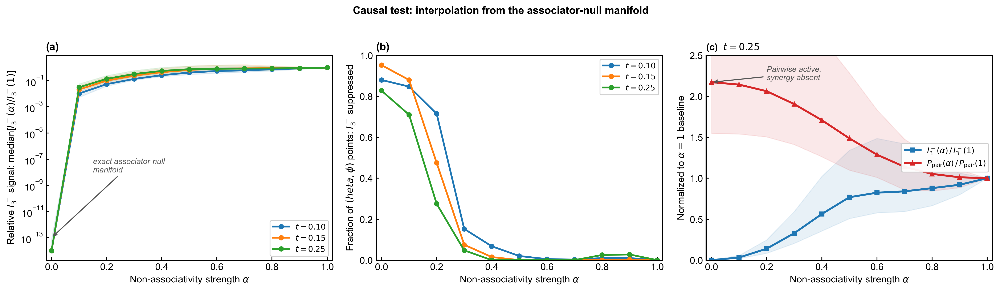

Ablation figure (3-panel) saved.


In [4]:
'''
Ablation Figure (final v2): 3-panel with pairwise contrast
'''
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df_plot = pd.read_csv('./data/ablation_plot.csv')

plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

t_vals = sorted(df_plot.t.unique())
t_colors = ['#1f77b4', '#ff7f0e', '#2ca02c']
t_labels = [f'$t = {t:.2f}$' for t in t_vals]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 4.5))

# --- Panel (a): I3- recovery, log scale ---
for idx, t_val in enumerate(t_vals):
    sub = df_plot[df_plot.t == t_val].sort_values('alpha')
    a = sub.alpha.values
    med = sub.I3_med.values
    q25 = sub.I3_q25.values
    q75 = sub.I3_q75.values
    
    # replace exact zeros with small value for log plot
    med_log = np.where(med > 0, med, 1e-14)
    q25_log = np.where(q25 > 0, q25, 1e-14)
    q75_log = np.where(q75 > 0, q75, 1e-14)
    
    ax1.plot(a, med_log, '-o', color=t_colors[idx], markersize=5,
             linewidth=2.0, label=t_labels[idx])
    ax1.fill_between(a, q25_log, q75_log, color=t_colors[idx], alpha=0.10)

ax1.set_yscale('log')
ax1.set_xlabel(r'Non-associativity strength $\alpha$')
ax1.set_ylabel(r'Relative $I_3^-$ signal: median[$I_3^-(\alpha)/I_3^-(1)$]')
ax1.set_xlim(-0.02, 1.02)
ax1.legend(loc='lower right', fontsize=9, framealpha=0.95, edgecolor='#cccccc')
ax1.annotate('exact associator-null\nmanifold',
             xy=(0, 1e-13), xytext=(0.15, 1e-8),
             fontsize=9, color='#555555', style='italic',
             arrowprops=dict(arrowstyle='->', color='#555555', lw=1.2))
ax1.set_title('(a)', loc='left', fontweight='bold', fontsize=12)

# --- Panel (b): fraction suppressed ---
for idx, t_val in enumerate(t_vals):
    sub = df_plot[df_plot.t == t_val].sort_values('alpha')
    ax2.plot(sub.alpha, sub.frac_pairwise_active_HOI_suppressed,
             '-o', color=t_colors[idx], markersize=5, linewidth=2.0,
             label=t_labels[idx])

ax2.set_xlabel(r'Non-associativity strength $\alpha$')
ax2.set_ylabel('Fraction of $(\theta,\\phi)$ points: $I_3^-$ suppressed')
ax2.set_xlim(-0.02, 1.02)
ax2.set_ylim(0, 1.0)
ax2.legend(loc='upper right', fontsize=9, framealpha=0.95, edgecolor='#cccccc')
ax2.set_title('(b)', loc='left', fontweight='bold', fontsize=12)

# --- Panel (c): I3- vs P_pair, both normalized, t=0.25 only ---
sub_025 = df_plot[abs(df_plot.t - 0.25) < 0.001].sort_values('alpha')
a = sub_025.alpha.values

ax3.plot(a, sub_025.I3_med, '-s', color='#1f77b4', markersize=5,
         linewidth=2.2, label=r'$I_3^-(\alpha)\,/\,I_3^-(1)$')
ax3.fill_between(a, sub_025.I3_q25, sub_025.I3_q75,
                 color='#1f77b4', alpha=0.10)

ax3.plot(a, sub_025.P_med, '-^', color='#d62728', markersize=5,
         linewidth=2.2, label=r'$P_{\mathrm{pair}}(\alpha)\,/\,P_{\mathrm{pair}}(1)$')
ax3.fill_between(a, sub_025.P_q25, sub_025.P_q75,
                 color='#d62728', alpha=0.10)

ax3.set_xlabel(r'Non-associativity strength $\alpha$')
ax3.set_ylabel(r'Normalized to $\alpha = 1$ baseline')
ax3.set_xlim(-0.02, 1.02)
ax3.set_ylim(0, 2.5)
ax3.legend(loc='center right', fontsize=9, framealpha=0.95, edgecolor='#cccccc')
ax3.set_title('(c)  $t = 0.25$', loc='left', fontweight='bold', fontsize=11)

# key annotation
ax3.annotate('Pairwise active,\nsynergy absent',
             xy=(0, sub_025.P_med.values[0]),
             xytext=(0.20, 2.2),
             fontsize=9, color='#555555', style='italic',
             arrowprops=dict(arrowstyle='->', color='#555555', lw=1.2))

fig.suptitle('Causal test: interpolation from the associator-null manifold',
             fontsize=12, fontweight='bold', y=1.02)
fig.tight_layout()
plt.savefig('FigX_ablation_3panel.png', dpi=300, bbox_inches='tight')
plt.savefig('FigX_ablation_3panel.pdf', bbox_inches='tight')
plt.show()
print("Ablation figure (3-panel) saved.")

In [85]:
'''
Cell W — Two-layer recovery figure (complete, self-contained)
Data source: ablation_scan_4q.csv
Constructs mech_df from raw ablation scan, then plots recovery curves.
'''
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# =========================================================
# Step 1: Load raw ablation data and build mech_df
# =========================================================
ablation_scan_df = pd.read_csv('ablation_scan_4q.csv')

def safe_div_series(num, den, eps=1e-15):
    return num / den.where(den.abs() > eps, np.nan)

mech_rows = []
for (t_now, alpha), sub in ablation_scan_df.groupby(['t', 'alpha']):
    # get the alpha=1 baseline for this time slice
    baseline = ablation_scan_df[
        (ablation_scan_df.t == t_now) & (abs(ablation_scan_df.alpha - 1.0) < 0.001)
    ]
    
    if len(baseline) == 0:
        continue
    
    # merge on (theta, phi) to get pointwise ratios
    merged = sub.merge(
        baseline[['theta', 'phi', 'J_tot', 'J_rho_exp', 'I3_minus']].rename(
            columns={'J_tot': 'Jtot_ref', 'J_rho_exp': 'Jrho_ref', 'I3_minus': 'I3_ref'}
        ),
        on=['theta', 'phi'],
        how='inner'
    )
    
    # pointwise ratios (relative to alpha=1)
    Jtot_ratio = np.where(merged.Jtot_ref > 1e-15, merged.J_tot / merged.Jtot_ref, np.nan)
    Jrho_ratio = np.where(merged.Jrho_ref > 1e-15, merged.J_rho_exp / merged.Jrho_ref, np.nan)
    I3_ratio = np.where(merged.I3_ref > 1e-15, merged.I3_minus / merged.I3_ref, np.nan)
    
    mech_rows.append({
        't': float(t_now),
        'alpha': float(alpha),
        'Jtot_med': float(np.nanmedian(Jtot_ratio)),
        'Jtot_q25': float(np.nanpercentile(Jtot_ratio, 25)),
        'Jtot_q75': float(np.nanpercentile(Jtot_ratio, 75)),
        'Jrho_med': float(np.nanmedian(Jrho_ratio)),
        'Jrho_q25': float(np.nanpercentile(Jrho_ratio, 25)),
        'Jrho_q75': float(np.nanpercentile(Jrho_ratio, 75)),
        'I3_med': float(np.nanmedian(I3_ratio)),
        'I3_q25': float(np.nanpercentile(I3_ratio, 25)),
        'I3_q75': float(np.nanpercentile(I3_ratio, 75)),
    })

mech_df = pd.DataFrame(mech_rows).sort_values(['t', 'alpha']).reset_index(drop=True)
print(f"mech_df built: {len(mech_df)} rows, t values: {sorted(mech_df.t.unique())}")

mech_df built: 33 rows, t values: [np.float64(0.1), np.float64(0.15), np.float64(0.25)]


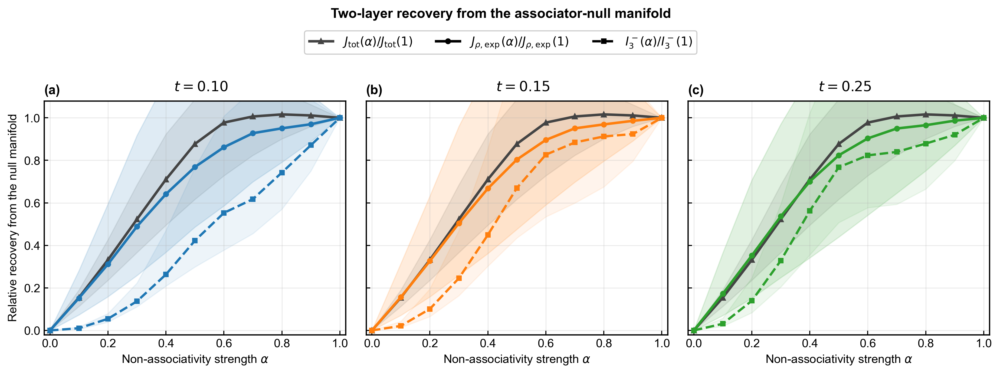

Saved: Fig_recovery_refined_v2.png / .pdf


In [86]:
# =========================================================
# Step 2: Plot
# =========================================================
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 10.5,
    'axes.linewidth': 1.1,
    'xtick.major.width': 0.9,
    'ytick.major.width': 0.9,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'figure.dpi': 300,
})

t_vals = sorted(mech_df["t"].unique())
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#9467bd']
color_map = {t: colors[i] for i, t in enumerate(t_vals)}

fig, axes = plt.subplots(1, len(t_vals), figsize=(4.15 * len(t_vals), 4.15), sharey=True)
if len(t_vals) == 1:
    axes = [axes]

panel_labels = ['(a)', '(b)', '(c)', '(d)']

for ax, t_now, p_lab in zip(axes, t_vals, panel_labels):
    sub = mech_df[mech_df["t"] == t_now].sort_values("alpha")
    x = sub["alpha"].to_numpy()

    # J_tot (dark gray)
    ax.plot(x, sub["Jtot_med"], color='#444444', lw=2.25, marker='^', ms=4.2)
    ax.fill_between(x, sub["Jtot_q25"], sub["Jtot_q75"], color='#444444', alpha=0.10)

    # J_rho_exp (colored solid)
    ax.plot(x, sub["Jrho_med"], color=color_map[t_now], lw=2.25, marker='o', ms=4.2)
    ax.fill_between(x, sub["Jrho_q25"], sub["Jrho_q75"], color=color_map[t_now], alpha=0.14)

    # I3 (colored dashed)
    ax.plot(x, sub["I3_med"], color=color_map[t_now], lw=2.05, linestyle='--', marker='s', ms=3.8)
    ax.fill_between(x, sub["I3_q25"], sub["I3_q75"], color=color_map[t_now], alpha=0.08)

    ax.set_xlim(-0.02, 1.02)
    ax.set_ylim(-0.02, 1.08)
    ax.grid(alpha=0.25)
    ax.set_xlabel(r'Non-associativity strength $\alpha$')
    ax.set_title(p_lab, loc='left', fontweight='bold', fontsize=11.5)
    ax.text(0.52, 1.03, fr'$t={t_now:.2f}$',
            transform=ax.transAxes, ha='center', va='bottom',
            fontsize=12.5, style='italic')

axes[0].set_ylabel('Relative recovery from the null manifold')

# shared legend
handles = [
    Line2D([0], [0], color='#444444', lw=2.25, marker='^', ms=4.2,
           label=r'$J_{\mathrm{tot}}(\alpha)/J_{\mathrm{tot}}(1)$'),
    Line2D([0], [0], color='black', lw=2.25, marker='o', ms=4.2,
           label=r'$J_{\rho,\exp}(\alpha)/J_{\rho,\exp}(1)$'),
    Line2D([0], [0], color='black', lw=2.05, linestyle='--', marker='s', ms=3.8,
           label=r'$I_3^-(\alpha)/I_3^-(1)$'),
]

fig.legend(handles=handles, loc='upper center', ncol=3,
           framealpha=0.95, bbox_to_anchor=(0.5, 1.05))
fig.suptitle('Two-layer recovery from the associator-null manifold',
             fontsize=12.0, fontweight='bold', y=1.10)

plt.tight_layout()
plt.savefig('Fig_recovery_refined_v2.png', dpi=300, bbox_inches='tight')
plt.savefig('Fig_recovery_refined_v2.pdf', bbox_inches='tight')
plt.show()
print("Saved: Fig_recovery_refined_v2.png / .pdf")